<p style="font-size:30px">Predicting attitudes towards climate change</p>

# Introduction

<b> Context </b>
Rumour has it that in The Netherlands, attitudes on seemingly unrelated topics are grouped. They say - for example - that climate change-sceptiscim clusters together with Covid19-denial, and with being less open to immigrants. I'm curious to find out if there is a truth in this. Analyzing the European Social Survey of 2016 can shed some light on this.  

<b> Objective </b>
In this notebook, I will use a machine learning model to try to predict to what degree someone thinks climate change is real. In the previous project (project 5) I already did some cleaning, wrangling and investigation using machine learning models. The tree-based model XGBoost gave the best results. In this project I'll continue the search and see if I can tune this model and what parameters are most predictive for someones opinion on climate change. 

<b>The data</b>
The data belongs to the European Social Survey (2016). The European Social Survey is an multi-country survey that aims to unravel public opinions on different topics. All editions have recurring questions concerning public attitudes and values towards eg media, social trust and politics. On top of that, each edition has an extra topic. In 2016 they researched public attitudes to climate change, energy security and energy preferences. See the data folder for more information about the Survey and the data. 


<b> Approach </b>
I will use the csv in which the NaNs are filled and no rows or columns are lost. I will compile a deep learning model, leaving the climate- and energy- related questions out of the X-variables. 

In [1]:
#load packages

#general
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline


#preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.multiclass import type_of_target
from imblearn import under_sampling #import RandomUnderSampler


#tree based model: XGBoost
import xgboost as xgb
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from xgboost import plot_importance

#tree based model: Lightgbm
import lightgbm as lgb

#optimization
import hyperopt
from hyperopt import hp, Trials, fmin, tpe, STATUS_OK

In [2]:
#set Notebook theme/layout
plt.style.use("fast")
sns.set_theme(style="white", context="notebook", palette="husl")
sns.set_context("notebook", rc={"font.size":12,"axes.titlesize":18,"axes.labelsize":12})

In [3]:
#make sure you can read and see the data
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

In [4]:
#load dataset
data = pd.read_csv('./data/climate_full_fill.csv')
metadata = pd.read_csv('./data/metadata.csv')

# Cleaning

This is a summary of the <b>cleaning that's performed</b> on the dataset (climate_full_fill), details about how and why are in project 5. 

<b>1: String columns </b>
<ul>
    <li> Approach: encoded using [labelencoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html) for as far as they are NOT ordinal (not: bad, oke, perfect). For categorical strings (if any are present), use [OneHotEncoder or OrdinalEncoder](https://stackoverflow.com/questions/61217713/labelencoder-for-categorical-features/61217936#61217936)</li>
    <li>Note: do not apply MinMaxScaler on top of this.</li>
    <li> ALL DATA (test and train) before splitting</li>
</ul>

<b>2: Wide range of values</b><br>
<ul>
    <li> ISCO08 and ISCO08p </li>
    <ul>
        <li>This is in fact a label already, but with the unfortunate range from: 0,10,100,110,200,210,300,310, 1000-9629</li>
        <li>Approach: Label-encoded to tighten the range</li>
        <li>Note: do not apply MinMaxScaler on top of this.</li>
        <li>ALL DATA (test and train) before splitting</li>
    </ul>
    <li> ANCESTRY (anctry1 / 2)</li>
    <ul>
        <li> The ecoding is always 5 digits long, and even 6 when the response is a "no answer"-kind</li>
        <li> Approach: use LabelEncoder to tighten the range</li>
        <li> Note: do not apply MinMaxScaler on top of this</li>
        <li> ALL DATA (test and train).</li>
    </ul>
    <li> EDUCATION and RELIGION</li>
    <ul>
        <li> Each country has their own education and religion columns. On top of that there are "converted" columns, where the education/religion of different countries are encoded in the same manner in one column. </li>
        <li> Approach: use the columns that are already "converted" by the researchers and delete the country-specific ones.</li>
    </ul>
</ul>

<b>3: No answer</b>
<ul>
    <li>Could potentially affect all columns in the dataframe, categorical and continuous alike </li>
    <ul>
        <li>Examples of "No Answer"-like responses:</li>
        <ul>
            <li>55/5555: other</li>
            <li>66/6666: not applicable</li>
            <li>7/77/7777: refusal </li>
            <li>8/88/8888: Don’t know</li>
            <li>9/99/9999: No answer</li>
        </ul>
    </ul>
    <li>Is in fact a category (see encoding below)
    <li>Approach: check for these double (or more) digits and replace them by 0.{specific digit}. Note, do this after the encoding of the ISCO08(b) columns.</li>
    <li>ALL DATA (test and train), before splitting</li>
</ul>

In [5]:
data.head()

,Unnamed: 0,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgdnbat,rlgdnbe,rlgdnach,rlgdnade,rlgdnafi,rlgdngb,rlgdnhu,rlgdnie,rlgdnis,rlgdnlt,rlgdnnl,rlgdnno,rlgdnapl,rlgdnase,rlgblge,rlgdnme,rlgdebat,rlgdebe,rlgdeach,rlgdeade,rlgdeafi,rlgdegb,rlgdehu,rlgdeie,rlgdeis,rlgdelt,rlgdenl,rlgdeno,rlgdeapl,rlgdease,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edlveat,edlvebe,edlvdch,edlvdcz,edubde1,eduade2,eduade3,edlvdee,edlvges,edlvdfi,edlvdfr,edubgb1,eduagb2,edagegb,edlvdhu,edlvdie,edubil1,eduail2,edlvdis,edlvdit,edlvdlt,edlvenl,edlvdno,edlvepl,edupl2,edlvdpt,edlvdru,edlvdse,edlvesi,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,edlvpeat,edlvpebe,edlvpdch,edlvpdcz,edupbde1,edupade2,edupade3,edlvpdee,edlvpfes,edlvpdfi,edlvpdfr,edupbgb1,edupagb2,edagepgb,edlvpdhu,edlvpdie,edupbil1,edupail2,edlvpdis,edlvpdit,edlvpdlt,edlvpenl,edlvpdno,edlvpepl,eduppl2,edlvpdpt,edlvpdru,edlvpdse,edlvpesi,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,edlvfeat,edlvfebe,edlvfdch,edlvfdcz,edufbde1,edufade2,edufade3,edlvfdee,edlvffes,edlvfdfi,edlvfdfr,edufbgb1,edufagb2,edagefgb,edlvfdhu,edlvfdie,edufbil1,edufail2,edlvfdis,edlvfdit,edlvfdlt,edlvfenl,edlvfdno,edlvfepl,edlvfdpt,edlvfdru,edlvfdse,edlvfesi,emprf14,occf14b,edulvlmb,eiscedm,edlvmeat,edlvmebe,edlvmdch,edlvmdcz,edumbde1,edumade2,edumade3,edlvmdee,edlvmfes,edlvmdfi,edlvmdfr,edumbgb1,edumagb2,edagemgb,edlvmdhu,edlvmdie,edumbil1,edumail2,edlvmdis,edlvmdit,edlvmdlt,edlvmenl,edlvmdno,edlvmepl,edlvmdpt,edlvmdru,edlvmdse,edlvmesi,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ips

In [6]:
#cut non-informative columns out of the dataframe
i = [*range(-15, 0), 0]
data = data.drop(data.columns[i], axis=1)
data.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgdnbat,rlgdnbe,rlgdnach,rlgdnade,rlgdnafi,rlgdngb,rlgdnhu,rlgdnie,rlgdnis,rlgdnlt,rlgdnnl,rlgdnno,rlgdnapl,rlgdnase,rlgblge,rlgdnme,rlgdebat,rlgdebe,rlgdeach,rlgdeade,rlgdeafi,rlgdegb,rlgdehu,rlgdeie,rlgdeis,rlgdelt,rlgdenl,rlgdeno,rlgdeapl,rlgdease,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edlveat,edlvebe,edlvdch,edlvdcz,edubde1,eduade2,eduade3,edlvdee,edlvges,edlvdfi,edlvdfr,edubgb1,eduagb2,edagegb,edlvdhu,edlvdie,edubil1,eduail2,edlvdis,edlvdit,edlvdlt,edlvenl,edlvdno,edlvepl,edupl2,edlvdpt,edlvdru,edlvdse,edlvesi,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,edlvpeat,edlvpebe,edlvpdch,edlvpdcz,edupbde1,edupade2,edupade3,edlvpdee,edlvpfes,edlvpdfi,edlvpdfr,edupbgb1,edupagb2,edagepgb,edlvpdhu,edlvpdie,edupbil1,edupail2,edlvpdis,edlvpdit,edlvpdlt,edlvpenl,edlvpdno,edlvpepl,eduppl2,edlvpdpt,edlvpdru,edlvpdse,edlvpesi,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,edlvfeat,edlvfebe,edlvfdch,edlvfdcz,edufbde1,edufade2,edufade3,edlvfdee,edlvffes,edlvfdfi,edlvfdfr,edufbgb1,edufagb2,edagefgb,edlvfdhu,edlvfdie,edufbil1,edufail2,edlvfdis,edlvfdit,edlvfdlt,edlvfenl,edlvfdno,edlvfepl,edlvfdpt,edlvfdru,edlvfdse,edlvfesi,emprf14,occf14b,edulvlmb,eiscedm,edlvmeat,edlvmebe,edlvmdch,edlvmdcz,edumbde1,edumade2,edumade3,edlvmdee,edlvmfes,edlvmdfi,edlvmdfr,edumbgb1,edumagb2,edagemgb,edlvmdhu,edlvmdie,edumbil1,edumail2,edlvmdis,edlvmdit,edlvmdlt,edlvmenl,edlvmdno,edlvmepl,edlvmdpt,edlvmdru,edlvmdse,edlvmesi,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsaf

In [7]:
#DELETE UNWANTED EDUCATION AND RELIGION COLUMNS
#select unwanted columns using the descriptions in de metadata
rows_edu = metadata[(metadata["full_text"].str.contains("education,", regex=False)) & (~metadata["full_text"].str.contains("ES - ISCED", regex=False))]
rows_rel = metadata[(metadata["full_text"].str.contains("belonging to at present,", regex=False)) | (metadata["full_text"].str.contains("belonging to in the past,", regex=False))]

#select the column-names (shorthands)
col_names = list(rows_edu["shorthand"])
col_names.extend(rows_rel["shorthand"].tolist())

#cut the columns out of the dataframe
data = data.drop(col_names, axis=1)

In [8]:
#REPLACE EXTREME VALUES
data[["edulvlb", "edulvlfb", "edulvlmb", "edulvlpb"]] = data[["edulvlb", "edulvlfb", "edulvlmb", "edulvlpb"]].replace(to_replace = 5555, value = 0.5) 
data[["anctry1", "anctry2"]] = data[["anctry1", "anctry2"]].replace(to_replace = 444444, value = 0.4) 

In [9]:
# DROP YearBorn column
data = data.drop("yrbrn", axis=1)

In [10]:
print(len(data))
data.head()

44387


,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
0,AT,120.0,4.0,180.00000,8.0,8.0,3.0,1.0,2.0,2.0,2.0,3.0,6.0,7.0,0.0,2.0,8.0,9.0,10.0,3.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,2.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.0,5.0,4.0,4.0,6.0,3.0,5.0,1.0,5.0,1.0,5.0,1.0,5.0,1.00000,1.00000,1.00000,10.0,10.0,10.0,5.0,6.0,3.0,3.0,2.0,2.0,3.0,3.0,5.0,7.0,2.00000,0.12345,2.00000,0.12345,0.0,7.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,DE,2.0,DE,2010.00000,GER,ZZ,2.0,2.0,DE,2.0,DE,1.0,5.0,1.0,8.0,4.0,10.0,5.0,5.0,1.0,5.0,1.0,1.0,1.0,2.0,3.0,4.0,4.0,2.0,2.0,2.0,3.0,1.0,0.12345,4.0,4.0,8.0,4.0,10.0,10.0,0.0,0.0,0.0,1.0,1.0,2.0,5.0,1.0,2.0,6.0,3.0,10.0,10.0,10.0,5.0,1.0,1.0,5.0,5.0,5.0,1.0,5.0,3.0,5.0,4.0,0.12345,0.12345,0.12345,0.

In [11]:
# there is one float in the fbrncntb column that gives errors in the LabelEncoding, convert the float to string: "ZZ"
data.loc[10133, "fbrncntb"] = "ZZ"

## data and data_worried

I'll create two dataframes: one where the central question is "Do you think climate change is real",  and ons for "how worried are you about climate change". Rows that have empty values for the central question are dropped.

In [12]:
# dropping the individual rows where that have no answer to the climate change question (which were filled with 0.12345)
# reset the index
data_worried = data[data.wrclmch != 0.12345].reset_index(drop=True) 
data = data[data.clmchng != 0.12345].reset_index(drop=True) 

In [13]:
# check
print(len(data))
data.tail()

43289


,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
43284,SI,90.0,2.0,0.12345,1.0,2.0,1.0,2.0,1.0,4.0,1.0,4.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,8.00000,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,8.00000,3.00000,1.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,2.0,5.0,3.0,3.0,4.0,0.0,1.0,0.0,5.0,4.0,6.0,2.0,2.0,2.0,3.0,3.0,1.0,0.0,1.0,1.00000,0.12345,0.12345,1.0,6.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,SLV,ZZ,2.0,1.0,ZZ,1.0,ZZ,5.0,1.0,5.0,10.0,5.0,10.0,5.0,4.0,5.0,4.0,1.0,1.0,2.0,3.0,5.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,0.12345,3.0,3.0,5.0,3.0,5.0,5.0,5.0,3.0,1.0,3.0,1.0,1.0,5.0,2.0,5.0,0.0,3.0,10.0,5.0,10.0,2.0,4.0,4.0,5.0,2.0,2.0,5.0,1.0,2.0,1.0,4.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.

In [14]:
print(len(data_worried))

42654


## Less countries
Having all countries in the dataframe does not seem to work. Create dataframe with less countries, to see if this would help the algorithm to find patterns.

### NL and RU

In [15]:
#Netherlands and Russia
data_NL_RU = data.loc[data['cntry'].isin(["NL", "RU"])]
data_NL_RU.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
32080,NL,30.0,5.0,240.0,9.0,8.0,8.0,2.0,3.0,3.0,2.0,3.0,7.0,9.0,8.0,7.0,8.0,7.0,8.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,6.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,6.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,3.00000,6.00000,9.0,8.0,6.0,8.0,8.0,7.0,1.0,5.0,1.0,5.0,1.0,6.0,1.0,1.0,2.0,7.0,8.0,8.0,9.0,7.0,5.0,3.0,1.0,2.0,1.0,3.0,9.0,7.0,2.0,0.12345,2.00000,0.12345,3.0,7.0,7.00000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,DUT,ZZ,2.0,1.0,ZZ,1.0,ZZ,2.0,5.0,2.0,8.0,5.0,10.0,5.0,5.0,1.0,5.0,1.0,1.0,1.0,1.0,2.0,2.0,4.0,1.0,1.0,1.0,1.0,1.0,0.12345,4.0,4.0,8.0,4.0,1.0,9.00000,3.0,6.0,3.0,1.0,2.0,2.0,3.0,3.0,4.0,8.0,6.0,7.0,8.0,8.0,5.0,1.0,1.0,5.0,4.0,2.0,4.0,4.0,2.00000,3.0,2.0,0.12345,0.12345,0.12345,2.00000,1.00000,3.00000

In [16]:
# check
print(data_NL_RU["cntry"].unique())

['NL' 'RU']


### NL, DE

In [17]:
data_NL_DE = data.loc[data['cntry'].isin(["NL", "DE"])]
data_NL_DE.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
7440,DE,3.0,5.0,1080.00000,8.0,5.0,8.0,3.0,2.0,2.0,2.0,3.0,3.0,4.0,6.0,1.0,1.0,7.0,8.0,1.0,0.12345,0.12345,0.12345,0.12345,2.0,5.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,2.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.00000,2.0,9.0,6.0,3.0,2.0,1.0,6.0,3.0,3.0,2.0,5.0,1.0,7.0,2.0,3.0,3.0,8.0,7.0,10.0,10.0,5.0,5.0,2.0,2.0,2.0,2.0,3.0,10.0,9.0,1.0,2.0,0.12345,0.12345,1.0,6.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,GER,ZZ,2.0,1.0,ZZ,1.0,ZZ,1.0,2.0,2.0,10.0,3.0,8.0,4.0,2.0,4.0,5.0,1.0,1.0,4.0,2.0,2.0,3.0,4.0,3.0,2.0,1.0,5.0,2.0,0.12345,3.0,4.0,7.0,4.0,4.0,4.0,5.0,5.0,5.0,3.0,2.0,3.0,4.0,2.0,11.0,5.0,5.0,6.0,5.0,8.0,5.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,5.0,2.0,3.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,4.00000,3.00000,

In [18]:
# check
print(data_NL_DE["cntry"].unique())

['DE' 'NL']


### Five WE countries

In [19]:
data_5cntry = data.loc[data['cntry'].isin(["NL", "DE", "FR", "GB", "BE"])]
data_5cntry["cntry"].unique()

array(['BE', 'DE', 'FR', 'GB', 'NL'], dtype=object)

# Preprocessing

## LabelEncoder
Some columns need to be encoded - more details about this in project 5

In [20]:
#LABEL ENCODER
obj = data.select_dtypes(include="object")
obj_cols = list(obj.columns)

#add the isco08 columns, they also need to be encoded
obj_cols.append("isco08")
obj_cols.append("isco08p")

data[obj_cols] = data[obj_cols].apply(LabelEncoder().fit_transform) 

print(data[obj_cols].max()) #see how many unique values there are. 

data[obj_cols].head()

cntry        22
ctzshipc    121
cntbrthc    158
lnghom1     121
lnghom2     140
fbrncntb    161
mbrncntb    159
region      274
isco08      589
isco08p     520
dtype: int64


,cntry,ctzshipc,cntbrthc,lnghom1,lnghom2,fbrncntb,mbrncntb,region,isco08,isco08p
0,0,32,40,41,140,40,41,2,102,1
1,0,32,40,41,140,40,41,2,159,104
2,0,121,158,41,140,161,159,5,350,1
3,0,121,158,41,140,161,159,2,589,1
4,0,112,142,108,51,146,144,4,280,1


In [21]:
#LABEL ENCODER
obj = data_worried.select_dtypes(include="object")
obj_cols = list(obj.columns)

#add the isco08 columns, they also need to be encoded
obj_cols.append("isco08")
obj_cols.append("isco08p")

data_worried[obj_cols] = data_worried[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_worried[obj_cols].max()) #see how many unique values there are. 

data_worried[obj_cols].head()

cntry        22
ctzshipc    120
cntbrthc    157
lnghom1     120
lnghom2     140
fbrncntb    161
mbrncntb    158
region      274
isco08      589
isco08p     519
dtype: int64


,cntry,ctzshipc,cntbrthc,lnghom1,lnghom2,fbrncntb,mbrncntb,region,isco08,isco08p
0,0,31,40,39,140,40,41,2,102,1
1,0,31,40,39,140,40,41,2,159,104
2,0,120,157,39,140,161,158,5,350,1
3,0,120,157,39,140,161,158,2,589,1
4,0,111,141,108,50,146,143,4,280,1


In [22]:
data_NL_RU[obj_cols] = data_NL_RU[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_NL_RU[obj_cols].max()) 
print(data_NL_RU[obj_cols].head())

cntry         1
ctzshipc     31
cntbrthc     63
lnghom1      41
lnghom2      41
fbrncntb     66
mbrncntb     66
region       19
isco08      349
isco08p     259
dtype: int64
       cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  \
32080      0        31        63        9       41        66        66   
32081      0        31        63       35       41        58        59   
32082      0         9        20        9       13        16        19   
32083      0        31        63        9       41        66        66   
32084      0        31        63        9       41        66        66   

       region  isco08  isco08p  
32080       7      76       43  
32081       7       1        0  
32082       7     141        0  
32083       7     219        0  
32084       7     210        0  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [23]:
data_NL_RU.tail()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
40444,1,90.0,1.0,0.12345,0.0,4.0,0.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,0.0,0.0,2.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,7.0,4.0,6.0,7.0,4.0,0.0,2.0,4.0,4.0,1.0,4.0,0.00000,2.0,2.0,3.0,3.0,3.0,3.0,7.0,4.0,3.0,3.0,1.0,2.0,3.0,3.0,0.0,0.0,2.0,0.12345,2.0,0.12345,0.0,7.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,31,2.0,57,1992.00000,27,41,2.0,2.00000,60,2.0,61,1.0,3.0,1.0,9.0,2.0,0.0,4.0,4.0,2.0,1.0,1.0,1.0,5.0,2.0,5.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,1.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,5.0,3.0,4.0,2.0,2.0,7.0,0.0,5.0,9.0,5.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,1.0,1.0,1.0,4.00000,4.00000,4

In [24]:
data_NL_DE[obj_cols] = data_NL_DE[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_NL_DE[obj_cols].max())  
print(data_NL_DE[obj_cols].head())

cntry         1
ctzshipc     59
cntbrthc     89
lnghom1      44
lnghom2      48
fbrncntb     87
mbrncntb     95
region       27
isco08      399
isco08p     332
dtype: int64
      cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  region  \
7440      0        59        89       14       48        87        95      14   
7441      0        59        89       14       48        87        95      14   
7442      0        59        89       14       48        87        95      14   
7443      0        59        89       14       48        87        95      14   
7444      0        59        20       14       48        41        95      14   

      isco08  isco08p  
7440     227        0  
7441     197      209  
7442      57      181  
7443     360      302  
7444       8      134  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [25]:
data_5cntry[obj_cols] = data_5cntry[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_5cntry[obj_cols].max())  
print(data_5cntry[obj_cols].head())

cntry         4
ctzshipc     86
cntbrthc    125
lnghom1      69
lnghom2      89
fbrncntb    127
mbrncntb    129
region       71
isco08      587
isco08p     409
dtype: int64
      cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  region  \
1962      0        86       125       16       73       127       129       5   
1963      0        86       125       16       89       127       129       5   
1964      0        86       125       16       89       127       129       5   
1965      0        86       125       16       89       127       129       5   
1966      0        86       125       16       89       127       129       5   

      isco08  isco08p  
1962     280      331  
1963     542        0  
1964     501        0  
1965     542      300  
1966     276      386  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


## Isolate target (y) from predictors (X)
The column I want to predict should not be scaled. This is the columns: <br>
<b>"Do you think world's climate is changing"</b><br>
Variable name: clmchng<br>

Meaning of the outcomes:<br>
1 = Definitely changing	<br>
2 = Probably changing<br>
3 = Probably not changing<br>
4 =	Definitely not changing	<br><br>
7 =	Refusal<br>
8 =	Don't know<br>
9 =	No answer<br>

Isolate this column from the rest of the dataset, and see whether the data is unbalanced and undersampling of certain categories is needed.

In [26]:
#set X (predictors) and y (target)
X = data.drop("clmchng", axis=1)
y = data["clmchng"]

X_NL_RU = data_NL_RU.drop("clmchng", axis=1)
y_NL_RU = data_NL_RU["clmchng"]

X_NL_DE = data_NL_DE.drop("clmchng", axis=1)
y_NL_DE = data_NL_DE["clmchng"]

X_5cntry = data_5cntry.drop("clmchng", axis=1)
y_5cntry =data_5cntry["clmchng"]

In [27]:
#check
print(len(X.columns), len(X), len(y))
print(len(X_NL_RU.columns), len(X_NL_RU), len(y_NL_RU))
print(len(X_NL_DE.columns), len(X_NL_DE), len(y_NL_DE))
print(len(X_5cntry.columns), len(X_5cntry), len(y_5cntry))

373 43289 43289
373 3933 3933
373 4508 4508
373 10269 10269


## Create different versions of X

### X_scaled
Some of the features (columns) are already processed using the LabelEncoder, these should not also be subject to the MinMaxScaler. Therefore first 'deselect' those columns from X and then re-joining them.

In [28]:
encoded_cols = ['cntry', 'ctzshipc', 'cntbrthc', 'lnghom1', 'lnghom2', 'fbrncntb', 'mbrncntb', 'region', "isco08","isco08p", "anctry1","anctry2"]
X_to_scale = X.drop(encoded_cols, axis=1)
X_dont_scale = X[encoded_cols]

In [29]:
cols_scale = list(X_to_scale.columns)
print(cols_scale)

['nwspol', 'netusoft', 'netustm', 'ppltrst', 'pplfair', 'pplhlp', 'polintr', 'psppsgva', 'actrolga', 'psppipla', 'cptppola', 'trstprl', 'trstlgl', 'trstplc', 'trstplt', 'trstprt', 'trstep', 'trstun', 'vote', 'prtvtbat', 'prtvtcbe', 'prtvtfch', 'prtvtdcz', 'prtvede1', 'prtvede2', 'prtvtfee', 'prtvtdes', 'prtvtdfi', 'prtvtcfr', 'prtvtbgb', 'prtvtehu', 'prtvtbie', 'prtvtcil', 'prtvtbis', 'prtvtbit', 'prtvblt1', 'prtvblt2', 'prtvblt3', 'prtvtfnl', 'prtvtbno', 'prtvtdpl', 'prtvtcpt', 'prtvtdru', 'prtvtbse', 'prtvtesi', 'contplt', 'wrkprty', 'wrkorg', 'badge', 'sgnptit', 'pbldmn', 'bctprd', 'pstplonl', 'clsprty', 'prtclcat', 'prtclcbe', 'prtclfch', 'prtcldcz', 'prtclede', 'prtclfee', 'prtclees', 'prtcldfi', 'prtclefr', 'prtclbgb', 'prtclfhu', 'prtcldie', 'prtcldil', 'prtclbis', 'prtclcit', 'prtclblt', 'prtclenl', 'prtclbno', 'prtclgpl', 'prtclept', 'prtcldru', 'prtclbse', 'prtclesi', 'prtdgcl', 'lrscale', 'stflife', 'stfeco', 'stfgov', 'stfdem', 'stfedu', 'stfhlth', 'gincdif', 'mnrgtjb', 'fr

In [30]:
#create array to feed to MinMaxScaler (normalization)
X_to_scale = X_to_scale.to_numpy()

In [31]:
scaler = MinMaxScaler(feature_range=(0,10))
scaled_array = scaler.fit(X_to_scale)
scaled_array2 = scaler.transform(X_to_scale)
scaled_df = pd.DataFrame(scaled_array2, columns=cols_scale)

In [32]:
scaled_df.head() #check

,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,brncntr,livecnta,blgetmg,facntr,mocntr,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,regunit,intewde
0,0.840336,7.94937,1.250000,8.0,8.0,3.0,2.261160,3.84811,3.84811,3.84811,5.89874,6.0,7.0,0.0,2.0,8.0,9.0,10.0,10.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.000000,10.000000,10.000000,4.671072,4.671072,10.0,4.671072,4.671072,10.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,5.0,4.0,4.0,6.0,3.0,5.0,1.79748,10.00000,1.79748,10.00000,1.79748,5.0,2.261160,2.261160,2.261160,10.0,10.0,10.0,5.0,8.545782,5.000000,5.89874,10.0,4.840773,5.89874,10.0,5.0,7.0,10.000000,0.000000,10.000000,0.00000,0.0,10.000000,10.000000,4.671072,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,10.000000,10.000000,9.965293,10.000000,10.000000,10.000000,1.79748,10.00000,1.79748,8.0,0.706413,10.0,0.888640,0.888640,0.159731,0.888640,0.159731,0.159731,0.159731,3.84811,5.89874,7.94937,7.94937,3.84811,3.84811,3.84811,5.89874,0.0,7.94937,0.706413,8.0,7.94937,10.0,10.0,0.0,0.0,0.0,1.79748,1.79748,3.84811,10.00000,1.79748,1.725317,6.0,3.0,10.0,10.0,10.0,10.00000,1.79748,1.79748,10.00000,10.00000,10.00000,1.79748,10.00000,5.89874,10.00000,10.00000

In [33]:
scaled_df.min().sort_values(ascending=True) #double check

nwspol      0.0
rshipa10    0.0
rshipa9     0.0
rshipa8     0.0
rshipa7     0.0
rshipa6     0.0
rshipa5     0.0
rshipa4     0.0
rshipa3     0.0
rshipa11    0.0
rshipa2     0.0
yrbrn11     0.0
yrbrn10     0.0
yrbrn9      0.0
yrbrn8      0.0
yrbrn7      0.0
yrbrn6      0.0
yrbrn5      0.0
yrbrn4      0.0
yrbrn12     0.0
rshipa12    0.0
icpart1     0.0
rshpsts     0.0
edctn       0.0
pdwrk       0.0
eduyrs      0.0
edupl2      0.0
eisced      0.0
edulvlb     0.0
domicil     0.0
chldhhe     0.0
chldhm      0.0
maritalb    0.0
marstgb     0.0
marstfi     0.0
marsts      0.0
iccohbt     0.0
icpart2     0.0
dvrcdeva    0.0
lvgptnea    0.0
rshpsgb     0.0
rshpsfi     0.0
yrbrn3      0.0
uempla      0.0
yrbrn2      0.0
gndr12      0.0
ubspunp     0.0
ubspedu     0.0
ubsppay     0.0
ub20unp     0.0
ub20edu     0.0
ub20pay     0.0
ub50unp     0.0
ub50edu     0.0
bnlwinc     0.0
ub50pay     0.0
ubedu       0.0
ubpay       0.0
admub       0.0
bennent     0.0
lbenent     0.0
uentrjb     0.0
imsclbn 

In [34]:
scaled_df.max().sort_values(ascending=False) #triple check

yrbrn10     10.0
eiscedm     10.0
eiscedf     10.0
elgwind     10.0
elgsun      10.0
elgnuc      10.0
prtvtdru    10.0
yrbrn2      10.0
yrbrn3      10.0
yrbrn4      10.0
yrbrn5      10.0
yrbrn6      10.0
yrbrn7      10.0
elghydr     10.0
elgngas     10.0
yrbrn11     10.0
yrbrn12     10.0
elgcoal     10.0
rdcenr      10.0
nacer2      10.0
eiscedp     10.0
livecnta    10.0
prtclfhu    10.0
ccnthum     10.0
elgbio      10.0
lkuemp      10.0
pray        10.0
eisced      10.0
prtvtehu    10.0
pdjobyr     10.0
vteurmmb    10.0
vteumbgb    10.0
vteubcmb    10.0
prtvtfch    10.0
rlgatnd     10.0
sclmeet     10.0
rlgblge     10.0
dscrdsb     10.0
dscroth     10.0
atcherp     10.0
dscrdk      10.0
atchctr     10.0
dscrref     10.0
rlgblg      10.0
rlgdnm      10.0
dscrsex     10.0
dscretn     10.0
rlgdnme     10.0
rlgdgr      10.0
dscrgnd     10.0
dscrgrp     10.0
dscrrce     10.0
dscrntn     10.0
dscrrlg     10.0
dscrna      10.0
dscrlng     10.0
dscrage     10.0
dscrnap     10.0
intewde     10

In [35]:
# join the two back together
scaled_df = pd.concat([scaled_df, X_dont_scale], axis=1, join="inner")

In [36]:
#check if it went right
print(X.shape)
print(scaled_df.shape)

(43289, 373)
(43289, 373)


In [37]:
scaled_df.dtypes #check

nwspol      float64
netusoft    float64
netustm     float64
ppltrst     float64
pplfair     float64
pplhlp      float64
polintr     float64
psppsgva    float64
actrolga    float64
psppipla    float64
cptppola    float64
trstprl     float64
trstlgl     float64
trstplc     float64
trstplt     float64
trstprt     float64
trstep      float64
trstun      float64
vote        float64
prtvtbat    float64
prtvtcbe    float64
prtvtfch    float64
prtvtdcz    float64
prtvede1    float64
prtvede2    float64
prtvtfee    float64
prtvtdes    float64
prtvtdfi    float64
prtvtcfr    float64
prtvtbgb    float64
prtvtehu    float64
prtvtbie    float64
prtvtcil    float64
prtvtbis    float64
prtvtbit    float64
prtvblt1    float64
prtvblt2    float64
prtvblt3    float64
prtvtfnl    float64
prtvtbno    float64
prtvtdpl    float64
prtvtcpt    float64
prtvtdru    float64
prtvtbse    float64
prtvtesi    float64
contplt     float64
wrkprty     float64
wrkorg      float64
badge       float64
sgnptit     float64


In [38]:
#STORE THE SCALED X VALUES IN VARIABLE X_SCALED
X_scaled = scaled_df

### X_noclimate
Predicting if people believe in climate change using questions about climate change is not that interesting. More interesting to see if you can predict someones attitude towards climate change based on <i>other</i> features. I therefore create a X_noclimate variable.

In [39]:
#isolate climate questions. 
metadata[["shorthand", "full_text"]] #Are located in row 178 till 209

,shorthand,full_text
0,name,Title of dataset
1,essround,ESS round
2,edition,Edition
3,proddate,Production date
4,idno,Respondent's identification number
5,cntry,Country
6,nwspol,"News about politics and current affairs, watching, reading or listening, in minutes"
7,netusoft,"Internet use, how often"
8,netustm,"Internet use, how much time on typical day, in minutes"
9,ppltrst,Most people can be trusted or you can't be too careful


In [40]:
#get the column names
climate_cols = list(metadata.iloc[178:210, 0]) #rows, columns
print(climate_cols)

['eneffap', 'rdcenr', 'cflsenr', 'elgcoal', 'elgngas', 'elghydr', 'elgnuc', 'elgsun', 'elgwind', 'elgbio', 'wrpwrct', 'wrenexp', 'wrdpimp', 'wrdpfos', 'wrntdis', 'wrinspw', 'wrtcfl', 'wrtratc', 'clmchng', 'clmthgt1', 'clmthgt2', 'ccnthum', 'ccrdprs', 'wrclmch', 'ccgdbd', 'lkredcc', 'lklmten', 'gvsrdcc', 'ownrdcc', 'inctxff', 'sbsrnen', 'banhhap']


In [41]:
X_noclimate = data.drop(climate_cols, axis=1) #note, this X is not scaled

X_NL_RU_noclimate = data_NL_RU.drop(climate_cols, axis=1) #note, this X is not scaled
X_NL_DE_noclimate = data_NL_DE.drop(climate_cols, axis=1) #note, this X is not scaled
X_5cntry_noclimate = data_5cntry.drop(climate_cols, axis=1) #note, this X is not scaled

### X_scaled_noclimate
Another option is to use X_scaled without climate.

In [42]:
#will remove the climate columns from X_scaled, target column 'clmchng' is no longer in there. So remove it from the column-list
climate_cols_X = ['eneffap', 'rdcenr', 'cflsenr', 'elgcoal', 'elgngas', 'elghydr', 'elgnuc', 
                       'elgsun', 'elgwind', 'elgbio', 'wrpwrct', 'wrenexp', 'wrdpimp', 'wrdpfos', 
                       'wrntdis', 'wrinspw', 'wrtcfl', 'wrtratc', 'clmthgt1', 'clmthgt2', 
                       'ccnthum', 'ccrdprs', 'wrclmch', 'ccgdbd', 'lkredcc', 'lklmten', 'gvsrdcc', 
                       'ownrdcc', 'inctxff', 'sbsrnen', 'banhhap']

X_scaled_noclimate = X_scaled.drop(climate_cols_X, axis=1) #note, this X is scaled!

### X_"countries"
Another approach to simplify things is to select smaller subsets of countries instead of all 22 at the same time. I'll go for two very different ones (NL_RU), two that might be similar (NL_DE), and a couple that might be similar (NL_DE_GB_FR_BE). 
Downside: the samplesize gets a lot smaller, which makes predictions more difficult.

As rows need to be deleted (not columns) these X's are created befores splitting X from y. You'll find them in the paragraph: "isolate target(y) from predictors (X). <br>

Names:

X_NL_RU<br>
X_NL_DE<br>
X_5cntry<br>

### X_some
Yet another option: use features that have higher correlations to the target-column to begin with.

In [43]:
corr_all = data.corr()
corr_all = corr_all["clmchng"]

In [44]:
corr_some = corr_all[corr_all > 0.05]
print(list(corr_some.index))
print(len(list(corr_some)))

['polintr', 'wrkorg', 'sgnptit', 'bctprd', 'pstplonl', 'clsprty', 'gincdif', 'freehms', 'hmsacld', 'imsmetn', 'imdfetn', 'impcntr', 'lnghom2', 'gvrfgap', 'rfgbfml', 'elgsun', 'elgwind', 'clmchng', 'clmthgt1', 'ccgdbd', 'inctxff', 'sbsrnen', 'banhhap', 'imsclbn', 'vteubcmb', 'hincfel', 'atncrse', 'ipcrtiv', 'ipeqopt', 'impdiff', 'ipudrst', 'impfree', 'iphlppl', 'iplylfr', 'impenv', 'regunit']
36


In [45]:
corr_some = corr_some.to_frame().reset_index()
corr_some.head()

,index,clmchng
0,polintr,0.074652
1,wrkorg,0.053864
2,sgnptit,0.098913
3,bctprd,0.099373
4,pstplonl,0.077107


In [46]:
corr_some = pd.merge(corr_some, metadata[["shorthand", "full_text"]], left_on= "index", right_on="shorthand", how="left")

In [47]:
corr_some.sort_values(by="clmchng", ascending=False)

,index,clmchng,shorthand,full_text
17,clmchng,1.000000,clmchng,Do you think world's climate is changing
18,clmthgt1,0.457112,clmthgt1,How much thought about climate change before today
7,freehms,0.162198,freehms,Gays and lesbians free to live life as they wish
21,sbsrnen,0.150990,sbsrnen,Favour subsidise renewable energy to reduce climate change
34,impenv,0.141534,impenv,Important to care for nature and environment
28,ipeqopt,0.134198,ipeqopt,Important that people are treated equally and have equal opportunities
35,regunit,0.124861,regunit,Regional unit
8,hmsacld,0.122876,hmsacld,Gay and lesbian couples right to adopt children
22,banhhap,0.122820,banhhap,Favour ban sale of least energy efficient household appliances to reduce climate change
32,iphlppl,0.121566,iphlppl,Important to help people and care for others well-being


In [48]:
#exclude climate questions

for i in range(len(corr_some)):
    if corr_some.loc[i, "shorthand"] in climate_cols:
        corr_some.drop(i, axis=0, inplace=True)

In [49]:
X_some = data[corr_some["shorthand"]]
print(len(X_some.columns))
X_some.head()

28


,polintr,wrkorg,sgnptit,bctprd,pstplonl,clsprty,gincdif,freehms,hmsacld,imsmetn,imdfetn,impcntr,lnghom2,gvrfgap,rfgbfml,imsclbn,vteubcmb,hincfel,atncrse,ipcrtiv,ipeqopt,impdiff,ipudrst,impfree,iphlppl,iplylfr,impenv,regunit
0,1.0,2.0,1.0,1.0,1.0,2.00000,1.0,1.0,1.0,1.00000,1.00000,1.00000,140,1.0,1.0,1.0,0.12345,2.0,1.0,2.0,1.0,3.0,1.0,3.0,1.0,1.0,1.0,2.0
1,1.0,2.0,2.0,1.0,1.0,1.00000,1.0,1.0,1.0,1.00000,1.00000,1.00000,140,3.0,2.0,2.0,0.12345,2.0,2.0,3.0,2.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0
2,3.0,1.0,2.0,1.0,2.0,2.00000,4.0,1.0,3.0,2.00000,3.00000,3.00000,140,3.0,3.0,3.0,0.12345,2.0,2.0,3.0,2.0,6.0,2.0,2.0,3.0,1.0,2.0,2.0
3,2.0,2.0,2.0,2.0,2.0,0.12345,3.0,3.0,2.0,0.12345,0.12345,0.12345,140,3.0,3.0,4.0,0.12345,2.0,2.0,2.0,2.0,3.0,2.0,2.0,3.0,2.0,3.0,2.0
4,3.0,2.0,2.0,2.0,2.0,1.00000,1.0,1.0,1.0,2.00000,2.00000,1.00000,51,2.0,2.0,2.0,0.12345,2.0,1.0,3.0,1.0,3.0,3.0,1.0,1.0,1.0,1.0,2.0


## X_worried


In [50]:
X_worried = data_worried.drop(climate_cols, axis=1)

## Create different versions of y

In [51]:
#y is interpreted as continuous because NaNs are filled with 0.12345. Turning i into integers solves this issue:
y=y.astype('int64')
y.value_counts()

1    24585
2    15764
3     1962
4      978
Name: clmchng, dtype: int64

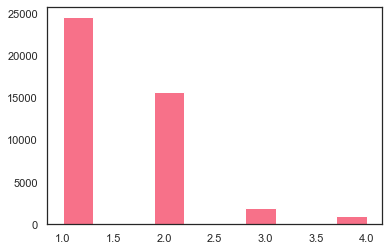

In [52]:
# y is unbalanced. There are relatively little people who say the climate is definitely not changing. This should be adressed in XGBoost and possibly in the neural net aswell.
plt.hist(y)
plt.show();

In [53]:
y.value_counts()

1    24585
2    15764
3     1962
4      978
Name: clmchng, dtype: int64

### y_zero and y_"countries"
XGBoost needs y to start at zero. Change the range, the values in y_zero will mean:

0 = Definitely changing	<br>
1 = Probably changing<br>
2 = Probably not changing<br>
3 =	Definitely not changing	<br>

In [54]:
y_zero = y-1

y_zero_dict = {0:"Definitely changing", 1:"Probably changing", 2:"Probably not changing", 3:"Definitely not changing"}

y_NL_RU = y_NL_RU-1
y_NL_DE = y_NL_DE-1
y_5cntry = y_5cntry -1

In [55]:
print(y_zero.value_counts(),"\n") #check
print(y_NL_RU.value_counts(),"\n")
print(y_NL_DE.value_counts(),"\n")
print(y_5cntry.value_counts())

0    24585
1    15764
2     1962
3      978
Name: clmchng, dtype: int64 

0.0    2035
1.0    1463
3.0     235
2.0     200
Name: clmchng, dtype: int64 

0.0    2878
1.0    1426
2.0     153
3.0      51
Name: clmchng, dtype: int64 

0.0    6494
1.0    3305
2.0     363
3.0     107
Name: clmchng, dtype: int64


### y_trio
The bins are very unbalanced. The non-believers making up only a small part of the observations. I will therefore also try to group the two non-believers together to form three bins (starting at zero):

0 = Definitely changing <br>
1 = Probably changing <br>
2 = Probably + Definitely not changing <br>


In [56]:
y_trio = y_zero.replace(3,2)
y_trio_dict = {0:"Definitely changing", 1:"Probably changing", 2:"Definitely + Probably not changing"}
y_trio.value_counts()

0    24585
1    15764
2     2940
Name: clmchng, dtype: int64

### y_duo
To be fair, lets also bin the first two together and make a binary prediction. This will be the bins:

0 = Probably+ Definitely changing <br>
1 = Probably + Definitely not changing <br>

In [57]:
y_duo_intermediate=y_trio.replace(1,0) #replace 1 by 0
y_duo=y_duo_intermediate.replace(2,1) #replace 2 by 1
y_duo_dict = {0:"Definitely + probably changing", 1:"Definitely + Probably not changing"}

In [58]:
y_duo.value_counts()

0    40349
1     2940
Name: clmchng, dtype: int64

###  y_worried

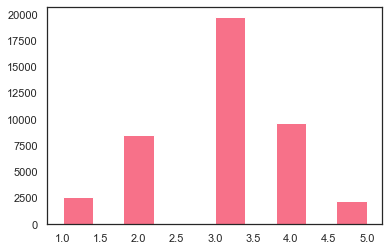

In [59]:
#Check out a different y: are you worried about climate change?
plt.hist(data_worried["wrclmch"]);

In [60]:
y_worried = data_worried["wrclmch"]
print(y_worried.unique())
y_worried = y_worried.astype(int)
y_worried.unique()


[4. 3. 2. 1. 5.]


array([4, 3, 2, 1, 5])

In [61]:
y_worried = y_worried-1
print(type(y_worried[0]))
y_worried_dict = {0: "Not at all worried", 1: "Not very worried", 2: "Somewhat worried", 
                  3: "Very worried", 4:"Extremely worried"}


print(y_worried.unique())
y_worried_dict

<class 'numpy.int32'>
[3 2 1 0 4]


{0: 'Not at all worried',
 1: 'Not very worried',
 2: 'Somewhat worried',
 3: 'Very worried',
 4: 'Extremely worried'}

# Functions
All functions are in this Chapter. For convenience each function has it's own paragraph.

## get_fullname()

In [62]:
def get_fullname(dataframe, metadata):
    """
    IN:
    The dataframe with the shorthands you want to decipher (in rows).
    The metadata-dataframe

    OUT:
    The input dataframe with fullnames attached
    """
    df = dataframe.groupby("feature").mean()
    fullname = pd.merge(df, metadata[["shorthand", "full_text"]], left_on= "feature", right_on="shorthand", how="left")
        
    return fullname

## XG_Boost()

In [63]:
def XG_Boost(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    X: Dataframe with features 
    y: Dataframe with predictor 
    random_states: list with random states (also defines the number of runs, so choose wisely!)
    undersample_True: whether or not you want to undersample (True) or not
    learning_rate: 1 value (!)
    hyperparams: a dictionary with hyperparameters (can be an empty dictionary, it will use XG_boost build in default-values).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features

    """

   
    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []
    
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            #keep random state of undersampling stable through loops, as the train_test_split is already changing
            #otherwise you cant compare between runs as you would change 2 not 1 variables at the time 
           
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)  #sampling_strategy = auto --> all groups get equal size
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))

        else:
            X_train = X_train
            y_train = y_train
        
        #decide what model to use: multiclass or binary 
        if len(y.unique()) > 2:
            model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
                                      learning_rate = learning_rate, use_label_encoder=False) 
            result = model.fit(X_train, y_train)
         
        else:
            model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
                                      learning_rate = learning_rate, use_label_encoder=False)
            result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, labels=None, target_names=None),
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                      "Random_state":[random_states, random_states]})
   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## tune_learning()

Use this function to tune the learning rate of the multiclass XG_Boost model.

In [64]:
def tune_learning(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    X: Dataframe with features 
    y: Dataframe with predictor 
    one_random_states: one single value to use as random state (int) used in train_test_split
    undersample_True: whether or not you want to undersample (True) or not (False (or anything else))
    learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
    hyperparameters: a dictionary with hyperparameters (can be empty, it will use XG_boost build in default-values)

    
    OUT: 
    Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.

     
    PRINT:
    It will print the classification report per round
    It will print a barplot with the most frequently in the top 10 occuring features.
    It will print a scatterplot with the accuracy test&train scores at different learning rates

    
   """

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    #list to keep track of learning rate that belongs to specific outcome
    used_learning_rate = []
    
    
    for i in learning_rate:
        used_learning_rate.append(i)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = one_random_state) #split data
        
        if undersample_True == True:
            # keep random state of undersampling stable through loops, for comparability
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under

        else:
            x_train = x_train
            y_train = y_train
        
        #decide what model to use: multiclass or binary 
        if len(y.unique()) > 2:
            model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
                                      learning_rate = i, use_label_encoder=False)
            result = model.fit(X_train, y_train)
        
        else:
            model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
                                      learning_rate = i, use_label_encoder=False)
            result = model.fit(X_train, y_train)
            
        #make predictions
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #get scores test set: accuracy, recall and precision
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Learning rate:", i, "\n", 
              classification_report(y_test, y_pred), 
              "\n====================================================\n")

        #get scores train set: accuracy, recall and precision 
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

       
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
                                      "Recall_test":recall_XGBoost, 
                                      "Precision_test":precision_XGBoost,
                                       "Accuracy_train":accuracy_XGBoost_train,
                                      "Recall_train":recall_XGBoost_train, 
                                      "Precision_train":precision_XGBoost_train,  
                                     "Learning_rate":used_learning_rate
                                     })
 
       
    score_df_XGBoost["acc_distance"] = abs(score_df_XGBoost["Accuracy_train"]- score_df_XGBoost["Accuracy_test"])
    
    #plot the scores
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test")
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train")
    plt.title("Tuning learning rate - test (pink) and train (brown) accurcay scores")
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost

## objective()  
Use for hyperparameter tuning, set learning_rate of space to the optimal value if determined.

In [65]:
def objective(space):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={'learning_rate': 0.1 
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """   
    model=xgb.XGBClassifier(learning_rate = space["learning_rate"], n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    model.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

## top_param()
Use to tune the values of the hyperparameters.

In [66]:
def top_param(X, y, random_states, learning_rate, undersample_True, hyperparams):
    """   
    IN:
    X and y, 
    random_states(list)
    learning_rate: optimized learning rate 
    undersample_True: whether to undersample or not
    hyperparams: list of dictionaries with possible top parameter-combinations. Will loop over all these combinations.
    
    OUT
    Dictionary of hyperparameters where the accuracy is highest.
    
    """

    #putting the list of dictionaries into a single dictionary
    dict_tuple = tuple(hyperparams)
    dict_unnest = {k:[d.get(k) for d in dict_tuple] for k in {k for d in dict_tuple for k in d}}

    top_hyperparams = pd.DataFrame.from_dict(dict_unnest)    

    
    #try all hyperparameters, put outcomes in a list of score-dataframes 
    keep_score =[]
    

    for i in range(len(top_hyperparams)):
        #turn max_depth into integer
        a  = pd.Series.to_dict(top_hyperparams.iloc[i,:]) 
        a["max_depth"] = int(a["max_depth"])
        
        #calculate score for each hyperparameter combination
        score, feat = XG_Boost(X, y, random_states, undersample_True, learning_rate, a)  
        keep_score.append(score["Accuracy"][0]) #append only test-accuracy
                  
    #get index of highest accuracy and find hyperparameter combination that belongs to it
    max_index = np.argmax(keep_score)
    best_param_df = top_hyperparams.iloc[max_index]
   
    best_param_dict= best_param_df.to_dict() 
    best_param_dict["max_depth"] = int(best_param_dict["max_depth"])
    
    return best_param_dict

## top_param_lr()
Choose this one if you want to tune learning rate and other hyperparameters at the same time.

In [67]:
# Choose this one if you want to tune learning rate and other hyperparameters at the same time.
def top_param_lr(X, y, random_states, undersample_True, hyperparams):
    """
    USE: 
    
    IN:
    X and y, 
    random_states(list)
    learning_rate: optimized learning rate 
    undersample_True: whether to undersample or not
    hyperparams: list of dictionaries with possible top parameter-combinations. Will loop over all these combinations.
    
    OUT
    Dictionary of hyperparameters where the accuracy is highest.
    
    """

    #putting the list of dictionaries into a single dictionary
    dict_tuple = tuple(hyperparams)
    dict_unnest = {k:[d.get(k) for d in dict_tuple] for k in {k for d in dict_tuple for k in d}}

    top_hyperparams = pd.DataFrame.from_dict(dict_unnest)    

    
    #try all hyperparameters, put outcomes in a list of score-dataframes 
    keep_score =[]
    

    for i in range(len(top_hyperparams)):
        #turn max_depth into integer
        a  = pd.Series.to_dict(top_hyperparams.iloc[i,:]) 
        a["max_depth"] = int(a["max_depth"])
        
        #calculate score for each hyperparameter combination
        score, feat = XG_Boost_lr(X, y, random_states, undersample_True, a)  
        keep_score.append(score["Accuracy"][0]) #append only test-accuracy
                  
    #get index of highest accuracy and find hyperparameter combination that belongs to it
    max_index = np.argmax(keep_score)
    best_param_df = top_hyperparams.iloc[max_index]
   
    best_param_dict= best_param_df.to_dict() 
    best_param_dict["max_depth"] = int(best_param_dict["max_depth"])
    
    return best_param_dict

## XG_Boost_lr()
Choose this one if you want to tune learning rate and other hyperparameters at the same time

In [68]:
# Choose this one if you want to tune learning rate and other hyperparameters at the same time.
def XG_Boost_lr(X, y, random_states, undersample_True, hyperparams):  
    """
    IN: 
    X: Dataframe with features 
    y: Dataframe with predictor 
    random_states: list with random states (also defines the number of runs, so choose wisely!)
    undersample_True: whether or not you want to undersample (True) or not (False (or anything else))
    learning_rate: 1 value (!)
    hyperparams: a dictionary with hyperparameters including learning rate(can be empty, it will use XG_boost build in default-values).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

   
    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []
    
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            #keep random state of undersampling stable through loops, as the train_test_split is already changing
            #otherwise you cant compare between runs as you would change 2 not 1 variables at the time 
           
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)  #sampling_strategy = auto --> all groups get equal size
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))

        else:
            X_train = X_train
            y_train = y_train
        
        #decide what model to use: multiclass or binary 
        if len(y.unique()) > 2:
            model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams, use_label_encoder=False)
            result = model.fit(X_train, y_train)
        
        else:
            model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams, use_label_encoder=False)
            result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, labels=None, target_names=None),
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## Light_GBM()

In [69]:
def Light_GBM(X, y, random_states, undersample_True, learning_rate, hyperparams):
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
    Learning rate(1 value!) (learing_rate)
    A dictionary with hyperparameters (can be empty aswell).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

    #lists for performances on test set
    recall = []
    accuracy = []
    precision = [] 
    
    #lists for performances on test set
    recall_train = []
    accuracy_train = []
    precision_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
            
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = lgb.LGBMClassifier(objective='multi:softmax', **hyperparams,
        learning_rate = learning_rate, use_label_encoder=False)
        
        result = model.fit(X_train, y_train, eval_metric='logloss')
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy.append(accuracy_score(y_test, y_pred))
        recall.append(recall_score(y_test, y_pred, average='macro'))
        precision.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred), 
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_train.append(accuracy_score(y_train, y_pred_train))
        recall_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df = pd.DataFrame({"Model":["Light_GBM","Licht_GBM_train"],
                                      "Accuracy":[np.average(accuracy), np.average(accuracy_train)],
                                      "Recall":[np.average(recall), np.average(recall_train)], 
                                      "Precision":[np.average(precision), np.average(precision_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features["model"] = "Light_GBM"
    top_features["feature"] = "abc"
    
    for i in range(len(top_features)):
        index_nr = top_features["indices"][i]
        top_features.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df, top_features

# Fixed variables
Some variables I use over and over for comparability between models/runs. You find those here.

In [70]:
#running a basic model
random_states = [5,12,19,26,33]
lr_default = 0.1
empty_dict = {}

#for learning rate tuning:
learning_rates = list(np.arange(0, 0.04, 0.0001))

In [71]:
# NOTE: SET SPACE LEARNING_RATE TO RIGHT VALUE BEFORE TUNING THE HYPERPARAMS!
space={'learning_rate': 0.01,
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3
    }

In [72]:
# NOTE: Use this learning_rate when you want to tune learning_rate at the same time as the other parameters.
space_lr={'learning_rate': hp.quniform("learning_rate", 0, 0.2, .0001),
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3
    }

# To scale or not to scale
Check if scaling is of influence of XGBoost or LightGMB.

## XGBoost

3144 3144
Random state: 5 
               precision    recall  f1-score   support

           0       0.73      0.48      0.58      4985
           1       0.42      0.32      0.37      3091
           2       0.08      0.35      0.13       390
           3       0.07      0.52      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.46      0.56      4967
           1       0.45      0.37      0.41      3110
           2       0.10      0.37      0.15       395
           3       0.07      0.52      0.12       186

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

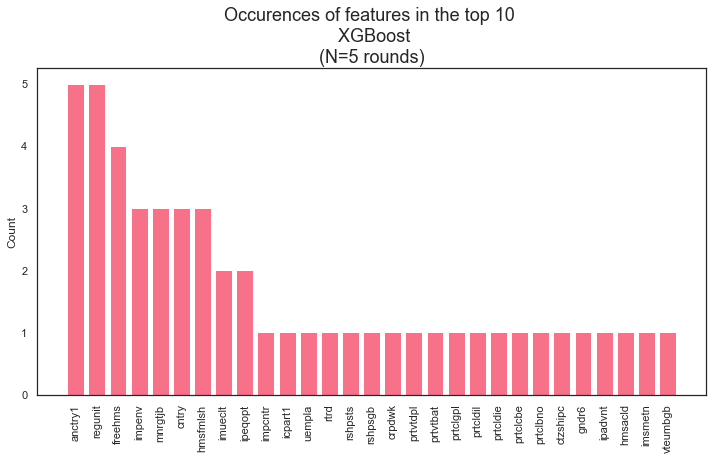

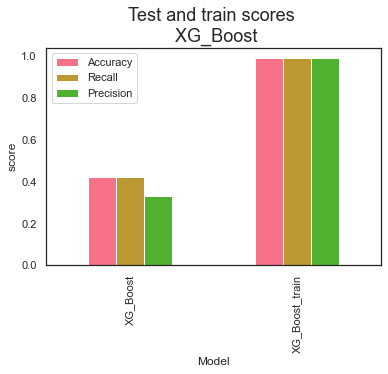

In [73]:
XGB_score_scaled, XGB_feat_scaled = XG_Boost(X_scaled_noclimate, y_zero, random_states, True, 0.1, empty_dict)

3144 3144
Random state: 5 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4985
           1       0.43      0.33      0.37      3091
           2       0.08      0.33      0.13       390
           3       0.08      0.52      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.58      0.42      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.46      0.56      4967
           1       0.45      0.37      0.41      3110
           2       0.10      0.37      0.15       395
           3       0.07      0.52      0.12       186

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.43      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

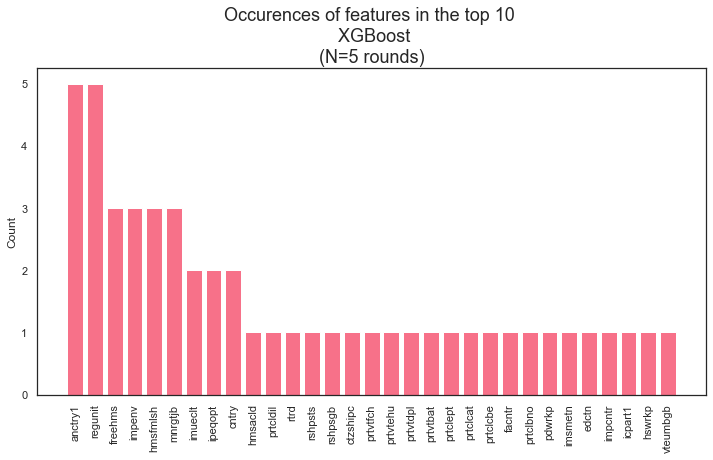

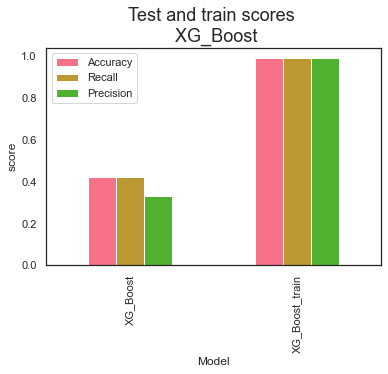

In [74]:
XGB_score, XGB_feat = XG_Boost(X_noclimate,  y_zero, random_states, True, 0.1, empty_dict)

In [75]:
print("XGBoost scaled score:\n", XGB_score_scaled)
print("\n========================================================\n")
print("XGBoost not scaled score:\n", XGB_score)

XGBoost scaled score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.421113  0.420488   0.330319  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.988615  0.988615   0.988744  [5, 12, 19, 26, 33]


XGBoost not scaled score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.423354  0.421262   0.330534  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.987777  0.987777   0.987899  [5, 12, 19, 26, 33]


For XGBoost it doesn't matter much. Depending on what's best for LightGBM I will use that version of X (scaled or not). Lot's of variation in selected features (see below).

In [76]:
#check if the models select similar features
print(set(XGB_feat_scaled["feature"]))
print("\n========================================================\n")
print(set(XGB_feat["feature"]))

{'anctry1', 'ipadvnt', 'rshpsgb', 'prtclcbe', 'mnrgtjb', 'prtcldie', 'impenv', 'hmsacld', 'impcntr', 'crpdwk', 'ctzshipc', 'uempla', 'icpart1', 'gndr6', 'hmsfmlsh', 'imueclt', 'prtclgpl', 'prtvtdpl', 'freehms', 'prtcldil', 'regunit', 'cntry', 'rshpsts', 'prtclbno', 'rtrd', 'ipeqopt', 'imsmetn', 'prtvtbat', 'vteumbgb'}


{'prtclept', 'anctry1', 'prtclcat', 'rshpsgb', 'prtclcbe', 'prtvtfch', 'mnrgtjb', 'facntr', 'impenv', 'hmsacld', 'impcntr', 'hswrkp', 'prtvtehu', 'ctzshipc', 'icpart1', 'hmsfmlsh', 'imueclt', 'prtvtdpl', 'freehms', 'edctn', 'prtcldil', 'pdwrkp', 'regunit', 'cntry', 'rshpsts', 'prtclbno', 'rtrd', 'ipeqopt', 'imsmetn', 'prtvtbat', 'vteumbgb'}


In [77]:
#print features they have in common: only 1!
set_XGB_feat_scaled = list(set(XGB_feat_scaled["feature"]))
set_XGB_feat = list(set(XGB_feat["feature"]))

print("Overlapping:\n")
for i in range (len(set_XGB_feat_scaled)):
    if set_XGB_feat_scaled[i] in set_XGB_feat:
        print(set_XGB_feat_scaled[i])

print("\nNot overlapping:\n")        
for i in range (len(set_XGB_feat_scaled)):
    if set_XGB_feat_scaled[i] not in set_XGB_feat:
        print(set_XGB_feat_scaled[i])

Overlapping:

anctry1
rshpsgb
prtclcbe
mnrgtjb
impenv
hmsacld
impcntr
ctzshipc
icpart1
hmsfmlsh
imueclt
prtvtdpl
freehms
prtcldil
regunit
cntry
rshpsts
prtclbno
rtrd
ipeqopt
imsmetn
prtvtbat
vteumbgb

Not overlapping:

ipadvnt
prtcldie
crpdwk
uempla
gndr6
prtclgpl


## LightGBM
Conclusion (from code below): for LightGBM it doesnt matter much either. I will continue with the non_scaled data.

3144 3144
[LightGBM] [Warning] Unknown parameter: use_label_encoder
Random state: 5 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4985
           1       0.42      0.31      0.36      3091
           2       0.08      0.35      0.13       390
           3       0.07      0.55      0.13       192

    accuracy                           0.41      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.57      0.41      0.47      8658
 

3168 3168
[LightGBM] [Warning] Unknown parameter: use_label_encoder
Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4967
           1       0.45      0.35      0.39      3110
           2       0.09      0.37      0.15       395
           3       0.07      0.53      0.12       186

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted a

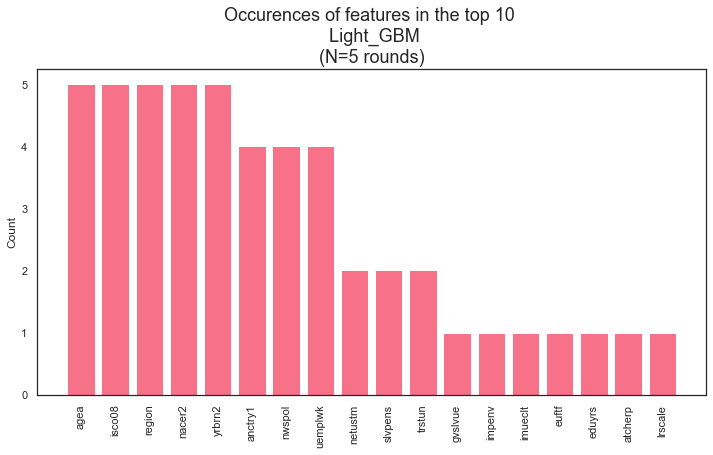

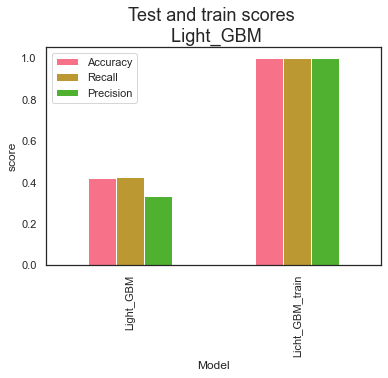

In [78]:
LGBM_score_scaled, LGBM_feat_scaled = Light_GBM(X_scaled_noclimate, y_zero, random_states, True, 0.1,empty_dict)

3144 3144
[LightGBM] [Warning] Unknown parameter: use_label_encoder
Random state: 5 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4985
           1       0.43      0.31      0.36      3091
           2       0.09      0.36      0.14       390
           3       0.07      0.54      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

3168 3168
[LightGBM] [Warning] Unknown parameter: use_label_encoder
Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4967
           1       0.46      0.36      0.40      3110
           2       0.10      0.39      0.16       395
           3       0.08      0.59      0.14       186

    accuracy                           0.43      8658
   macro avg       0.34      0.45      0.32      8658
weighted a

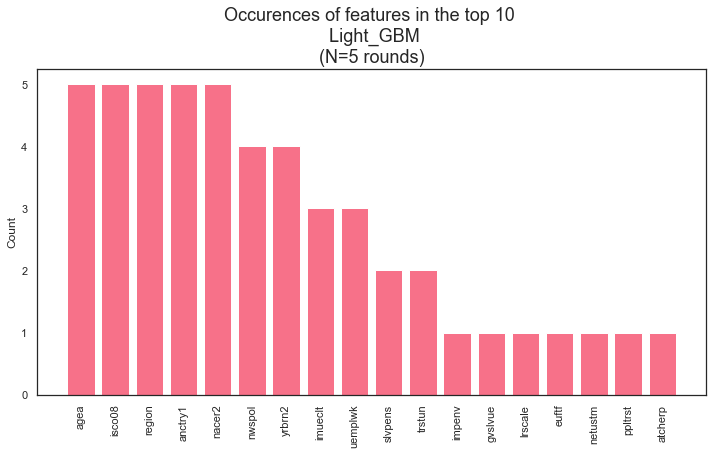

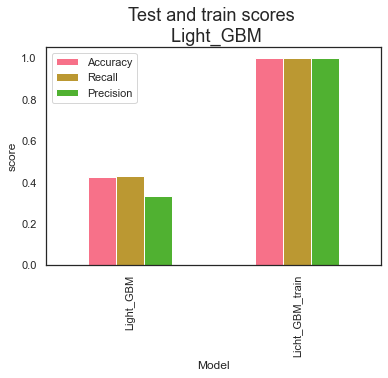

In [79]:
LGBM_score, LGBM_feat = Light_GBM(X_noclimate, y_zero, random_states, True, 0.1,empty_dict)

In [80]:
print("LightGMB scaled score:\n", LGBM_score_scaled)
print("\n========================================================\n")
print("LightGBM not scaled score:\n", LGBM_score)

LightGMB scaled score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.420929  0.424937   0.330898  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999938  0.999938   0.999939  [5, 12, 19, 26, 33]


LightGBM not scaled score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.422430  0.429588   0.332314  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999871  0.999871   0.999872  [5, 12, 19, 26, 33]


Scaled or not scaled: does not matter much for LightGMB either.

In [81]:
#check if the models select similar features
print(set(LGBM_feat_scaled["feature"]))
print("\n========================================================\n")
print(set(LGBM_feat["feature"]))

{'uemplwk', 'agea', 'euftf', 'nacer2', 'impenv', 'nwspol', 'netustm', 'eduyrs', 'lrscale', 'atcherp', 'imueclt', 'slvpens', 'anctry1', 'gvslvue', 'isco08', 'region', 'trstun', 'yrbrn2'}


{'uemplwk', 'agea', 'euftf', 'nacer2', 'impenv', 'nwspol', 'netustm', 'ppltrst', 'lrscale', 'isco08', 'atcherp', 'imueclt', 'slvpens', 'anctry1', 'gvslvue', 'region', 'trstun', 'yrbrn2'}


In [82]:
#print features they have in common: only 1!
set_LGBM_feat_scaled = list(set(LGBM_feat_scaled["feature"]))
set_LGBM_feat = list(set(LGBM_feat["feature"]))

print("Overlapping:\n")
for i in range (len(set_LGBM_feat_scaled)):
    if set_LGBM_feat_scaled[i] in set_LGBM_feat:
        print(set_LGBM_feat_scaled[i])

print("\nNot overlapping:\n")        
for i in range (len(set_LGBM_feat_scaled)):
    if set_LGBM_feat_scaled[i] not in set_LGBM_feat:
        print(set_LGBM_feat_scaled[i])

Overlapping:

uemplwk
agea
euftf
nacer2
impenv
nwspol
netustm
lrscale
atcherp
imueclt
slvpens
anctry1
gvslvue
isco08
region
trstun
yrbrn2

Not overlapping:

eduyrs


# XGBoost versus LightGBM 
Based on the scores on the test set, XG_boost and LightGBM score equally low (see below). I'll choose XG_Boost over LightGBM the hyperparameter-optimization seems to be slightly easier in XG_boost.

In [83]:
#compare the scores (not scaled)
print("XGBoost score:\n", XGB_score)
print("\n========================================================\n")
print("LightGBM score:\n", LGBM_score)

XGBoost score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.423354  0.421262   0.330534  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.987777  0.987777   0.987899  [5, 12, 19, 26, 33]


LightGBM score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.422430  0.429588   0.332314  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999871  0.999871   0.999872  [5, 12, 19, 26, 33]


In [84]:
#check if the models select similar features
print(set(XGB_feat["feature"]))
print("\n========================================================\n")
print(set(LGBM_feat["feature"]))

{'prtclept', 'anctry1', 'prtclcat', 'rshpsgb', 'prtclcbe', 'prtvtfch', 'mnrgtjb', 'facntr', 'impenv', 'hmsacld', 'impcntr', 'hswrkp', 'prtvtehu', 'ctzshipc', 'icpart1', 'hmsfmlsh', 'imueclt', 'prtvtdpl', 'freehms', 'edctn', 'prtcldil', 'pdwrkp', 'regunit', 'cntry', 'rshpsts', 'prtclbno', 'rtrd', 'ipeqopt', 'imsmetn', 'prtvtbat', 'vteumbgb'}


{'uemplwk', 'agea', 'euftf', 'nacer2', 'impenv', 'nwspol', 'netustm', 'ppltrst', 'lrscale', 'isco08', 'atcherp', 'imueclt', 'slvpens', 'anctry1', 'gvslvue', 'region', 'trstun', 'yrbrn2'}


In [85]:
#print features they have in common: 
set_XGB_feat = list(set(XGB_feat["feature"]))
set_LGBM_feat = list(set(LGBM_feat["feature"]))

for i in range (len(set_XGB_feat)):
    if set_XGB_feat[i] in set_LGBM_feat:
        print("Overlapping features:", set_XGB_feat[i])

Overlapping features: anctry1
Overlapping features: impenv
Overlapping features: imueclt


In [86]:
#check out XGB features. Note: lot's of features are specific for 1 country; 1 feature is regional_unit
get_fullname(XGB_feat, metadata).sort_values(by="full_text")

,indices,importance,shorthand,full_text
10,94,0.006250,impcntr,Allow many/few immigrants from poorer countries outside Europe
12,92,0.005387,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
7,89,0.006281,hmsfmlsh,Ashamed if close family member gay or lesbian
2,131,0.005584,ctzshipc,Citizenship
1,0,0.006825,cntry,Country
13,96,0.006374,imueclt,Country's cultural life undermined or enriched by immigrants
3,243,0.006108,edctn,Doing last 7 days: education
29,247,0.007250,rtrd,Doing last 7 days: retired
4,138,0.006998,facntr,Father born in country
0,316,0.015644,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"


In [87]:
#check out LGBM features. 
get_fullname(LGBM_feat, metadata).sort_values(by="full_text")

,indices,importance,shorthand,full_text
0,200.0,173.000000,agea,"Age of respondent, calculated"
6,96.0,133.000000,imueclt,Country's cultural life undermined or enriched by immigrants
3,91.0,118.000000,euftf,European Union: European unification go further or gone too far
1,316.0,142.400000,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
2,107.0,138.000000,atcherp,How emotionally attached to Europe
5,336.0,143.000000,impenv,Important to care for nature and environment
9,272.0,182.000000,nacer2,"Industry, NACE rev.2"
10,3.0,138.000000,netustm,"Internet use, how much time on typical day, in minutes"
12,4.0,135.000000,ppltrst,Most people can be trusted or you can't be too careful
11,1.0,150.000000,nwspol,"News about politics and current affairs, watching, reading or listening, in minutes"


# Continue with XGBoost

## Optimize XGBoost learning rate
Find the best performing learning rate: a balance between high test_score and no overfitting in the train_set.

In [88]:
#TAKES LONG TO RUN, DATA STORED IN DATAFRAME INSTEAD
# score_lr, feat_lr = tune_learning(X_noclimate, y_zero, 7, True, learning_rates, empty_dict)

In [89]:
# score_lr.to_csv('./data/learning_rate_optimization.csv') # store in CSV, only if cell above is not cancelled out 
# feat_lr.to_csv('./data/learning_rate_optimization_features.csv')

In [90]:
#import the created csv
score_lr = pd.read_csv('./data/learning_rate_optimization.csv')
score_lr.head()

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000
1,1,0.355047,0.375093,0.301818,0.591572,0.591572,0.595236,0.0001
2,2,0.356549,0.376859,0.302613,0.593156,0.593156,0.596633,0.0002
3,3,0.359783,0.378327,0.302369,0.598226,0.598226,0.601752,0.0003
4,4,0.366251,0.382091,0.304147,0.603295,0.603295,0.606702,0.0004


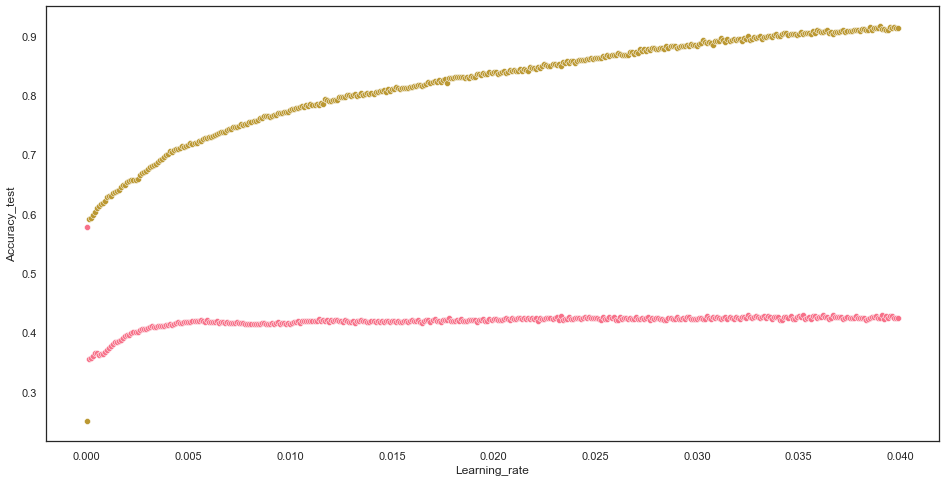

In [91]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [92]:
score_lr.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000
367,367,0.429545,0.438064,0.333342,0.903676,0.903676,0.905584,0.0367
391,391,0.429429,0.444347,0.335122,0.911280,0.911280,0.912939,0.0391
325,325,0.429198,0.437419,0.333504,0.898923,0.898923,0.900696,0.0325
352,352,0.429198,0.442046,0.333903,0.903042,0.903042,0.905000,0.0352
362,362,0.428967,0.442254,0.333650,0.906210,0.906210,0.908140,0.0362
393,393,0.428274,0.440185,0.333267,0.910013,0.910013,0.911596,0.0393
388,388,0.428043,0.433883,0.333665,0.913181,0.913181,0.914519,0.0388
350,350,0.428043,0.441734,0.334898,0.902408,0.902408,0.904249,0.0350
333,333,0.427928,0.434606,0.332722,0.898289,0.898289,0.899839,0.0333


The top 20 test-accuracies are all pretty overrtrained. And have relatively high learning_rates. Looking at the graph, I'd prefer a learning_rate smaller than 0.01. 
Zoom in a little on those values..

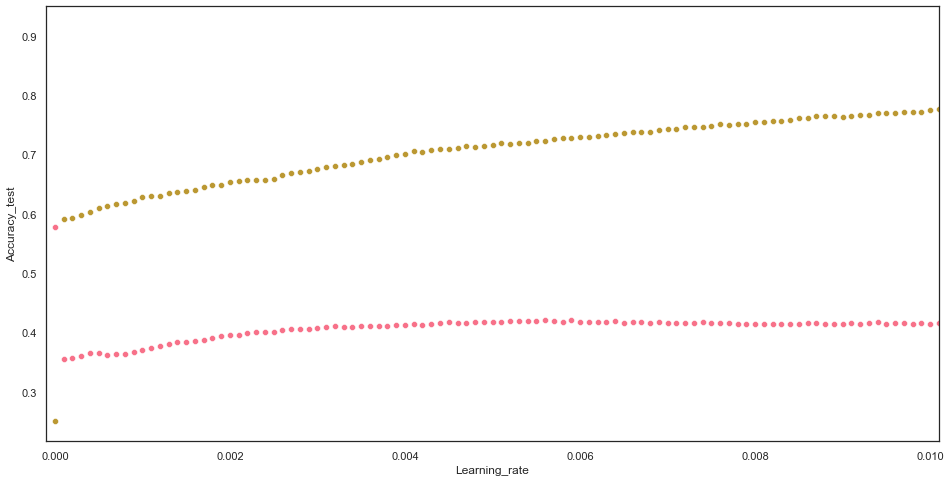

In [93]:
#plot a tighter range
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.xlim(-.0001,0.0101)
plt.show();

In [94]:
score_low_lr = score_lr[score_lr["Learning_rate"]<=0.01]

In [95]:
score_low_lr["distance"] = score_low_lr.Accuracy_train - score_low_lr.Accuracy_test

<ipython-input-95-e187c45cbd55>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_low_lr["distance"] = score_low_lr.Accuracy_train - score_low_lr.Accuracy_test


In [96]:
score_low_lr.sort_values(by="Accuracy_test", ascending=False).head(20)

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000,-0.327732
56,56,0.420536,0.427521,0.323065,0.723384,0.723384,0.726313,0.0056,0.302848
59,59,0.420305,0.427577,0.323302,0.727820,0.727820,0.730864,0.0059,0.307515
53,53,0.419612,0.429510,0.323446,0.718948,0.718948,0.722149,0.0053,0.299336
57,57,0.419496,0.426946,0.322642,0.725602,0.725602,0.728328,0.0057,0.306106
55,55,0.419265,0.426940,0.322577,0.722117,0.722117,0.725284,0.0055,0.302851
64,64,0.419150,0.427630,0.322386,0.734474,0.734474,0.737264,0.0064,0.315324
54,54,0.418803,0.427267,0.322220,0.718948,0.718948,0.721995,0.0054,0.300145
52,52,0.418803,0.428664,0.323262,0.717047,0.717047,0.720348,0.0052,0.298243
63,63,0.418457,0.424196,0.321305,0.732890,0.732890,0.735850,0.0063,0.314433


Top learning rates are still overtrained. Let's see where the smallest distance between train&test accuracy is.

In [97]:
score_low_lr.sort_values(by="distance", ascending=True)

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000,-0.327732
1,1,0.355047,0.375093,0.301818,0.591572,0.591572,0.595236,0.0001,0.236524
2,2,0.356549,0.376859,0.302613,0.593156,0.593156,0.596633,0.0002,0.236607
4,4,0.366251,0.382091,0.304147,0.603295,0.603295,0.606702,0.0004,0.237044
3,3,0.359783,0.378327,0.302369,0.598226,0.598226,0.601752,0.0003,0.238443
5,5,0.364980,0.381661,0.304286,0.609632,0.609632,0.612600,0.0005,0.244652
6,6,0.362670,0.378486,0.303552,0.613752,0.613752,0.616444,0.0006,0.251081
12,12,0.376877,0.390309,0.303665,0.629911,0.629911,0.632366,0.0012,0.253034
7,7,0.363248,0.380718,0.302788,0.616286,0.616286,0.618366,0.0007,0.253039
14,14,0.383460,0.393779,0.306314,0.636565,0.636565,0.640030,0.0014,0.253105


Taking the best distance (excluding learning_rate=0) decreases the accuracy of the testset quite a lot (to 0.36, while the allround best was >0.4 (though more heavely overrtained)). Considering both are overtrained, I'll go with the higher  Accuracy testscore, setting the learning rate to 0.0367.

In [98]:
top_lr = 0.0367

## Optimize XGBoost hyperparameters

Use the top learning rate to tune hyperparameters

https://www.kaggle.com/prashant111/a-guide-on-xgboost-hyperparameters-tuning

In [99]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [100]:
space["learning_rate"] = top_lr

The exact combination of 'best hyperparameters' is not stable: run the same model 10 times and use the best of those runs.

In [101]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:35,  2.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:36,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:35,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:45,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:42,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:41,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:38,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:36,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:36,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5234465234465234                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:47,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:42,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:40,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.53003003003003                                                                                                       
 16%|███████▎                                      | 16/100 [00:07<00:47,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:42,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:49,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.536036036036036                                                                                                      
 19%|████████▋                                     | 19/100 [00:09<00:54,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:46,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:42,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:39,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:38,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:36,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:34,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:33,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:32,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:32,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:32,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:30,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:30,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:29,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:28,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:29,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:28,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:27,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:27,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:26,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:26,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:26,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:25,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:25,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:24,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:24,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:23,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:24,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:23,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:22,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:22,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:21,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:22,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:27,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:24,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:23,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:21,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:21,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:19,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:18,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:18,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:17,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:16,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:19,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:18,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:16,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:15,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:14,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:14,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:13,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:12,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5296835296835297                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:15,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:14,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:12,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:12,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:11,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:10,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:09,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:08,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:08,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:07,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:07,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:08,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:07,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:06,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:05,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:42<00:05,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:04,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:43<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:03,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:39,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:39,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:38,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:37,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:35,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:36,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:03<00:35,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:35,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:34,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:34,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:33,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:05<00:35,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:34,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:06<00:33,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:32,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:32,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:07<00:31,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:43,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:39,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:37,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:35,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:34,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:34,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:33,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:32,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:31,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:31,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:31,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:31,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:30,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:30,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5326865326865327                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:36,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:34,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:32,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:28,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:27,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:27,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:27,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:25,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:24,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:24,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:24,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:24,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:23,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:22,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:22,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:21,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:21,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:19,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:19,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:18,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:20,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:19,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:18,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5352275352275352                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:22,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:20,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:19,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:17,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:16,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:15,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:14,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:14,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:14,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:13,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:12,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:12,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:12,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:11,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:10,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:10,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:09,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:09,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:36<00:09,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:08,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:37<00:08,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:07,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:38<00:07,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5382305382305382                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:08,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:39<00:07,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:06,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:05,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:05,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:04,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:04,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:42<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:44<00:01,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
  1%|▍                                               | 1/100 [00:00<01:15,  1.31trial/s, best loss: -0.552899052899053]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:04,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:56,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5467775467775468                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:02,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:54,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5371910371910372                                                                                                     
  6%|██▊                                            | 6/100 [00:03<01:00,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:52,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:47,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:46,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5455070455070455                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:53,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:47,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:43,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5441210441210441                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:52,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:46,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:42,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:39,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5456225456225456                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:46,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:44,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5219450219450219                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:49,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:43,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:40,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:39,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:38,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:36,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:35,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:33,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:33,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:33,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:32,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:32,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5415800415800416                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:40,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:37,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:35,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:33,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:31,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:30,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:29,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:31,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:29,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5396165396165397                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:35,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:39,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:34,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:31,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:28,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:27,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:25,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:26,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:25<00:25,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:24,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:23,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:22,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:23,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:22,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:21,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:20,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:20,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:20,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:19,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:18,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:18,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:17,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5284130284130284                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:23,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.53996303996304                                                                                                       
 63%|████████████████████████████▉                 | 63/100 [00:32<00:25,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:22,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:20,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:21,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:18,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:17,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:36<00:16,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:16,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5553245553245554                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:20,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:38<00:18,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:16,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:15,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:13,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:12,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:11,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:41<00:10,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:10,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:09,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:09,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:42<00:08,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:08,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:43<00:07,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:44<00:06,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:45<00:05,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:46<00:04,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:47<00:03,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:48<00:03,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:48<00:02,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:49<00:02,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:02,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:40,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:39,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:52,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:48,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:45,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:42,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:40,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:42,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:40,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:39,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:37,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:36,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:36,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:36,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:36,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:35,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:34,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:33,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:34,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:36,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:35,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5331485331485332                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:45,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:41,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:40,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:38,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:36,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:34,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:33,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:33,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:41,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:37,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:34,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:32,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:41,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:37,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:34,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:33,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:31,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:30,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:28,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:27,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:28,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5393855393855393                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:37,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:33,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5347655347655348                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:38,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:34,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:31,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 50%|███████████████████████                       | 50/100 [00:26<00:34,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:30,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:28,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:27,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:24,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:23,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:22,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:20,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:19,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:19,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:18,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:17,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:17,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:17,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:16,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:15,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:15,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:34<00:15,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:15,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:35<00:14,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:13,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:36<00:12,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:12,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:37<00:12,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5464310464310465                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:14,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:38<00:12,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:39<00:11,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:39<00:11,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:10,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:40<00:09,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:41<00:08,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:41<00:08,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:07,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:42<00:07,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:43<00:07,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:43<00:06,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:43<00:05,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:44<00:05,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:44<00:05,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:45<00:04,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:46<00:04,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:47<00:03,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:47<00:03,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:48<00:02,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:48<00:01,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:49<00:00,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:49<00:00,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:38,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:38,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:39,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:38,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:49,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:44,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:41,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:41,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:38,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:47,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:43,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:39,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:38,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:37,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:35,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:33,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:33,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:31,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:33,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:33,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:32,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.539039039039039                                                                                                      
 24%|███████████                                   | 24/100 [00:10<00:40,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:37,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:36,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:35,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:33,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:32,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:30,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:29,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:31,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:30,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:29,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:26,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:27,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:26,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:25,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:25,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:24,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:25,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:24,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5345345345345346                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:30,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:27,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:25,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:24,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:23,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:22,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:21,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:20,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:21,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:19,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:19,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:18,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:18,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 59%|███████████████████████████▏                  | 59/100 [00:27<00:22,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:20,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:19,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:18,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:17,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:17,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:16,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:15,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:14,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:13,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:13,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:12,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:14,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:13,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:12,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:11,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:10,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:09,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:36<00:09,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:36<00:09,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:08,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:37<00:07,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:07,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:38<00:06,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:39<00:06,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:05,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5483945483945484                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:06,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:05,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:05,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:04,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.539039039039039                                                                                                      
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:04,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:03,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:44<00:02,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:44<00:01,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:37,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:37,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:37,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:36,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:37,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5452760452760452                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:48,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:44,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:41,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:39,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:39,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:37,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:36,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5505890505890506                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:44,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:51,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:46,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:42,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:38,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:36,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:34,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:35,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:35,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5234465234465234                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:45,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:41,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:37,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:36,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:34,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:32,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:31,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:30,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:30,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5416955416955417                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:36,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:33,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:31,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:38,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:34,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:31,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:29,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:27,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:27,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:27,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:25,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:25,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:24,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:23,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:24,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:23,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:22,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:22,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:21,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:21,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5338415338415339                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:26,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:24,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5427350427350427                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:26,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:23,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5527835527835527                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:28<00:25,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:23,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:29<00:20,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:29<00:19,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:18,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:30<00:17,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:16,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:31<00:15,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:15,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:15,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:14,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:13,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:33<00:13,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:12,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:34<00:16,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:14,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:35<00:13,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5553245553245554                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:36<00:14,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:37<00:13,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:12,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:37<00:11,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:38<00:10,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:09,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:39<00:08,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:39<00:08,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:40<00:09,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:41<00:08,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:41<00:07,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:41<00:07,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:42<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:42<00:05,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:43<00:05,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:43<00:04,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:44<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:45<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:46<00:02,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:38,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:40,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:40,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:39,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:38,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
  6%|██▊                                            | 6/100 [00:02<00:47,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:45,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:43,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:41,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:39,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:37,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:36,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:36,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:35,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:35,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5299145299145299                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:45,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:41,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:39,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:37,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:35,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:43,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:40,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:40,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:38,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:36,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:34,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:34,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:32,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:33,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:32,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:31,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:30,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:29,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:30,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:29,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:28,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:28,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:27,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:27,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:33,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:31,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:28,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:28,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:27,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:25,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:30,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:28,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:28,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:25,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:23,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:22,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:21,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:21,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:20,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:20,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:19,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:18,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:18,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:18,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:18,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:17,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:15,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:15,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:15,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:15,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:14,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:14,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:13,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:13,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:13,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:12,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:11,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:11,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:10,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:10,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:10,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.532917532917533                                                                                                      
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:12,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5391545391545391                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:13,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:11,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:39<00:10,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:39<00:08,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:40<00:08,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:07,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:41<00:07,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:06,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:42<00:05,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:42<00:05,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:43<00:04,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:44<00:03,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:44<00:03,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:48,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:46,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:44,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:42,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:40,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:40,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:39,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:40,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:38,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:38,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:37,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:36,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:38,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:37,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:36,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:35,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:45,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5353430353430353                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:55,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:48,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:43,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:40,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:39,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:38,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:37,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:34,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:34,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:35,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:33,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:32,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:31,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:33,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:31,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:30,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:29,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:29,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:29,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:28,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:27,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:27,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:27,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:26,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5403095403095403                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:32,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:29,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:27,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:27,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:25,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:24,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:23,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:22,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:23,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:22,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:21,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:20,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:19,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:19,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5448140448140448                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:24,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:29<00:22,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:29<00:20,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:30<00:19,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:30<00:19,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:31<00:17,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.533957033957034                                                                                                      
 65%|█████████████████████████████▉                | 65/100 [00:31<00:21,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:32<00:19,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:17,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:33<00:17,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:15,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:34<00:14,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:34<00:14,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:35<00:13,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:13,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:36<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:36<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:37<00:11,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:10,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:38<00:11,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:38<00:10,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:39<00:09,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:39<00:08,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:40<00:08,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:40<00:08,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:41<00:07,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:41<00:07,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:42<00:06,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:42<00:06,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:42<00:05,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:43<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:43<00:04,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:44<00:05,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:45<00:04,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:45<00:03,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:46<00:03,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:46<00:02,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:47<00:01,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:48<00:01,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:40,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.537999537999538                                                                                                      
  4%|█▉                                             | 4/100 [00:02<00:54,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:49,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:45,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:43,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:41,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:41,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:39,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:37,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:37,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:36,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:36,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:38,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:36,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:36,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:34,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:34,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:35,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:35,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:34,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:34,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:34,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:32,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:34,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:33,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:32,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:31,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:32,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:31,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:30,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:38,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:35,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:35,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:32,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:37,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:33,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:32,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:30,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:28,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:26,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:25,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:25,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:24,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:23,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:22,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:22,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:22,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:21,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:26,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:24,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:22,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:21,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:19,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:18,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:22,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:29<00:20,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:19,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:30<00:18,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:16,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:16,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:15,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:15,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:14,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:13,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:33<00:13,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:13,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:34<00:12,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:12,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:11,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:11,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:10,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:10,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:09,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:09,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:08,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:08,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:07,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:07,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5370755370755371                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:08,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:07,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:06,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:05,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:42<00:05,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:04,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:43<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:03,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:37,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5487410487410488                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:50,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:47,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5254100254100255                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:56,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:50,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:56,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:52,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:47,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:54,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:48,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:44,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:41,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:39,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:47,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:43,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:40,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:38,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:36,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:34,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:33,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:33,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:33,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:34,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:33,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:32,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:32,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:32,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:14<00:31,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:31,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:30,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:30,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:29,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:31,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5548625548625549                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:37,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:34,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:32,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:31,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:30,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:28,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:27,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:26,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:25,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:25,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:24,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:24,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:23,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:23,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:23,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5236775236775236                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:29,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:26,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:24,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:23,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:22,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:27<00:21,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:20,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:28<00:19,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:19,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:29<00:19,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5319935319935319                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:30<00:23,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:30<00:21,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:30<00:19,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:31<00:18,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:31<00:17,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:32<00:16,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:15,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:33<00:14,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:14,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:34<00:14,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:34<00:13,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:35<00:12,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:12,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:35<00:11,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:36<00:15,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:37<00:13,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:12,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:38<00:10,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:38<00:10,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:39<00:09,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:39<00:09,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:40<00:08,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:40<00:07,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:41<00:07,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:41<00:07,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:42<00:06,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:42<00:07,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:43<00:06,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:43<00:05,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:44<00:05,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:45<00:03,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:45<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:46<00:01,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:47<00:00,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:48<00:00,  2.04trial/s, best loss: -0.5777315777315777]


3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.49      0.16      0.24      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



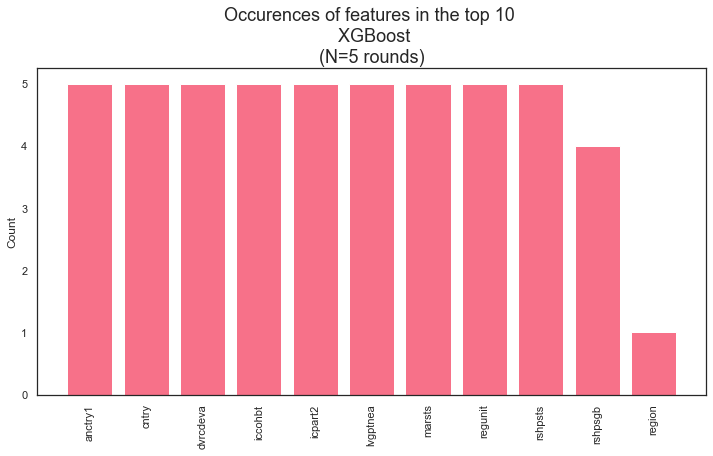

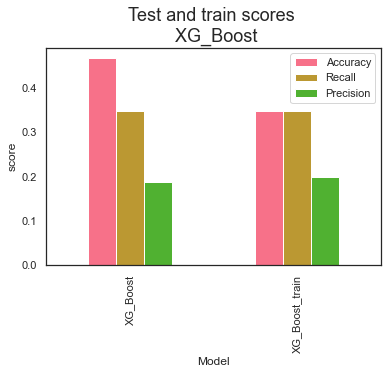

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.58      1.00      0.73      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.00      0.00      0.00       186

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.00      0.00      0.00       165

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 



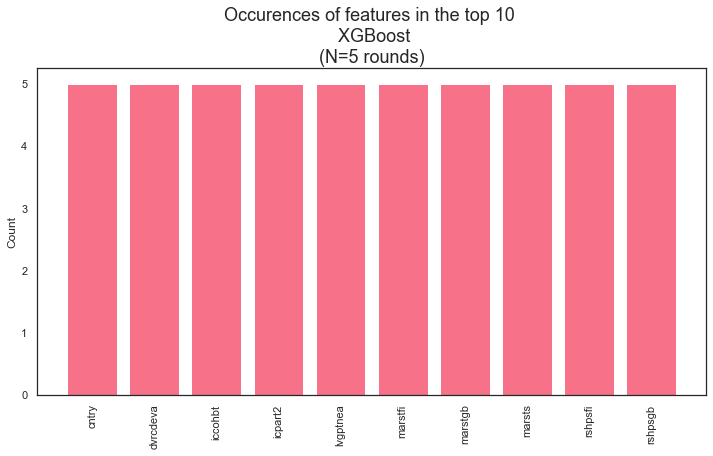

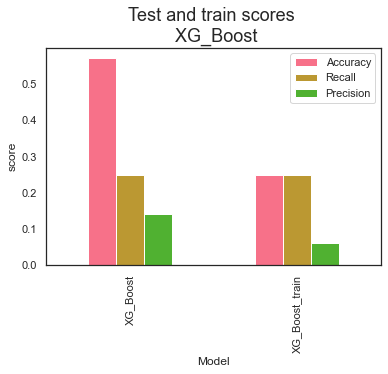

3144 3144
Random state: 5 
               precision    recall  f1-score   support

           0       0.66      0.64      0.65      4985
           1       0.33      0.04      0.07      3091
           2       0.08      0.33      0.13       390
           3       0.06      0.63      0.12       192

    accuracy                           0.41      8658
   macro avg       0.28      0.41      0.24      8658
weighted avg       0.50      0.41      0.41      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.58      0.62      4967
           1       0.43      0.13      0.20      3110
           2       0.09      0.30      0.14       395
           3       0.05      0.57      0.10       186

    accuracy                           0.40      8658
   macro avg       0.31      0.39      0.26      8658
weighted avg       0.54      0.40      0.43      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

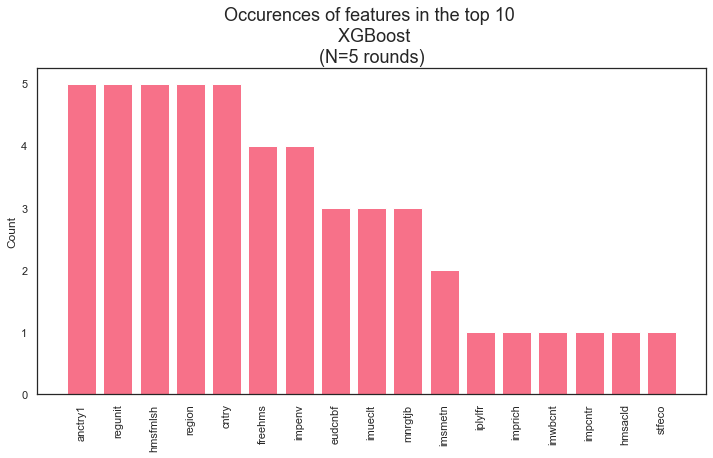

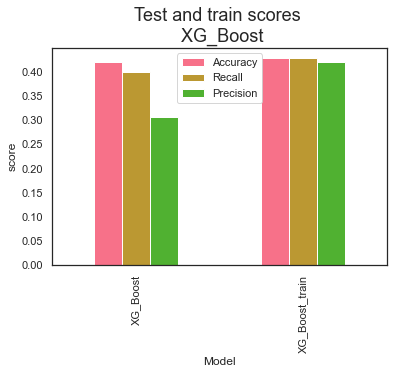

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.64      0.65      0.65      4985
           1       0.45      0.21      0.29      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.65      0.11       192

    accuracy                           0.47      8658
   macro avg       0.29      0.38      0.26      8658
weighted avg       0.53      0.47      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.63      0.64      0.63      4967
           1       0.43      0.22      0.29      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.52      0.46      0.47      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-score   support

           0       0.66      0.62      0.64      4903
           1       0.46      0.13      0.20      3176
           2       0.08      0.26      0.12       379
           3       0.06      0.56      0.10       200

    accuracy                           0.42      8658
   macro avg       0.31      0.39      0.27      8658
weighted avg       0.55      0.42      0.44      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.63      0.70      0.66      4901
           1       0.49      0.18      0.26      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.48      8658
   macro avg       0.30      0.36      0.26      8658
weighted avg       0.53      0.48      0.47      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.64      0.65      4959
           1       0.46      0.27      0.34      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.10       165

    accuracy                           0.48      8658
   macro avg       0.29      0.38      0.27      8658
weighted avg       0.54      0.48      0.50      8658
 



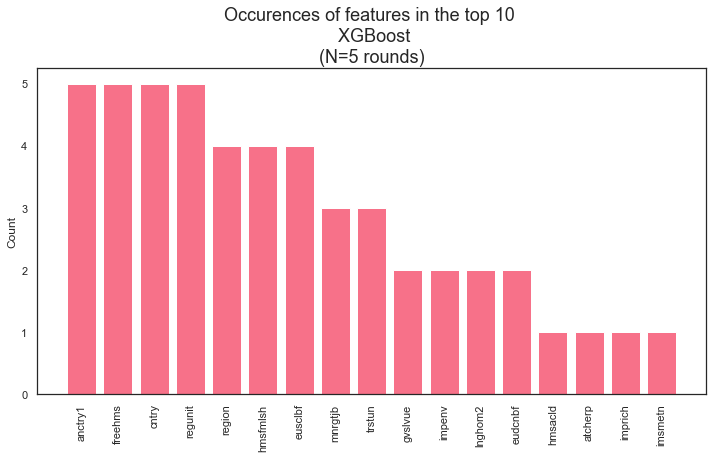

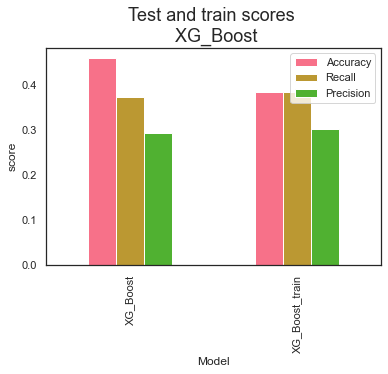

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      4967
           1       0.44      0.14      0.22      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.62      0.71      0.66      4903
           1       0.48      0.16      0.23      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.29      0.35      0.25      8658
weighted avg       0.53      0.47      0.46      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.49      0.16      0.24      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



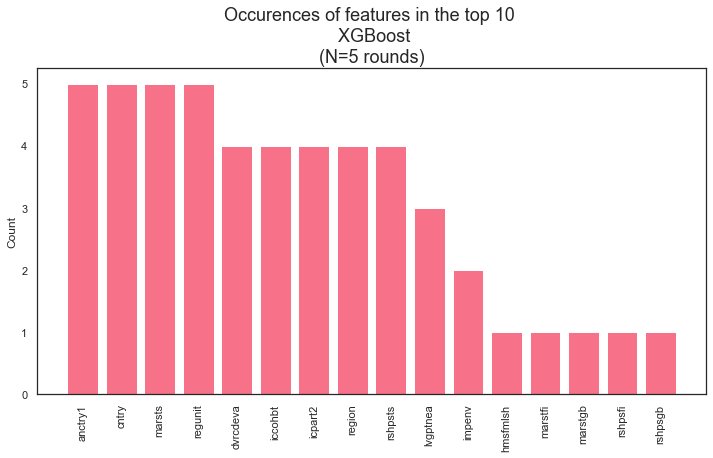

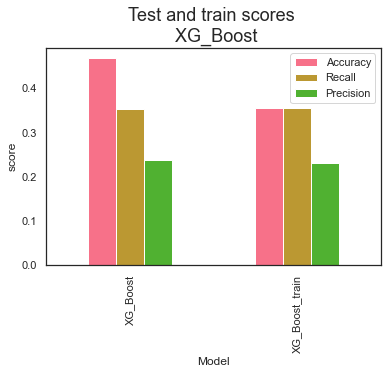

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.64      0.65      0.65      4985
           1       0.45      0.21      0.29      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.64      0.11       192

    accuracy                           0.47      8658
   macro avg       0.29      0.38      0.26      8658
weighted avg       0.53      0.47      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.63      0.63      0.63      4967
           1       0.43      0.22      0.29      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.45      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.52      0.45      0.47      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-score   support

           0       0.66      0.62      0.64      4903
           1       0.46      0.13      0.20      3176
           2       0.08      0.25      0.13       379
           3       0.06      0.56      0.10       200

    accuracy                           0.42      8658
   macro avg       0.31      0.39      0.27      8658
weighted avg       0.55      0.42      0.44      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.63      0.70      0.66      4901
           1       0.49      0.18      0.26      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.48      8658
   macro avg       0.30      0.36      0.26      8658
weighted avg       0.53      0.48      0.47      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.65      0.68      0.66      4959
           1       0.48      0.24      0.32      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.61      0.10       165

    accuracy                           0.49      8658
   macro avg       0.30      0.38      0.27      8658
weighted avg       0.55      0.49      0.50      8658
 



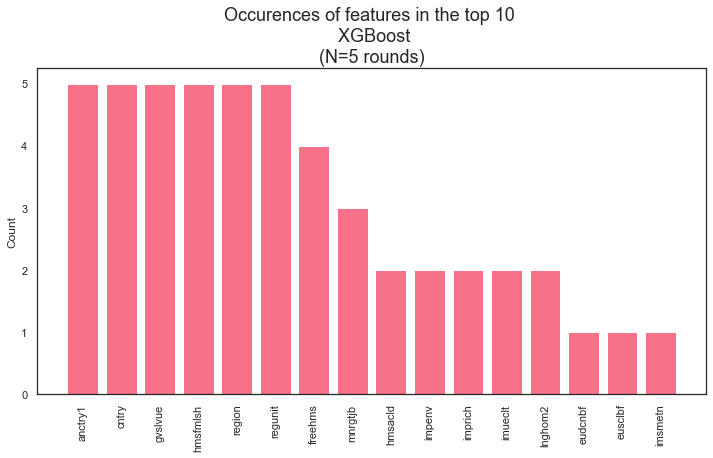

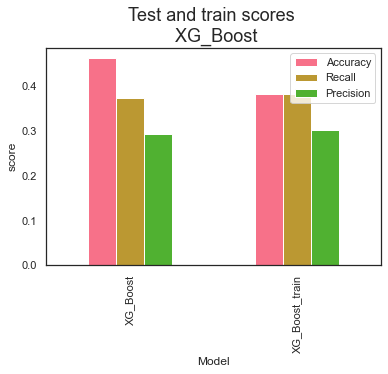

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



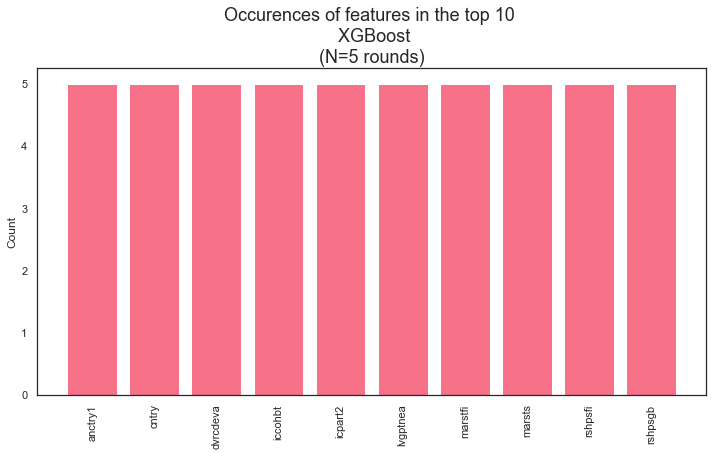

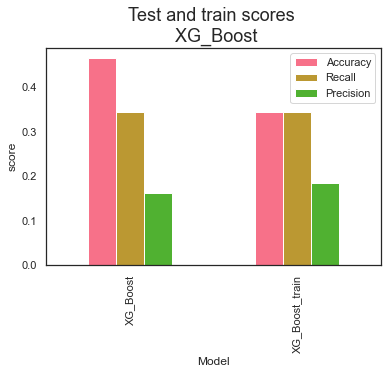

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.63      0.68      0.65      4985
           1       0.43      0.16      0.23      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.46      8658
   macro avg       0.28      0.37      0.25      8658
weighted avg       0.51      0.46      0.46      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.67      0.64      4967
           1       0.43      0.17      0.25      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.51      0.46      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.63      0.69      0.66      4903
           1       0.49      0.20      0.29      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.54      0.48      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.65      0.68      0.66      4959
           1       0.49      0.21      0.30      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.30      0.38      0.26      8658
weighted avg       0.55      0.48      0.49      8658
 



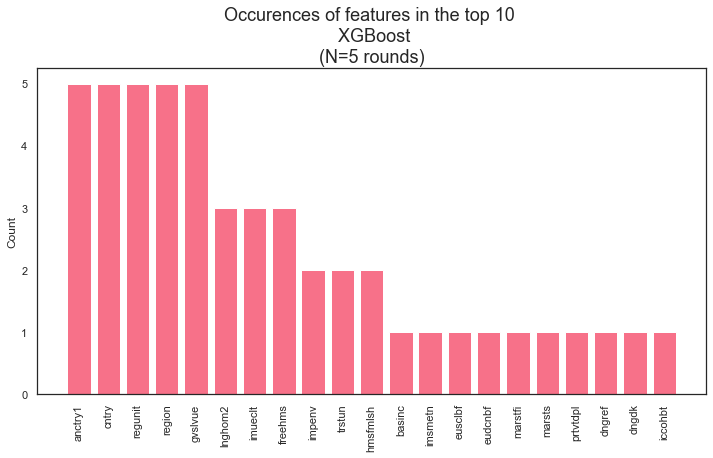

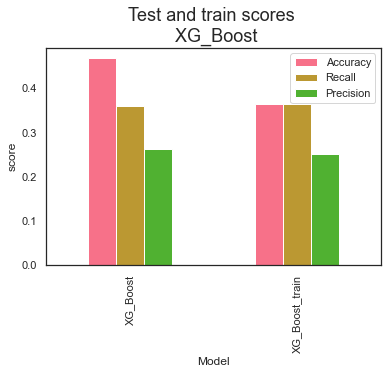

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.59      0.83      0.69      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.06      0.54      0.11       200

    accuracy                           0.48      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.33      0.48      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.59      0.83      0.69      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.06      0.58      0.10       165

    accuracy                           0.49      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.34      0.49      0.40      8658
 



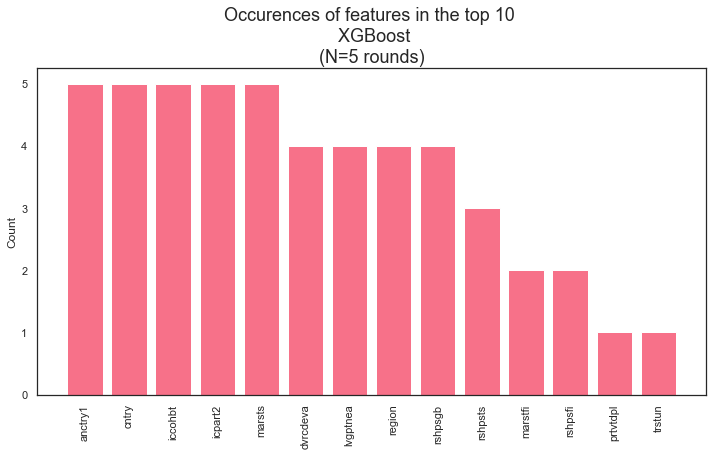

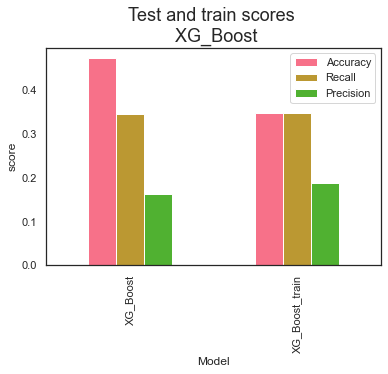

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.63      0.64      0.63      4967
           1       0.43      0.21      0.28      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.45      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.51      0.45      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.62      0.71      0.66      4903
           1       0.48      0.15      0.23      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.29      0.35      0.25      8658
weighted avg       0.53      0.47      0.46      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.48      0.16      0.25      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



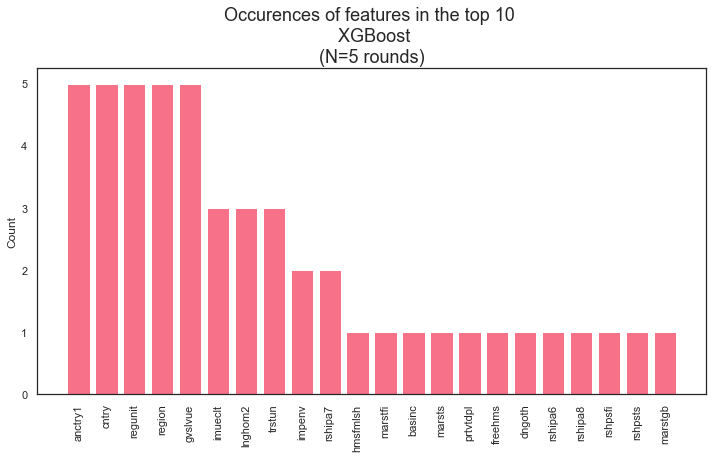

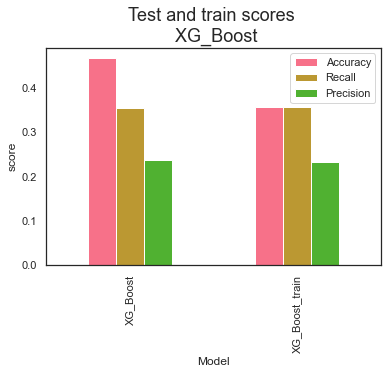

In [102]:
# select best combination (note: this changes every run, so outcome hardcoded below to make it stable over runs)
top_params = top_param(X_noclimate, y_zero, random_states, top_lr, True, values_list_lr)

In [103]:
top_params

{'reg_alpha': 170.0,
 'colsample_bytree': 0.8621060410596058,
 'reg_lambda': 0.6015850792125105,
 'gamma': 8.45102296642158,
 'min_child_weight': 3.0,
 'max_depth': 8}

In [104]:
#hardcode the outcome (exact combination varies every time)
top_params = {'min_child_weight': 10.0,
     'reg_lambda': 0.9946119084622124,
     'reg_alpha': 171.0,
     'gamma': 8.648813370421312,
     'max_depth': 5,
     'colsample_bytree': 0.900021558147567}

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.58      1.00      0.73      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.00      0.00      0.00       186

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.00      0.00      0.00       165

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 



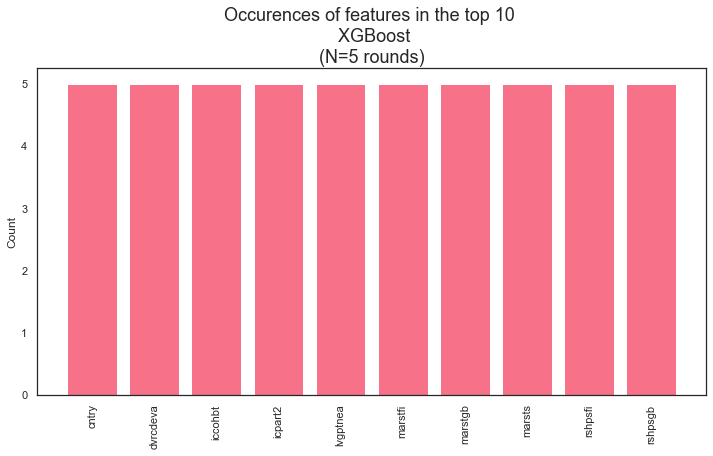

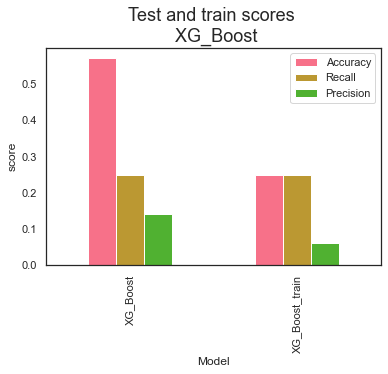

In [105]:
#run the model with the hyperparams
score_hp, feat_hp = XG_Boost(X_noclimate, y_zero, random_states, True, top_lr, top_params)

In [106]:
score_hp

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.570917,0.25,0.142729,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


The train and test accuracies are far apart and only the most occurring classes are predicted. Does not look good.

# Less countries
An approach to simplify things - and maybe improve performance - is to select smaller subsets of countries instead of all 22 at the same time. I'll go for two very different ones (NL_RU), two that might be similar (NL_DE), and a couple that might be similar (NL_DE_GB_FR_BE). 
Downside: the samplesize gets a lot smaller, which makes predictions more difficult.
Use both default and optimized params

648 648
Random state: 5 
               precision    recall  f1-score   support

         0.0       0.67      0.43      0.53       408
         1.0       0.43      0.33      0.37       293
         2.0       0.07      0.32      0.12        38
         3.0       0.14      0.42      0.21        48

    accuracy                           0.39       787
   macro avg       0.33      0.37      0.31       787
weighted avg       0.52      0.39      0.43       787
 

620 620
Random state: 12 
               precision    recall  f1-score   support

         0.0       0.65      0.46      0.54       384
         1.0       0.48      0.30      0.37       303
         2.0       0.12      0.40      0.18        45
         3.0       0.17      0.55      0.26        55

    accuracy                           0.40       787
   macro avg       0.36      0.43      0.34       787
weighted avg       0.52      0.40      0.43       787
 

648 648
Random state: 19 
               precision    recall  f1-score   

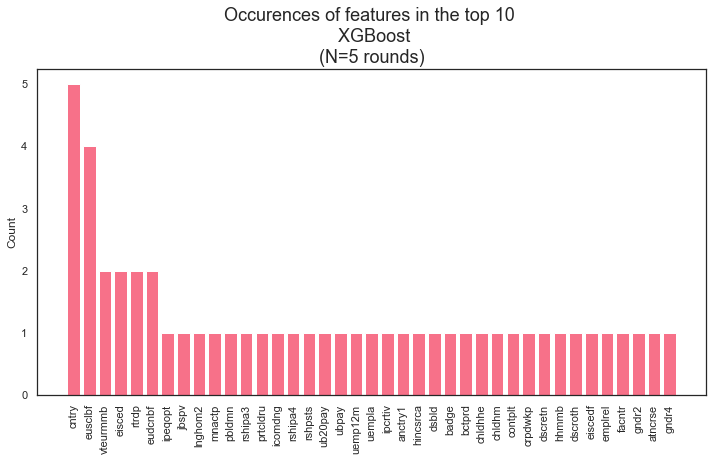

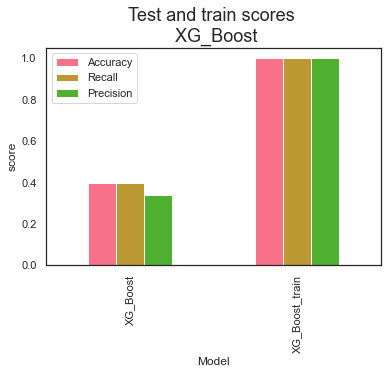

In [107]:
NL_RU_score_dflt, NL_RU_feat_dflt = XG_Boost(X_NL_RU_noclimate, y_NL_RU, random_states, True, 0.1, empty_dict) 

In [108]:
NL_RU_score_dflt #not very accurate either.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.39695,0.395432,0.341315,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.00000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


648 648


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         0.0       0.52      1.00      0.68       408
         1.0       0.00      0.00      0.00       293
         2.0       0.00      0.00      0.00        38
         3.0       0.00      0.00      0.00        48

    accuracy                           0.52       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.27      0.52      0.35       787
 

620 620


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         0.0       0.49      1.00      0.66       384
         1.0       0.00      0.00      0.00       303
         2.0       0.00      0.00      0.00        45
         3.0       0.00      0.00      0.00        55

    accuracy                           0.49       787
   macro avg       0.12      0.25      0.16       787
weighted avg       0.24      0.49      0.32       787
 

648 648


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         0.0       0.51      1.00      0.68       402
         1.0       0.00      0.00      0.00       302
         2.0       0.00      0.00      0.00        38
         3.0       0.00      0.00      0.00        45

    accuracy                           0.51       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.26      0.51      0.35       787
 

616 616


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         0.0       0.53      1.00      0.69       414
         1.0       0.00      0.00      0.00       273
         2.0       0.00      0.00      0.00        46
         3.0       0.00      0.00      0.00        54

    accuracy                           0.53       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.28      0.53      0.36       787
 

684 684


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         0.0       0.53      1.00      0.69       415
         1.0       0.00      0.00      0.00       294
         2.0       0.00      0.00      0.00        29
         3.0       0.00      0.00      0.00        49

    accuracy                           0.53       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.28      0.53      0.36       787
 



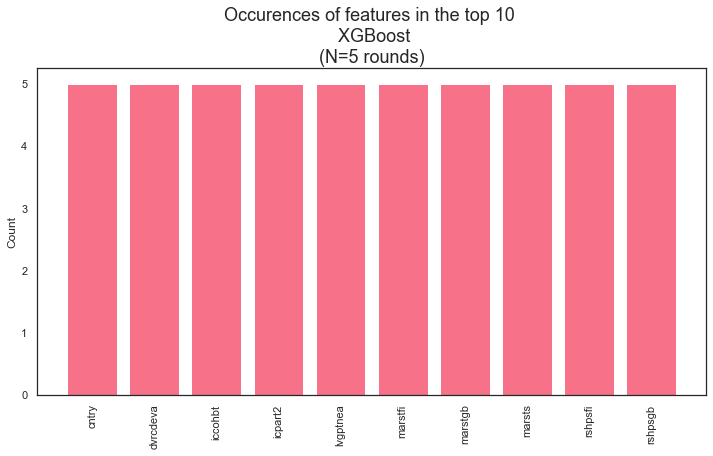

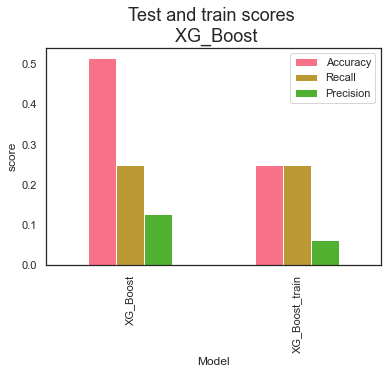

In [109]:
NL_RU_score, NL_RU_feat = XG_Boost(X_NL_RU_noclimate, y_NL_RU, random_states, True, top_lr, top_params) 

In [110]:
NL_RU_score #not very accurate either. Compared with all countries: not an improvement. 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.514104,0.25,0.128526,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


168 168
Random state: 5 
               precision    recall  f1-score   support

         0.0       0.69      0.26      0.37       566
         1.0       0.36      0.37      0.36       297
         2.0       0.01      0.07      0.02        30
         3.0       0.01      0.22      0.02         9

    accuracy                           0.29       902
   macro avg       0.27      0.23      0.19       902
weighted avg       0.55      0.29      0.36       902
 

160 160
Random state: 12 
               precision    recall  f1-score   support

         0.0       0.70      0.32      0.44       577
         1.0       0.33      0.25      0.28       288
         2.0       0.05      0.31      0.08        26
         3.0       0.02      0.36      0.03        11

    accuracy                           0.30       902
   macro avg       0.27      0.31      0.21       902
weighted avg       0.56      0.30      0.38       902
 

168 168
Random state: 19 
               precision    recall  f1-score   

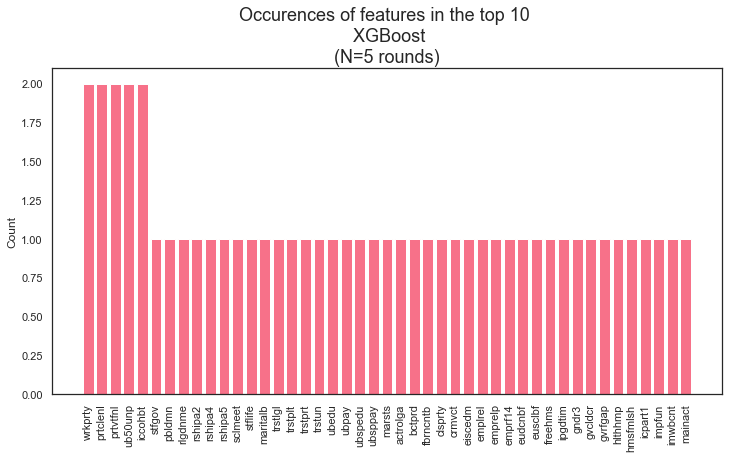

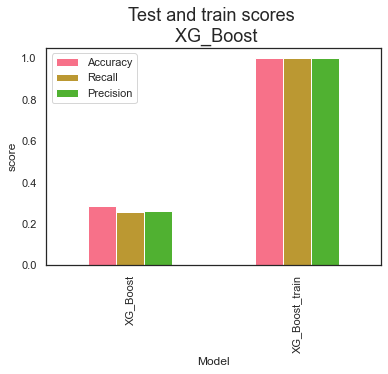

In [111]:
NL_DE_score_dflt, NL_DE_feat_dflt = XG_Boost(X_NL_DE_noclimate, y_NL_DE, random_states, True, 0.1, empty_dict)

In [112]:
NL_DE_score_dflt

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.287805,0.255942,0.261519,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.000000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


168 168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         0.0       0.63      1.00      0.77       566
         1.0       0.00      0.00      0.00       297
         2.0       0.00      0.00      0.00        30
         3.0       0.00      0.00      0.00         9

    accuracy                           0.63       902
   macro avg       0.16      0.25      0.19       902
weighted avg       0.39      0.63      0.48       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78       577
         1.0       0.00      0.00      0.00       288
         2.0       0.00      0.00      0.00        26
         3.0       0.00      0.00      0.00        11

    accuracy                           0.64       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.41      0.64      0.50       902
 

168 168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78       578
         1.0       0.00      0.00      0.00       288
         2.0       0.00      0.00      0.00        27
         3.0       0.00      0.00      0.00         9

    accuracy                           0.64       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.41      0.64      0.50       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         0.0       0.63      1.00      0.77       570
         1.0       0.00      0.00      0.00       282
         2.0       0.00      0.00      0.00        39
         3.0       0.00      0.00      0.00        11

    accuracy                           0.63       902
   macro avg       0.16      0.25      0.19       902
weighted avg       0.40      0.63      0.49       902
 

156 156


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         0.0       0.65      1.00      0.79       586
         1.0       0.00      0.00      0.00       273
         2.0       0.00      0.00      0.00        31
         3.0       0.00      0.00      0.00        12

    accuracy                           0.65       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.42      0.65      0.51       902
 



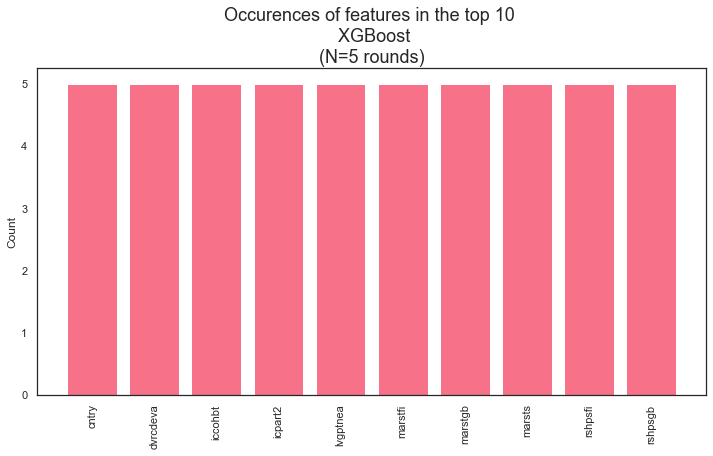

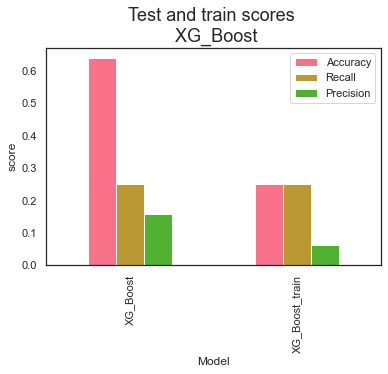

In [113]:
NL_DE_score, NL_DE_feat = XG_Boost(X_NL_DE_noclimate, y_NL_DE, random_states, True, top_lr, top_params) 

unusable: does not predict all classes

364 364
Random state: 5 
               precision    recall  f1-score   support

         0.0       0.73      0.35      0.47      1334
         1.0       0.34      0.30      0.32       637
         2.0       0.04      0.24      0.07        67
         3.0       0.01      0.25      0.02        16

    accuracy                           0.33      2054
   macro avg       0.28      0.28      0.22      2054
weighted avg       0.58      0.33      0.41      2054
 

356 356
Random state: 12 
               precision    recall  f1-score   support

         0.0       0.72      0.42      0.53      1261
         1.0       0.39      0.29      0.33       699
         2.0       0.05      0.28      0.09        76
         3.0       0.01      0.33      0.03        18

    accuracy                           0.37      2054
   macro avg       0.30      0.33      0.25      2054
weighted avg       0.58      0.37      0.44      2054
 

360 360
Random state: 19 
               precision    recall  f1-score   

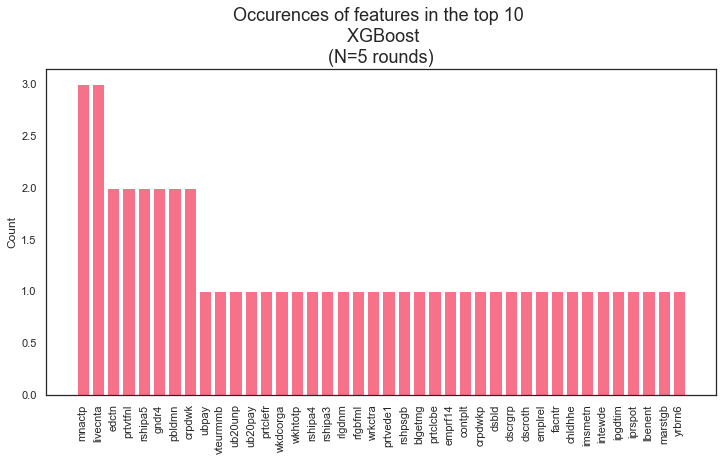

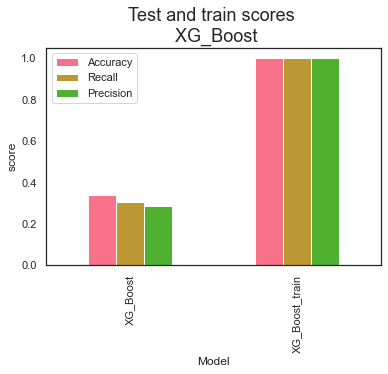

In [114]:
cntry5_score_dflt, cntry5_feat_dflt = XG_Boost(X_5cntry_noclimate, y_5cntry, random_states, True, 0.1, empty_dict)

In [115]:
cntry5_score_dflt

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.340214,0.305203,0.285209,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.000000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


364 364


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         0.0       0.65      1.00      0.79      1334
         1.0       0.00      0.00      0.00       637
         2.0       0.00      0.00      0.00        67
         3.0       0.00      0.00      0.00        16

    accuracy                           0.65      2054
   macro avg       0.16      0.25      0.20      2054
weighted avg       0.42      0.65      0.51      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         0.0       0.61      1.00      0.76      1261
         1.0       0.00      0.00      0.00       699
         2.0       0.00      0.00      0.00        76
         3.0       0.00      0.00      0.00        18

    accuracy                           0.61      2054
   macro avg       0.15      0.25      0.19      2054
weighted avg       0.38      0.61      0.47      2054
 

360 360


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         0.0       0.63      1.00      0.77      1295
         1.0       0.00      0.00      0.00       672
         2.0       0.00      0.00      0.00        70
         3.0       0.00      0.00      0.00        17

    accuracy                           0.63      2054
   macro avg       0.16      0.25      0.19      2054
weighted avg       0.40      0.63      0.49      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         0.0       0.62      1.00      0.77      1283
         1.0       0.00      0.00      0.00       678
         2.0       0.00      0.00      0.00        75
         3.0       0.00      0.00      0.00        18

    accuracy                           0.62      2054
   macro avg       0.16      0.25      0.19      2054
weighted avg       0.39      0.62      0.48      2054
 

336 336


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         0.0       0.65      1.00      0.79      1338
         1.0       0.00      0.00      0.00       620
         2.0       0.00      0.00      0.00        73
         3.0       0.00      0.00      0.00        23

    accuracy                           0.65      2054
   macro avg       0.16      0.25      0.20      2054
weighted avg       0.42      0.65      0.51      2054
 



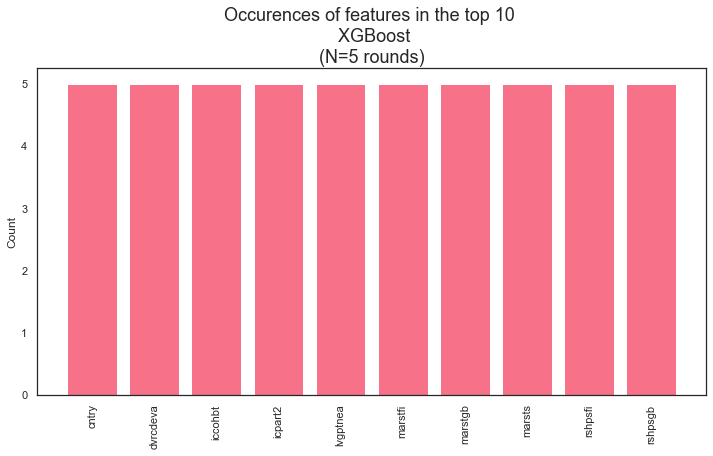

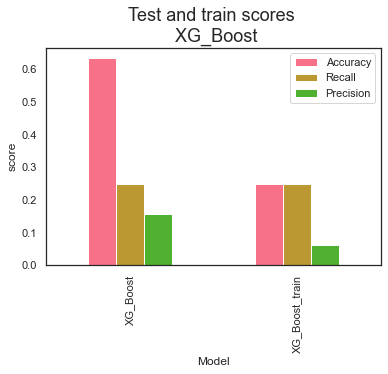

In [116]:
cntry5_score, cntry5_feat = XG_Boost(X_5cntry_noclimate, y_5cntry, random_states, True, top_lr, top_params) 

In [117]:
cntry5_score #deterioration

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.633982,0.25,0.158496,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


This approach does not seem particularly promising.

# Use y_worried
Yet another idea is that maybe 'do you think climate change is real' is not discriminatory enough. Maybe more difference lies in whether someone is worried about it or not. I'll therefore try if the model could explain this y better.

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.19      0.55      0.29       509
           1       0.32      0.35      0.34      1682
           2       0.60      0.32      0.42      3953
           3       0.36      0.31      0.34      1926
           4       0.16      0.52      0.25       461

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.20      0.60      0.30       502
           1       0.33      0.36      0.34      1732
           2       0.58      0.31      0.41      3921
           3       0.37      0.32      0.35      1944
           4       0.17      0.52      0.25       432

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg      

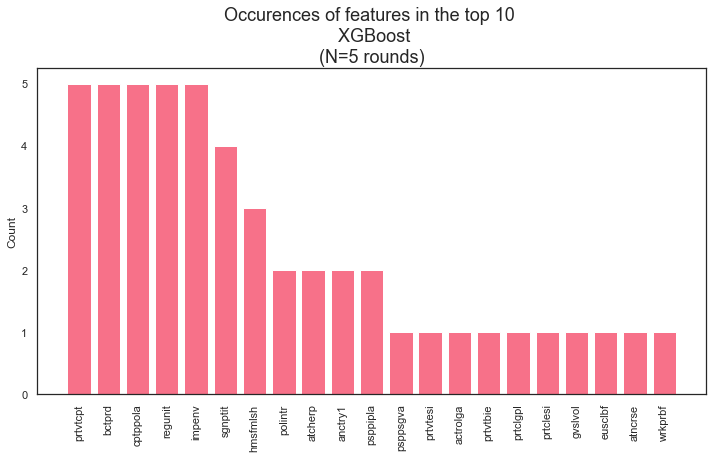

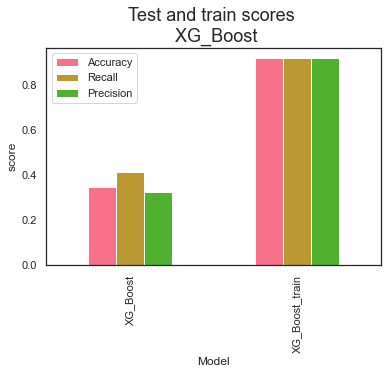

In [118]:
score_worried, feat_worried = XG_Boost(X_worried, y_worried, random_states, True, 0.1, empty_dict)

In [119]:
score_worried #pretty bad score! Try to tune learning rate and hyperparams anyway

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.346993,0.412267,0.325417,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.916437,0.916437,0.916829,"[5, 12, 19, 26, 33]"


## Tune learning rate

In [120]:
# #takes very long to run. Outcome is stored in CSV
# lr_worried = tune_learning(X_worried, y_worried, 7, True, learning_rates, empty_dict)

In [121]:
# lr_worried.sort_values(by="Accuracy_test", ascending=False).head(20)

In [122]:
#store in CSV as it takes long to run
# lr_worried.to_csv('./data/lr_worried.csv', index=False)

In [123]:
lr_worried = pd.read_csv('./data/lr_worried.csv')

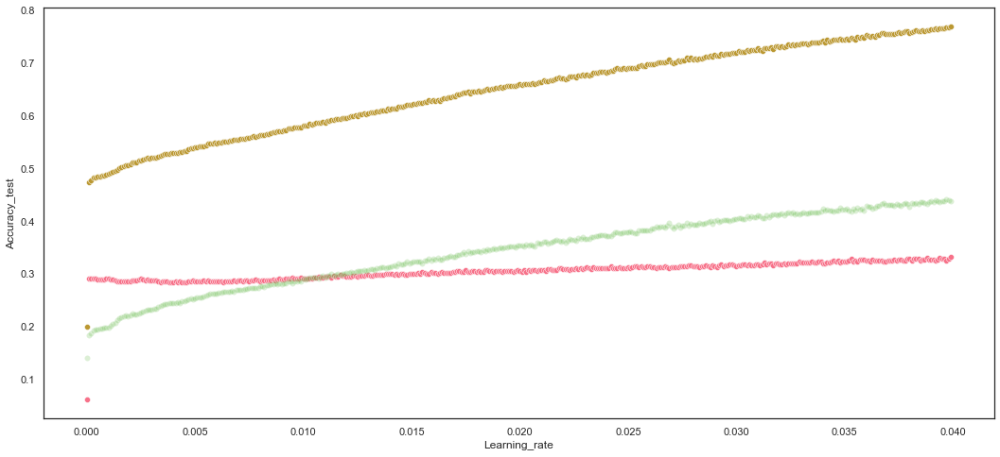

In [124]:
fig, ax = plt.subplots(figsize=(18,8))
sns.scatterplot(data=lr_worried, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=lr_worried, x="Learning_rate", y="Accuracy_train") #brown
sns.scatterplot(data=lr_worried, x="Learning_rate", y="acc_distance", alpha=0.2) #green
plt.show();

In [125]:
lr_worried.sort_values(by="Accuracy_test", ascending=False) 

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance
399,0.331380,0.405524,0.319387,0.768641,0.768641,0.768569,0.0399,0.437261
388,0.329973,0.404570,0.318044,0.761534,0.761534,0.761171,0.0388,0.431561
394,0.329856,0.403198,0.317990,0.765482,0.765482,0.765212,0.0394,0.435626
353,0.328801,0.404621,0.318799,0.746531,0.746531,0.746443,0.0353,0.417730
396,0.328684,0.403997,0.317452,0.765482,0.765482,0.765409,0.0396,0.436799
395,0.328332,0.402320,0.316827,0.765933,0.765933,0.765601,0.0395,0.437601
380,0.328098,0.400809,0.316921,0.755668,0.755668,0.755453,0.0380,0.427571
384,0.328098,0.405739,0.317292,0.760519,0.760519,0.760232,0.0384,0.432421
398,0.327746,0.401776,0.315971,0.766497,0.766497,0.766276,0.0398,0.438752
379,0.327746,0.403417,0.316971,0.759504,0.759504,0.759183,0.0379,0.431758


The accuracy on the test set are all far from perfect. The accuracy doesnt divert much in the top 10 highest accuracy_test scores. Around the learning rate of zero, the difference between test and train scores get smaller, but the accuracy of the test set decreases aswell. As trial and error shows that tuning the hyperparameters can counter the overtraining pretty well, I'll choose the learning rate from the top_ten highest accuracies, and take the one with the lowest distance between test&train scores.

In [126]:
top_10 = lr_worried.sort_values(by="Accuracy_test", ascending=False).head(10) 
top_lr_worried = top_10.sort_values(by="acc_distance", ascending=True).head(1).Learning_rate
top_lr_worried = float(top_lr_worried)
top_lr_worried

0.035300000000000005

In [127]:
# hardcode it
top_lr_worried=0.0353

## Tune hyperparameters

In [128]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [129]:
space['learning_rate']= top_lr_worried

In [130]:
#### run the same model 10 times
dicts = {}

keys = ["learning_rate", "colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:34,  2.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:33,  2.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5486255486255486                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:42,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:39,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:38,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:37,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:34,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5455070455070455                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:41,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:39,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:37,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:36,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:33,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:42,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:38,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:36,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:34,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:32,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:31,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:29,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:29,  2.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:29,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:30,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:09<00:30,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:30,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:29,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:28,  2.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:27,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:11<00:28,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:28,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5281820281820282                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:35,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:32,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:27,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5501270501270501                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:31,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:29,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5333795333795334                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:35,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:31,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:28,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:26,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:25,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:24,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:23,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:22,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:21,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5434280434280434                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:26,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:24,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:23,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:21,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:20,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:19,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:18,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:17,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:16,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:25<00:15,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:15,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5564795564795565                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:20,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:18,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:27<00:16,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:15,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:14,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:13,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:29<00:13,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:12,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5244860244860244                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:15,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5449295449295449                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:18,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:15,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:13,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:12,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:10,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:10,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:10,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:09,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5457380457380457                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:10,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:09,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.532917532917533                                                                                                      
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:09,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:07,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:06,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:04,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:41<00:03,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:42<00:01,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:34,  2.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:34,  2.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:33,  2.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:34,  2.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:35,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5403095403095403                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:44,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.542966042966043                                                                                                      
  8%|███▊                                           | 8/100 [00:03<00:50,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:45,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:42,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:40,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5470085470085471                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:46,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:41,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:37,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:35,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:34,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:33,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:31,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:30,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5373065373065373                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:37,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:36,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:36,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:34,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:32,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:31,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5459690459690459                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:39,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:31,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:39,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:35,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:32,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:30,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:28,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:28,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:26,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:26,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5444675444675444                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:32,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:37,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:32,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:28,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:26,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:24,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:24,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:23,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:22,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:21,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:20,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:20,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:20,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:19,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:18,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5348810348810349                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:22,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:21,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:20,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:18,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:16,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:15,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:15,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:14,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:13,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:13,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:13,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:13,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:12,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:11,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:11,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:10,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:10,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:10,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:09,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:09,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:08,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:36<00:08,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:08,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:37<00:07,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:07,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:06,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:06,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:05,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:05,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:04,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:41<00:03,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:01,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:35,  2.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:34,  2.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:49,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:44,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:40,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:37,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:49,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:45,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:40,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:37,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:35,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:35,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5525525525525525                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:45,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:40,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:37,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:34,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:32,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:33,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:33,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:32,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:31,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:30,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:31,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:30,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:29,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:28,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:28,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:28,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:27,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:26,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:26,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:26,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:26,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:25,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:24,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:24,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:24,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:24,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:23,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:22,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5354585354585355                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:27,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:26,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:24,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:23,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:22,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:21,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:20,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:20,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:19,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:19,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:18,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:17,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5420420420420421                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:22,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:20,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:19,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:17,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:16,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:15,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:15,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:14,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:13,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:12,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:12,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:11,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:11,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:11,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:10,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:10,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:09,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:11,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:10,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:09,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:08,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:08,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:07,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:06,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:38<00:05,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:04,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:41<00:03,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:02,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5341880341880342                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:02,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5393855393855393                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:01,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:36,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:35,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5466620466620467                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:44,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:40,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5473550473550474                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:47,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:44,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:41,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:38,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:36,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:34,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:32,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:32,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:32,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:31,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:38,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:35,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:32,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:32,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:31,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:31,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:31,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:30,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:29,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:30,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:29,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.532917532917533                                                                                                      
 29%|█████████████▎                                | 29/100 [00:12<00:38,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:32,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:29,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:29,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:24,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:31,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:28,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5419265419265419                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:32,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:35,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:31,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:28,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:25,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:23,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:23,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:22,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:21,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5377685377685377                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:25,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:23,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:22,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:19,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:18,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:17,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:16,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:16,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:16,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:16,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:15,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:14,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:14,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:17,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:16,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:12,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:12,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:11,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5341880341880342                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:15,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:13,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:12,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:11,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:10,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:10,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:11,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:10,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:08,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:07,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:07,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:06,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:37<00:06,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:05,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:38<00:05,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:38<00:05,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5359205359205359                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:05,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:04,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:40<00:03,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5527835527835527                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:42<00:01,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:35,  2.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5501270501270501                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:44,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:41,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:39,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:38,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5237930237930238                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:47,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:42,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:40,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:37,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:36,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:34,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:34,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:33,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:32,  2.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:31,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:31,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:06<00:31,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5375375375375375                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:39,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5527835527835527                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:42,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:38,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:35,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:34,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:32,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:31,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:30,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:29,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:29,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:28,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:28,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:27,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:27,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:27,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:27,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:26,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:15<00:25,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:24,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:16<00:24,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:24,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:17<00:23,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:17<00:22,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:23,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:18<00:22,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5373065373065373                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:28,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:26,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:24,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:20<00:23,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:21,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:20,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5441210441210441                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:25,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:22<00:22,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:20,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:19,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:18,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:24<00:17,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5323400323400324                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:21,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5449295449295449                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:24,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:21,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:19,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:17,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:16,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:15,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:14,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:13,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:12,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:12,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:30<00:11,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:11,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:31<00:11,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:10,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:10,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:09,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:33<00:09,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:34<00:08,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:35<00:07,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:07,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:35<00:07,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:36<00:06,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:36<00:06,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:37<00:05,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:37<00:05,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5597135597135597                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:38<00:06,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:38<00:05,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:39<00:04,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:39<00:04,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:40<00:03,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:40<00:03,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:40<00:02,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:41<00:02,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:41<00:01,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:42<00:01,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:42<00:00,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:43<00:00,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:36,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:37,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:34,  2.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:34,  2.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:34,  2.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:34,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:02<00:34,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:33,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 10%|████▌                                         | 10/100 [00:04<00:41,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5243705243705243                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:51,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5311850311850311                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:56,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:49,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:43,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:40,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:37,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5444675444675444                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:46,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:40,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:36,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:33,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:33,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:32,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:32,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:32,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:31,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:29,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:29,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:29,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:29,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:29,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:28,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:27,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:26,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:27,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:26,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:26,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:25,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:25,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:25,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:24,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:23,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:23,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:23,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:22,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:22,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:22,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:21,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:20,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:20,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:20,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:22<00:19,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:19,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:23<00:17,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:24<00:17,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5426195426195426                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:22,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:19,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:18,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:26<00:17,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:16,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:27<00:16,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:15,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:14,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:14,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:29<00:13,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:13,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:30<00:12,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:11,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:31<00:11,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:10,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:10,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:32<00:10,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:33<00:09,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:34<00:08,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:34<00:08,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:07,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:35<00:07,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:36<00:06,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:36<00:06,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:37<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:37<00:05,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:37<00:05,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:38<00:04,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:38<00:04,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:39<00:03,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:39<00:03,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:40<00:03,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:40<00:02,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:41<00:02,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:41<00:01,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:41<00:01,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:42<00:00,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:42<00:00,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:37,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:36,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:36,  2.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:34,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:33,  2.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:03<00:34,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:33,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:34,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:04<00:34,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:32,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:05<00:31,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5393855393855393                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:42,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:06<00:39,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:37,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:34,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5347655347655348                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:42,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:39,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:36,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:35,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:34,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:31,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:31,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:31,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:29,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:29,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:28,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:28,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:28,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:28,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:26,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:25,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5403095403095403                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:33,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:30,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:27,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:27,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:25,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:24,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:24,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:22,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:21,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:22,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:21,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:21,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:20,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5256410256410257                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:25,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:23,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:21,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:21,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:19,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:18,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:17,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5446985446985447                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:21,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:19,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:18,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:16,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:16,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:15,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:14,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:13,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5578655578655579                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:16,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:14,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:13,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:12,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:11,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:10,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5319935319935319                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:13,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:12,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:10,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:09,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:09,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:08,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:07,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:07,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:06,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:06,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:05,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:38<00:05,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:04,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:41<00:03,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:42<00:01,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:38,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:36,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5455070455070455                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:48,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:54,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:48,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:43,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:40,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:37,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:38,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:36,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:35,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:34,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:33,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5378840378840379                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:42,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:39,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5457380457380457                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:47,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:41,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:37,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5464310464310465                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:44,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:38,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:37,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:34,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:33,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:31,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:31,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:30,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:29,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:28,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:27,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:27,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:27,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:26,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:27,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:26,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:25,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:25,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:25,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:24,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:23,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:23,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:22,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:22,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:22,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:22,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5263340263340264                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:27,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:25,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:24,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:22,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:21,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:20,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:19,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:19,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:19,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:19,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:17,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:17,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:16,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:16,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:15,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:15,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:27<00:14,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:14,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:14,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:13,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:13,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:12,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:30<00:12,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:11,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:31<00:11,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:11,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:10,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:32<00:09,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:33<00:09,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:34<00:08,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:34<00:07,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:07,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:35<00:06,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:36<00:06,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:36<00:06,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:37<00:05,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:37<00:05,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:37<00:05,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:38<00:04,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:38<00:04,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:39<00:03,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:39<00:03,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:39<00:02,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:40<00:02,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:40<00:02,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:41<00:01,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:41<00:01,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:42<00:00,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:42<00:00,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5463155463155464                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5264495264495265                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:18,  1.26trial/s, best loss: -0.5264495264495265]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:05,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:56,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:49,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:44,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:41,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.546084546084546                                                                                                      
  7%|███▎                                           | 7/100 [00:03<00:49,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5404250404250405                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:55,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:48,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:43,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:39,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:37,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:36,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:35,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:33,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:32,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:31,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:32,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:31,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:31,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:31,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:30,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:30,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:30,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:30,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:30,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:29,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:30,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:29,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:29,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:39,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:36,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:33,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:31,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:29,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:36,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:33,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:31,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:29,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:27,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:26,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:25,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:23,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:23,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5292215292215292                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:29,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:27,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5420420420420421                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:30,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:27,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:25,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:24,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:22,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:21,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:19,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:18,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5441210441210441                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:23,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:21,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:19,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:19,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:17,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:15,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:14,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:13,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:13,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:13,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:12,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:12,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:11,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:11,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5362670362670363                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:13,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5453915453915454                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:15,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:13,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:11,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5522060522060522                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:12,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:11,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:09,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:08,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:07,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:40<00:05,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:05,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:04,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:04,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:42<00:03,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:02,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:44<00:01,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:36,  2.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:36,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:34,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:35,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:34,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5285285285285285                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:46,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:41,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:50,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:44,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:40,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:39,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:36,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:35,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:34,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:32,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5408870408870409                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:41,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:38,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:36,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:35,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:34,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:32,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:31,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:31,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:30,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:28,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:29,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:28,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:27,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:26,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:27,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:26,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:26,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:25,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:24,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:24,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:24,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:23,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:23,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:23,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:22,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:22,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5232155232155232                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:28,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:26,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:24,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:22,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:21,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:20,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:19,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:19,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:18,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:17,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:17,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:16,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:16,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:16,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:15,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:14,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:14,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:13,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:13,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:12,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:12,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:12,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:11,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:11,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:10,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:10,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:09,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5384615384615384                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:10,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:08,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:08,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:07,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:37<00:06,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:07,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:06,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:05,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:04,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:41<00:03,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5341880341880342                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:02,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5464310464310465                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:01,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:45<00:00,  2.20trial/s, best loss: -0.5777315777315777]


8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.15      0.59      0.24       509
           1       0.26      0.29      0.27      1682
           2       0.54      0.15      0.24      3953
           3       0.31      0.27      0.29      1926
           4       0.13      0.53      0.21       461

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.25      0.26      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.59      0.24       502
           1       0.30      0.33      0.32      1732
           2       0.58      0.19      0.28      3921
           3       0.32      0.26      0.29      1944
           4       0.13      0.55      0.21       432

    accuracy                           0.28      8531
   macro avg       0.30      0.38      0.27      8531
weighted avg      

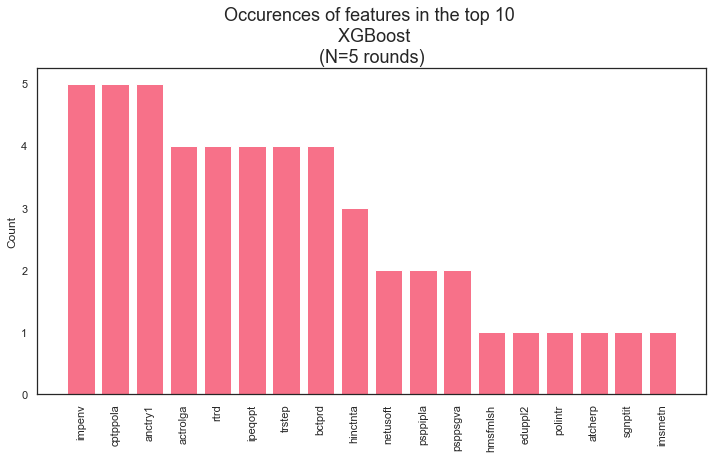

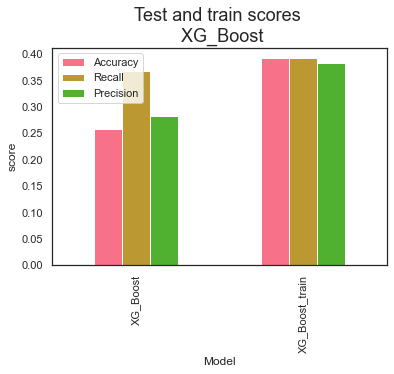

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       509
           1       0.25      0.28      0.26      1682
           2       0.52      0.06      0.11      3953
           3       0.29      0.30      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.22      8531
weighted avg       0.37      0.21      0.19      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.62      0.23       502
           1       0.26      0.35      0.30      1732
           2       0.17      0.00      0.00      3921
           3       0.28      0.30      0.29      1944
           4       0.12      0.56      0.20       432

    accuracy                           0.20      8531
   macro avg       0.20      0.37      0.20      8531
weighted avg      

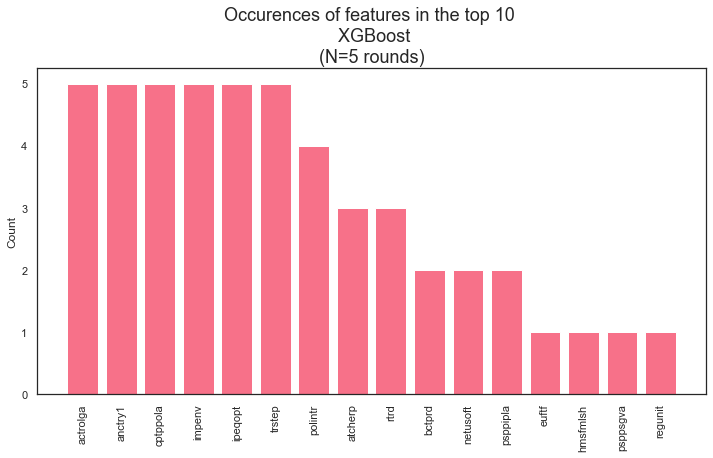

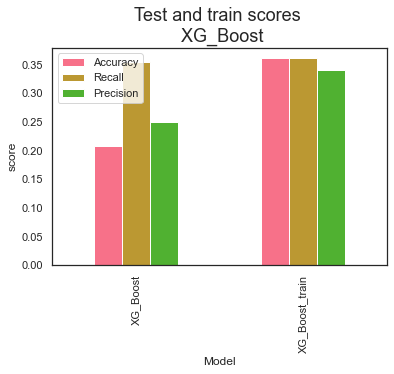

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.13      0.60      0.21       509
           1       0.24      0.26      0.25      1682
           2       0.50      0.04      0.08      3953
           3       0.29      0.29      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.20      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.20      0.18      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.65      0.23       502
           1       0.27      0.32      0.29      1732
           2       0.55      0.01      0.01      3921
           3       0.28      0.31      0.29      1944
           4       0.12      0.57      0.20       432

    accuracy                           0.20      8531
   macro avg       0.27      0.37      0.21      8531
weighted avg      

C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.58      0.20       487
           1       0.26      0.31      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.29      0.28      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.19      8531
   macro avg       0.16      0.35      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8735 8735
Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       484
           1       0.26      0.30      0.28      1671
           2       0.56      0.03      0.05      4015
           3       0.28      0.31      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.20      8531
   macro avg       0.27      0.36      0.21      8531
weighted avg       0.39    

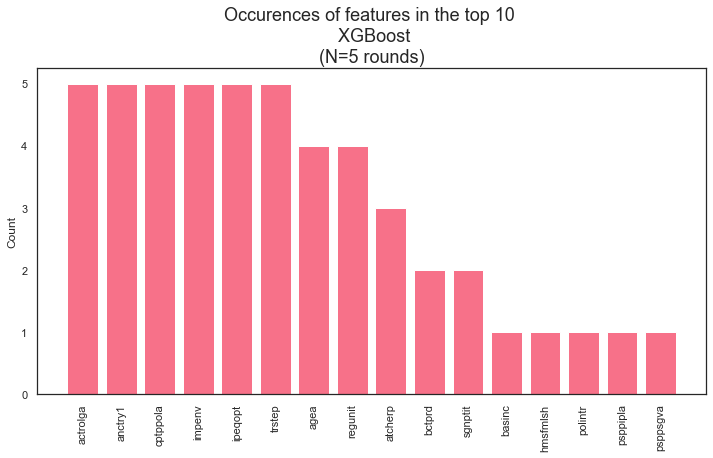

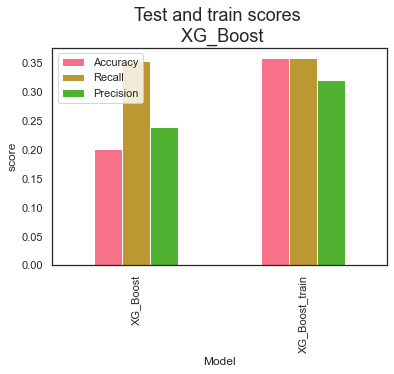

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.59      0.23       509
           1       0.25      0.29      0.26      1682
           2       0.54      0.10      0.17      3953
           3       0.30      0.29      0.29      1926
           4       0.13      0.53      0.20       461

    accuracy                           0.23      8531
   macro avg       0.27      0.36      0.23      8531
weighted avg       0.38      0.23      0.22      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.61      0.23       502
           1       0.26      0.35      0.30      1732
           2       0.53      0.04      0.07      3921
           3       0.29      0.28      0.29      1944
           4       0.13      0.56      0.21       432

    accuracy                           0.22      8531
   macro avg       0.27      0.37      0.22      8531
weighted avg      

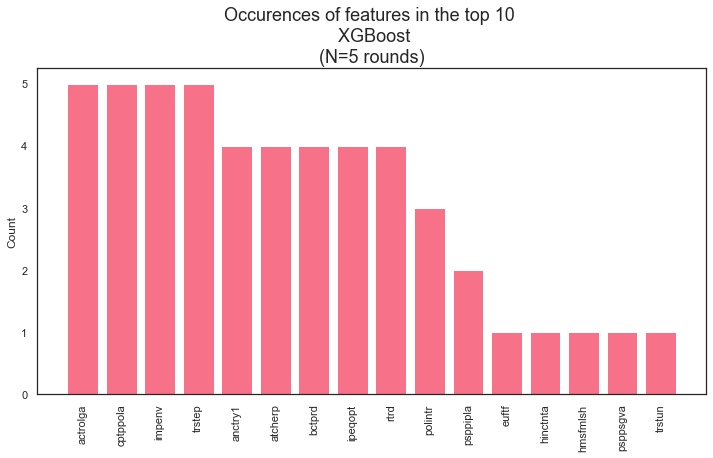

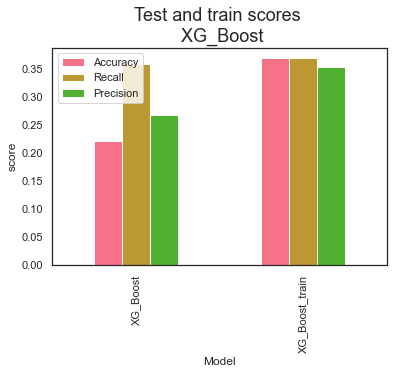

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       509
           1       0.25      0.28      0.27      1682
           2       0.52      0.08      0.14      3953
           3       0.30      0.28      0.29      1926
           4       0.13      0.54      0.21       461

    accuracy                           0.22      8531
   macro avg       0.27      0.35      0.22      8531
weighted avg       0.37      0.22      0.21      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.64      0.23       502
           1       0.27      0.34      0.30      1732
           2       0.56      0.03      0.06      3921
           3       0.29      0.31      0.30      1944
           4       0.13      0.56      0.21       432

    accuracy                           0.22      8531
   macro avg       0.28      0.37      0.22      8531
weighted avg      

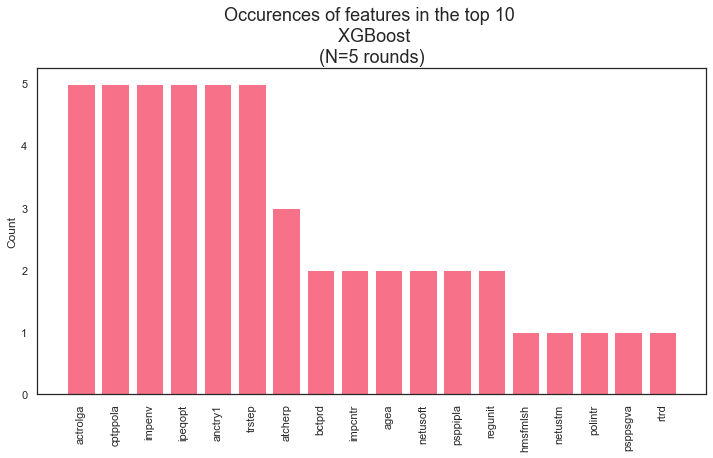

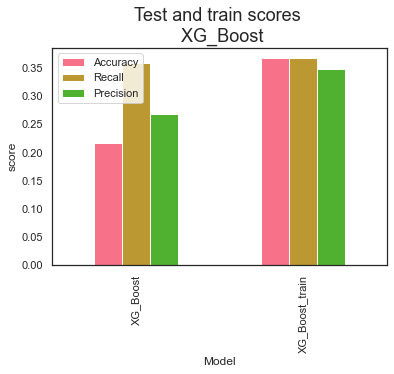

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.13      0.60      0.21       509
           1       0.24      0.25      0.24      1682
           2       0.50      0.05      0.09      3953
           3       0.29      0.29      0.29      1926
           4       0.12      0.54      0.19       461

    accuracy                           0.20      8531
   macro avg       0.26      0.34      0.21      8531
weighted avg       0.36      0.20      0.18      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.13      0.64      0.22       502
           1       0.25      0.32      0.28      1732
           2       0.00      0.00      0.00      3921
           3       0.28      0.27      0.28      1944
           4       0.12      0.56      0.20       432

    accuracy                           0.19      8531
   macro avg       0.16      0.36      0.20      8531
weighted avg       0.13      0.19      0.14      8531
 

8885 8885
Random state: 19 
               precision    recall  f1-score   support

           0       0.13      0.57      0.21       511
           1       0.27      0.27      0.27      1771
           2       0.45      0.03      0.05      3901
           3       0.29      0.32      0.30      1932
           4       0.10      0.50      0.17       416

    accuracy                           0.20      8531
   macro avg       0.25      0.34      0.20      8531
weighted avg       0.34    

C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.59      0.19       487
           1       0.25      0.31      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.26      0.26      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.19      8531
   macro avg       0.15      0.35      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8735 8735
Random state: 33 
               precision    recall  f1-score   support

           0       0.12      0.59      0.20       484
           1       0.26      0.29      0.27      1671
           2       0.57      0.02      0.03      4015
           3       0.28      0.31      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.20      8531
   macro avg       0.27      0.35      0.20      8531
weighted avg       0.40    

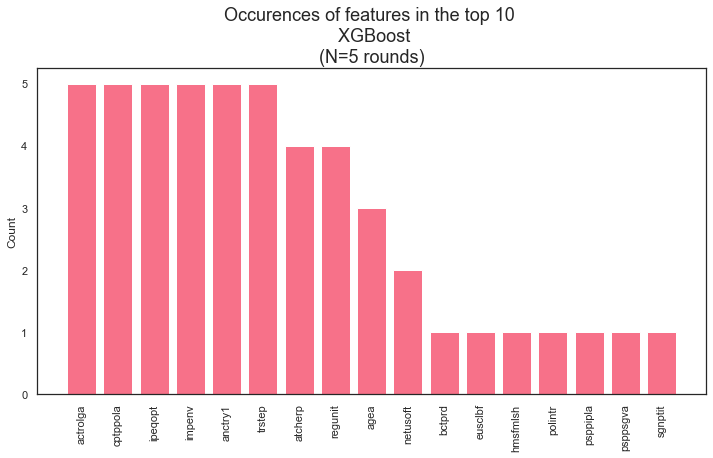

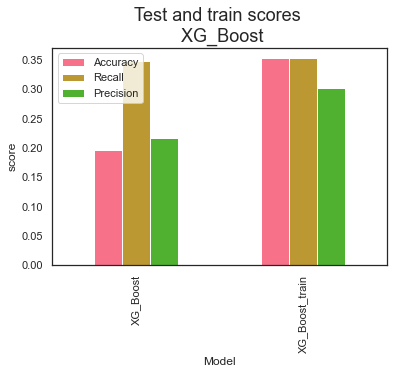

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       509
           1       0.25      0.29      0.27      1682
           2       0.52      0.06      0.11      3953
           3       0.29      0.29      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.22      8531
   macro avg       0.26      0.35      0.22      8531
weighted avg       0.37      0.22      0.20      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.61      0.23       502
           1       0.26      0.34      0.30      1732
           2       0.58      0.02      0.05      3921
           3       0.29      0.30      0.30      1944
           4       0.12      0.56      0.20       432

    accuracy                           0.21      8531
   macro avg       0.28      0.37      0.21      8531
weighted avg      

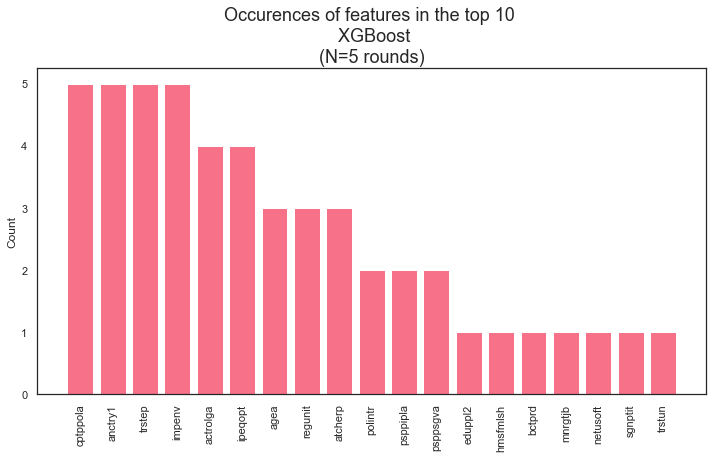

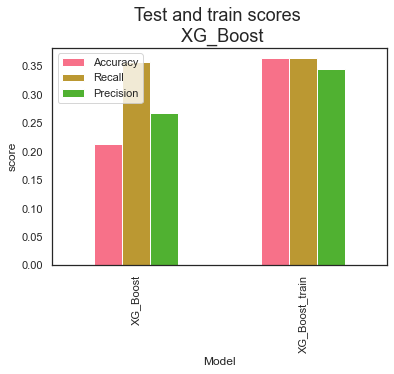

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.13      0.61      0.21       509
           1       0.24      0.25      0.24      1682
           2       0.48      0.04      0.07      3953
           3       0.28      0.29      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.20      8531
   macro avg       0.25      0.35      0.20      8531
weighted avg       0.35      0.20      0.17      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.13      0.64      0.22       502
           1       0.26      0.31      0.28      1732
           2       0.00      0.00      0.00      3921
           3       0.28      0.29      0.29      1944
           4       0.12      0.56      0.20       432

    accuracy                           0.20      8531
   macro avg       0.16      0.36      0.20      8531
weighted avg      

C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.61      0.20       487
           1       0.26      0.26      0.26      1734
           2       0.00      0.00      0.00      3937
           3       0.26      0.31      0.28      1897
           4       0.13      0.56      0.21       476

    accuracy                           0.19      8531
   macro avg       0.15      0.35      0.19      8531
weighted avg       0.12      0.19      0.14      8531
 

8735 8735
Random state: 33 
               precision    recall  f1-score   support

           0       0.12      0.60      0.21       484
           1       0.25      0.29      0.27      1671
           2       0.55      0.00      0.01      4015
           3       0.28      0.32      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.19      8531
   macro avg       0.27      0.36      0.20      8531
weighted avg       0.38    

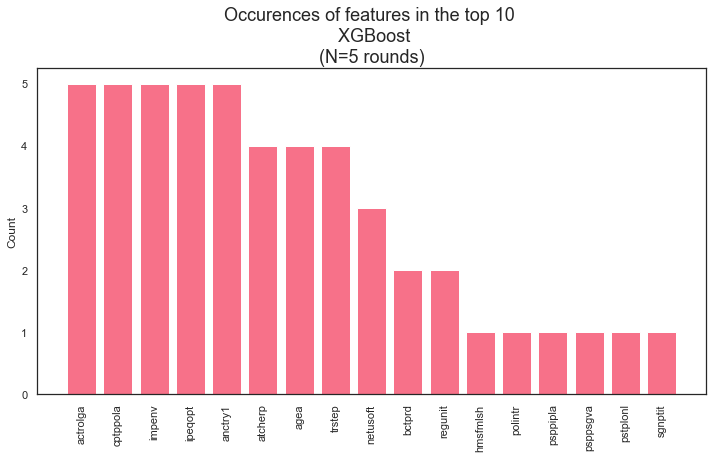

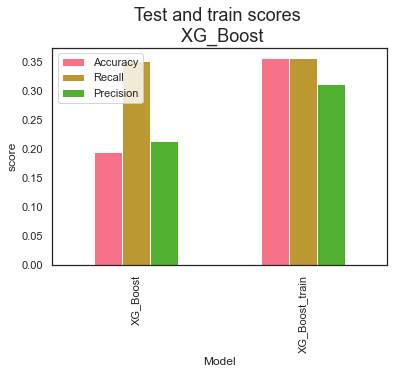

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.58      0.25       509
           1       0.28      0.30      0.29      1682
           2       0.57      0.24      0.34      3953
           3       0.33      0.26      0.29      1926
           4       0.14      0.51      0.22       461

    accuracy                           0.29      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.41      0.29      0.31      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.16      0.61      0.25       502
           1       0.31      0.32      0.32      1732
           2       0.59      0.26      0.36      3921
           3       0.34      0.27      0.30      1944
           4       0.15      0.54      0.23       432

    accuracy                           0.31      8531
   macro avg       0.31      0.40      0.29      8531
weighted avg      

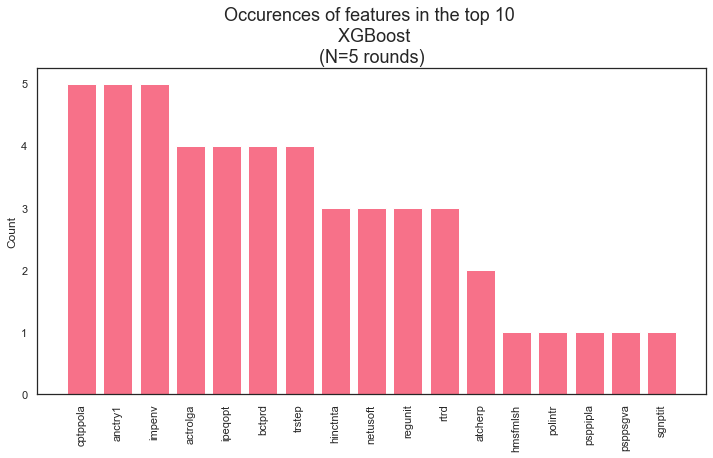

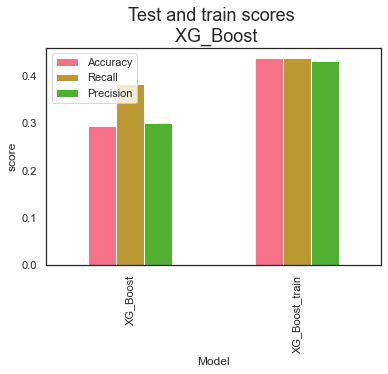

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.11      0.57      0.19       509
           1       0.20      0.43      0.27      1682
           2       0.00      0.00      0.00      3953
           3       0.00      0.00      0.00      1926
           4       0.11      0.55      0.19       461

    accuracy                           0.15      8531
   macro avg       0.08      0.31      0.13      8531
weighted avg       0.05      0.15      0.07      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.11      0.61      0.19       502
           1       0.20      0.43      0.27      1732
           2       0.00      0.00      0.00      3921
           3       0.00      0.00      0.00      1944
           4       0.12      0.59      0.19       432

    accuracy                           0.15      8531
   macro avg       0.09      0.32      0.13      8531
weighted avg       0.05      0.15      0.08      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.12      0.58      0.19       511
           1       0.25      0.29      0.27      1771
           2       0.00      0.00      0.00      3901
           3       0.30      0.27      0.29      1932
           4       0.10      0.52      0.17       416

    accuracy                           0.18      8531
   macro avg       0.15      0.33      0.18      8531
weighted avg       0.13      0.18      0.14      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.11      0.59      0.18       487
           1       0.26      0.30      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.23      0.25      1897
           4       0.12      0.58      0.20       476

    accuracy                           0.18      8531
   macro avg       0.15      0.34      0.18      8531
weighted avg       0.13      0.18      0.13      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.11      0.59      0.19       484
           1       0.25      0.27      0.26      1671
           2       0.50      0.25      0.34      4015
           3       0.00      0.00      0.00      1915
           4       0.12      0.58      0.20       446

    accuracy                           0.23      8531
   macro avg       0.20      0.34      0.20      8531
weighted avg       0.30      0.23      0.23      8531
 



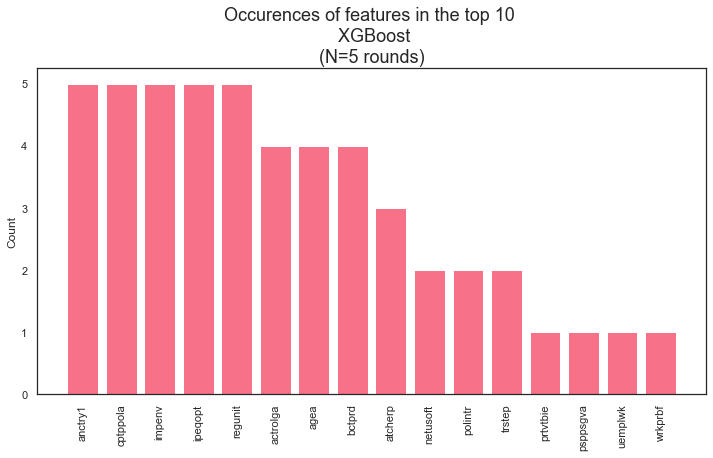

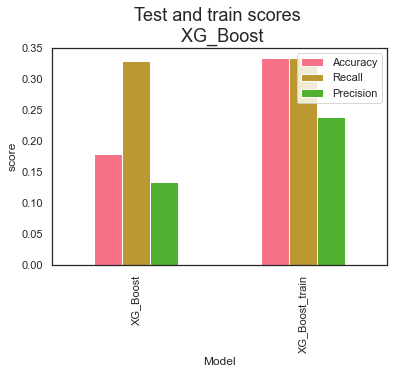

In [131]:
top_params_worried = top_param(X_worried, y_worried, random_states, top_lr_worried, True, values_list_lr)

In [132]:
top_params_worried

{'reg_alpha': 63.0,
 'colsample_bytree': 0.6621217765193472,
 'reg_lambda': 0.33562194174593896,
 'gamma': 1.6159011236059184,
 'min_child_weight': 2.0,
 'max_depth': 9}

In [133]:
#hardcode it (the exact combination that surfaces changes everytime)
top_params_worried = {'reg_alpha': 51.0,
                     'colsample_bytree': 0.7448776001568639,
                     'reg_lambda': 0.08157034197253088,
                     'gamma': 2.9071690320897217,
                     'min_child_weight': 3.0,
                     'max_depth': 15
                     }

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.59      0.25       509
           1       0.28      0.29      0.29      1682
           2       0.57      0.24      0.34      3953
           3       0.33      0.25      0.29      1926
           4       0.14      0.52      0.22       461

    accuracy                           0.29      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.41      0.29      0.30      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.59      0.24       502
           1       0.30      0.33      0.31      1732
           2       0.59      0.22      0.32      3921
           3       0.34      0.26      0.30      1944
           4       0.14      0.55      0.23       432

    accuracy                           0.29      8531
   macro avg       0.30      0.39      0.28      8531
weighted avg      

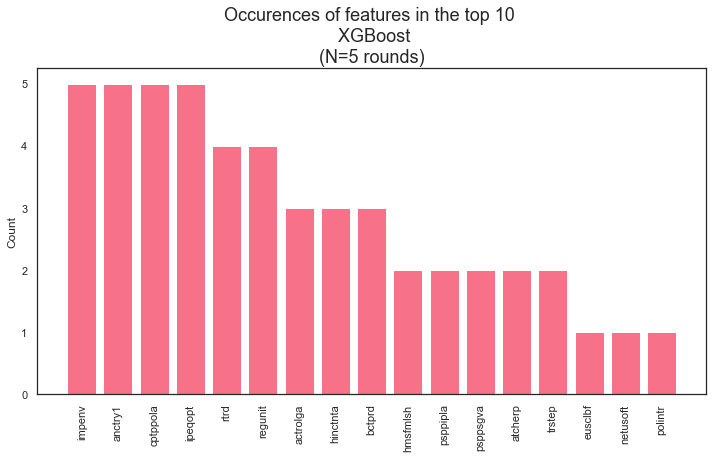

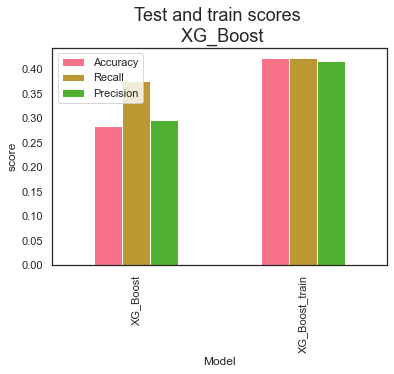

In [134]:
worried_score, worried_feat = XG_Boost(X_worried, y_worried,random_states, True, top_lr_worried, top_params_worried)

In [135]:
worried_score

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.283789,0.377080,0.295791,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.422715,0.422715,0.416738,"[5, 12, 19, 26, 33]"


In [136]:
worried_feat.groupby("feature").mean()

,indices,importance
feature,,
actrolga,9,0.022596
anctry1,316,0.014566
atcherp,107,0.015206
bctprd,52,0.011905
cptppola,11,0.047419
eusclbf,180,0.012169
hinctnta,281,0.015951
hmsfmlsh,89,0.012500
impenv,336,0.026493


The model is less overtrained, but the test accuracy score also deteriorated. Try if it works better when I tune learning rate and hyperparameters at the same time. (NOTE: runtime is very long, I therefore cancelled out the cells. Outcome hardcoded below):

In [137]:
# X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

# undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
# X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [138]:
# #### run the same model 10 times: takes very long to run! Hardcoded the outcome below
# dicts = {}

# keys = ["learning_rate", "colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
# values_list_lr = []

# for i in range(10):
#     trials = Trials()
#     best_params = fmin(fn = objective, 
#                        space = space_lr,
#                        algo = tpe.suggest,
#                        max_evals = 100,
#                        trials = trials)
#     values_list_lr.append(best_params)

In [139]:
# top_params_worried2 = top_param_lr(X_worried, y_worried, random_states, True, values_list_lr)

In [140]:
# top_params_worried2

hardcode the topparams, as the code takes very long to run.

In [141]:
top_params_worried2 = {'min_child_weight': 0.0,
 'reg_lambda': 0.17178766734019035,
 'learning_rate': 0.08170000000000001,
 'reg_alpha': 47.0,
 'gamma': 2.35468635546526,
 'max_depth': 14,
 'colsample_bytree': 0.6961528843012084}

8660 8660
Random state: 5 
               precision    recall  f1-score   support

           0       0.17      0.61      0.26       509
           1       0.29      0.29      0.29      1682
           2       0.58      0.25      0.35      3953
           3       0.33      0.27      0.30      1926
           4       0.15      0.54      0.23       461

    accuracy                           0.30      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.30      0.31      8531
 

8805 8805
Random state: 12 
               precision    recall  f1-score   support

           0       0.16      0.62      0.26       502
           1       0.31      0.33      0.32      1732
           2       0.59      0.25      0.35      3921
           3       0.35      0.28      0.31      1944
           4       0.15      0.55      0.24       432

    accuracy                           0.31      8531
   macro avg       0.31      0.40      0.29      8531
weighted avg      

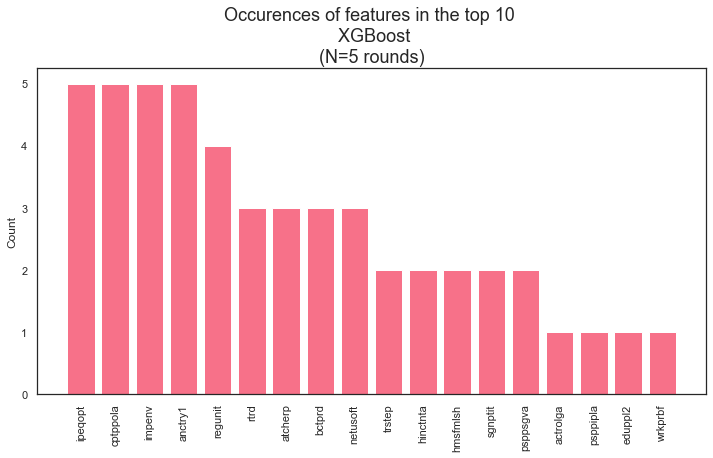

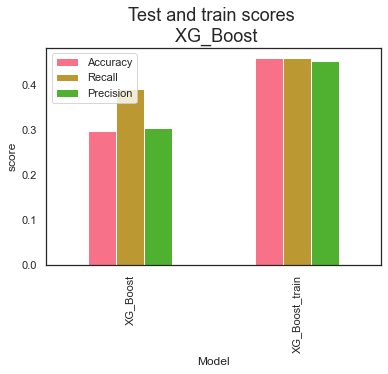

In [142]:
score_worried2, feat_worried2 = XG_Boost_lr(X_worried, y_worried, random_states, True, top_params_worried2)

In [143]:
score_worried2 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.298910,0.391791,0.304479,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.459882,0.459882,0.453937,"[5, 12, 19, 26, 33]"


Pretty horrible scores..

# Drop features by importance
Seeing this all doesn't work out, I return to the original mode: x_noclimate and y_zero. Maybe there are just too many features for the model to choose from resulting in more noise than the model can handle. Below, features are dropped one by one, hoping the accuracy will increase/decrease parabola-wise.

Use top_lr (learning rate) to get a ranking of feature importance. Do not use top_params, as when you use both, it will no longer predict all classes (the max score is obtained by just picking the largest class over-and-over). Use this ranking-dataframe to drop features one-by-one (starting at the lowest importance).

In [144]:
#TRAIN_TEST_SPLIT
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 5) #split data

#UNDERSAMPLE
undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
X_train = X_train_under
y_train = y_train_under

#ASSEMBLE & FIT MODEL
model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss',
                          learning_rate = top_lr, use_label_encoder = False)
result = model.fit(X_train, y_train)

#PREDICT Y
y_pred = result.predict(X_test)
y_pred_train = result.predict(X_train) 


#feature importances 
feature_names = [f'{X_train.columns[j]}' for j in range(X_train.shape[1])] #get the names

importances = model.feature_importances_ #array of importances of all features. no indices or whatever, just importances
importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df       
importance_df["feature"] = X_train.columns

importance_df = importance_df.sort_values(by="importance", ascending=True).reset_index()
print(importance_df.head())
print(importance_df.tail())

   level_0  index  importance  feature
0      257    257         0.0  icpdwrk
1      194    194         0.0    gndr7
2      195    195         0.0    gndr8
3      196    196         0.0    gndr9
4      197    197         0.0   gndr10
     level_0  index  importance  feature
337      336    336    0.005687   impenv
338       96     96    0.007034  imueclt
339      340    340    0.008187  regunit
340       88     88    0.013421  freehms
341      316    316    0.018078  anctry1


In [145]:
#store the dataframe in csv, as I might need it. 
importance_df.to_csv('./data/importance_df_dropping.csv', index=False) #cancel out to keep it constant over runs!

#import the csv again if needed
# importance_df = pd.read_csv('./data/importance_df_dropping.csv')

In [146]:
#again use top_params and top_lr
#keep cutting off features:

#lists for performances on test set
recall_XGBoost = []
accuracy_XGBoost = []
precision_XGBoost = [] 

#lists for performances on test set
recall_XGBoost_train = []
accuracy_XGBoost_train = []
precision_XGBoost_train = []


for i in range(len(X_noclimate.columns)-1): 
    print("I'm working on round", (i+1))
    to_drop = list(importance_df.loc[0:i,"feature"]) #list with features to drop, starting at the lowest importances
    X_dropping = X_noclimate.drop(to_drop, axis = 1)
    
    
    #TRAIN_TEST_SPLIT
    X_train, X_test, y_train, y_test = train_test_split(X_dropping, y_zero, test_size=0.2, shuffle=True, random_state = len(X_noclimate.columns)) #split data

    #UNDERSAMPLE
    undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=5)
    X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
    X_train = X_train_under
    y_train = y_train_under

    #ASSEMBLE & FIT MODEL
    model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss',
                          learning_rate = top_lr, use_label_encoder = False)
    result = model.fit(X_train, y_train)

    #PREDICT Y
    y_pred = result.predict(X_test)
    y_pred_train = result.predict(X_train) 

    print("Columns left:", len(X_dropping.columns), "\n", 
              classification_report(y_test, y_pred, labels=None, target_names=None),
              "\n====================================================\n")
    
    #accuracy, recall and precision on test set
    accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
    recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
    precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))

    #accuracy, recall and precision on train set
    accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
    recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
    precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))


I'm working on round 1
341
Columns lef: 341 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.34      0.13       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 2
340
Columns lef: 340 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.34      0.13       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 3
339
Columns

Columns lef: 325 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.34      0.13       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 18
324
Columns lef: 324 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.34      0.13       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 19
323
Columns lef: 323 
              

Columns lef: 309 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.33      0.13       382
           3       0.08      0.54      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 34
308
Columns lef: 308 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.33      0.13       382
           3       0.08      0.54      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 35
307
Columns lef: 307 
              

Columns lef: 293 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4931
           1       0.43      0.33      0.38      3146
           2       0.09      0.34      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 50
292
Columns lef: 292 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.08      0.33      0.13       382
           3       0.07      0.52      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 51
291
Columns lef: 291 
              

Columns lef: 277 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4931
           1       0.43      0.34      0.38      3146
           2       0.08      0.33      0.13       382
           3       0.07      0.51      0.12       199

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 66
276
Columns lef: 276 
               precision    recall  f1-score   support

           0       0.72      0.47      0.57      4931
           1       0.43      0.34      0.38      3146
           2       0.08      0.33      0.13       382
           3       0.07      0.51      0.12       199

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 67
275
Columns lef: 275 
              

Columns lef: 261 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.33      0.37      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.51      0.12       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 82
260
Columns lef: 260 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.32      0.37      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.52      0.12       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 83
259
Columns lef: 259 
              

Columns lef: 245 
               precision    recall  f1-score   support

           0       0.72      0.49      0.58      4931
           1       0.44      0.33      0.38      3146
           2       0.08      0.33      0.13       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

I'm working on round 98
244
Columns lef: 244 
               precision    recall  f1-score   support

           0       0.72      0.49      0.58      4931
           1       0.44      0.33      0.37      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.54      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.57      0.42      0.48      8658
 

I'm working on round 99
243
Columns lef: 243 
              

Columns lef: 229 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.44      0.33      0.38      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

I'm working on round 114
228
Columns lef: 228 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.44      0.34      0.38      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.52      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.57      0.42      0.48      8658
 

I'm working on round 115
227
Columns lef: 227 
            

Columns lef: 213 
               precision    recall  f1-score   support

           0       0.71      0.48      0.57      4931
           1       0.43      0.32      0.37      3146
           2       0.08      0.35      0.14       382
           3       0.07      0.49      0.12       199

    accuracy                           0.42      8658
   macro avg       0.32      0.41      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 130
212
Columns lef: 212 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.43      0.32      0.37      3146
           2       0.09      0.36      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 131
211
Columns lef: 211 
            

Columns lef: 197 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.43      0.33      0.37      3146
           2       0.09      0.38      0.15       382
           3       0.08      0.55      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 146
196
Columns lef: 196 
               precision    recall  f1-score   support

           0       0.72      0.48      0.57      4931
           1       0.43      0.32      0.37      3146
           2       0.09      0.36      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 147
195
Columns lef: 195 
            

Columns lef: 181 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.44      0.32      0.37      3146
           2       0.09      0.37      0.14       382
           3       0.07      0.51      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 162
180
Columns lef: 180 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4931
           1       0.45      0.32      0.37      3146
           2       0.09      0.38      0.14       382
           3       0.08      0.54      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 163
179
Columns lef: 179 
            

Columns lef: 165 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.44      0.33      0.38      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 178
164
Columns lef: 164 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4931
           1       0.44      0.33      0.37      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 179
163
Columns lef: 163 
            

Columns lef: 149 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4931
           1       0.44      0.32      0.37      3146
           2       0.09      0.34      0.14       382
           3       0.07      0.52      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 194
148
Columns lef: 148 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4931
           1       0.43      0.31      0.36      3146
           2       0.08      0.33      0.13       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 195
147
Columns lef: 147 
            

Columns lef: 133 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4931
           1       0.43      0.30      0.35      3146
           2       0.08      0.32      0.13       382
           3       0.07      0.55      0.13       199

    accuracy                           0.41      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.56      0.41      0.47      8658
 

I'm working on round 210
132
Columns lef: 132 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4931
           1       0.44      0.32      0.37      3146
           2       0.08      0.34      0.13       382
           3       0.08      0.54      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 211
131
Columns lef: 131 
            

Columns lef: 117 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4931
           1       0.44      0.31      0.37      3146
           2       0.08      0.34      0.13       382
           3       0.08      0.55      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 226
116
Columns lef: 116 
               precision    recall  f1-score   support

           0       0.70      0.49      0.58      4931
           1       0.43      0.31      0.36      3146
           2       0.09      0.34      0.14       382
           3       0.07      0.53      0.13       199

    accuracy                           0.42      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.56      0.42      0.47      8658
 

I'm working on round 227
115
Columns lef: 115 
            

Columns lef: 101 
               precision    recall  f1-score   support

           0       0.70      0.48      0.57      4931
           1       0.42      0.30      0.35      3146
           2       0.08      0.32      0.13       382
           3       0.08      0.55      0.13       199

    accuracy                           0.41      8658
   macro avg       0.32      0.41      0.30      8658
weighted avg       0.56      0.41      0.46      8658
 

I'm working on round 242
100
Columns lef: 100 
               precision    recall  f1-score   support

           0       0.70      0.49      0.57      4931
           1       0.42      0.31      0.35      3146
           2       0.08      0.32      0.13       382
           3       0.08      0.57      0.14       199

    accuracy                           0.42      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.56      0.42      0.46      8658
 

I'm working on round 243
99
Columns lef: 99 
              

Columns lef: 85 
               precision    recall  f1-score   support

           0       0.70      0.49      0.57      4931
           1       0.41      0.29      0.34      3146
           2       0.08      0.33      0.13       382
           3       0.08      0.56      0.13       199

    accuracy                           0.41      8658
   macro avg       0.32      0.42      0.29      8658
weighted avg       0.55      0.41      0.46      8658
 

I'm working on round 258
84
Columns lef: 84 
               precision    recall  f1-score   support

           0       0.70      0.49      0.57      4931
           1       0.41      0.29      0.34      3146
           2       0.08      0.32      0.13       382
           3       0.08      0.56      0.13       199

    accuracy                           0.41      8658
   macro avg       0.32      0.42      0.29      8658
weighted avg       0.55      0.41      0.46      8658
 

I'm working on round 259
83
Columns lef: 83 
               pr

Columns lef: 69 
               precision    recall  f1-score   support

           0       0.71      0.50      0.59      4931
           1       0.44      0.31      0.37      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.54      0.13       199

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.57      0.43      0.48      8658
 

I'm working on round 274
68
Columns lef: 68 
               precision    recall  f1-score   support

           0       0.71      0.50      0.59      4931
           1       0.43      0.31      0.36      3146
           2       0.09      0.34      0.14       382
           3       0.07      0.56      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 275
67
Columns lef: 67 
               pr

Columns lef: 53 
               precision    recall  f1-score   support

           0       0.72      0.50      0.59      4931
           1       0.43      0.29      0.35      3146
           2       0.09      0.36      0.14       382
           3       0.08      0.55      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 290
52
Columns lef: 52 
               precision    recall  f1-score   support

           0       0.72      0.51      0.59      4931
           1       0.44      0.29      0.35      3146
           2       0.09      0.35      0.14       382
           3       0.07      0.55      0.13       199

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

I'm working on round 291
51
Columns lef: 51 
               pr

Columns lef: 37 
               precision    recall  f1-score   support

           0       0.72      0.51      0.60      4931
           1       0.44      0.29      0.35      3146
           2       0.08      0.35      0.13       382
           3       0.07      0.54      0.13       199

    accuracy                           0.43      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.43      0.48      8658
 

I'm working on round 306
36
Columns lef: 36 
               precision    recall  f1-score   support

           0       0.71      0.51      0.60      4931
           1       0.45      0.29      0.35      3146
           2       0.08      0.36      0.14       382
           3       0.08      0.54      0.13       199

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.30      8658
weighted avg       0.57      0.43      0.48      8658
 

I'm working on round 307
35
Columns lef: 35 
               pr

Columns lef: 21 
               precision    recall  f1-score   support

           0       0.72      0.52      0.60      4931
           1       0.45      0.29      0.35      3146
           2       0.08      0.34      0.13       382
           3       0.08      0.57      0.13       199

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.43      0.48      8658
 

I'm working on round 322
20
Columns lef: 20 
               precision    recall  f1-score   support

           0       0.72      0.52      0.60      4931
           1       0.45      0.29      0.35      3146
           2       0.09      0.35      0.14       382
           3       0.08      0.57      0.13       199

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.43      0.48      8658
 

I'm working on round 323
19
Columns lef: 19 
               pr

Columns lef: 5 
               precision    recall  f1-score   support

           0       0.70      0.49      0.58      4931
           1       0.42      0.28      0.34      3146
           2       0.07      0.31      0.12       382
           3       0.07      0.52      0.12       199

    accuracy                           0.41      8658
   macro avg       0.32      0.40      0.29      8658
weighted avg       0.56      0.41      0.46      8658
 

I'm working on round 338
4
Columns lef: 4 
               precision    recall  f1-score   support

           0       0.68      0.47      0.56      4931
           1       0.42      0.23      0.30      3146
           2       0.07      0.33      0.11       382
           3       0.06      0.55      0.11       199

    accuracy                           0.38      8658
   macro avg       0.31      0.39      0.27      8658
weighted avg       0.55      0.38      0.43      8658
 

I'm working on round 339
3
Columns lef: 3 
               precisi

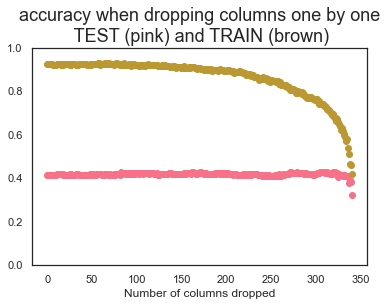

In [147]:
plt.scatter(y=accuracy_XGBoost, x=range(len(accuracy_XGBoost)))
plt.scatter(y=accuracy_XGBoost_train, x=range(len(accuracy_XGBoost)))
plt.title("accuracy when dropping columns one by one\n TEST (pink) and TRAIN (brown)")
plt.xlabel("Number of columns dropped")
plt.ylim(0, 1); 

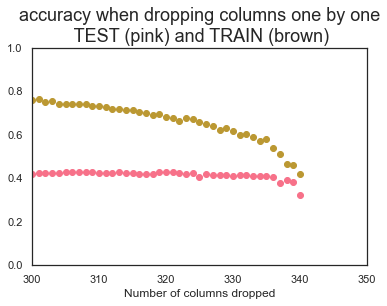

In [148]:
#zoom in a little at the tail
plt.scatter(y=accuracy_XGBoost, x=range(len(accuracy_XGBoost)))
plt.scatter(y=accuracy_XGBoost_train, x=range(len(accuracy_XGBoost)))
plt.title("accuracy when dropping columns one by one\n TEST (pink) and TRAIN (brown)")
plt.xlabel("Number of columns dropped")
plt.xlim(300,350)
plt.ylim(0, 1); 

Seem to be no major improvements when dropping columns, when looking at the graphs. Lets check the numbers to be sure:

In [149]:
max_val = np.max(accuracy_XGBoost)
min_val = np.min(accuracy_XGBoost)
mean_val = np.mean(accuracy_XGBoost)
std_val = np.std(accuracy_XGBoost)
print("minimum test-accuracy:", min_val, "\nmaximum test-accuracy:", max_val, "\nmean test-accuracy", mean_val, 
      "\nstandard deviation test-accuracy:", std_val, "\n") 

#find out at which index max_val is
for i in range(len(accuracy_XGBoost)):
    if accuracy_XGBoost[i] == max_val:
        print("Max value spotted at index:",  i) 

minimum test-accuracy: 0.3229383229383229 
maximum test-accuracy: 0.4303534303534304 
mean test-accuracy 0.4191421288195481 

Max value spotted at index: 319


# Use X_some
As the above didn't work out, try yet something else. X_some are those features that have correlations >0.05 to the target-column.<br> Run with 'default values'(lr = 0.1. hyperparams: empty dict) and earlier assigned top_lr and top_params.

3144 3144
Random state: 5 
               precision    recall  f1-score   support

           0       0.70      0.46      0.56      4985
           1       0.42      0.31      0.36      3091
           2       0.07      0.31      0.12       390
           3       0.07      0.50      0.12       192

    accuracy                           0.40      8658
   macro avg       0.31      0.40      0.29      8658
weighted avg       0.56      0.40      0.46      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

           0       0.70      0.44      0.54      4967
           1       0.42      0.35      0.38      3110
           2       0.08      0.34      0.13       395
           3       0.07      0.48      0.12       186

    accuracy                           0.40      8658
   macro avg       0.32      0.40      0.29      8658
weighted avg       0.56      0.40      0.46      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

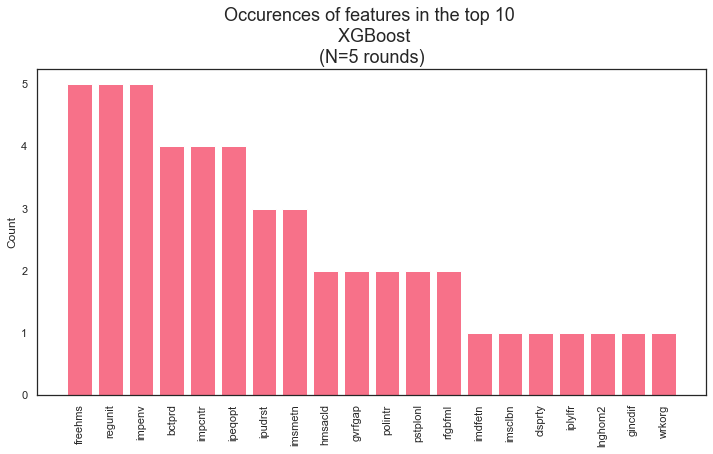

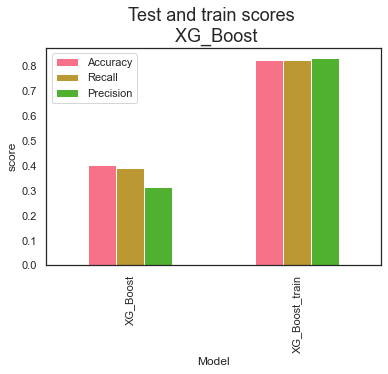

In [150]:
score_some, feat_some = XG_Boost(X_some, y_zero, random_states, True, 0.1, empty_dict)

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

           0       0.58      1.00      0.73      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.00      0.00      0.00       186

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.00      0.00      0.00       165

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 



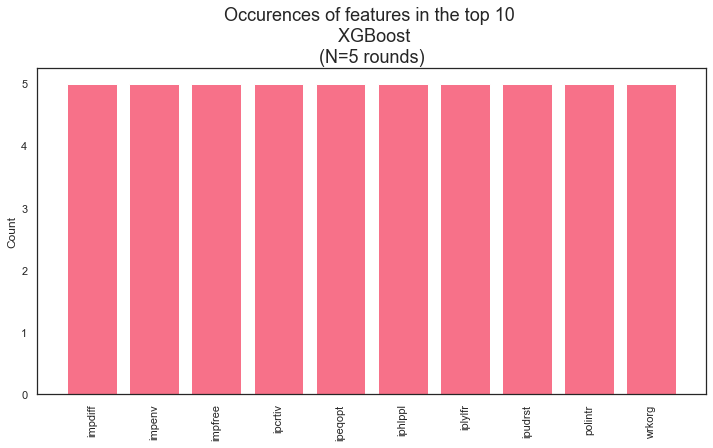

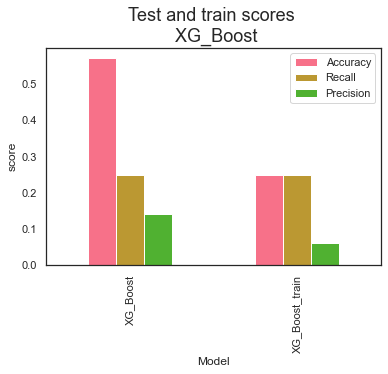

In [151]:
score_some_top, feat_some_top = XG_Boost(X_some, y_zero, random_states, True, top_lr, top_params)

In [152]:
score_some 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.404158,0.390214,0.315256,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.824435,0.824435,0.830388,"[5, 12, 19, 26, 33]"


In [153]:
score_some_top 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.570917,0.25,0.142729,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


Does not seem extremely viable as again not all classes get predicted. Try yet a different approach..

# Use y_trio

Try to predict in three instead of four classes. The classes are: <br>
0: climate is definitely changing<br>
1: climate is probably changing<br>
2: climate is probably / definitely not changing<br>

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      4985
           1       0.47      0.40      0.43      3091
           2       0.15      0.56      0.23       582

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.55      0.63      4967
           1       0.47      0.41      0.43      3110
           2       0.14      0.53      0.22       581

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.71      0.54      0.62      4903
           1       0.48      0.43      

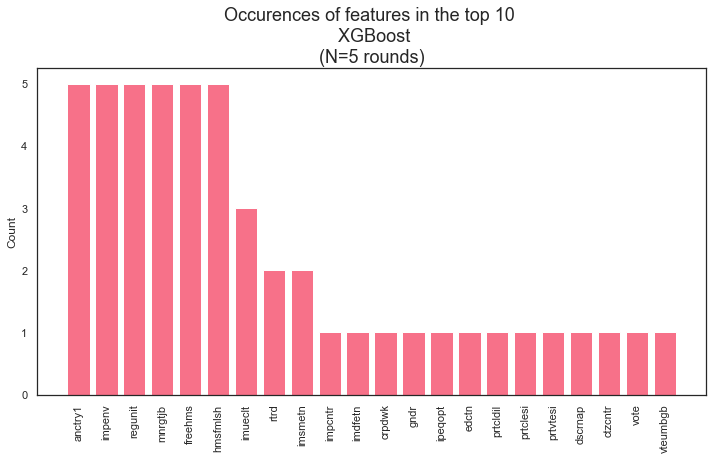

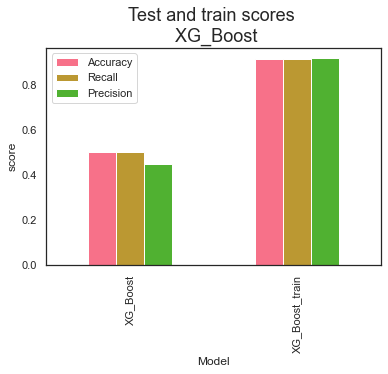

In [154]:
score_trio, feat_trio = XG_Boost(X_noclimate, y_trio, random_states, True, 0.1, empty_dict)

In [155]:
score_trio #score around 50% without tuning!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.500947,0.502634,0.447462,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.917352,0.917352,0.918633,"[5, 12, 19, 26, 33]"


## Tune trio learning rates

In [156]:
# # takes long to run, store in csv instead
# score_trio_lr = tune_learning(X_noclimate, y_trio,7, True, learning_rates, empty_dict)

In [157]:
# score_trio_lr.to_csv('./data/score_trio_lr.csv', index=False)
score_trio_lr = pd.read_csv('./data/score_trio_lr.csv')

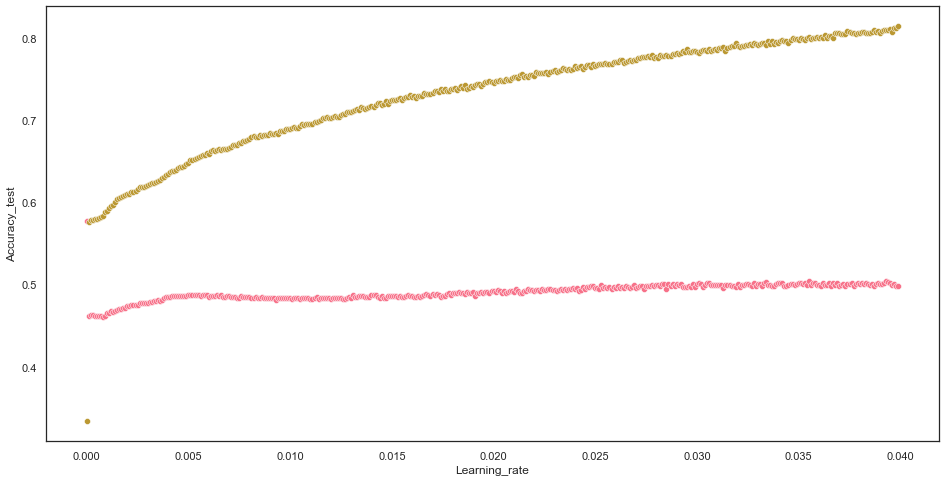

In [158]:
#plot: 
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_trio_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_trio_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [159]:
score_trio_lr["distance"] = score_trio_lr.Accuracy_train - score_trio_lr.Accuracy_test

In [160]:
score_trio_lr.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores: not improved

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.0000,0.244398,-0.244398
393,0.504736,0.505813,0.448241,0.810169,0.810169,0.812113,0.0393,0.305434,0.305434
355,0.503696,0.507252,0.447683,0.800706,0.800706,0.802393,0.0355,0.297010,0.297010
334,0.502772,0.500114,0.445494,0.791949,0.791949,0.793412,0.0334,0.289177,0.289177
394,0.502657,0.506179,0.447860,0.809605,0.809605,0.811703,0.0394,0.306948,0.306948
357,0.502426,0.503805,0.446690,0.800282,0.800282,0.802006,0.0357,0.297857,0.297857
376,0.502426,0.503429,0.445778,0.806497,0.806497,0.808349,0.0376,0.304072,0.304072
389,0.502310,0.503947,0.447050,0.808475,0.808475,0.810335,0.0389,0.306165,0.306165
379,0.502310,0.505005,0.446529,0.806073,0.806073,0.807738,0.0379,0.303763,0.303763
381,0.502195,0.507054,0.448045,0.807203,0.807203,0.808992,0.0381,0.305009,0.305009


In [161]:
score_trio_lr.sort_values(by="distance", ascending=True).head(20)  

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.0000,0.244398,-0.244398
2,0.463386,0.464215,0.418350,0.578390,0.578390,0.578315,0.0002,0.115003,0.115003
1,0.461307,0.462973,0.416996,0.576554,0.576554,0.576487,0.0001,0.115246,0.115246
3,0.463040,0.464822,0.418596,0.578672,0.578672,0.578531,0.0003,0.115632,0.115632
4,0.461654,0.463897,0.417800,0.579379,0.579379,0.579371,0.0004,0.117725,0.117725
5,0.461538,0.463664,0.417275,0.579802,0.579802,0.579726,0.0005,0.118264,0.118264
6,0.461538,0.462230,0.416329,0.580932,0.580932,0.580783,0.0006,0.119394,0.119394
7,0.461307,0.461513,0.415648,0.582062,0.582062,0.581848,0.0007,0.120755,0.120755
8,0.460730,0.461688,0.415703,0.583616,0.583616,0.583233,0.0008,0.122886,0.122886
10,0.465119,0.462293,0.417082,0.589266,0.589266,0.588679,0.0010,0.124147,0.124147


In [162]:
top_score_trio = score_trio_lr.iloc[393,:] #will choose this one: not too much loss of accuracy.
top_score_trio = top_score_trio.to_dict()
top_score_trio

{'Accuracy_test': 0.5047355047355048,
 'Recall_test': 0.5058125642916532,
 'Precision_test': 0.44824135909499296,
 'Accuracy_train': 0.8101694915254237,
 'Recall_train': 0.8101694915254237,
 'Precision_train': 0.8121132627780705,
 'Learning_rate': 0.0393,
 'acc_distance': 0.3054339867899189,
 'distance': 0.30543398678991895}

In [163]:
top_score_trio["Learning_rate"]

0.0393

## Tune hyperparameters

In [164]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_trio, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [165]:
#hard code the learning rate
space['learning_rate']= 0.0393
space

{'learning_rate': 0.0393,
 'max_depth': <hyperopt.pyll.base.Apply at 0x1d4815f44c0>,
 'gamma': <hyperopt.pyll.base.Apply at 0x1d4815f4700>,
 'reg_alpha': <hyperopt.pyll.base.Apply at 0x1d4815f4820>,
 'reg_lambda': <hyperopt.pyll.base.Apply at 0x1d4815f4670>,
 'colsample_bytree': <hyperopt.pyll.base.Apply at 0x1d4822c4040>,
 'min_child_weight': <hyperopt.pyll.base.Apply at 0x1d4822c46a0>,
 'n_estimators': 180,
 'seed': 3}

In [166]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
  1%|▍                                              | 1/100 [00:01<01:46,  1.08s/trial, best loss: -0.5161700161700161]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:29,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:19,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:11,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:03<01:08,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5115500115500116                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:16,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:05<01:08,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:05<01:02,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:06<00:55,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5106260106260107                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:04,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:07<00:57,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.51998151998152                                                                                                       
 12%|█████▌                                        | 12/100 [00:08<01:08,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 13%|█████▉                                        | 13/100 [00:09<01:00,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5434280434280434                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<01:10,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 15%|██████▉                                       | 15/100 [00:11<01:09,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:00,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 17%|███████▊                                      | 17/100 [00:12<00:55,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:52,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:13<00:47,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 20%|█████████▏                                    | 20/100 [00:13<00:44,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:42,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:41,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:41,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:15<00:40,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5658350658350658                                                                                                     
 25%|███████████▌                                  | 25/100 [00:18<01:21,  1.08s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<01:06,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:56,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:19<00:50,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:20<00:46,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 30%|█████████████▊                                | 30/100 [00:20<00:43,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:21<00:40,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:21<00:37,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:22<00:36,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:36,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:23<00:33,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:33,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:24<00:31,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:32,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:25<00:32,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:25<00:31,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:26<00:31,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5262185262185263                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:27<00:40,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:28<00:38,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:28<00:35,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5151305151305151                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:29<00:40,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:30<00:39,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:30<00:35,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5219450219450219                                                                                                     
 48%|██████████████████████                        | 48/100 [00:31<00:37,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:32<00:33,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:32<00:31,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:28,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5452760452760452                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:34<00:33,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:34<00:30,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:35<00:28,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:35<00:27,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:36<00:25,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:36<00:25,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:37<00:23,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 59%|███████████████████████████▏                  | 59/100 [00:38<00:24,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:38<00:22,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:21,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:39<00:20,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 63%|████████████████████████████▉                 | 63/100 [00:40<00:21,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:40<00:21,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:41<00:20,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:41<00:19,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:42<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:18,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:43<00:16,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:44<00:16,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:44<00:14,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:45<00:15,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:45<00:15,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:46<00:18,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 75%|██████████████████████████████████▌           | 75/100 [00:47<00:17,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:48<00:15,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:48<00:14,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:49<00:13,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:49<00:12,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:50<00:12,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:50<00:10,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:51<00:10,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:51<00:09,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:52<00:10,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:53<00:10,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 86%|███████████████████████████████████████▌      | 86/100 [00:54<00:09,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:54<00:08,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:55<00:09,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:56<00:07,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:06,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:57<00:05,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:57<00:04,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:58<00:03,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:59<00:03,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:59<00:02,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [01:00<00:02,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:00<00:01,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [01:01<00:01,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [01:01<00:00,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5138600138600139                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5570570570570571                                                                                                     
  1%|▍                                              | 1/100 [00:02<03:42,  2.25s/trial, best loss: -0.5570570570570571]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5347655347655348                                                                                                     
  2%|▉                                              | 2/100 [00:03<03:09,  1.93s/trial, best loss: -0.5570570570570571]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:03<02:25,  1.50s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5072765072765073                                                                                                     
  4%|█▉                                             | 4/100 [00:05<02:11,  1.37s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:05<01:46,  1.12s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5251790251790251                                                                                                     
  6%|██▊                                            | 6/100 [00:06<01:40,  1.07s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.560984060984061                                                                                                      
  7%|███▎                                           | 7/100 [00:08<02:12,  1.42s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:09<01:48,  1.18s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:09<01:28,  1.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 10%|████▌                                         | 10/100 [00:10<01:16,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:10<01:04,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:11<00:58,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5072765072765073                                                                                                     
 13%|█████▉                                        | 13/100 [00:12<01:07,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:12<00:59,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:13<00:54,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 16%|███████▎                                      | 16/100 [00:14<01:03,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5269115269115269                                                                                                     
 17%|███████▊                                      | 17/100 [00:15<01:17,  1.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:16<01:08,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:16<00:59,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5334950334950335                                                                                                     
 20%|█████████▏                                    | 20/100 [00:17<01:06,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:18<00:58,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 22%|██████████                                    | 22/100 [00:19<00:52,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:19<00:50,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:20<00:47,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:20<00:45,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 26%|███████████▉                                  | 26/100 [00:21<00:44,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:21<00:41,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:22<00:39,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 29%|█████████████▎                                | 29/100 [00:22<00:41,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:23<00:40,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:24<00:40,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 32%|██████████████▋                               | 32/100 [00:24<00:41,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:25<00:45,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:26<00:41,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:26<00:38,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:27<00:36,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:27<00:36,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 38%|█████████████████▍                            | 38/100 [00:28<00:36,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5333795333795334                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:29<00:47,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:30<00:41,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:30<00:40,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:31<00:38,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:31<00:35,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:32<00:33,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:33<00:33,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5285285285285285                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:33<00:36,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5136290136290136                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:35<00:43,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 48%|██████████████████████                        | 48/100 [00:36<00:44,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:36<00:44,  1.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 50%|███████████████████████                       | 50/100 [00:37<00:40,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:38<00:35,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:38<00:33,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:39<00:29,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:39<00:28,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:40<00:26,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:40<00:25,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:41<00:24,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 58%|██████████████████████████▋                   | 58/100 [00:42<00:24,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:42<00:22,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:43<00:23,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5220605220605221                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:44<00:29,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:44<00:25,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:45<00:23,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:45<00:22,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:46<00:21,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:47<00:19,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:47<00:18,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:48<00:17,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:48<00:17,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:49<00:16,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:49<00:15,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:50<00:14,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:50<00:14,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:51<00:14,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:51<00:13,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:52<00:12,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:52<00:12,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:53<00:11,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 79%|████████████████████████████████████▎         | 79/100 [00:54<00:11,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:54<00:10,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:55<00:10,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:55<00:09,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:56<00:09,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:56<00:08,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:57<00:10,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:58<00:08,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:58<00:08,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 88%|████████████████████████████████████████▍     | 88/100 [00:59<00:07,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [01:00<00:08,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [01:00<00:06,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [01:01<00:05,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [01:02<00:04,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:02<00:04,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:03<00:03,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:03<00:02,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:04<00:02,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:04<00:01,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:05<00:01,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:05<00:00,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:46,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:44,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:01<00:46,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:01<00:45,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:02<00:49,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:49,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:03<00:49,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:48,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:56,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:51,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:57,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<01:05,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.565026565026565                                                                                                      
 13%|█████▉                                        | 13/100 [00:09<01:40,  1.15s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5367290367290367                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<01:35,  1.11s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5173250173250173                                                                                                     
 15%|██████▉                                       | 15/100 [00:11<01:30,  1.06s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:15,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.503003003003003                                                                                                      
 17%|███████▊                                      | 17/100 [00:12<01:21,  1.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 18%|████████▎                                     | 18/100 [00:13<01:08,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5274890274890275                                                                                                     
 19%|████████▋                                     | 19/100 [00:14<01:12,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<01:02,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:15<00:53,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:48,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 23%|██████████▌                                   | 23/100 [00:16<00:46,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:17<00:43,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:17<00:41,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<00:39,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:37,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:19<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:34,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:35,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:34,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:21<00:35,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:33,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 35%|████████████████                              | 35/100 [00:22<00:34,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:34,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:33,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:32,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:24<00:30,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:25<00:32,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:25<00:30,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:26<00:29,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:26<00:27,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 44%|████████████████████▏                         | 44/100 [00:27<00:29,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5115500115500116                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:28<00:36,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:28<00:32,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:29<00:30,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:28,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5674520674520674                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:31<00:52,  1.04s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 50%|███████████████████████                       | 50/100 [00:32<00:45,  1.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:32<00:38,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:33<00:33,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:33<00:30,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 54%|████████████████████████▊                     | 54/100 [00:34<00:28,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.4978054978054978                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:35<00:34,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5326865326865327                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:36<00:37,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:37<00:31,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:37<00:32,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:38<00:28,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:38<00:25,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:23,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:39<00:21,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 63%|████████████████████████████▉                 | 63/100 [00:40<00:20,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:41<00:19,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:41<00:18,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:42<00:18,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:42<00:17,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:17,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:43<00:15,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 70%|████████████████████████████████▏             | 70/100 [00:44<00:15,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:44<00:15,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:45<00:15,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:45<00:14,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:46<00:13,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:46<00:13,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:47<00:12,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:48<00:12,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:48<00:12,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:49<00:11,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:49<00:10,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:50<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:50<00:09,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 83%|██████████████████████████████████████▏       | 83/100 [00:51<00:09,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:51<00:08,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:52<00:08,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:52<00:08,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:53<00:08,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:54<00:07,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:55<00:07,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 90%|█████████████████████████████████████████▍    | 90/100 [00:55<00:06,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:56<00:05,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:56<00:04,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:57<00:03,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:58<00:03,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:58<00:03,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:59<00:02,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:59<00:01,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [01:00<00:01,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [01:00<00:00,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:44,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:52,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:07,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:02<01:01,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.561099561099561                                                                                                      
  5%|██▎                                            | 5/100 [00:04<01:44,  1.10s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  6%|██▊                                            | 6/100 [00:05<01:26,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:05<01:13,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5154770154770155                                                                                                     
  8%|███▊                                           | 8/100 [00:07<01:20,  1.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
  9%|████▏                                          | 9/100 [00:07<01:22,  1.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 10%|████▌                                         | 10/100 [00:08<01:11,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5184800184800185                                                                                                     
 11%|█████                                         | 11/100 [00:09<01:13,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5127050127050127                                                                                                     
 12%|█████▌                                        | 12/100 [00:10<01:13,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 13%|█████▉                                        | 13/100 [00:10<01:03,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:11<00:55,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5209055209055209                                                                                                     
 15%|██████▉                                       | 15/100 [00:12<01:07,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5277200277200277                                                                                                     
 16%|███████▎                                      | 16/100 [00:13<01:06,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
 17%|███████▊                                      | 17/100 [00:14<01:15,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:14<01:03,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:15<00:54,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 20%|█████████▏                                    | 20/100 [00:15<00:49,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:16<00:46,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:16<00:43,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 23%|██████████▌                                   | 23/100 [00:17<00:42,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:17<00:43,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 25%|███████████▌                                  | 25/100 [00:18<00:41,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<00:40,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:19<00:38,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:19<00:37,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:20<00:35,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:20<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 31%|██████████████▎                               | 31/100 [00:21<00:36,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:21<00:35,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:22<00:34,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:34,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:23<00:33,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:32,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 37%|█████████████████                             | 37/100 [00:24<00:33,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:31,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:25<00:30,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:26<00:43,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:27<00:37,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:27<00:35,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:28<00:32,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 44%|████████████████████▏                         | 44/100 [00:28<00:32,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5152460152460152                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:29<00:37,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:30<00:33,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:30<00:30,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5136290136290136                                                                                                     
 48%|██████████████████████                        | 48/100 [00:31<00:37,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:32<00:33,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:32<00:30,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5207900207900208                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:36,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:34<00:31,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:34<00:29,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:35<00:26,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5277200277200277                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:36<00:32,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:36<00:29,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 57%|██████████████████████████▏                   | 57/100 [00:37<00:26,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:37<00:24,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:38<00:22,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:38<00:22,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:22,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5016170016170016                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:40<00:26,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:41<00:24,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5352275352275352                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:42<00:28,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:42<00:24,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:43<00:22,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:43<00:20,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:44<00:20,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:44<00:18,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:45<00:16,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:45<00:15,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:46<00:15,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:46<00:14,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:47<00:14,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:48<00:13,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:48<00:12,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 77%|███████████████████████████████████▍          | 77/100 [00:49<00:12,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:49<00:11,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:50<00:11,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:50<00:10,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:51<00:09,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:51<00:09,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:52<00:08,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 84%|██████████████████████████████████████▋       | 84/100 [00:52<00:08,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:53<00:07,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:54<00:08,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:54<00:07,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:55<00:06,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:55<00:06,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:05,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:56<00:04,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:57<00:04,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5173250173250173                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:58<00:04,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 94%|███████████████████████████████████████████▏  | 94/100 [00:58<00:04,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:59<00:03,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:59<00:02,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:00<00:01,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:01<00:01,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:01<00:00,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5138600138600139                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:36,  1.02trial/s, best loss: -0.5138600138600139]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:31,  1.07trial/s, best loss: -0.5200970200970201]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5128205128205128                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:30,  1.07trial/s, best loss: -0.5200970200970201]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:03<01:16,  1.25trial/s, best loss: -0.5200970200970201]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:07,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<00:59,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5131670131670132                                                                                                     
  7%|███▎                                           | 7/100 [00:05<01:07,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5114345114345115                                                                                                     
  8%|███▊                                           | 8/100 [00:06<01:13,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5124740124740125                                                                                                     
  9%|████▏                                          | 9/100 [00:07<01:20,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 10%|████▌                                         | 10/100 [00:08<01:25,  1.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:08<01:14,  1.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:09<01:08,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 13%|█████▉                                        | 13/100 [00:10<01:00,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<00:55,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5164010164010164                                                                                                     
 15%|██████▉                                       | 15/100 [00:11<01:10,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 16%|███████▎                                      | 16/100 [00:12<01:02,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.531069531069531                                                                                                      
 17%|███████▊                                      | 17/100 [00:13<01:10,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 18%|████████▎                                     | 18/100 [00:14<01:10,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5337260337260338                                                                                                     
 19%|████████▋                                     | 19/100 [00:15<01:13,  1.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.565026565026565                                                                                                      
 20%|█████████▏                                    | 20/100 [00:17<01:42,  1.28s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 21%|█████████▋                                    | 21/100 [00:18<01:24,  1.07s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:18<01:12,  1.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:19<01:03,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 24%|███████████                                   | 24/100 [00:19<00:58,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:20<00:51,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:20<00:47,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:21<00:45,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:22<00:43,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:22<00:42,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:23<00:42,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 31%|██████████████▎                               | 31/100 [00:23<00:43,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:24<00:40,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:25<00:40,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:25<00:38,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 35%|████████████████                              | 35/100 [00:26<00:38,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:26<00:36,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 37%|█████████████████                             | 37/100 [00:27<00:36,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:27<00:36,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:28<00:34,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:28<00:33,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:29<00:32,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:30<00:40,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:31<00:37,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:31<00:35,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:32<00:33,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:32<00:32,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:33<00:38,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:34<00:34,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:35<00:32,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:35<00:30,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:36<00:28,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:36<00:27,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:37<00:26,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:37<00:25,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:38<00:24,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:38<00:24,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:39<00:23,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5130515130515131                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:40<00:29,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:40<00:26,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:41<00:25,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:42<00:23,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:42<00:22,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:43<00:21,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:43<00:20,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:44<00:19,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:44<00:19,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:45<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 68%|███████████████████████████████▎              | 68/100 [00:46<00:18,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:46<00:17,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 70%|████████████████████████████████▏             | 70/100 [00:47<00:17,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 71%|████████████████████████████████▋             | 71/100 [00:47<00:17,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:48<00:16,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:48<00:15,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:49<00:15,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:50<00:13,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:50<00:13,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:51<00:13,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:51<00:12,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 79%|████████████████████████████████████▎         | 79/100 [00:52<00:11,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:52<00:11,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 81%|█████████████████████████████████████▎        | 81/100 [00:53<00:10,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:54<00:10,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:55<00:12,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:55<00:10,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:56<00:09,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:56<00:09,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:57<00:08,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:58<00:07,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:58<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:59<00:05,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:59<00:05,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [01:00<00:04,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 93%|██████████████████████████████████████████▊   | 93/100 [01:00<00:04,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:01<00:03,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 95%|███████████████████████████████████████████▋  | 95/100 [01:01<00:02,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:02<00:02,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 97%|████████████████████████████████████████████▌ | 97/100 [01:03<00:01,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5228690228690228                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:04<00:01,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:04<00:00,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:44,  1.06s/trial, best loss: -0.524024024024024]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:27,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:02<01:17,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5336105336105336                                                                                                     
  4%|█▉                                             | 4/100 [00:03<01:24,  1.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:03<01:17,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  6%|██▊                                            | 6/100 [00:04<01:10,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:05<01:03,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:05<00:58,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:06<00:54,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:06<00:51,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<00:50,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:02,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<01:12,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:09<01:05,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<00:59,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5263340263340264                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:09,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:12<01:02,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:54,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:13<00:49,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<01:01,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:54,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:49,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:46,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:46,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:44,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:42,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:41,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:40,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:19<00:39,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:37,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:38,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:36,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:37,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:36,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:36,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:22<00:34,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
 37%|█████████████████                             | 37/100 [00:23<00:41,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:43,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 39%|█████████████████▉                            | 39/100 [00:25<00:40,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:25<00:37,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 41%|██████████████████▊                           | 41/100 [00:26<00:37,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:27<00:36,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:27<00:33,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:28<00:31,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:28<00:31,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:29<00:30,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:29<00:29,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.525987525987526                                                                                                      
 48%|██████████████████████                        | 48/100 [00:30<00:38,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5337260337260338                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:32<00:45,  1.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:32<00:38,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:35,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:33<00:32,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:34<00:31,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:34<00:28,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:35<00:27,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:36<00:26,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:36<00:25,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:37<00:24,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:37<00:21,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 60%|███████████████████████████▌                  | 60/100 [00:38<00:21,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:38<00:20,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:39<00:20,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:40<00:24,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5148995148995149                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:41<00:28,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:41<00:25,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:42<00:22,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:42<00:20,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:18,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:43<00:17,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:44<00:18,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:45<00:17,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 72%|█████████████████████████████████             | 72/100 [00:45<00:16,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 73%|█████████████████████████████████▌            | 73/100 [00:46<00:16,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5173250173250173                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:47<00:21,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:48<00:18,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:49<00:17,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:49<00:16,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:50<00:14,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:50<00:13,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:51<00:12,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:52<00:12,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:52<00:11,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:53<00:10,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:54<00:10,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:54<00:09,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:55<00:08,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:55<00:07,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:56<00:07,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:57<00:06,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:57<00:06,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:58<00:06,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:59<00:05,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:00<00:04,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5430815430815431                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:01<00:04,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:01<00:03,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [01:02<00:03,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:03<00:02,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:03<00:01,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:04<00:00,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
  1%|▍                                              | 1/100 [00:01<01:44,  1.06s/trial, best loss: -0.5261030261030261]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:28,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:16,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:07,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:01,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:56,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5207900207900208                                                                                                     
  7%|███▎                                           | 7/100 [00:04<01:13,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:06,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  9%|████▏                                          | 9/100 [00:05<01:00,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:06<00:56,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<00:54,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5282975282975283                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<00:59,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<00:53,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:08<00:51,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5155925155925156                                                                                                     
 15%|██████▉                                       | 15/100 [00:10<01:03,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 16%|███████▎                                      | 16/100 [00:10<00:58,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 17%|███████▊                                      | 17/100 [00:11<01:10,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<01:01,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.51998151998152                                                                                                       
 19%|████████▋                                     | 19/100 [00:13<01:10,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<01:17,  1.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:15<01:08,  1.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<01:00,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:16<00:54,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 24%|███████████                                   | 24/100 [00:17<00:56,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:17<00:52,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<00:52,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:19<00:50,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 28%|████████████▉                                 | 28/100 [00:19<00:49,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:20<00:47,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 30%|█████████████▊                                | 30/100 [00:21<00:46,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:21<00:43,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 32%|██████████████▋                               | 32/100 [00:22<00:43,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:22<00:41,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:23<00:38,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 35%|████████████████                              | 35/100 [00:24<00:38,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:24<00:40,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:25<00:37,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:25<00:36,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:26<00:35,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:27<00:36,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5597135597135597                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:29<01:09,  1.18s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:30<00:57,  1.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:30<00:50,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:31<00:43,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:31<00:39,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:32<00:36,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:33<00:34,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:33<00:31,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.536036036036036                                                                                                      
 49%|██████████████████████▌                       | 49/100 [00:34<00:38,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:35<00:34,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:35<00:31,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:36<00:30,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:36<00:29,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:37<00:28,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:38<00:27,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:38<00:26,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5133980133980134                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:40<00:35,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:40<00:31,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 59%|███████████████████████████▏                  | 59/100 [00:41<00:29,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:41<00:27,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:42<00:25,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:43<00:24,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 63%|████████████████████████████▉                 | 63/100 [00:43<00:25,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:44<00:23,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:44<00:21,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:45<00:19,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:46<00:19,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:46<00:18,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:47<00:19,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:48<00:19,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:48<00:17,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:49<00:15,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:49<00:15,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:50<00:14,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:50<00:14,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:51<00:12,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:51<00:12,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:52<00:12,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:53<00:12,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:53<00:12,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:54<00:11,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:55<00:13,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 83%|██████████████████████████████████████▏       | 83/100 [00:56<00:12,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:56<00:10,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:57<00:09,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:57<00:08,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:58<00:07,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:58<00:06,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:59<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [01:00<00:06,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [01:00<00:05,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [01:01<00:04,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5368445368445368                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:02<00:05,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 94%|███████████████████████████████████████████▏  | 94/100 [01:03<00:04,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:03<00:03,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [01:04<00:02,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:05<00:01,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:05<00:01,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:06<00:00,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:48,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:56,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:53,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:02<00:51,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:02<00:51,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.521021021021021                                                                                                      
  6%|██▊                                            | 6/100 [00:03<01:06,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:57,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:53,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:50,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:50,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:46,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:45,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:44,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5220605220605221                                                                                                     
 14%|██████▍                                       | 14/100 [00:08<00:58,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:08<00:53,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:09<00:49,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:09<00:46,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:10<00:43,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:42,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5072765072765073                                                                                                     
 20%|█████████▏                                    | 20/100 [00:11<00:53,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:12<00:48,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 22%|██████████                                    | 22/100 [00:12<00:47,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 23%|██████████▌                                   | 23/100 [00:13<00:46,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:14<00:43,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:14<00:41,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 26%|███████████▉                                  | 26/100 [00:15<00:39,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:15<00:39,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 28%|████████████▉                                 | 28/100 [00:16<00:39,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:16<00:38,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5616770616770617                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<01:16,  1.09s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:19<01:03,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:53,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:20<00:47,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:43,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 35%|████████████████                              | 35/100 [00:21<00:41,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 36%|████████████████▌                             | 36/100 [00:22<00:39,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 37%|█████████████████                             | 37/100 [00:22<00:38,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:23<00:36,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:23<00:34,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:24<00:34,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:25<00:33,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:25<00:32,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:26<00:32,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5264495264495265                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:27<00:39,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:27<00:35,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:28<00:34,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:28<00:32,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:31,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:30<00:28,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
 50%|███████████████████████                       | 50/100 [00:31<00:37,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 51%|███████████████████████▍                      | 51/100 [00:31<00:33,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:32<00:30,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:32<00:29,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:33<00:32,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:34<00:29,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:34<00:26,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:35<00:25,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:35<00:24,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:37<00:30,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:37<00:27,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:38<00:24,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:38<00:23,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:39<00:22,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:39<00:20,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:40<00:19,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:40<00:19,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:41<00:18,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 68%|███████████████████████████████▎              | 68/100 [00:41<00:17,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 69%|███████████████████████████████▋              | 69/100 [00:42<00:17,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:43<00:17,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:43<00:16,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:44<00:15,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:44<00:14,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:45<00:14,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:45<00:13,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:46<00:13,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:46<00:12,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:47<00:11,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:48<00:11,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:48<00:11,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:49<00:10,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:10,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 83%|██████████████████████████████████████▏       | 83/100 [00:50<00:09,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:09,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:51<00:08,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:52<00:07,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:52<00:07,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:53<00:06,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:53<00:06,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:54<00:05,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:54<00:04,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:55<00:04,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 93%|██████████████████████████████████████████▊   | 93/100 [00:55<00:03,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5296835296835297                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:57<00:04,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 95%|███████████████████████████████████████████▋  | 95/100 [00:57<00:03,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:58<00:02,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 97%|████████████████████████████████████████████▌ | 97/100 [00:58<00:01,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [00:59<00:01,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:00<00:00,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  1%|▍                                             | 1/100 [00:00<00:59,  1.67trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:56,  1.72trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:54,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:51,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:51,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  6%|██▊                                            | 6/100 [00:03<00:53,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:51,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5337260337260338                                                                                                     
  8%|███▊                                           | 8/100 [00:04<01:05,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
  9%|████▏                                          | 9/100 [00:05<01:10,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5097020097020097                                                                                                     
 10%|████▌                                         | 10/100 [00:06<01:15,  1.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████                                         | 11/100 [00:07<01:21,  1.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5475860475860476                                                                                                     
 12%|█████▌                                        | 12/100 [00:09<01:46,  1.21s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5354585354585355                                                                                                     
 13%|█████▉                                        | 13/100 [00:10<01:42,  1.18s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▍                                       | 14/100 [00:11<01:36,  1.13s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 15%|██████▉                                       | 15/100 [00:12<01:33,  1.10s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:13<01:17,  1.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:14<01:07,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:14<00:57,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5657195657195657                                                                                                     
 19%|████████▋                                     | 19/100 [00:16<01:35,  1.17s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 20%|█████████▏                                    | 20/100 [00:17<01:29,  1.12s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:18<01:15,  1.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 22%|██████████                                    | 22/100 [00:18<01:06,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:19<00:55,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:19<00:50,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:20<00:46,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:20<00:43,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:21<00:40,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:21<00:38,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:22<00:36,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:22<00:36,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:23<00:35,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 32%|██████████████▋                               | 32/100 [00:23<00:36,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:24<00:34,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:24<00:34,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:25<00:33,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:26<00:34,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:26<00:34,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 38%|█████████████████▍                            | 38/100 [00:27<00:35,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:27<00:34,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:28<00:34,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:28<00:32,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:29<00:31,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:29<00:30,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:30<00:29,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:31<00:31,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:31<00:30,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:32<00:28,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 48%|██████████████████████                        | 48/100 [00:32<00:29,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:33<00:27,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:33<00:29,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 51%|███████████████████████▍                      | 51/100 [00:34<00:28,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:35<00:34,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:36<00:31,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:36<00:27,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:37<00:27,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:37<00:26,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:38<00:32,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:39<00:29,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:39<00:25,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:40<00:24,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5162855162855163                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:41<00:29,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:42<00:26,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:42<00:24,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:43<00:23,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:43<00:22,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:44<00:20,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:45<00:19,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:45<00:18,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:46<00:18,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:46<00:17,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:47<00:16,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:47<00:15,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:48<00:15,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:48<00:14,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:49<00:13,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.534996534996535                                                                                                      
 76%|██████████████████████████████████▉           | 76/100 [00:50<00:16,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:50<00:14,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:51<00:12,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:52<00:12,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5211365211365211                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:52<00:11,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:53<00:10,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5303765303765304                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:54<00:12,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:54<00:10,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:54<00:09,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:55<00:08,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:55<00:07,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:56<00:07,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:57<00:06,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:57<00:05,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:58<00:05,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:58<00:04,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:59<00:04,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:59<00:03,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:00<00:03,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:00<00:02,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:01<00:02,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 97%|████████████████████████████████████████████▌ | 97/100 [01:01<00:01,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:02<00:01,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:02<00:00,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:47,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:49,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:47,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:47,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:45,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5314160314160314                                                                                                     
  6%|██▊                                            | 6/100 [00:03<01:04,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5169785169785169                                                                                                     
  7%|███▎                                           | 7/100 [00:04<01:13,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5212520212520213                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:14,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5597135597135597                                                                                                     
  9%|████▏                                          | 9/100 [00:07<01:57,  1.29s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5367290367290367                                                                                                     
 10%|████▌                                         | 10/100 [00:08<01:48,  1.20s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:09<01:30,  1.01s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5257565257565258                                                                                                     
 12%|█████▌                                        | 12/100 [00:10<01:23,  1.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:10<01:10,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5130515130515131                                                                                                     
 14%|██████▍                                       | 14/100 [00:11<01:11,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5154770154770155                                                                                                     
 15%|██████▉                                       | 15/100 [00:12<01:13,  1.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 16%|███████▎                                      | 16/100 [00:13<01:10,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:13<00:59,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 18%|████████▎                                     | 18/100 [00:14<00:53,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:14<00:49,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:15<00:46,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:15<00:46,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:16<00:44,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:16<00:42,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:17<00:39,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:17<00:39,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<00:38,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:37,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:19<00:36,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 29%|█████████████▎                                | 29/100 [00:20<00:38,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:20<00:36,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:21<00:35,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:21<00:33,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:33,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:32,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 35%|████████████████                              | 35/100 [00:23<00:33,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:32,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:24<00:31,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 38%|█████████████████▍                            | 38/100 [00:24<00:34,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:25<00:34,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:25<00:34,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:27<00:44,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:27<00:41,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:28<00:38,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 44%|████████████████████▏                         | 44/100 [00:28<00:36,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:29<00:33,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5214830214830215                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:30<00:37,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:30<00:35,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 48%|██████████████████████                        | 48/100 [00:31<00:33,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:32<00:37,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5620235620235621                                                                                                     
 50%|███████████████████████                       | 50/100 [00:34<01:02,  1.25s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 51%|███████████████████████▍                      | 51/100 [00:35<00:52,  1.07s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:36<00:44,  1.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:36<00:38,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.528990528990529                                                                                                      
 54%|████████████████████████▊                     | 54/100 [00:37<00:42,  1.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:38<00:36,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:39<00:33,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:39<00:30,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:40<00:35,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:41<00:30,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:41<00:27,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:42<00:26,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:43<00:23,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:43<00:22,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:44<00:24,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:45<00:30,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:46<00:26,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:46<00:23,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:47<00:21,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:48<00:20,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:48<00:19,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:49<00:17,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:49<00:17,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:50<00:16,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:51<00:15,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:51<00:14,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:52<00:13,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:52<00:12,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 78%|███████████████████████████████████▉          | 78/100 [00:53<00:12,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:54<00:14,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:54<00:13,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:55<00:15,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:56<00:13,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:57<00:11,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 84%|██████████████████████████████████████▋       | 84/100 [00:57<00:10,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:58<00:09,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:58<00:08,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:59<00:08,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [01:00<00:07,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [01:00<00:06,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 90%|█████████████████████████████████████████▍    | 90/100 [01:01<00:06,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 91%|█████████████████████████████████████████▊    | 91/100 [01:01<00:05,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [01:02<00:04,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:03<00:04,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:03<00:03,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:04<00:02,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:04<00:02,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:05<00:01,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:05<00:01,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5241395241395241                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:06<00:00,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [01:07<00:00,  1.48trial/s, best loss: -0.5777315777315777]


7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.69      0.56      0.62      4985
           1       0.41      0.21      0.28      3091
           2       0.12      0.60      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.69      0.55      0.61      4967
           1       0.44      0.23      0.30      3110
           2       0.11      0.56      0.18       581

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.36      8658
weighted avg       0.56      0.44      0.47      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.69      0.57      0.62      4903
           1       0.45      0.23      

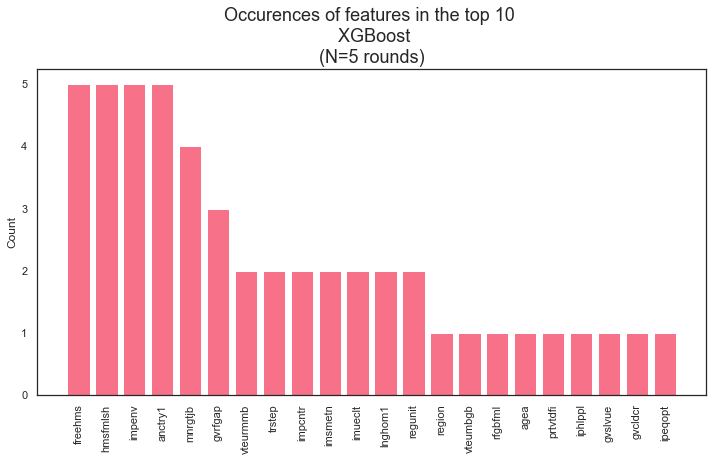

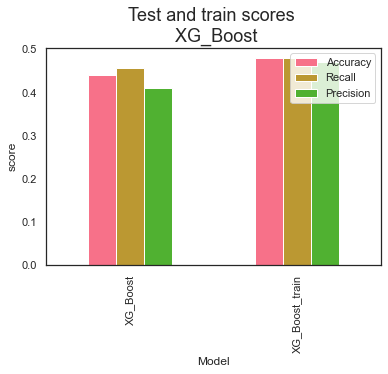

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4985
           1       0.40      0.19      0.26      3091
           2       0.12      0.59      0.19       582

    accuracy                           0.44      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.44      0.46      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.59      0.62      4967
           1       0.45      0.16      0.24      3110
           2       0.10      0.55      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.43      0.34      8658
weighted avg       0.55      0.43      0.45      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.61      0.64      4903
           1       0.44      0.19      

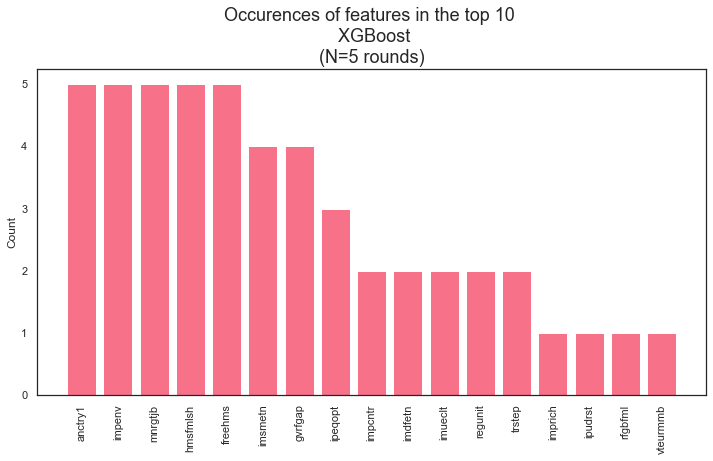

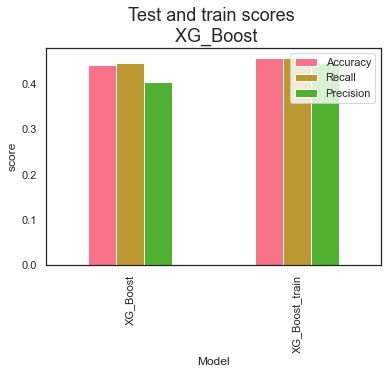

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4985
           1       0.40      0.20      0.27      3091
           2       0.12      0.59      0.19       582

    accuracy                           0.44      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.44      0.46      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.68      0.55      0.61      4967
           1       0.43      0.22      0.29      3110
           2       0.10      0.54      0.17       581

    accuracy                           0.43      8658
   macro avg       0.41      0.44      0.36      8658
weighted avg       0.55      0.43      0.47      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4903
           1       0.44      0.21      

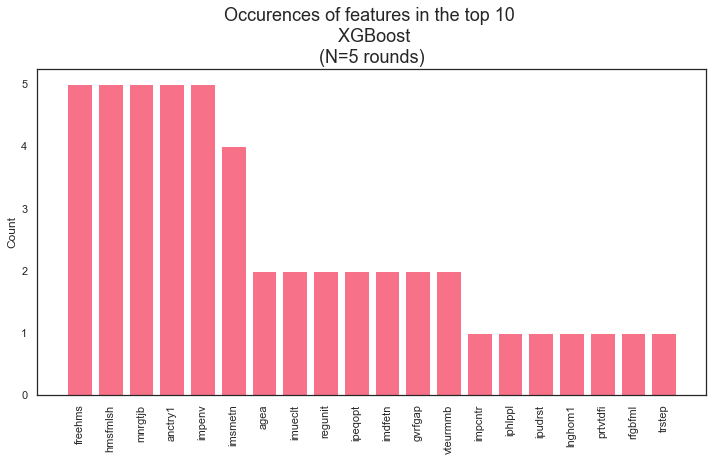

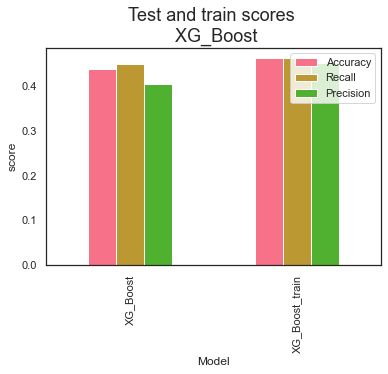

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.69      0.58      0.63      4985
           1       0.40      0.20      0.27      3091
           2       0.12      0.60      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4967
           1       0.43      0.18      0.26      3110
           2       0.11      0.57      0.18       581

    accuracy                           0.43      8658
   macro avg       0.40      0.44      0.35      8658
weighted avg       0.55      0.43      0.46      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.59      0.63      4903
           1       0.44      0.19      

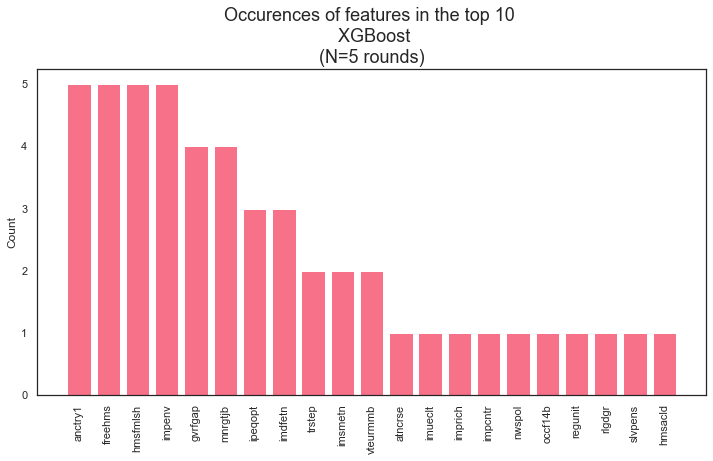

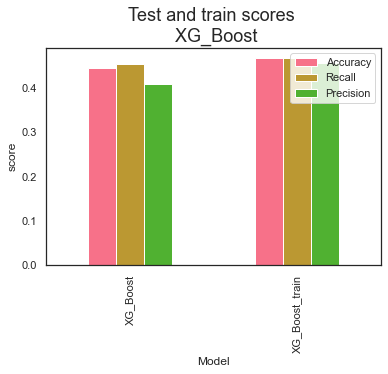

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4985
           1       0.40      0.18      0.25      3091
           2       0.12      0.60      0.19       582

    accuracy                           0.43      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.43      0.46      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.58      0.62      4967
           1       0.43      0.19      0.26      3110
           2       0.10      0.51      0.17       581

    accuracy                           0.44      8658
   macro avg       0.40      0.43      0.35      8658
weighted avg       0.54      0.44      0.46      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.58      0.62      4903
           1       0.43      0.20      

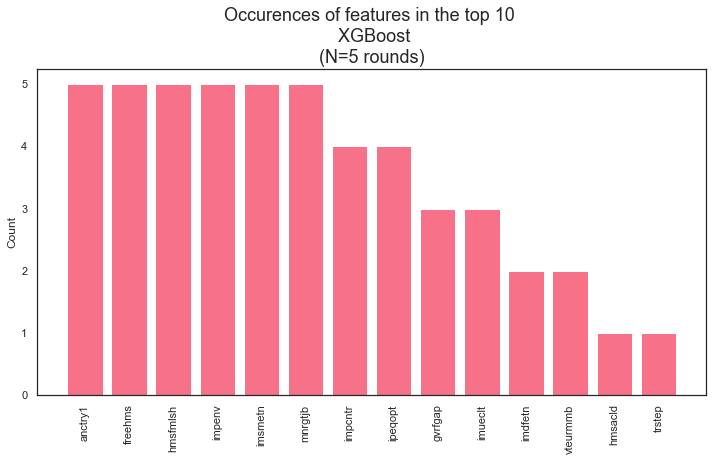

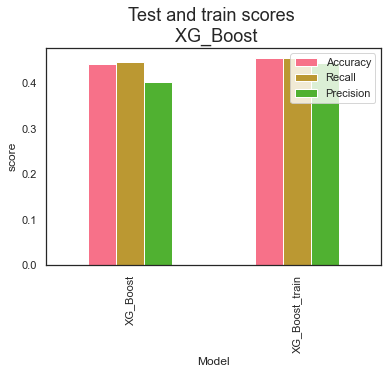

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.56      0.61      4985
           1       0.40      0.24      0.30      3091
           2       0.11      0.51      0.18       582

    accuracy                           0.44      8658
   macro avg       0.39      0.44      0.36      8658
weighted avg       0.54      0.44      0.47      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.65      0.62      0.63      4967
           1       0.48      0.13      0.20      3110
           2       0.10      0.52      0.16       581

    accuracy                           0.44      8658
   macro avg       0.41      0.42      0.33      8658
weighted avg       0.55      0.44      0.45      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.66      0.59      0.62      4903
           1       0.41      0.22      

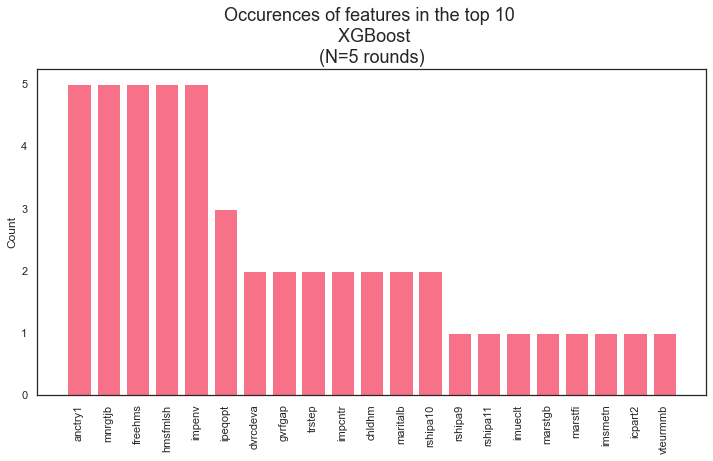

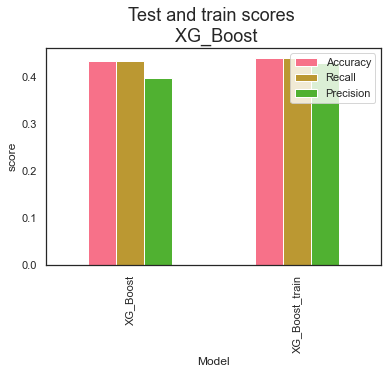

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4985
           1       0.40      0.18      0.25      3091
           2       0.11      0.59      0.19       582

    accuracy                           0.43      8658
   macro avg       0.40      0.45      0.35      8658
weighted avg       0.54      0.43      0.46      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.58      0.62      4967
           1       0.43      0.17      0.24      3110
           2       0.10      0.54      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.43      0.34      8658
weighted avg       0.54      0.43      0.45      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.60      0.63      4903
           1       0.44      0.20      

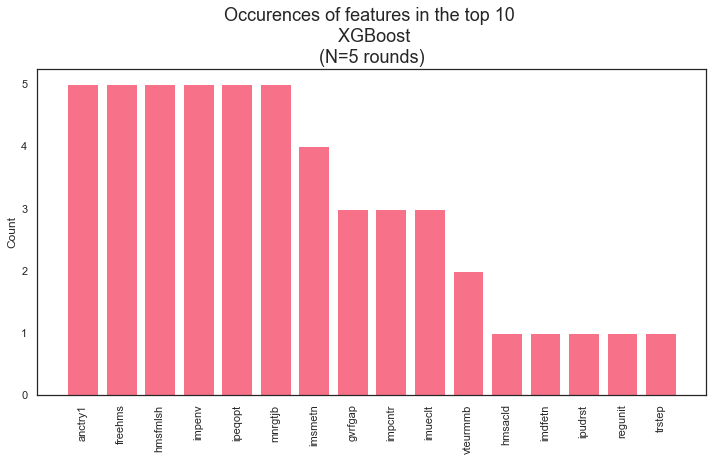

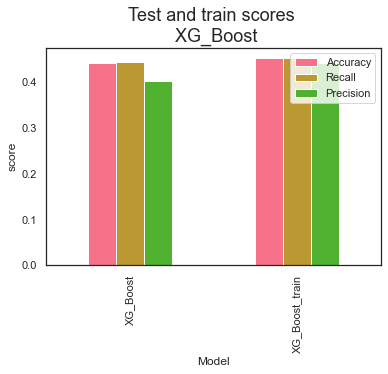

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4985
           1       0.40      0.19      0.26      3091
           2       0.12      0.60      0.19       582

    accuracy                           0.44      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.44      0.46      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.67      0.58      0.62      4967
           1       0.43      0.17      0.24      3110
           2       0.10      0.54      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.43      0.35      8658
weighted avg       0.54      0.43      0.46      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.60      0.63      4903
           1       0.43      0.20      

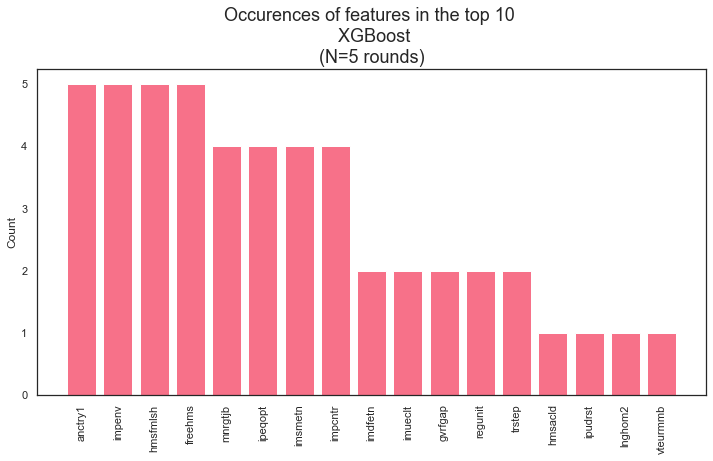

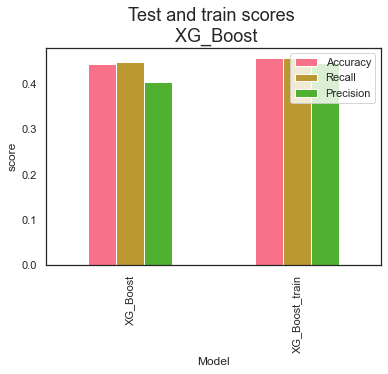

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.69      0.57      0.62      4985
           1       0.41      0.20      0.27      3091
           2       0.12      0.61      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.68      0.56      0.61      4967
           1       0.43      0.19      0.26      3110
           2       0.10      0.56      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.44      0.35      8658
weighted avg       0.55      0.43      0.46      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4903
           1       0.43      0.19      

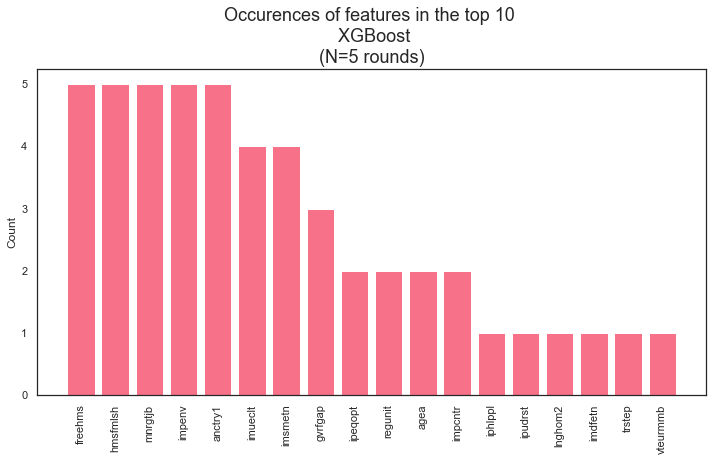

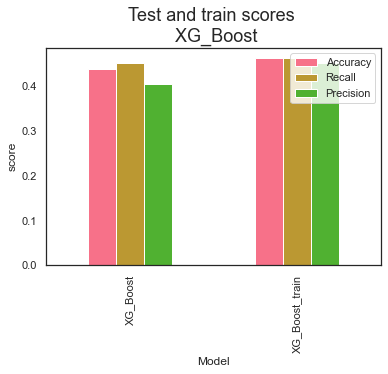

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.56      0.62      4985
           1       0.40      0.21      0.28      3091
           2       0.12      0.58      0.19       582

    accuracy                           0.44      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.44      0.47      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.67      0.57      0.61      4967
           1       0.44      0.17      0.25      3110
           2       0.10      0.56      0.17       581

    accuracy                           0.42      8658
   macro avg       0.40      0.43      0.34      8658
weighted avg       0.55      0.42      0.45      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.60      0.63      4903
           1       0.43      0.18      

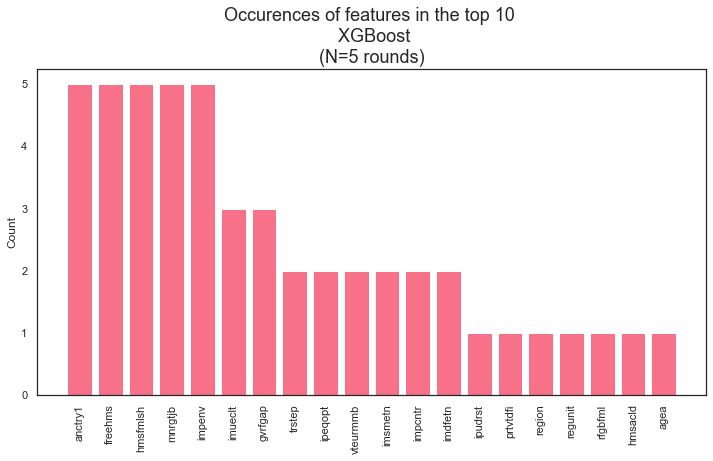

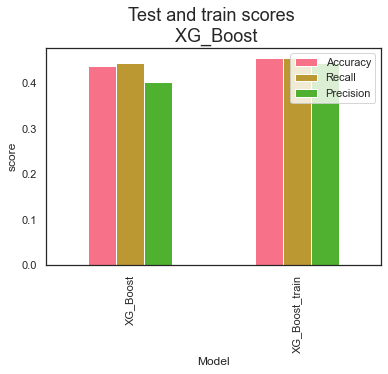

In [167]:
top_hp_trio = top_param(X_noclimate, y_trio, random_states, top_score_trio["Learning_rate"], True, values_list_lr)

In [168]:
top_hp_trio

{'reg_alpha': 165.0,
 'colsample_bytree': 0.6345764234392793,
 'reg_lambda': 0.8508441571710018,
 'gamma': 2.3944995062539762,
 'min_child_weight': 1.0,
 'max_depth': 13}

In [169]:
#hardcode it again
top_hp_trio = {'reg_alpha': 151.0,
               'colsample_bytree': 0.6311365127223818,
               'reg_lambda': 0.1168190003654852,
               'gamma': 2.8342631324989673,
               'min_child_weight': 3.0,
               'max_depth': 5}

7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.58      0.63      4985
           1       0.41      0.19      0.26      3091
           2       0.12      0.61      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4967
           1       0.43      0.18      0.26      3110
           2       0.11      0.57      0.18       581

    accuracy                           0.43      8658
   macro avg       0.40      0.44      0.35      8658
weighted avg       0.55      0.43      0.46      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.58      0.63      4903
           1       0.44      0.20      

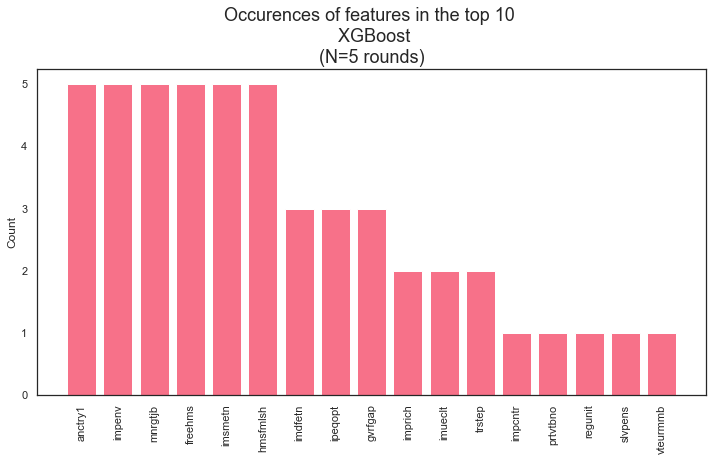

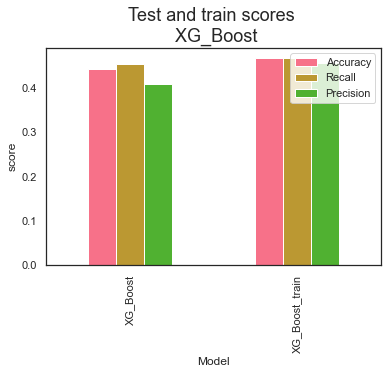

In [170]:
score_trio, feat_trio = XG_Boost(X_noclimate, y_trio, random_states, True, top_score_trio["Learning_rate"], top_hp_trio)

In [171]:
score_trio

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.442481,0.453785,0.407077,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.465833,0.465833,0.455450,"[5, 12, 19, 26, 33]"


This did counter the overtraining, but accuracy score dropped below 0.5. Try a different approach:

# Use y_duo - binary classification
Try to predict in two classes:<br>
0: climate is probalby/definitely changing <br>
1: climate is probalby/definitely not changing <br>

start out with learning rate of 0.1 and empty_dict for hyperparameters

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8076
           1       0.12      0.65      0.20       582

    accuracy                           0.66      8658
   macro avg       0.54      0.66      0.49      8658
weighted avg       0.91      0.66      0.74      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8077
           1       0.12      0.67      0.21       581

    accuracy                           0.66      8658
   macro avg       0.54      0.66      0.49      8658
weighted avg       0.91      0.66      0.74      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8079
           1       0.12      0.66      0.21       579

    accuracy                           0.67      8658
   macro avg       0.54      0.66     

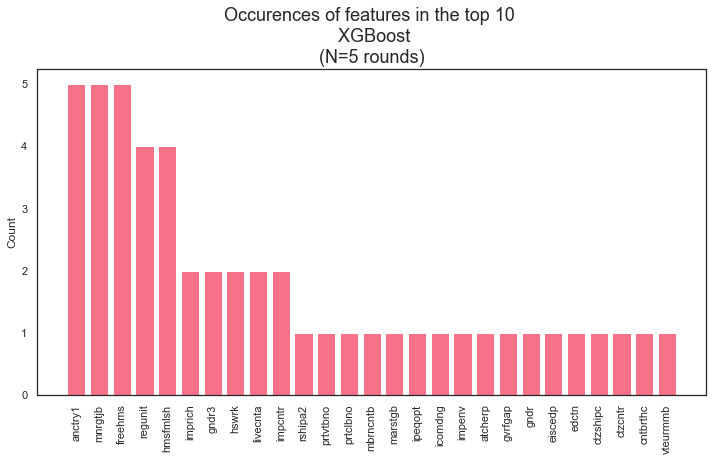

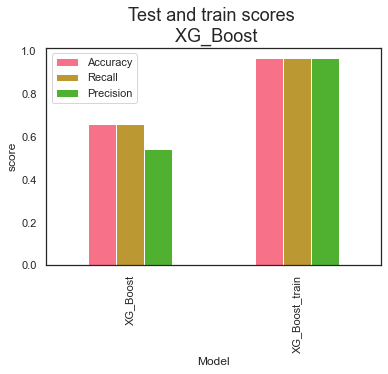

In [172]:
score_duo, feat_duo = XG_Boost(X_noclimate, y_duo, random_states, True, 0.1, empty_dict)

In [173]:
score_duo #some true improvement in accuracy!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.660083,0.660925,0.543856,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.964799,0.964799,0.965434,"[5, 12, 19, 26, 33]"


In [174]:
get_fullname(feat_duo, metadata).sort_values(by="importance", ascending=False) #check it out for fun

,indices,importance,shorthand,full_text
0,316,0.017511,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
18,134,0.012411,livecnta,What year you first came to live in country
25,212,0.012361,rshipa2,Second person in household: relationship to respondent
7,88,0.012327,freehms,Gays and lesbians free to live life as they wish
2,133,0.011726,cntbrthc,Country of birth
19,233,0.011543,marstgb,"Legal marital status, United Kingdom"
14,94,0.010699,impcntr,Allow many/few immigrants from poorer countries outside Europe
23,40,0.009851,prtvtbno,"Party voted for in last national election, Norway"
21,87,0.009448,mnrgtjb,Men should have more right to job than women when jobs are scarce
15,336,0.009062,impenv,Important to care for nature and environment


The accuracy looks promising, optimize learning rate and hyperparameters.

## Tune duo learning rate

In [175]:
#Takes very long to run, so stored in CSV in the cell below
# score_duo_lr = tune_learning(X_noclimate, y_duo, 7, True, learning_rates, empty_dict)

In [176]:
# score_duo_lr.to_csv('./data/learning_rate_duo_optimization2.csv') # store in CSV, only if cell above is not cancelled out 

In [177]:
#read stored data from CSV
score_duo_lr = pd.read_csv('./data/learning_rate_duo_optimization2.csv')

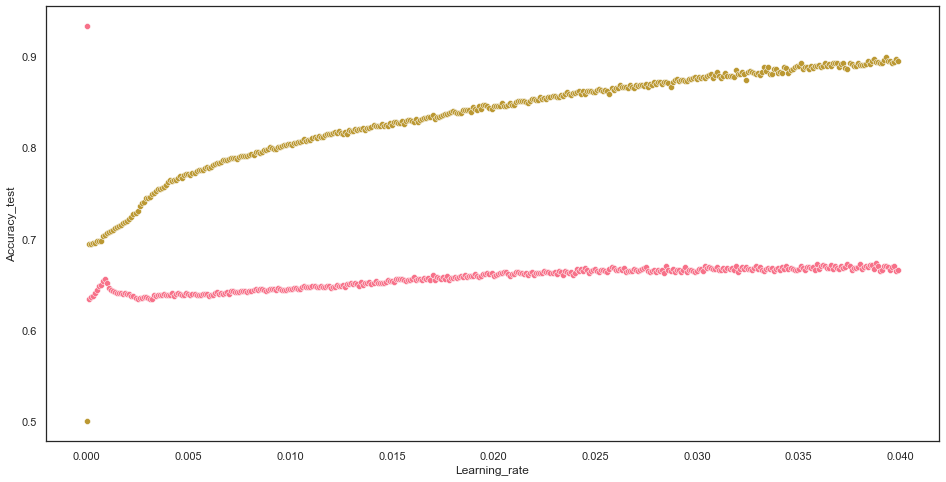

In [178]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

Looks promising somewhere around 0.001/0.002! check it out! First zoom in a little:

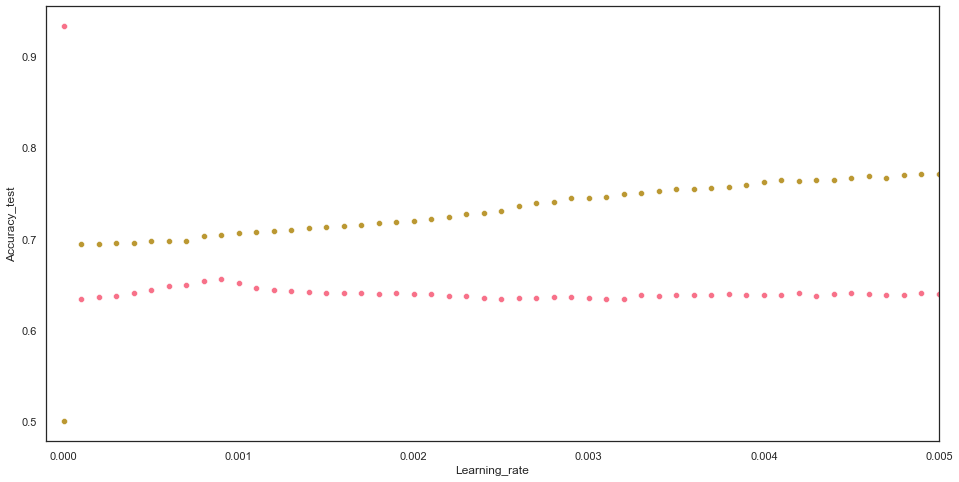

In [179]:
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.xlim(-0.0001, 0.005)
plt.show(); 

In [180]:
score_duo_lr["distance"] = score_duo_lr.Accuracy_train - score_duo_lr.Accuracy_test

In [181]:
score_duo_lr.sort_values(by="Accuracy_test", ascending=False).head(20) 
# highest learning rates are not in the part I just zoomed into. 
# keep 0.0388 as option for top_lr_duo, and select one that is closer to zero.

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,-0.433010
388,388,0.674059,0.666894,0.546024,0.893856,0.893856,0.895791,0.0388,0.219797
380,380,0.672442,0.662827,0.544860,0.890890,0.890890,0.892953,0.0380,0.218448
359,359,0.671980,0.668180,0.546207,0.889831,0.889831,0.891498,0.0359,0.217851
374,374,0.671980,0.665780,0.545589,0.886229,0.886229,0.887946,0.0374,0.214249
385,385,0.671518,0.662331,0.544669,0.891525,0.891525,0.893665,0.0385,0.220008
386,386,0.671287,0.667009,0.545857,0.894703,0.894703,0.896690,0.0386,0.223417
366,366,0.671287,0.660607,0.544208,0.889195,0.889195,0.891107,0.0366,0.217908
362,362,0.671056,0.669285,0.546426,0.889831,0.889831,0.891864,0.0362,0.218775
375,375,0.670825,0.663560,0.544938,0.892373,0.892373,0.894277,0.0375,0.221548


In [182]:
score_duo_lr.sort_values(by="distance", ascending=True).head(20) 
#the smallest distance is between 0.0007-0.0009. The highest accuracy here is 0.655694 with a learningrate of 0.009 (at index 9 below)
#try some tuning with an even smaller stepsize.

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,-0.433010
7,7,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.0007,0.048636
9,9,0.655694,0.626646,0.534493,0.704449,0.704449,0.704936,0.0009,0.048755
8,8,0.653615,0.625532,0.534101,0.702966,0.702966,0.703408,0.0008,0.049351
6,6,0.648071,0.628162,0.534520,0.698093,0.698093,0.698315,0.0006,0.050022
5,5,0.644029,0.625195,0.533576,0.697881,0.697881,0.698018,0.0005,0.053853
10,10,0.651998,0.627066,0.534421,0.706144,0.706144,0.706522,0.0010,0.054146
4,4,0.640910,0.625124,0.533425,0.695975,0.695975,0.696089,0.0004,0.055064
2,2,0.636752,0.623696,0.532890,0.694492,0.694492,0.694532,0.0002,0.057739
3,3,0.637676,0.624192,0.533053,0.695551,0.695551,0.695604,0.0003,0.057875


In [183]:
learning_rates_tiny = list(np.arange(0.0005, 0.001, 0.00001))

Learning rate: 0.0005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

Learning rate: 0.00051 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

Learning rate: 0.0005200000000000001 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.60      0.18       580

    accuracy                           0.64      8658
   macro avg       0.53      0.62   

Learning rate: 0.0007000000000000005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

Learning rate: 0.0007100000000000006 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

Learning rate: 0.0007200000000000006 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macr

Learning rate: 0.0009000000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.66      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.66      0.74      8658
 

Learning rate: 0.0009100000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

Learning rate: 0.0009200000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macr

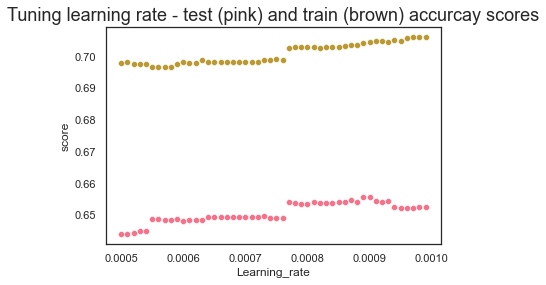

In [184]:
#  cancel out due to runtime
# score_duo_tiny = tune_learning(X_noclimate, y_duo, 7, True, learning_rates_tiny, empty_dict)

In [185]:
# score_duo_tiny.to_csv('./data/score_duo_tiny.csv', index=False)

In [186]:
score_duo_tiny = pd.read_csv('./data/score_duo_tiny.csv')

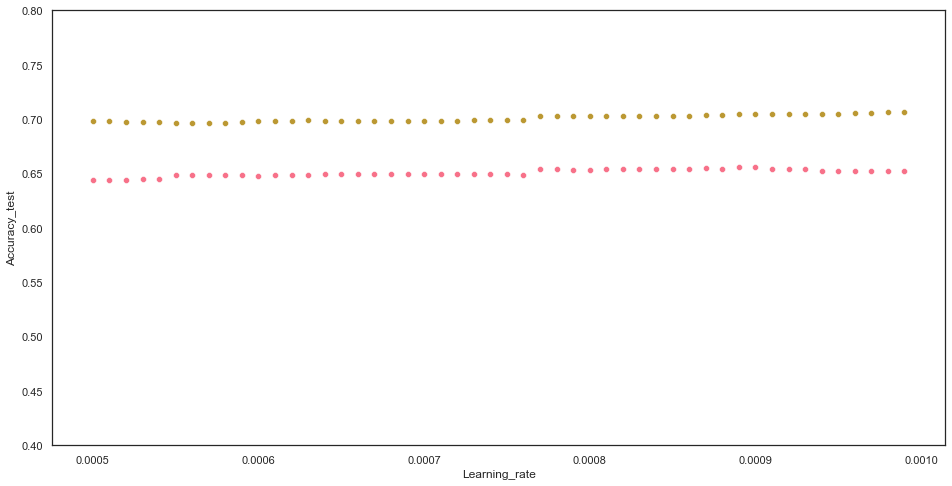

In [297]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_tiny, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_tiny, x="Learning_rate", y="Accuracy_train") #brown
plt.ylim(0.4,0.8)
plt.show(); 

In [188]:
score_duo_tiny["acc_distance"] = score_duo_tiny.Accuracy_train - score_duo_tiny.Accuracy_test

In [298]:
score_duo_tiny.sort_values(by="Accuracy_test", ascending=False).head(20) 
#accuracies are really close in the top. 
#0.0009 still a good one

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
39,0.655810,0.626708,0.534515,0.704237,0.704237,0.704715,0.00089,0.048428,0.048428
40,0.655694,0.626646,0.534493,0.704449,0.704449,0.704936,0.00090,0.048755,0.048755
37,0.654886,0.626213,0.534340,0.703602,0.703602,0.704103,0.00087,0.048716,0.048716
41,0.654539,0.626827,0.534483,0.704661,0.704661,0.705091,0.00091,0.050122,0.050122
43,0.654539,0.627627,0.534690,0.704449,0.704449,0.704886,0.00093,0.049910,0.049910
38,0.654193,0.625841,0.534210,0.703602,0.703602,0.704070,0.00088,0.049409,0.049409
42,0.654193,0.627441,0.534625,0.704661,0.704661,0.705091,0.00092,0.050468,0.050468
36,0.653962,0.625717,0.534166,0.703178,0.703178,0.703628,0.00086,0.049216,0.049216
27,0.653962,0.624917,0.533959,0.702542,0.702542,0.703000,0.00077,0.048581,0.048581
35,0.653962,0.625717,0.534166,0.702966,0.702966,0.703424,0.00085,0.049004,0.049004


In [190]:
score_duo_tiny.sort_values(by="acc_distance", ascending=True).head(20) 
# smaller distances are 0.047/0.048. The distance at a learning rate of 0.0009 is not that much bigger, so I'll select 0.0009.

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
5,0.648880,0.626195,0.534050,0.696610,0.696610,0.696884,0.00055,0.047731,0.047731
6,0.648764,0.626933,0.534235,0.696610,0.696610,0.696884,0.00056,0.047846,0.047846
8,0.648533,0.626809,0.534193,0.696610,0.696610,0.696884,0.00058,0.048077,0.048077
7,0.648533,0.626809,0.534193,0.696610,0.696610,0.696884,0.00057,0.048077,0.048077
39,0.655810,0.626708,0.534515,0.704237,0.704237,0.704715,0.00089,0.048428,0.048428
27,0.653962,0.624917,0.533959,0.702542,0.702542,0.703000,0.00077,0.048581,0.048581
22,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00072,0.048636,0.048636
19,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00069,0.048636,0.048636
20,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00070,0.048636,0.048636
37,0.654886,0.626213,0.534340,0.703602,0.703602,0.704103,0.00087,0.048716,0.048716


In [191]:
# hardcoding the chosen learning rates to keep them constant over runs
top_lr_duo = 0.00090
top_lr_duo2 = 0.0388

## Tune hyperparameters to 0.0009

In [192]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [193]:
space["learning_rate"] = top_lr_duo
space

{'learning_rate': 0.0009,
 'max_depth': <hyperopt.pyll.base.Apply at 0x1d4815f44c0>,
 'gamma': <hyperopt.pyll.base.Apply at 0x1d4815f4700>,
 'reg_alpha': <hyperopt.pyll.base.Apply at 0x1d4815f4820>,
 'reg_lambda': <hyperopt.pyll.base.Apply at 0x1d4815f4670>,
 'colsample_bytree': <hyperopt.pyll.base.Apply at 0x1d4822c4040>,
 'min_child_weight': <hyperopt.pyll.base.Apply at 0x1d4822c46a0>,
 'n_estimators': 180,
 'seed': 3}

In [194]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:55,  1.78trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:51,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6452991452991453                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:54,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:50,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:52,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:48,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6273966273966274                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:50,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:50,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:46,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:49,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:51,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:46,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:42,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:40,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:39,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:42,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:39,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:37,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:42,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:40,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:11<00:41,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:37,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:36,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 27%|████████████▋                                  | 27/100 [00:13<00:38,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:36,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:35,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 30%|██████████████                                 | 30/100 [00:15<00:39,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:36,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:34,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:32,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:32,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:32,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:18<00:35,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:32,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:30,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:30,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:29,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:27,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:22<00:28,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:28,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:23<00:28,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:27,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:25,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6133056133056133                                                                                                     
 49%|███████████████████████                        | 49/100 [00:25<00:27,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:26,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:24,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:26<00:24,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:23,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:27<00:22,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:21,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:28<00:21,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:20,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:29<00:19,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:29<00:18,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:18,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:17,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:18,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:32<00:17,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:16,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:16,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:15,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:14,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:13,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:13,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:13,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:12,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:11,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:12,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:11,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:09,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:08,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:07,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:06,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:05,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:05,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:03,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:02,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:39,  2.51trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:44,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:43,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:40,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:43,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:44,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:47,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:46,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:43,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:40,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:42,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:44,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:45,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:41,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:37,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:36,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5988680988680989                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:37,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:38,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:35,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:34,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:33,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:34,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:33,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:33,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:32,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:31,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:30,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:13<00:33,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 31%|██████████████▌                                | 31/100 [00:14<00:34,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:32,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:31,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:30,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:27,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:27,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:26,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:28,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:30,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:27,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:26,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:25,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:25,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:26,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:25,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:23,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:23,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:21,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:21,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:20,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:19,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:25<00:22,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:26<00:23,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:21,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:27<00:19,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:18,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:17,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:17,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:16,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:15,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:15,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:30<00:16,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:15,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:14,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:32<00:15,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:32<00:15,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:14,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:13,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:13,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:12,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:11,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:10,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:10,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:38<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:08,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:07,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:06,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:05,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:01,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:55,  1.79trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:50,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:51,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:47,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:48,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:44,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:48,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:41,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:42,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6195426195426196                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:46,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:43,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:40,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:41,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:42,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:44,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:41,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:38,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:36,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:36,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 24%|███████████▎                                   | 24/100 [00:11<00:39,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:37,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 27%|████████████▋                                  | 27/100 [00:13<00:38,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:36,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:34,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:33,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:15<00:36,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:34,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:33,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:16<00:34,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6122661122661123                                                                                                     
 35%|████████████████▍                              | 35/100 [00:17<00:36,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:33,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:31,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:30,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:28,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:26,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:26,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:26,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:25,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:24,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:25,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:23<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:25,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:24,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:23,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:22,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:22,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6428736428736429                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:22,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:28<00:23,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:21,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:20,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:18,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:17,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:17,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:16,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:31<00:17,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:18,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:16,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:32<00:17,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:16,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:14,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:14,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:14,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:13,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:12,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:11,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:10,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:09,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:08,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:08,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:07,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:07,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:07,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:06,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:05,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:05,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:01,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:00,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:39,  2.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:38,  2.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:38,  2.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:39,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:37,  2.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:02<00:38,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:37,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:03<00:36,  2.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:36,  2.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:04<00:36,  2.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:04<00:35,  2.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:40,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 14%|██████▌                                        | 14/100 [00:05<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:06<00:42,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:44,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:44,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:43,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:39,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:39,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:38,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:10<00:38,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:36,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:33,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:32,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 27%|████████████▋                                  | 27/100 [00:12<00:35,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:12<00:37,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:32,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:30,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:32,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:15<00:34,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:31,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:31,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:29,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:28,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:27,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:19<00:29,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:27,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:26,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:25,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:24,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:22<00:26,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:24,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:23<00:25,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:23,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:22,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:21,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:21,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:20,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:26<00:21,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:26<00:22,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:27<00:21,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:20,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:19,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:28<00:20,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:30<00:17,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:16,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:31<00:16,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:16,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:32<00:16,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:15,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:13,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:14,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:13,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:13,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:13,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:12,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:11,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:10,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:09,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:38<00:09,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:09,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:39<00:09,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:08,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:07,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:06,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:05,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:03,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:04,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:02,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:41,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:40,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:39,  2.45trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:43,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:46,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:42,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:41,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:46,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:45,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:47,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:48,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:44,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:40,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:38,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:39,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:37,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:37,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.49272349272349275                                                                                                    
 20%|█████████▍                                     | 20/100 [00:09<00:39,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:37,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:36,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:35,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:34,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:33,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:32,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:31,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5990990990990991                                                                                                     
 31%|██████████████▌                                | 31/100 [00:14<00:33,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:32,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:31,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:30,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:29,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:28,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:30,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:30,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:31,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:27,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:26,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:21<00:27,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:26,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:22<00:27,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:23<00:29,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:26,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:24<00:25,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:23,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:25<00:25,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:22,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:20,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:20,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:28<00:21,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:29<00:21,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:19,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:17,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:17,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:17,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:16,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:15,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:14,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:12,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:12,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:12,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:11,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:10,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:10,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:10,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:09,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:10,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:39<00:10,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:10,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:09,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:08,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:07,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:07,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:07,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:07,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:06,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:05,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:04,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:01,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:40,  2.45trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:44,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:51,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:46,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:44,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6164241164241164                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:47,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5928620928620929                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:50,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:49,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:48,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:45,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:43,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:40,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:42,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:39,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:42,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:44,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:40,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:41,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:39,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:37,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:35,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:36,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:34,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:33,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:32,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:32,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:32,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:31,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:30,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:29,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:29,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:29,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:28,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:19<00:30,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:20<00:32,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:28,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:22<00:30,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:27,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:26,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:25,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:24<00:27,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:26,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:24,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:24,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:26<00:24,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:26<00:26,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:27<00:26,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:23,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:28<00:24,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:29<00:25,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:29<00:25,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:30<00:22,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:21,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:31<00:21,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:20,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:32<00:18,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:32<00:17,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:33<00:17,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:15,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:15,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:14,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:14,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:13,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:13,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:12,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:12,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:37<00:13,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:12,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:38<00:12,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:11,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:39<00:10,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:10,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:40<00:09,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:41<00:08,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:41<00:09,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:08,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:43<00:06,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:44<00:05,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:45<00:04,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:01,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:39,  2.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:38,  2.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5705705705705706                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:43,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:41,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:39,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:41,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:41,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:40,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 11%|█████▏                                         | 11/100 [00:04<00:40,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:05<00:36,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:34,  2.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:06<00:38,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:06<00:35,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:34,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6368676368676369                                                                                                     
 18%|████████▍                                      | 18/100 [00:07<00:36,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:35,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:08<00:33,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:09<00:37,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:09<00:38,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:36,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:11<00:37,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:34,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:33,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:12<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:32,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:31,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:14<00:33,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:31,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:29,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:29,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:27,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:27,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:16<00:29,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:27,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:17<00:25,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:24,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:18<00:25,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:19<00:23,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:19<00:23,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:22,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:20<00:24,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:20<00:23,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:21<00:27,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:25,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:22<00:24,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:23,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:25,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:24,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:24<00:24,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:22,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:25<00:20,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:19,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6172326172326172                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:26<00:20,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:18,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:27<00:17,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:16,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:28<00:16,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:15,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:29<00:15,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:29<00:14,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:30<00:15,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:30<00:14,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:31<00:14,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:31<00:14,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:32<00:13,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:32<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:33<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:33<00:11,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:11,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:34<00:10,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:34<00:09,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:35<00:09,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:35<00:09,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:36<00:09,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:36<00:08,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:37<00:07,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:37<00:07,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:38<00:06,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:38<00:07,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:39<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:39<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:39<00:05,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:40<00:04,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:40<00:04,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:41<00:04,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:41<00:03,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:42<00:03,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:43<00:02,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:44<00:01,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:38,  2.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:40,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:37,  2.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:37,  2.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:40,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:39,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:02<00:38,  2.42trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:42,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:03<00:40,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:40,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:04<00:39,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:37,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:40,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:36,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:34,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:06<00:33,  2.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:36,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:07<00:35,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6215061215061215                                                                                                     
 19%|████████▉                                      | 19/100 [00:08<00:36,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 20%|█████████▍                                     | 20/100 [00:08<00:37,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:35,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:09<00:34,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:09<00:33,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:32,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:10<00:34,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:33,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:11<00:31,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:31,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:12<00:30,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:13<00:32,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:13<00:30,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:13<00:28,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:29,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:14<00:31,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:29,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:15<00:28,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:16<00:30,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:28,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:17<00:26,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:26,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:18<00:24,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:18<00:24,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:19<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:19<00:25,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:24,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:20<00:22,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:21<00:25,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5686070686070686                                                                                                     
 49%|███████████████████████                        | 49/100 [00:21<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:22<00:24,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:22<00:22,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:21,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:23<00:20,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:24<00:22,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:24<00:20,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:25<00:20,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:25<00:19,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:25<00:18,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:26<00:18,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:26<00:19,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:27<00:18,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:27<00:17,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:28<00:16,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:28<00:15,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:29<00:15,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:29<00:15,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:29<00:14,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:30<00:13,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:30<00:13,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:31<00:12,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:31<00:13,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:32<00:13,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:32<00:12,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:33<00:11,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:33<00:11,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:33<00:10,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:34<00:10,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:34<00:09,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:35<00:09,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:35<00:08,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:36<00:08,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:36<00:08,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:37<00:07,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:37<00:07,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:38<00:07,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:38<00:06,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:39<00:06,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:39<00:05,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:40<00:05,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:40<00:04,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:41<00:03,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:41<00:03,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:43<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:38,  2.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:43,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:45,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:42,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:40,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6156156156156156                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:44,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:46,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:47,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:46,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6152691152691153                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:47,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:45,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:43,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:40,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:37,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:35,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:38,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:40,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:37,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:36,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:34,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:34,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:33,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:31,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:30,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:30,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:30,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:30,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:29,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:30,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:16<00:31,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:29,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:28,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:27,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:19<00:29,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:26,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:24,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6471471471471472                                                                                                     
 47%|██████████████████████                         | 47/100 [00:22<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:24,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:23,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:21,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:20,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:19,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:25<00:21,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:20,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:19,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:18,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:19,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:17,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:18,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:17,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:30<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:31<00:17,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:15,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:14,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:13,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:13,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:12,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:11,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:11,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6004851004851005                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:11,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6164241164241164                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:12,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:11,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:11,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:10,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:09,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:09,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:08,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:07,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:06,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:06,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:01,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:55,  1.78trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:53,  1.84trial/s, best loss: -0.5808500808500808]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:49,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:50,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:49,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:51,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:47,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6481866481866482                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:41,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:38,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:40,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:38,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:38,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:40,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:42,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:10<00:42,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:39,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:32,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:31,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:14<00:33,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:32,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:30,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:28,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:16<00:31,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:30,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:29,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:28,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:27,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:26,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:26,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:26,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:20<00:27,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:26,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:22<00:27,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:25,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:23,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:22,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:22,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:21,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:21,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:20,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:20,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:19,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:19,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:20,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:18,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:17,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:19,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:30<00:18,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:19,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:31<00:18,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:17,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:16,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:15,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:15,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:14,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:12,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:11,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:11,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:10,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:10,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:08,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:08,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:08,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:07,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:07,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:06,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [00:48<00:00,  2.08trial/s, best loss: -0.933009933009933]


try the best params

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8077
           1       0.10      0.61      0.17       581

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.63      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63     

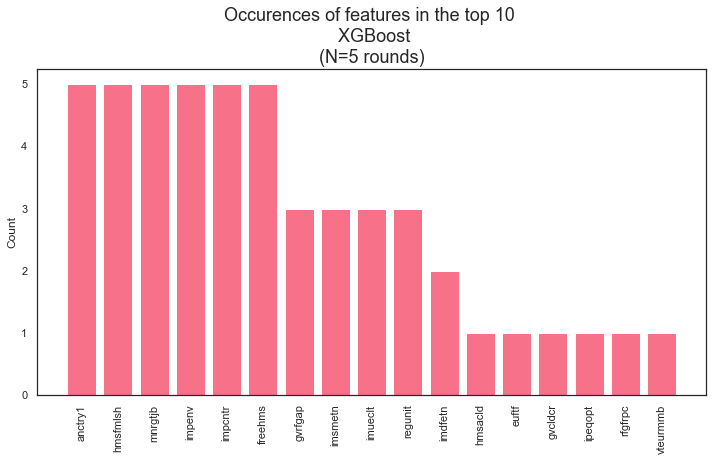

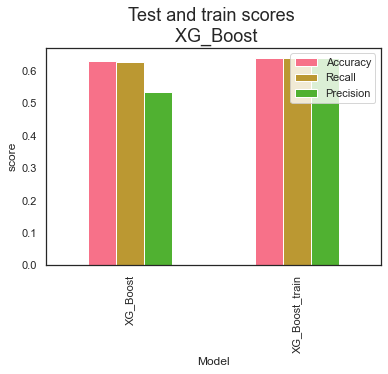

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8077
           1       0.10      0.60      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.63      0.19       579

    accuracy                           0.64      8658
   macro avg       0.54      0.63     

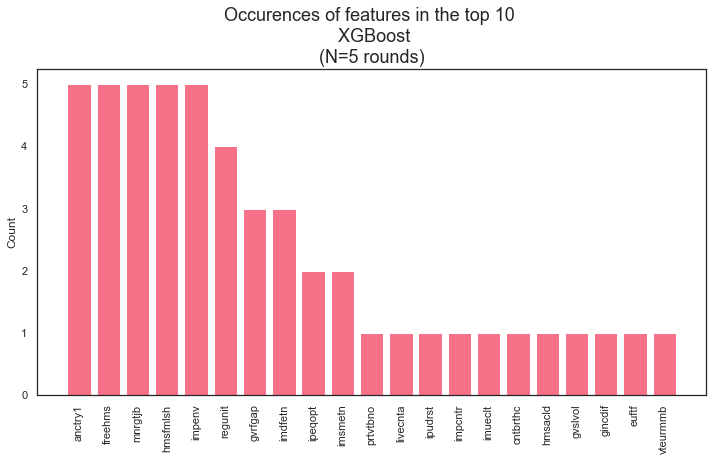

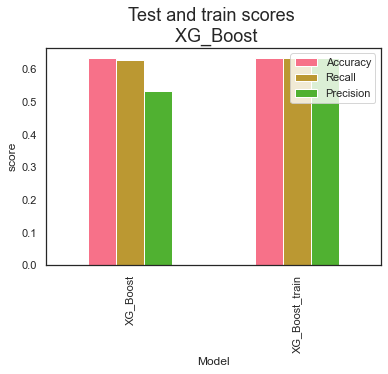

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.59      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63     

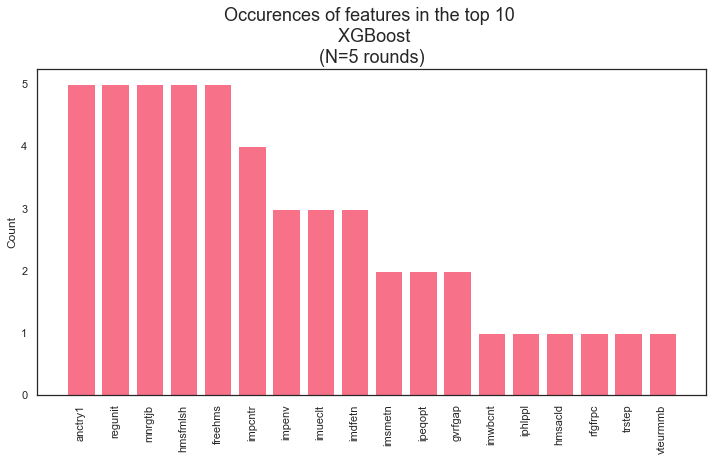

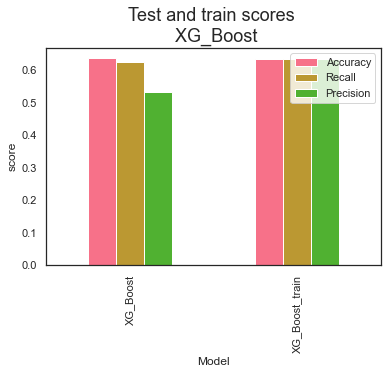

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.91      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8077
           1       0.10      0.60      0.17       581

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63     

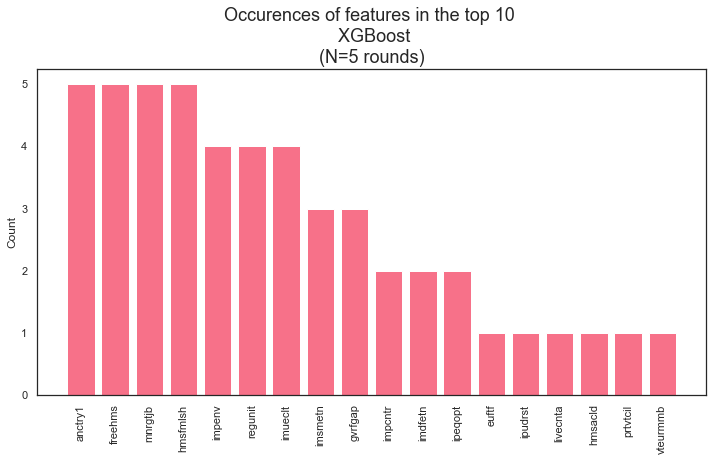

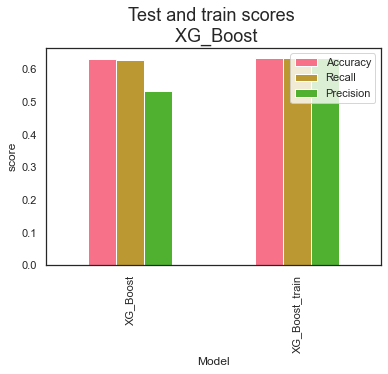

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.62      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8077
           1       0.10      0.60      0.18       581

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63     

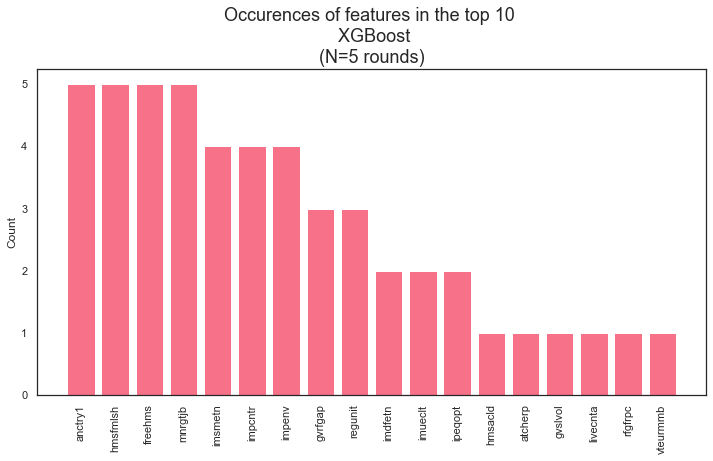

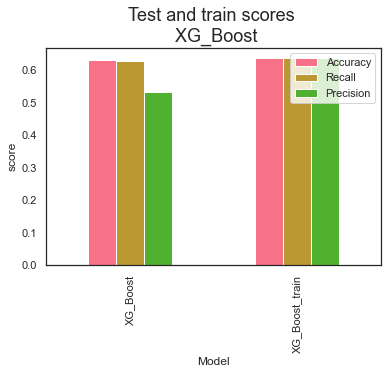

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.61      0.75      8077
           1       0.10      0.60      0.17       581

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8079
           1       0.11      0.64      0.18       579

    accuracy                           0.62      8658
   macro avg       0.53      0.63     

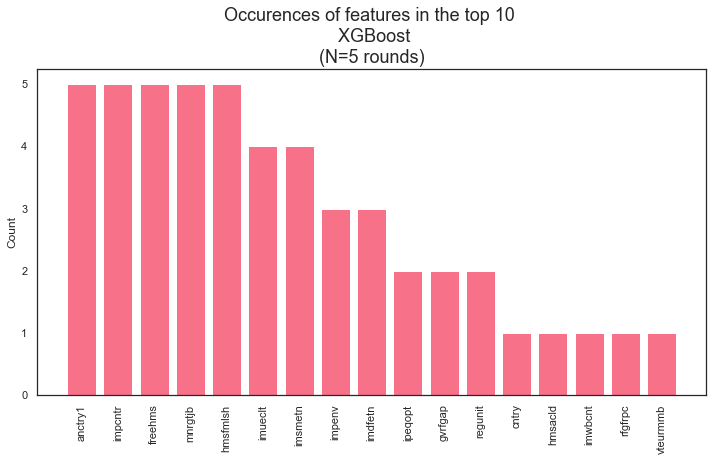

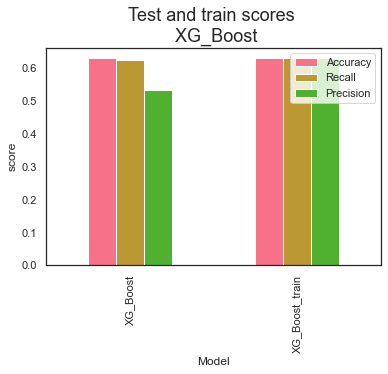

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.91      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.59      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8079
           1       0.11      0.64      0.18       579

    accuracy                           0.62      8658
   macro avg       0.53      0.63     

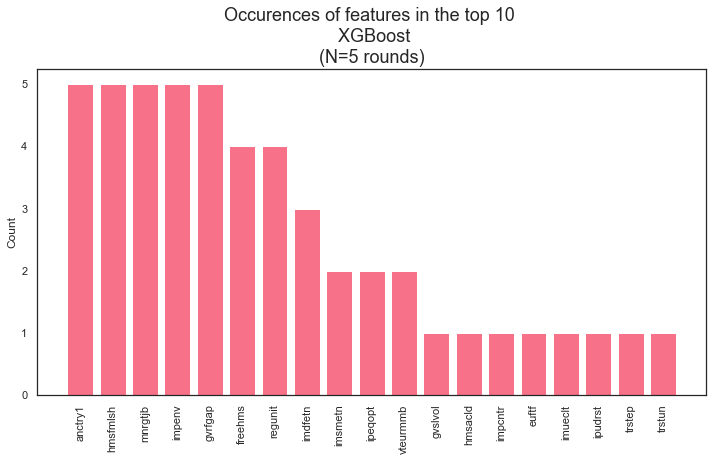

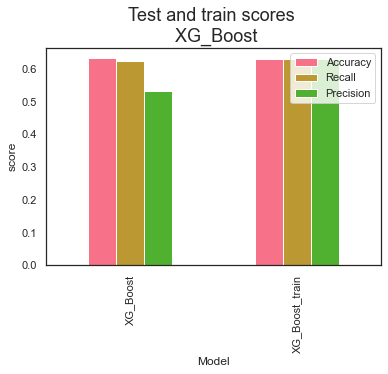

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.62      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.62      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8079
           1       0.11      0.62      0.18       579

    accuracy                           0.63      8658
   macro avg       0.53      0.62     

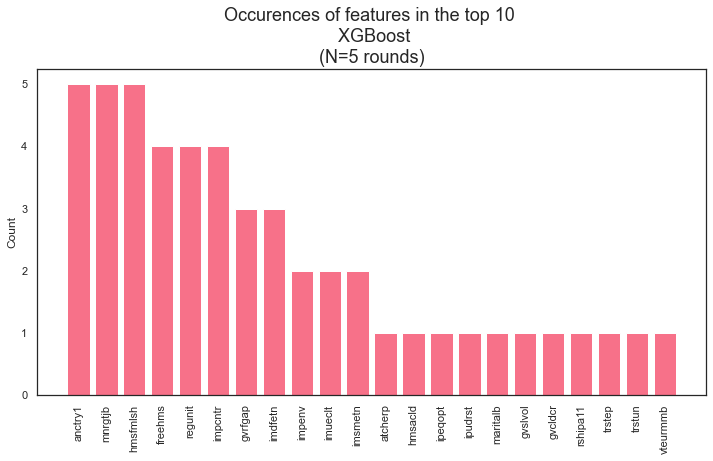

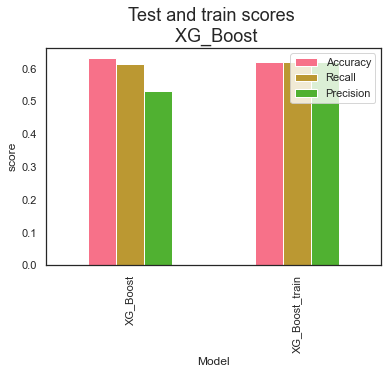

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.58      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.63     

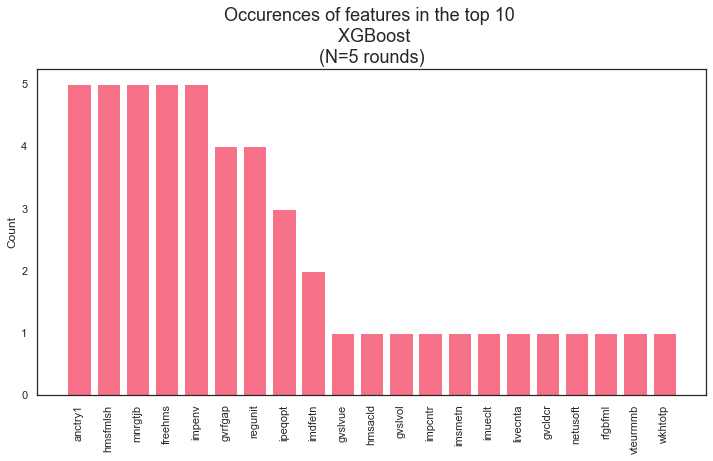

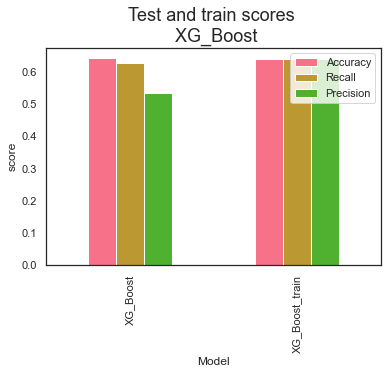

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8077
           1       0.10      0.62      0.18       581

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.63      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63     

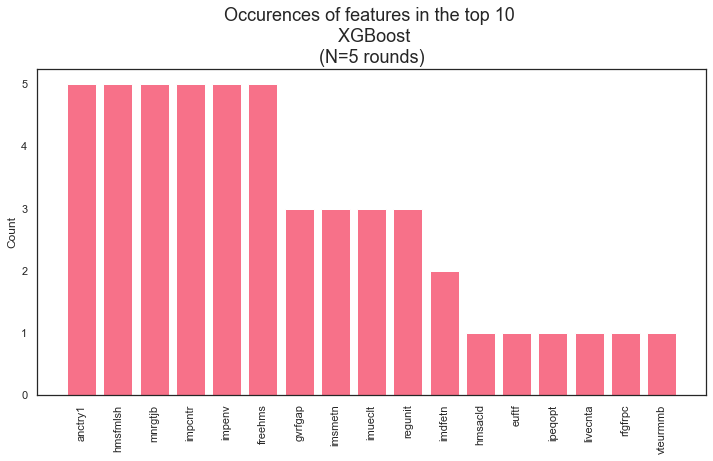

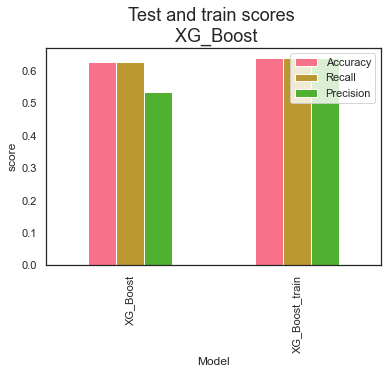

In [195]:
top_param_duo =top_param(X_noclimate, y_duo, random_states, top_lr_duo, True, values_list_duo)

In [196]:
top_param_duo

{'reg_alpha': 151.0,
 'colsample_bytree': 0.8850472877640316,
 'reg_lambda': 0.7573210757370726,
 'gamma': 1.737647877607266,
 'min_child_weight': 2.0,
 'max_depth': 8}

In [197]:
#hardcode it
top_param_duo = {'min_child_weight': 6.0,
                 'reg_lambda': 0.5589027026789879,
                 'reg_alpha': 142.0,
                 'gamma': 7.419771513351132,
                 'max_depth': 7,
                 'colsample_bytree': 0.9971628728010141}

4678 4678
Random state: 0 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8057
           1       0.11      0.55      0.18       601

    accuracy                           0.65      8658
   macro avg       0.53      0.60      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4702 4702
Random state: 1 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8069
           1       0.11      0.55      0.18       589

    accuracy                           0.65      8658
   macro avg       0.53      0.60      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4750 4750
Random state: 2 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8093
           1       0.09      0.52      0.16       565

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0

4678 4678
Random state: 20 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8057
           1       0.11      0.56      0.18       601

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4746 4746
Random state: 21 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8091
           1       0.10      0.56      0.17       567

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4722 4722
Random state: 22 
               precision    recall  f1-score   support

           0       0.95      0.67      0.78      8079
           1       0.11      0.56      0.18       579

    accuracy                           0.66      8658
   macro avg       0.53      0.61    

4662 4662
Random state: 40 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8049
           1       0.11      0.55      0.18       609

    accuracy                           0.65      8658
   macro avg       0.53      0.60      0.48      8658
weighted avg       0.89      0.65      0.73      8658
 

4646 4646
Random state: 41 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8041
           1       0.11      0.56      0.19       617

    accuracy                           0.66      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.66      0.74      8658
 

4700 4700
Random state: 42 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8068
           1       0.11      0.55      0.18       590

    accuracy                           0.65      8658
   macro avg       0.53      0.60    

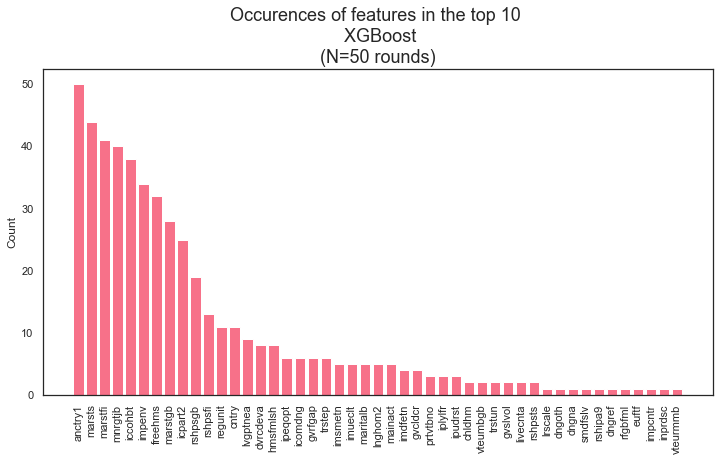

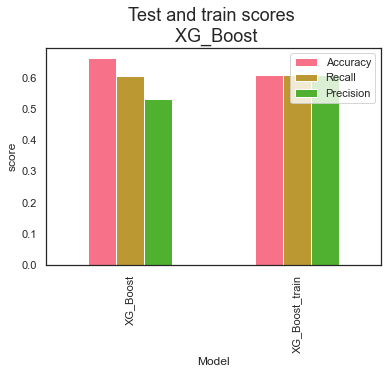

In [198]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

duo_scores, duo_feats = XG_Boost(X_noclimate, y_duo, random_states_many, True, top_lr_duo, top_param_duo)

In [199]:
duo_scores #looks good!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.661273,0.605449,0.529787,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.606459,0.606459,0.608692,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [200]:
get_fullname(duo_feats, metadata).sort_values(by="importance", ascending=False)

,indices,importance,shorthand,full_text
0,316,0.416313,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
19,92,0.240931,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
34,87,0.217276,mnrgtjb,Men should have more right to job than women when jobs are scarce
12,89,0.213431,hmsfmlsh,Ashamed if close family member gay or lesbian
17,94,0.199570,impcntr,Allow many/few immigrants from poorer countries outside Europe
8,88,0.162927,freehms,Gays and lesbians free to live life as they wish
18,336,0.150058,impenv,Important to care for nature and environment
43,17,0.120715,trstep,Trust in the European Parliament
22,320,0.117939,ipeqopt,Important that people are treated equally and have equal opportunities
46,184,0.116721,vteurmmb,Would vote for [country] to remain member of European Union or leave


Check against score of other learning rate..

## Tune hyperparameters to 0.0388

In [201]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [202]:
space["learning_rate"] = top_lr_duo2

In [203]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo2 = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo2.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:36,  2.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:39,  2.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:38,  2.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:41,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:40,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:45,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:42,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:40,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:41,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:43,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:40,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:37,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:41,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:42,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:43,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:39,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:37,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:36,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:35,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:34,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:34,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:32,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:31,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:31,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:31,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:30,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:29,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:30,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:29,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:29,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:29,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:16<00:30,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:29,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:31,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:30,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:28,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:19<00:27,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:26,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5794640794640795                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:26,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:25,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:23,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:22,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:21,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:24<00:23,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:25<00:24,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:23,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:26<00:23,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:21,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:27<00:20,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:19,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:18,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5944790944790945                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:19,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:20,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:30<00:20,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:18,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:31<00:17,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:15,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:14,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:13,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:12,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:11,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:11,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:10,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:10,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:09,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:08,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:07,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:05,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:05,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:03,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:37,  2.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:42,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:45,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:50,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:51,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:45,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:43,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:46,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:43,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:38,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:37,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:36,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:36,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:35,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:38,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:35,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:34,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:33,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:33,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:34,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:33,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:33,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:33,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:33,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:33,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:32,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:32,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:13<00:34,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:33,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5794640794640795                                                                                                     
 32%|███████████████                                | 32/100 [00:15<00:37,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:35,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:32,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:31,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:17<00:34,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:17<00:35,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:18<00:35,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:33,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6188496188496189                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:19<00:33,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:20<00:35,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:32,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:29,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:28,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:27,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:26,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:25,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:24,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:23,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:23,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:24<00:25,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:22,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:21,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:20,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:20,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:27<00:22,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:21,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:28<00:21,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:20,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:18,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:17,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:16,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:31<00:16,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:15,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:15,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:15,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:14,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:13,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.49272349272349275                                                                                                    
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:13,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:12,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:13,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:13,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:11,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:10,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:09,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:08,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:06,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:06,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:01,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:41,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:01<00:46,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:51,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:51,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:52,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:54,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:50,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6416031416031416                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:48,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:44,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:42,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:40,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:42,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:39,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.49272349272349275                                                                                                    
 16%|███████▌                                       | 16/100 [00:08<00:42,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:38,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.588011088011088                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:39,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:37,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:36,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:39,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:36,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:12<00:37,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 27%|████████████▋                                  | 27/100 [00:13<00:38,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:14<00:40,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:36,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 30%|██████████████                                 | 30/100 [00:15<00:38,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:36,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:34,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:32,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:30,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:29,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:28,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:28,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:29,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:27,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:26,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:26,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:25,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:25,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:22<00:26,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:23,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:23,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:23,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:22,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:25<00:23,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:22,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:21,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:21,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:27<00:22,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:19,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:21,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:29<00:21,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:30<00:21,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:21,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:19,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:18,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:16,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:15,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:14,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:14,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:13,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:12,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:13,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:13,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:13,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:12,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:11,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:10,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:10,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:09,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:08,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:05,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:03,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:01,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:00,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:37,  2.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:36,  2.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:36,  2.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:35,  2.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:01<00:34,  2.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:39,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:02<00:42,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:38,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:03<00:36,  2.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:03<00:35,  2.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:04<00:39,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:41,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:42,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:39,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:06<00:39,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:41,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5920535920535921                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:43,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:42,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:38,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 20%|█████████▍                                     | 20/100 [00:08<00:38,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:37,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:09<00:35,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:32,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:31,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:11<00:31,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:12<00:34,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:12<00:31,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:31,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:13<00:29,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:14<00:31,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:31,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:30,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:28,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:27,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:16<00:29,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:27,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:17<00:28,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:27,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:18<00:25,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:19<00:24,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:19<00:24,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:24,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:22,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6349041349041349                                                                                                     
 47%|██████████████████████                         | 47/100 [00:21<00:24,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:21<00:25,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:22<00:26,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:22<00:24,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:21,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:23<00:22,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:21,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:24<00:20,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:25<00:19,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:25<00:20,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:19,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:26<00:18,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:17,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:27<00:17,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:18,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:28<00:18,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:16,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:29<00:16,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:29<00:15,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:30<00:14,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:30<00:14,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:31<00:13,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:31<00:12,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:32<00:12,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:32<00:12,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:32<00:11,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:33<00:11,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:33<00:10,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:34<00:10,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:34<00:10,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:35<00:09,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:35<00:08,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:35<00:08,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:36<00:07,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:36<00:07,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:37<00:07,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:37<00:07,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:38<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:38<00:06,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:39<00:05,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:39<00:05,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:40<00:05,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:40<00:04,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:40<00:04,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:41<00:03,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:41<00:03,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:43<00:01,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:44<00:00,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:47,  2.07trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:45,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:47,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:43,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:45,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:41,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:40,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:38,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.612959112959113                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:42,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:41,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:42,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:44,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:39,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6036036036036037                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:37,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:35,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:33,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:33,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:32,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:32,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:32,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:31,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:30,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:13<00:33,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:32,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:32,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:30,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:28,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:26,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:25,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:25,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:25,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:19<00:27,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:19<00:28,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:20<00:29,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:27,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:25,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:21<00:27,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:22<00:28,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:25,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:23,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:22,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:21,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:20,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:25<00:21,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:25<00:20,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:26<00:21,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:22,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:27<00:22,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:20,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:18,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:20,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:30<00:18,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:30<00:18,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:31<00:17,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:16,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:14,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:12,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:12,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:11,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:10,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:10,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:09,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:09,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:09,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:08,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:07,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:07,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:38<00:07,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:06,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:06,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:39<00:06,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:05,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:40<00:05,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:04,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:41<00:05,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:42<00:03,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:44<00:01,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:48,  2.05trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:45,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:42,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:40,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:40,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:38,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:42,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:43,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:45,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:47,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:41,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:38,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:37,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:36,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:39,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:36,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:33,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:37,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:36,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:36,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:33,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:33,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:32,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:32,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:12<00:34,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6187341187341188                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:13<00:36,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:33,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:14<00:36,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:34,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:32,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:31,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:29,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:28,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:26,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:26,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:25,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:25,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:19<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:26,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:25,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:26,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:25,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:22<00:26,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:23<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:24,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:23,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:22,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:21,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:20,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:20,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:19,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:21,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:20,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:19,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:28<00:19,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:18,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:17,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:16,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:15,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:15,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:31<00:16,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:15,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:14,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:32<00:15,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:13,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:12,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:11,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:11,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:10,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:10,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:09,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:38<00:07,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:07,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:06,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:06,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:05,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:05,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:04,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:01,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:53,  1.86trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:53,  1.83trial/s, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.629013629013629                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:55,  1.76trial/s, best loss: -0.629013629013629]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:50,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:53,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:51,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:47,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:46,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:45,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:42,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:43,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:38,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:37,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:40,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:38,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:40,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:38,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:35,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:32,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:31,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:32,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:14<00:35,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:34,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:15<00:35,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:32,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:16<00:34,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 35%|████████████████▍                              | 35/100 [00:17<00:36,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 36%|████████████████▉                              | 36/100 [00:18<00:37,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:34,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:32,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:30,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:29,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:28,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:27,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:26,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:25,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:24,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:24,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:24,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:23,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:24<00:25,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:24,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:25<00:26,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:23,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:24,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:23,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:22,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:28<00:22,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:28<00:23,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:23,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:21,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:20,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:19,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:17,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:17,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:16,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:16,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:15,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:14,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:14,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:34<00:15,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:16,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:15,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:14,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:37<00:14,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:14,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:38<00:13,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:12,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:39<00:10,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:40<00:09,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6048741048741049                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:40<00:10,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:41<00:09,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:07,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:43<00:06,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:05,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:04,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:01,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6262416262416263                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:56,  1.75trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:56,  1.75trial/s, best loss: -0.6546546546546547]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:51,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:45,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:48,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:49,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:45,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:42,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:43,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:40,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:38,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:39,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:37,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:35,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:33,  2.51trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:33,  2.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:37,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:08<00:38,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6349041349041349                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:40,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:37,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:35,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:33,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:31,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:31,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:31,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6265881265881266                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:13<00:35,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:13<00:35,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:33,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 32%|███████████████                                | 32/100 [00:14<00:34,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:32,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:27,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:17<00:29,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:31,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5957495957495957                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:31,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:28,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:20<00:29,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:27,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:24,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:23,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:22,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:22,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:21,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:23<00:23,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:22,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:20,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:20,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:19,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:26<00:21,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:26<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:19,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:18,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:18,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:17,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:19,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:17,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:16,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:16,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:15,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:14,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:13,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:31<00:13,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:12,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:32<00:12,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:12,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:33<00:11,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:11,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:10,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:34<00:10,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:35<00:09,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:35<00:09,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:09,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:36<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:37<00:08,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:38<00:07,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:38<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:07,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:39<00:06,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6211596211596212                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:06,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:40<00:06,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:05,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:41<00:04,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:42<00:03,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.582929082929083                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:44<00:02,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:48,  2.06trial/s, best loss: -0.5808500808500808]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:50,  1.96trial/s, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:46,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:48,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:44,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:41,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:39,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:38,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:42,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:04<00:39,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:37,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:40,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:38,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:43,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:44,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:45,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:46,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:46,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.582929082929083                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:49,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:45,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:47,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:47,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|█████████▌                              | 24/100 [3:00:12<68:24:46, 3240.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|██████████                              | 25/100 [3:00:13<47:15:58, 2268.78s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|██████████▍                             | 26/100 [3:00:14<32:38:54, 1588.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 27%|██████████▊                             | 27/100 [3:00:15<22:32:59, 1112.05s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|███████████▍                             | 28/100 [3:00:15<15:34:17, 778.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|███████████▉                             | 29/100 [3:00:16<10:45:12, 545.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|████████████▌                             | 30/100 [3:00:17<7:25:41, 382.02s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|█████████████                             | 31/100 [3:00:18<5:07:44, 267.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|█████████████▍                            | 32/100 [3:00:18<3:32:27, 187.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|█████████████▊                            | 33/100 [3:00:19<2:26:47, 131.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|██████████████▌                            | 34/100 [3:00:19<1:41:21, 92.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|███████████████                            | 35/100 [3:00:20<1:09:59, 64.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▏                            | 36/100 [3:00:20<48:22, 45.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|████████████████▋                            | 37/100 [3:00:21<33:31, 31.93s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████                            | 38/100 [3:00:21<23:13, 22.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|█████████████████▌                           | 39/100 [3:00:21<16:07, 15.86s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|████████████████                        | 40/100 [5:19:59<42:04:19, 2524.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|████████████████▍                       | 41/100 [5:20:00<28:57:58, 1767.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|████████████████▊                       | 42/100 [5:20:01<19:56:08, 1237.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|█████████████████▋                       | 43/100 [5:20:02<13:43:17, 866.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|██████████████████▍                       | 44/100 [5:20:03<9:26:20, 606.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|██████████████████▉                       | 45/100 [5:20:06<6:30:13, 425.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|███████████████████▎                      | 46/100 [5:20:08<4:28:38, 298.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|███████████████████▋                      | 47/100 [5:20:08<3:04:45, 209.16s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|████████████████████▏                     | 48/100 [5:20:09<2:07:03, 146.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|████████████████████▌                     | 49/100 [5:20:10<1:27:21, 102.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|█████████████████████▌                     | 50/100 [5:20:10<1:00:08, 72.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|██████████████████████▉                      | 51/100 [5:20:11<41:24, 50.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 52%|███████████████████████▍                     | 52/100 [5:20:12<28:33, 35.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 53%|███████████████████████▊                     | 53/100 [5:20:12<19:42, 25.16s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|████████████████████████▎                    | 54/100 [5:20:13<13:41, 17.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|████████████████████████▊                    | 55/100 [5:20:13<09:28, 12.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 56%|█████████████████████████▏                   | 56/100 [5:20:14<06:42,  9.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|█████████████████████████▋                   | 57/100 [5:20:15<04:46,  6.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6174636174636174                                                                                                     
 58%|██████████████████████████                   | 58/100 [5:20:16<03:27,  4.94s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|██████████████████████████▌                  | 59/100 [5:20:17<02:29,  3.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|███████████████████████████                  | 60/100 [5:20:17<01:49,  2.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|███████████████████████████▍                 | 61/100 [5:20:18<01:21,  2.09s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|███████████████████████████▉                 | 62/100 [5:20:19<01:01,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|████████████████████████████▎                | 63/100 [5:20:19<00:46,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|████████████████████████████▊                | 64/100 [5:20:20<00:40,  1.12s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|█████████████████████████████▎               | 65/100 [5:20:20<00:34,  1.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|█████████████████████████████▋               | 66/100 [5:20:21<00:28,  1.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|██████████████████████████████▏              | 67/100 [5:20:21<00:23,  1.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|██████████████████████████████▌              | 68/100 [5:20:22<00:20,  1.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|███████████████████████████████              | 69/100 [5:20:22<00:18,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|███████████████████████████████▍             | 70/100 [5:20:23<00:16,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|███████████████████████████████▉             | 71/100 [5:20:23<00:15,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|████████████████████████████████▍            | 72/100 [5:20:24<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|████████████████████████████████▊            | 73/100 [5:20:24<00:12,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|█████████████████████████████████▎           | 74/100 [5:20:24<00:11,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|█████████████████████████████████▊           | 75/100 [5:20:25<00:11,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|██████████████████████████████████▏          | 76/100 [5:20:25<00:10,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|██████████████████████████████████▋          | 77/100 [5:20:26<00:10,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|███████████████████████████████████          | 78/100 [5:20:26<00:09,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|███████████████████████████████████▌         | 79/100 [5:20:28<00:17,  1.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|████████████████████████████████████         | 80/100 [5:20:29<00:19,  1.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|████████████████████████████████████▍        | 81/100 [5:20:31<00:20,  1.06s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|████████████████████████████████████▉        | 82/100 [5:20:34<00:30,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|█████████████████████████████████████▎       | 83/100 [5:20:38<00:41,  2.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|█████████████████████████████████████▊       | 84/100 [5:20:40<00:38,  2.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|██████████████████████████████████████▎      | 85/100 [5:20:42<00:32,  2.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|██████████████████████████████████████▋      | 86/100 [5:20:44<00:28,  2.07s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|███████████████████████████████████████▏     | 87/100 [5:20:45<00:23,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|███████████████████████████████████████▌     | 88/100 [5:20:47<00:20,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|████████████████████████████████████████     | 89/100 [5:20:48<00:17,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|████████████████████████████████████████▌    | 90/100 [5:20:49<00:14,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|████████████████████████████████████████▉    | 91/100 [5:20:50<00:12,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|█████████████████████████████████████████▍   | 92/100 [5:20:52<00:12,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|█████████████████████████████████████████▊   | 93/100 [5:20:53<00:10,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|██████████████████████████████████████████▎  | 94/100 [5:20:55<00:08,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 95%|██████████████████████████████████████████▊  | 95/100 [5:20:56<00:07,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|███████████████████████████████████████████▏ | 96/100 [5:20:58<00:05,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|███████████████████████████████████████████▋ | 97/100 [5:20:59<00:04,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|████████████████████████████████████████████ | 98/100 [5:21:00<00:02,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|████████████████████████████████████████████▌| 99/100 [5:21:01<00:01,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:01<03:05,  1.88s/trial, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<02:40,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:26,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:05<02:13,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:06<02:01,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  6%|██▉                                             | 6/100 [00:07<02:11,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:09<02:15,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:10<02:09,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:12<02:05,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:14<02:17,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:15<02:19,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 12%|█████▋                                         | 12/100 [00:17<02:20,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:18<02:08,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:19<02:03,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:21<02:00,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:22<02:06,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:24<02:04,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6262416262416263                                                                                                     
 18%|████████▍                                      | 18/100 [00:26<02:12,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:27<02:03,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 20%|█████████▍                                     | 20/100 [00:29<02:09,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:31<02:11,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:32<01:59,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:34<02:02,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6183876183876184                                                                                                     
 24%|███████████▎                                   | 24/100 [00:36<02:10,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:37<01:58,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:38<01:51,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:40<01:42,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:41<01:37,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:42<01:31,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:43<01:27,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:44<01:28,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:46<01:26,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:47<01:26,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:48<01:26,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:50<01:33,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:51<01:28,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:53<01:24,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:54<01:21,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:55<01:19,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:56<01:16,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:58<01:15,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:59<01:20,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:01<01:17,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:02<01:17,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 45%|█████████████████████▏                         | 45/100 [01:04<01:20,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:05<01:15,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:06<01:11,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:07<01:07,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:09<01:13,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:11<01:13,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:12<01:10,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:13<01:04,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:14<01:01,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [01:16<01:05,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:17<01:03,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:19<01:00,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:20<00:56,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:21<00:57,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [01:23<01:04,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [01:26<01:19,  1.98s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:28<01:11,  1.85s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [01:30<01:10,  1.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:31<01:02,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:32<00:57,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [01:34<00:57,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:36<00:54,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:37<00:48,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [01:39<00:52,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:40<00:47,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:42<00:46,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:43<00:43,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:44<00:40,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:46<00:40,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:47<00:38,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:49<00:39,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:51<00:36,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:53<00:38,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:54<00:35,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:56<00:34,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:57<00:31,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:00<00:33,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:01<00:30,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:03<00:29,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:04<00:26,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:06<00:23,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:07<00:20,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:08<00:18,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:10<00:16,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:11<00:15,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [02:13<00:15,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:14<00:12,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:16<00:12,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:17<00:10,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [02:19<00:09,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:21<00:07,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [02:22<00:06,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:24<00:04,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:25<00:02,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:26<00:01,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [02:28<00:00,  1.48s/trial, best loss: -0.933009933009933]


4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.61      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.53      0.16       581

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.56      0.20       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63     

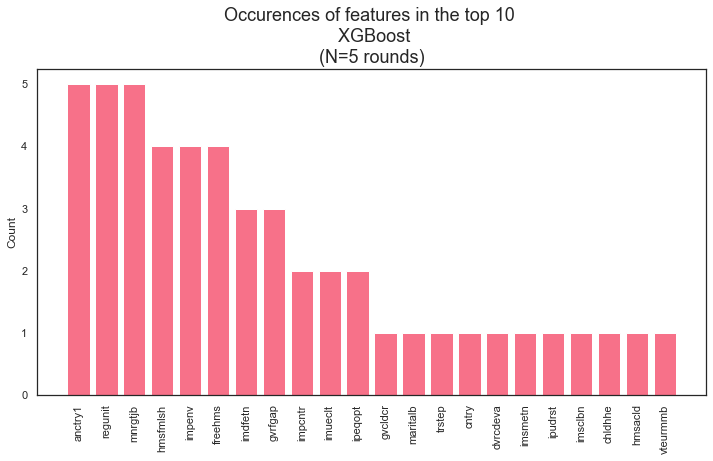

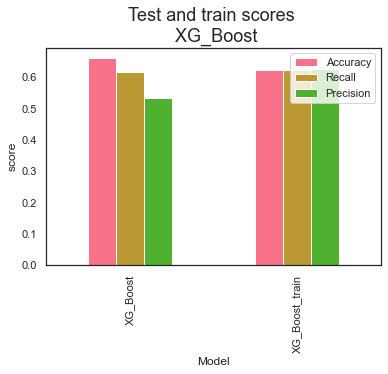

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8077
           1       0.10      0.59      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.12      0.63      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.64     

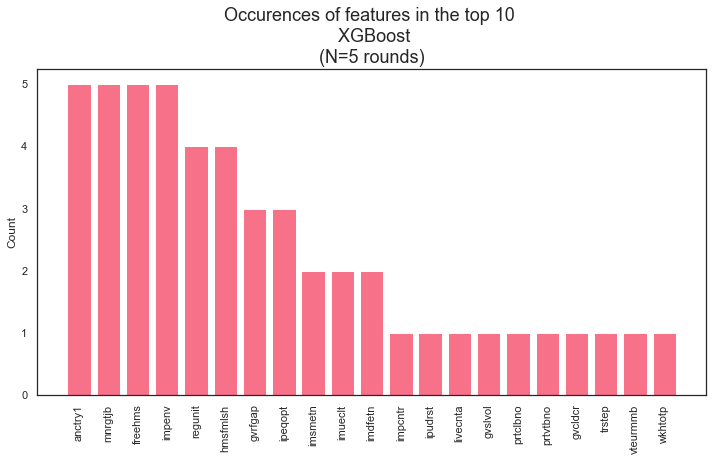

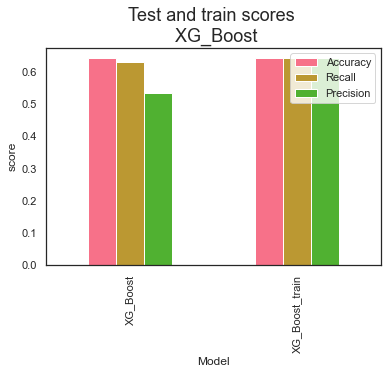

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8077
           1       0.11      0.63      0.19       581

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8079
           1       0.12      0.64      0.20       579

    accuracy                           0.65      8658
   macro avg       0.54      0.65     

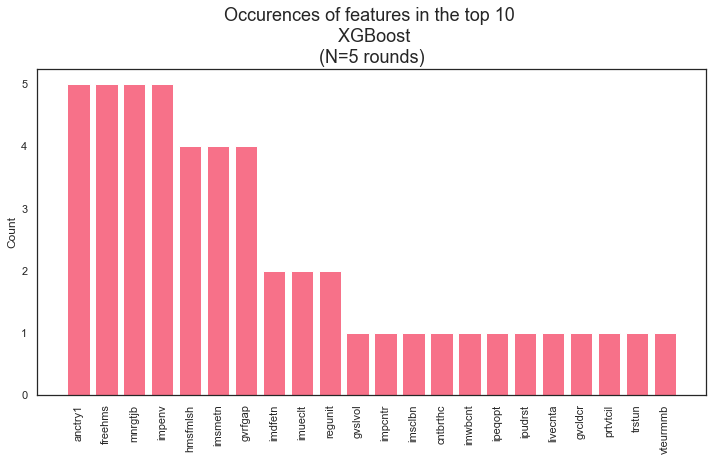

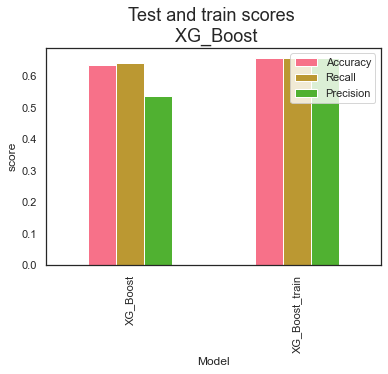

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.66      0.20       582

    accuracy                           0.63      8658
   macro avg       0.54      0.65      0.48      8658
weighted avg       0.91      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8077
           1       0.11      0.64      0.19       581

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8079
           1       0.12      0.66      0.20       579

    accuracy                           0.65      8658
   macro avg       0.54      0.65     

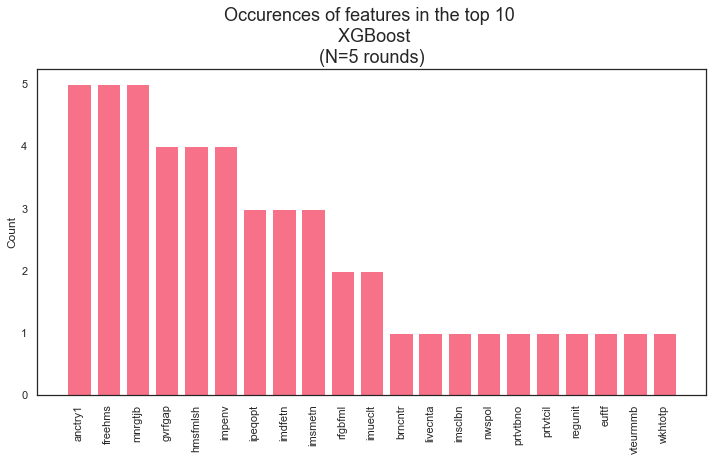

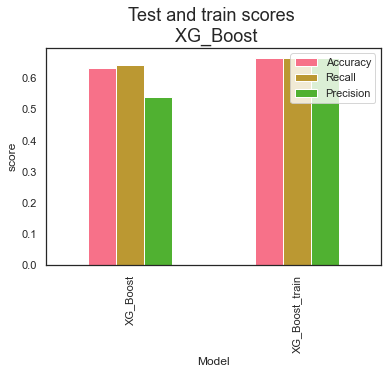

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.54      0.16       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.63      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.56      0.20       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63     

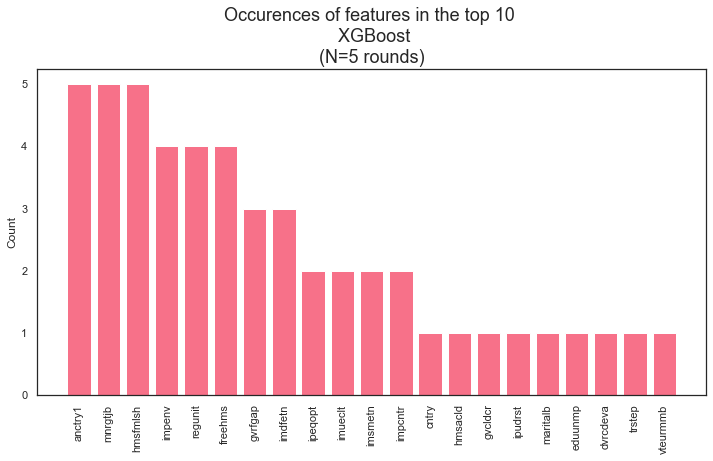

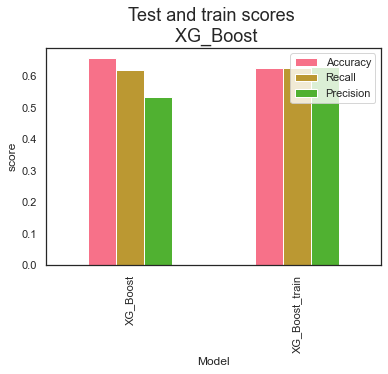

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8077
           1       0.11      0.62      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64     

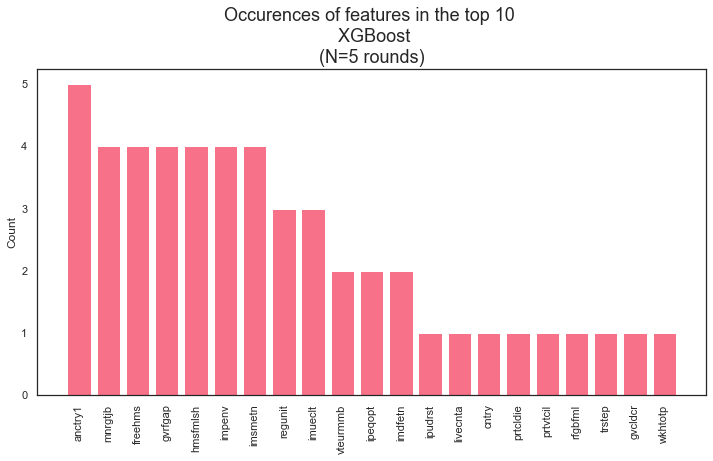

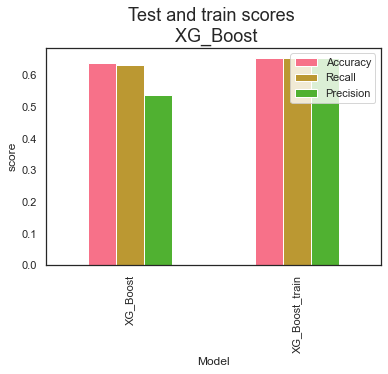

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.18       582

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.54      0.16       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.72      0.82      8079
           1       0.12      0.53      0.19       579

    accuracy                           0.71      8658
   macro avg       0.54      0.62     

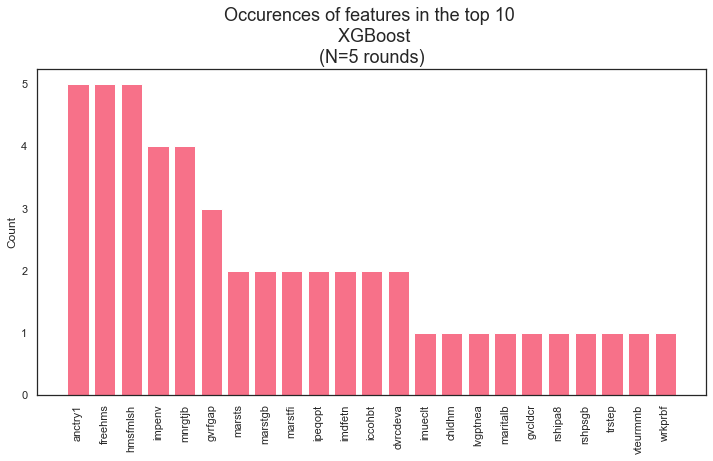

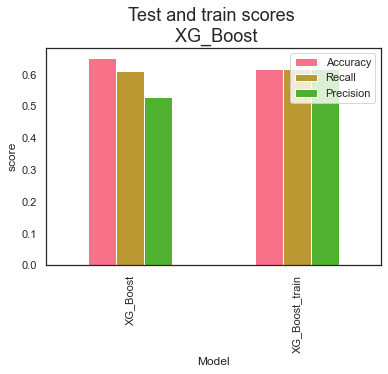

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.54      0.17       581

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8079
           1       0.12      0.57      0.19       579

    accuracy                           0.68      8658
   macro avg       0.54      0.63     

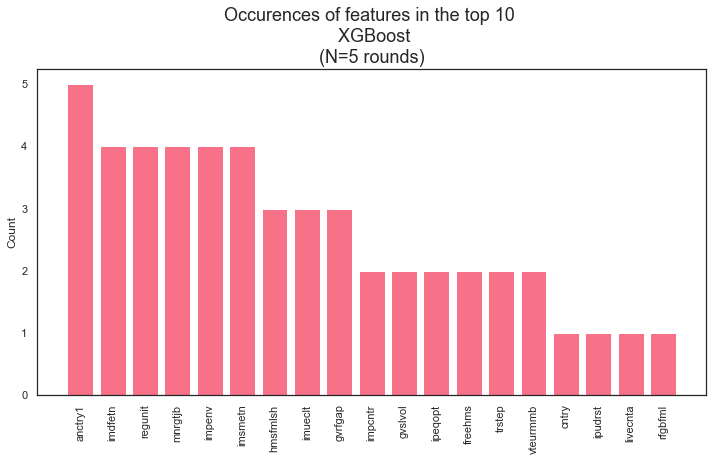

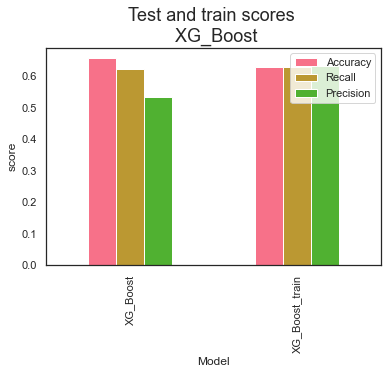

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8076
           1       0.11      0.57      0.18       582

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8077
           1       0.10      0.52      0.16       581

    accuracy                           0.65      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.65      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8079
           1       0.11      0.56      0.18       579

    accuracy                           0.66      8658
   macro avg       0.53      0.61     

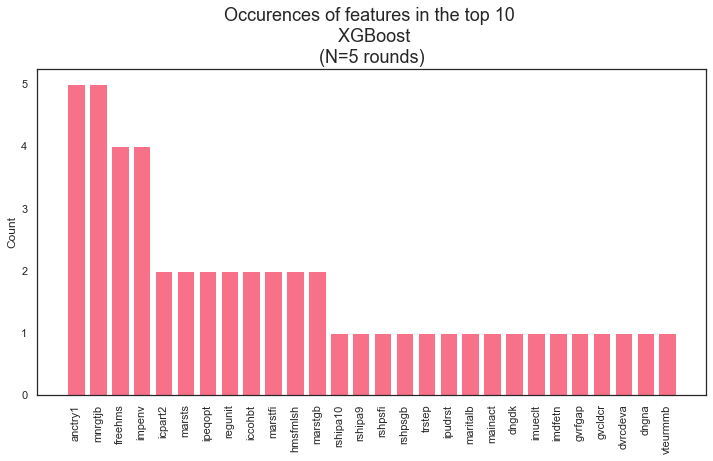

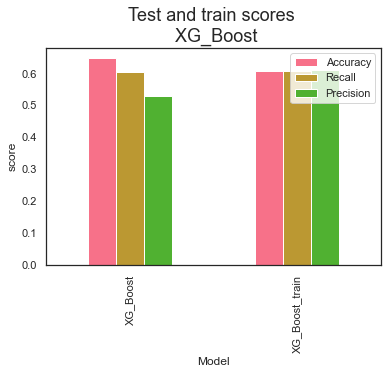

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.62      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.91      0.62      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8077
           1       0.11      0.63      0.18       581

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8079
           1       0.12      0.64      0.20       579

    accuracy                           0.65      8658
   macro avg       0.54      0.65     

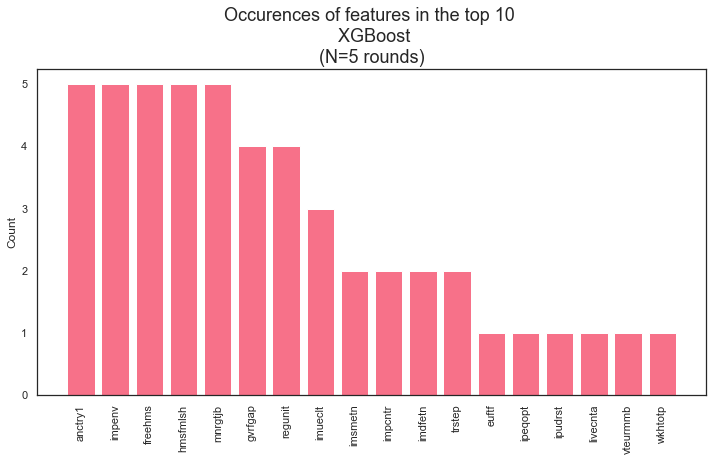

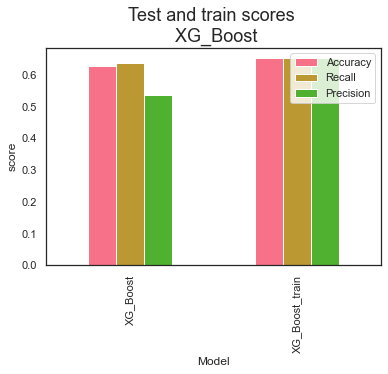

In [204]:
top_param_duo2 = top_param(X_noclimate, y_duo, random_states, top_lr_duo2,True,  values_list_duo2)

In [205]:
top_param_duo2

{'reg_alpha': 165.0,
 'colsample_bytree': 0.6964566179343028,
 'reg_lambda': 0.36832557158062884,
 'gamma': 7.052648365573321,
 'min_child_weight': 8.0,
 'max_depth': 13}

In [206]:
#hardcode it
top_param_duo2 = {'min_child_weight': 4.0,
                 'reg_lambda': 0.014227986296761586,
                 'reg_alpha': 179.0,
                 'gamma': 3.7733608700556553,
                 'max_depth': 14,
                 'colsample_bytree': 0.7472110622403807}

4678 4678
Random state: 0 
               precision    recall  f1-score   support

           0       0.95      0.68      0.79      8057
           1       0.11      0.55      0.19       601

    accuracy                           0.67      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.89      0.67      0.75      8658
 

4702 4702
Random state: 1 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8069
           1       0.11      0.58      0.19       589

    accuracy                           0.66      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4750 4750
Random state: 2 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8093
           1       0.11      0.58      0.18       565

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0

4678 4678
Random state: 20 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8057
           1       0.11      0.62      0.19       601

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4746 4746
Random state: 21 
               precision    recall  f1-score   support

           0       0.96      0.71      0.81      8091
           1       0.12      0.55      0.19       567

    accuracy                           0.70      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.90      0.70      0.77      8658
 

4722 4722
Random state: 22 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63    

4662 4662
Random state: 40 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8049
           1       0.11      0.59      0.19       609

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 

4646 4646
Random state: 41 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8041
           1       0.11      0.59      0.19       617

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 

4700 4700
Random state: 42 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8068
           1       0.12      0.61      0.20       590

    accuracy                           0.67      8658
   macro avg       0.54      0.64    

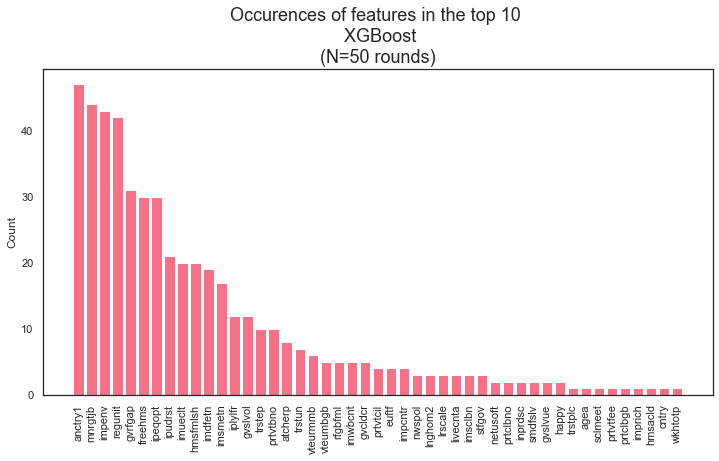

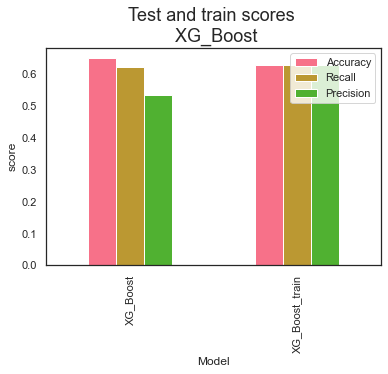

In [207]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

duo2_scores, duo2_feats = XG_Boost(X_noclimate, y_duo, random_states_many, True, top_lr_duo2, top_param_duo2)

In [208]:
duo2_scores # learning rate 0.0388

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.650522,0.622939,0.533988,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.629920,0.629920,0.630745,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [209]:
duo_scores #learning rate 0.0009

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.661273,0.605449,0.529787,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.606459,0.606459,0.608692,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


There is little difference in accuracy-testscore between the learning rates. The model which uses a learning rate of 0.0009 is more overtrained though. I'll therefore continue with the learning rate of 0.0388.

## Find important features

In [210]:
mean_imp2 = get_fullname(duo2_feats, metadata).sort_values(by="importance", ascending=False)
mean_imp2

,indices,importance,shorthand,full_text
1,316,0.102976,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
18,92,0.100649,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
35,26,0.090086,prtvtfee,"Party voted for in last national election, Estonia"
28,87,0.089391,mnrgtjb,Men should have more right to job than women when jobs are scarce
36,340,0.083810,regunit,Regional unit
11,90,0.079225,hmsacld,Gay and lesbian couples right to adopt children
7,142,0.077662,gvrfgap,Government should be generous judging applications for refugee status
22,320,0.077552,ipeqopt,Important that people are treated equally and have equal opportunities
15,336,0.077201,impenv,Important to care for nature and environment
14,94,0.076769,impcntr,Allow many/few immigrants from poorer countries outside Europe


In [211]:
# in some runs features pop up that have mean importance of 0, merge with counts and see if they pop up often

In [212]:
count_imp2 = duo2_feats.groupby("feature").count().sort_values(by="importance", ascending=False).reset_index()
count_imp2 = count_imp2.drop(["importance", "model"], axis=1)

In [213]:
count_imp2.columns = ["feature", "count"]

In [214]:
count_imp2.head()

,feature,count
0,anctry1,47
1,mnrgtjb,44
2,impenv,43
3,regunit,42
4,gvrfgap,31


In [215]:
imp2 = mean_imp2.merge(count_imp2, left_on="shorthand", right_on='feature')

In [216]:
imp2.columns

Index(['indices', 'importance', 'shorthand', 'full_text', 'feature', 'count'], dtype='object')

In [217]:
#change columns around for better view
imp2 = imp2[['indices', 'importance', 'count', 'shorthand', 'full_text', 'feature']]

#sort by count
imp2 = imp2.sort_values(by="count", ascending=False)

#highlight minimum importance
imp2.style.highlight_min(color='pink', subset=['importance'])

,indices,importance,count,shorthand,full_text,feature
0,316,0.102976,47,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
3,87,0.089391,44,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
8,336,0.077201,43,impenv,Important to care for nature and environment,impenv
4,340,0.083810,42,regunit,Regional unit,regunit
6,142,0.077662,31,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
14,88,0.072874,30,freehms,Gays and lesbians free to live life as they wish,freehms
7,320,0.077552,30,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
17,325,0.071599,21,ipudrst,Important to understand different people,ipudrst
13,89,0.073143,20,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
12,96,0.073277,20,imueclt,Country's cultural life undermined or enriched by immigrants,imueclt


In some runs, mean_importances of zero turn up, but - if they are - they do not occur often. Drop them if present.

In [218]:
# NOTE, this dataframe is used for plotting too. Find the plot in the plotting-paragraph
imp2 = imp2[imp2["importance"] != 0]

In [219]:
imp2.sort_values(by="count", ascending=False)

,indices,importance,count,shorthand,full_text,feature
0,316,0.102976,47,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
3,87,0.089391,44,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
8,336,0.077201,43,impenv,Important to care for nature and environment,impenv
4,340,0.083810,42,regunit,Regional unit,regunit
6,142,0.077662,31,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
14,88,0.072874,30,freehms,Gays and lesbians free to live life as they wish,freehms
7,320,0.077552,30,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
17,325,0.071599,21,ipudrst,Important to understand different people,ipudrst
13,89,0.073143,20,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
12,96,0.073277,20,imueclt,Country's cultural life undermined or enriched by immigrants,imueclt


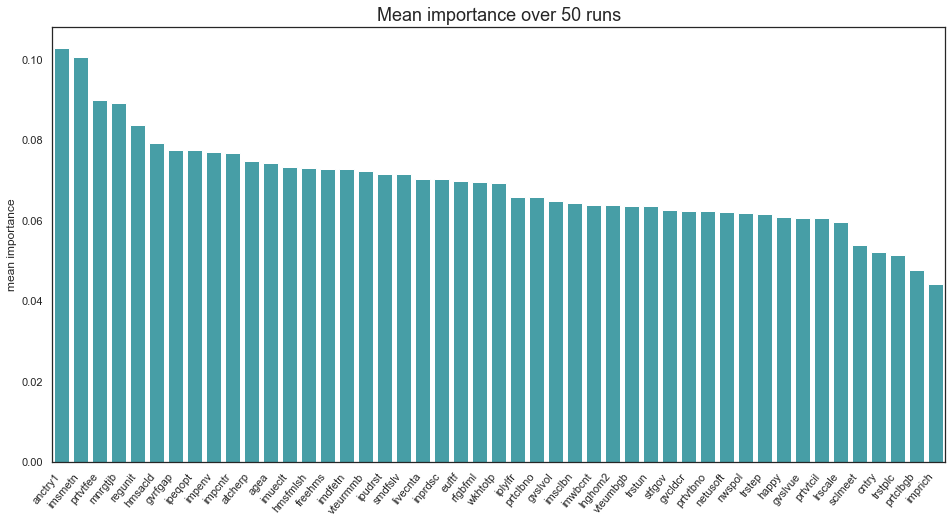

In [220]:
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2.sort_values(by="importance", ascending=False), x="shorthand", y="importance", color=sns.color_palette("husl", 9)[5])
plt.title("Mean importance over 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("mean importance")
plt.show();

#from the plot, the first few features are set apart from the rest. As are some of the last. 
# For the majority though, the importances are not that far apart.

## Drop extra environment question
There was apparently an question about the environment in the not-climate part of the questionnaire and it pops up here (logically). Remove this question and see how the model performs without it.

In [222]:
X_noclimate2 = X_noclimate.drop("impenv", axis=1)

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.71      0.81      8079
           1       0.12      0.55      0.19       579

    accuracy                           0.70      8658
   macro avg       0.54      0.63     

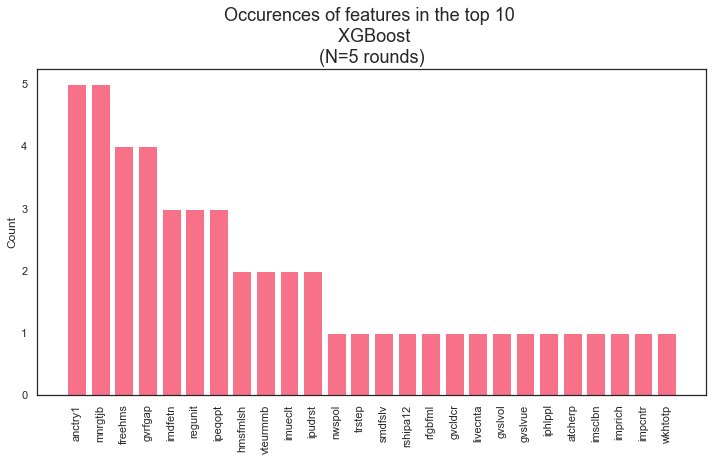

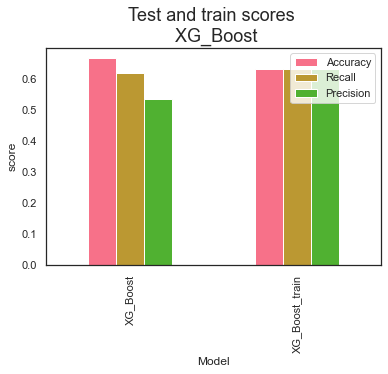

In [223]:
score_nc2_, feat_nc2_ = XG_Boost(X_noclimate2, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [224]:
score_nc2_ #not bad at all, not that big of a difference with the original one.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.665558,0.617852,0.533256,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.629641,0.629641,0.631361,"[5, 12, 19, 26, 33]"


In [225]:
score_duo #orinigal duo X_noclimate score 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.660083,0.660925,0.543856,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.964799,0.964799,0.965434,"[5, 12, 19, 26, 33]"


### Tune learning rate

In [226]:
# learning_rates_smaller=np.arange(0 ,0.01, 0.0001)
# scores_noclimate2 = tune_learning(X_noclimate2, y_duo, 7, True, learning_rates_smaller, empty_dict)

In [227]:
# store in CSV to save runtime
# scores_noclimate2.to_csv('./data/scores_noclimate2.csv', index=False)
scores_noclimate2 = pd.read_csv('./data/scores_noclimate2.csv')

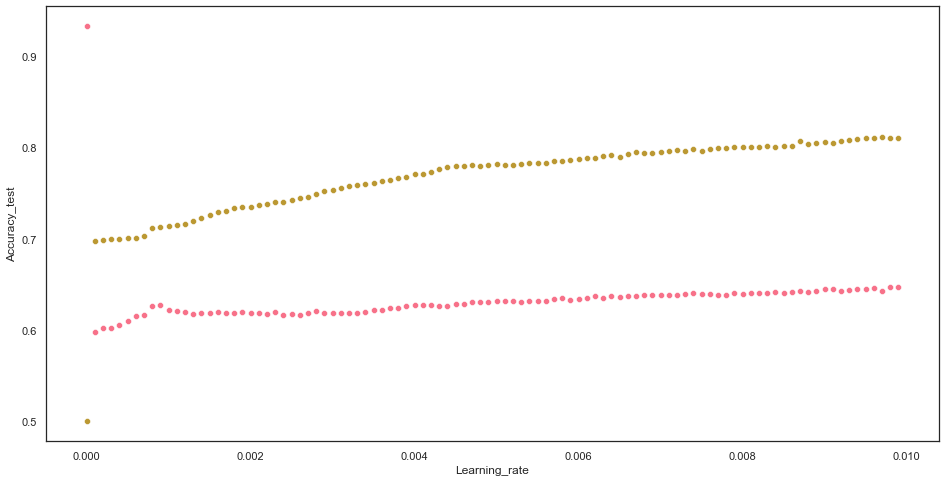

In [228]:
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=scores_noclimate2, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=scores_noclimate2, x="Learning_rate", y="Accuracy_train") #brown
plt.show();

In [229]:
scores_noclimate2["difference"] = abs(scores_noclimate2["Accuracy_test"] - scores_noclimate2["Accuracy_train"])

In [230]:
scores_noclimate2.sort_values(by="difference", ascending=True)

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,difference
8,0.626473,0.621388,0.531921,0.711653,0.711653,0.711659,0.0008,0.085180,0.085180
6,0.615385,0.624248,0.532288,0.700636,0.700636,0.700770,0.0006,0.085251,0.085251
9,0.627281,0.623422,0.532467,0.713136,0.713136,0.713145,0.0009,0.085854,0.085854
7,0.617002,0.625915,0.532758,0.702966,0.702966,0.703065,0.0007,0.085964,0.085964
5,0.610187,0.623863,0.532039,0.701059,0.701059,0.701320,0.0005,0.090872,0.090872
10,0.621737,0.626052,0.532944,0.714407,0.714407,0.714475,0.0010,0.092670,0.092670
11,0.621391,0.625866,0.532886,0.714831,0.714831,0.714919,0.0011,0.093440,0.093440
4,0.605221,0.622802,0.531639,0.700212,0.700212,0.700565,0.0004,0.094991,0.094991
2,0.601871,0.621007,0.531104,0.698305,0.698305,0.698753,0.0002,0.096434,0.096434
12,0.619889,0.624262,0.532431,0.716737,0.716737,0.716816,0.0012,0.096848,0.096848


In [231]:
scores_noclimate2.sort_values(by="Accuracy_test", ascending=False)

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,difference
0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,0.433010,0.433010
98,0.647378,0.640593,0.537681,0.809958,0.809958,0.810254,0.0098,0.162579,0.162579
99,0.647147,0.641270,0.537843,0.810169,0.810169,0.810412,0.0099,0.163022,0.163022
96,0.645877,0.642189,0.538017,0.810805,0.810805,0.810974,0.0096,0.164928,0.164928
95,0.644953,0.638493,0.537029,0.809958,0.809958,0.810139,0.0095,0.165005,0.165005
91,0.644953,0.636093,0.536414,0.805297,0.805297,0.805501,0.0091,0.160344,0.160344
94,0.644837,0.637631,0.536803,0.809110,0.809110,0.809317,0.0094,0.164273,0.164273
90,0.644606,0.639108,0.537169,0.806356,0.806356,0.806596,0.0090,0.161750,0.161750
93,0.644144,0.636460,0.536471,0.807839,0.807839,0.808118,0.0093,0.163695,0.163695
97,0.643451,0.636088,0.536344,0.811653,0.811653,0.811875,0.0097,0.168201,0.168201


Highest learning rate is at 0.0098, Try that one (hardcode it)

In [232]:
top_lr_nc2 = 0.0098
top_lr_nc2

0.0098

### Tune hyperparameters

In [233]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [234]:
space["learning_rate"] = top_lr_nc2

In [235]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:49,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<01:55,  1.18s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:03<01:53,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:04<01:52,  1.18s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  5%|██▍                                             | 5/100 [00:06<02:09,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:08<02:20,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:09<02:13,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:11<02:19,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:12<02:16,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 10%|████▋                                          | 10/100 [00:14<02:19,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:15<02:11,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5930930930930931                                                                                                     
 12%|█████▋                                         | 12/100 [00:17<02:15,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:19<02:19,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:20<02:09,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:21<01:58,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:23<01:58,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:24<01:50,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:26<01:59,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:27<01:51,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:28<01:43,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:29<01:44,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:30<01:39,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:32<01:35,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:33<01:38,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:35<01:45,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:36<01:42,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:37<01:38,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:38<01:35,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:40<01:34,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:41<01:29,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:42<01:28,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:44<01:27,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:45<01:23,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:47<01:35,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:48<01:38,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:50<01:35,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:51<01:28,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:52<01:24,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:54<01:31,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:55<01:24,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.624047124047124                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:57<01:32,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:59<01:34,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:00<01:28,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:01<01:20,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:03<01:15,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:04<01:13,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:05<01:08,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:07<01:11,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [01:08<01:15,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:10<01:10,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:11<01:07,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.582929082929083                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:13<01:12,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 53%|████████████████████████▉                      | 53/100 [01:15<01:15,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:16<01:07,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:18<01:11,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:19<01:05,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:20<01:01,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:22<00:59,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:23<00:54,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:24<00:54,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:26<00:56,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:27<00:53,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:28<00:50,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:30<00:47,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:31<00:48,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [01:33<00:49,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [01:35<00:52,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:36<00:47,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:37<00:44,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:39<00:41,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:40<00:38,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:41<00:37,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:42<00:35,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:44<00:33,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:45<00:33,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:46<00:30,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [01:48<00:33,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:49<00:30,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:51<00:28,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:52<00:26,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [01:53<00:24,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [01:54<00:23,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [01:56<00:22,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [01:57<00:20,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [01:59<00:22,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:00<00:19,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [02:02<00:20,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:03<00:17,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [02:05<00:17,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:06<00:14,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:07<00:12,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:09<00:12,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:11<00:10,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:12<00:08,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:13<00:06,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:14<00:05,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:16<00:04,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:17<00:02,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [02:19<00:01,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:01<02:45,  1.67s/trial, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6185031185031185                                                                                                     
  2%|▉                                              | 2/100 [00:03<02:47,  1.71s/trial, best loss: -0.6185031185031185]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:27,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
  4%|█▉                                              | 4/100 [00:06<02:35,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:07<02:18,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.641949641949642                                                                                                      
  6%|██▉                                             | 6/100 [00:09<02:29,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5928620928620929                                                                                                     
  7%|███▎                                            | 7/100 [00:11<02:32,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:12<02:35,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:14<02:32,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:15<02:17,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:17<02:10,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:18<01:59,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:19<02:08,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:21<02:11,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 15%|███████                                        | 15/100 [00:23<02:17,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6384846384846384                                                                                                     
 16%|███████▌                                       | 16/100 [00:25<02:18,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:26<02:07,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:27<01:59,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 19%|████████▉                                      | 19/100 [00:29<02:01,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 20%|█████████▍                                     | 20/100 [00:31<02:07,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:32<01:56,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:33<01:51,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:34<01:48,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:36<01:41,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:37<01:44,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:38<01:39,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:40<01:37,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:41<01:35,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:42<01:30,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:44<01:30,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:45<01:41,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:47<01:37,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:48<01:33,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:50<01:40,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:52<01:43,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:53<01:36,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:55<01:41,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:57<01:44,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:58<01:40,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:59<01:31,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:02<01:55,  1.96s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 42%|███████████████████▋                           | 42/100 [01:18<05:42,  5.91s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 43%|████████████████████▏                          | 43/100 [01:23<05:27,  5.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:25<04:25,  4.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:28<03:55,  4.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:31<03:20,  3.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:34<03:04,  3.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:38<03:17,  3.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:41<02:55,  3.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:43<02:25,  2.90s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:45<02:09,  2.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:46<01:50,  2.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:48<01:45,  2.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:50<01:30,  1.96s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:51<01:25,  1.90s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:53<01:15,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:54<01:11,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:56<01:08,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:57<01:03,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [01:59<01:09,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [02:01<01:02,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [02:03<01:08,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [02:04<01:00,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [02:06<01:05,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [02:08<00:58,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [02:09<00:54,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [02:11<00:51,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [02:12<00:49,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [02:14<00:54,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [02:16<00:48,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [02:18<00:55,  1.92s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [02:20<00:48,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [02:22<00:49,  1.85s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [02:23<00:43,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [02:24<00:41,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [02:26<00:37,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [02:27<00:34,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [02:29<00:33,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [02:31<00:34,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:32<00:32,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6163086163086163                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [02:34<00:33,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:36<00:30,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:37<00:26,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:39<00:25,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:41<00:25,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:42<00:22,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:43<00:20,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:45<00:17,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:46<00:16,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:48<00:14,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:49<00:12,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:51<00:11,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:52<00:09,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:53<00:08,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:55<00:06,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:56<00:05,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:57<00:04,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:59<00:02,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [03:01<00:01,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:52,  1.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<02:01,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  3%|█▍                                              | 3/100 [00:04<02:15,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:05<02:17,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  5%|██▍                                             | 5/100 [00:07<02:26,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  6%|██▉                                             | 6/100 [00:09<02:37,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:10<02:24,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:12<02:13,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:14<02:27,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 10%|████▋                                          | 10/100 [00:16<02:34,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:17<02:22,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 12%|█████▋                                         | 12/100 [00:19<02:24,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:21<02:31,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:22<02:12,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:23<02:08,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:24<01:59,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:26<02:03,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 18%|████████▍                                      | 18/100 [00:28<02:10,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:29<01:57,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:30<01:52,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:32<01:49,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:33<01:57,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:35<02:04,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:36<01:52,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:38<01:48,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:39<01:42,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:40<01:36,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:42<01:47,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:44<01:52,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:45<01:45,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:46<01:38,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:48<01:32,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:49<01:31,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:50<01:26,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:52<01:24,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:53<01:24,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:54<01:20,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:55<01:20,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:57<01:18,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:58<01:15,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [01:00<01:26,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:01<01:19,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:02<01:16,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:04<01:14,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 45%|█████████████████████▏                         | 45/100 [01:05<01:20,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:07<01:18,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 47%|██████████████████████                         | 47/100 [01:08<01:21,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:10<01:16,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [01:12<01:19,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [01:13<01:21,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:15<01:14,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:16<01:08,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:17<01:05,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6141141141141141                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [01:19<01:09,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:21<01:13,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [01:23<01:14,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:24<01:07,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [01:26<01:10,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:27<01:02,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [01:29<01:05,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:30<00:59,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:32<00:55,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:33<00:52,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5997920997920998                                                                                                     
 64%|██████████████████████████████                 | 64/100 [01:35<00:54,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:36<00:51,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:37<00:47,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:39<00:45,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:40<00:44,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:41<00:42,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:43<00:42,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:44<00:39,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:45<00:37,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:47<00:36,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:48<00:33,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:49<00:32,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [01:51<00:36,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [01:54<00:42,  1.85s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:55<00:37,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:56<00:32,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:58<00:30,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [01:59<00:27,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:00<00:25,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [02:02<00:26,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [02:04<00:26,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:06<00:25,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:07<00:22,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:09<00:20,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:10<00:17,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:12<00:16,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:13<00:14,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:15<00:13,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:17<00:13,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:18<00:10,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:19<00:09,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:21<00:07,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:22<00:05,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:24<00:04,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [02:26<00:03,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:27<00:01,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6163086163086163                                                                                                     
  1%|▍                                              | 1/100 [00:01<03:17,  2.00s/trial, best loss: -0.6163086163086163]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:03<03:09,  1.93s/trial, best loss: -0.6163086163086163]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:05<02:55,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:07<02:53,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:09<03:03,  1.93s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:11<02:59,  1.91s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:12<02:48,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:14<02:43,  1.78s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:16<02:47,  1.84s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
 10%|████▋                                          | 10/100 [00:18<02:44,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:19<02:29,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:20<02:20,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:22<02:07,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:23<02:03,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 15%|███████                                        | 15/100 [00:25<02:13,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:27<02:20,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5996765996765997                                                                                                     
 17%|███████▉                                       | 17/100 [00:29<02:23,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:30<02:15,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 19%|████████▉                                      | 19/100 [00:32<02:25,  1.80s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:34<02:09,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:35<02:02,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:36<01:57,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:38<01:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:39<01:51,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:40<01:44,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:42<01:42,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:43<01:38,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:44<01:33,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:46<01:37,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:47<01:34,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:48<01:30,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:50<01:29,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:52<01:40,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:53<01:36,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:54<01:30,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:55<01:27,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:57<01:29,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:58<01:26,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [01:00<01:28,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:02<01:36,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [01:04<01:47,  1.82s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:06<01:38,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:07<01:34,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.581081081081081                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:09<01:43,  1.84s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 45%|█████████████████████▏                         | 45/100 [01:12<01:48,  1.97s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [01:13<01:42,  1.91s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:15<01:35,  1.80s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:17<01:34,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:18<01:25,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:20<01:20,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [01:22<01:22,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:23<01:18,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:24<01:11,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:26<01:09,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:28<01:12,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:29<01:07,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [01:31<01:11,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:32<01:04,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [01:34<01:09,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:36<01:02,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:37<00:59,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [01:39<01:02,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:41<01:04,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:42<00:58,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:44<00:54,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:45<00:51,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [01:47<00:52,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:48<00:49,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:49<00:45,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:51<00:41,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:52<00:39,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:53<00:37,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:55<00:36,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:56<00:35,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:57<00:33,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:59<00:32,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [02:00<00:31,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [02:01<00:29,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:03<00:28,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:04<00:26,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:05<00:24,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:07<00:25,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [02:09<00:26,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:10<00:23,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:12<00:23,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:13<00:21,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:15<00:19,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:16<00:16,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:17<00:15,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:19<00:13,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:20<00:12,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:21<00:11,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:23<00:09,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:24<00:08,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:26<00:06,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:27<00:05,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:28<00:04,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [02:30<00:02,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [02:32<00:01,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<03:16,  1.99s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:03<03:11,  1.96s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:06<03:20,  2.06s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:08<03:12,  2.00s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:09<02:49,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:11<02:52,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  7%|███▎                                            | 7/100 [00:13<02:53,  1.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:15<02:54,  1.89s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:17<02:50,  1.88s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:18<02:34,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:20<02:41,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:22<02:41,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:23<02:23,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:25<02:30,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 15%|███████                                        | 15/100 [00:27<02:33,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6075306075306075                                                                                                     
 16%|███████▌                                       | 16/100 [00:29<02:37,  1.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 17%|███████▉                                       | 17/100 [00:31<02:32,  1.84s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:32<02:27,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:35<02:39,  1.96s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:36<02:24,  1.80s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:37<02:09,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:39<02:00,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:40<01:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:41<01:47,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:43<01:46,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:44<01:42,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:45<01:38,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:47<01:38,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:48<01:35,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:49<01:33,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:51<01:33,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:52<01:29,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:53<01:28,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:55<01:27,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:56<01:24,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:57<01:25,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:59<01:34,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [01:01<01:30,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [01:03<01:40,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:04<01:32,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:05<01:30,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 42%|███████████████████▋                           | 42/100 [01:07<01:32,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:09<01:29,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:10<01:22,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:11<01:16,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [01:13<01:24,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 47%|██████████████████████                         | 47/100 [01:15<01:26,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:17<01:29,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [01:19<01:28,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:20<01:22,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 51%|███████████████████████▉                       | 51/100 [01:22<01:23,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:24<01:20,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [01:25<01:21,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:27<01:17,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:28<01:11,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:30<01:06,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:31<01:05,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:33<01:01,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:34<01:00,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:35<00:57,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:37<00:54,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:38<00:56,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:40<00:53,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:41<00:53,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [01:43<00:57,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:45<00:53,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:46<00:51,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:47<00:46,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:49<00:46,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:50<00:43,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:52<00:42,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:53<00:41,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:55<00:38,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [01:57<00:42,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:58<00:38,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [02:00<00:40,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [02:02<00:36,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [02:04<00:38,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:05<00:33,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [02:07<00:34,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [02:09<00:33,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [02:11<00:33,  1.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [02:13<00:31,  1.86s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:14<00:28,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:16<00:24,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:17<00:21,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:19<00:20,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:20<00:18,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:21<00:16,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:23<00:14,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:24<00:13,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:26<00:12,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:27<00:10,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:29<00:08,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:30<00:07,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:32<00:05,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:33<00:04,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:35<00:02,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:36<00:01,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:54,  1.15s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<02:00,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:04<02:14,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:05<02:09,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:06<02:09,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:08<02:18,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:10<02:17,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:11<02:08,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  9%|████▎                                           | 9/100 [00:13<02:22,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:14<02:13,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:16<02:23,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:18<02:17,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
 13%|██████                                         | 13/100 [00:19<02:22,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:21<02:18,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 15%|███████                                        | 15/100 [00:23<02:18,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:24<02:14,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:25<02:05,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:27<01:56,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:29<02:10,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:31<02:14,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:33<02:21,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:34<02:06,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:35<02:05,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 24%|███████████▎                                   | 24/100 [00:37<02:06,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:39<02:00,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:40<01:52,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:41<01:46,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:43<01:47,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:44<01:41,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:46<01:42,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:47<01:40,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 32%|███████████████                                | 32/100 [00:49<01:50,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:51<01:46,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:52<01:37,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:53<01:37,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:55<01:34,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:57<01:44,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:59<01:46,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [01:00<01:42,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:02<01:35,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 41%|███████████████████▎                           | 41/100 [01:04<01:39,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:05<01:33,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:06<01:25,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:08<01:24,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:09<01:19,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [01:11<01:26,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:13<01:21,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:14<01:26,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [01:16<01:30,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6056826056826057                                                                                                     
 50%|███████████████████████▌                       | 50/100 [01:19<01:32,  1.86s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 51%|███████████████████████▉                       | 51/100 [01:20<01:32,  1.88s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:22<01:23,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:23<01:17,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:25<01:10,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:26<01:08,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6384846384846384                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [01:28<01:11,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:29<01:07,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:31<01:03,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:32<00:58,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [01:34<01:03,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:35<00:58,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [01:37<01:01,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:38<00:56,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [01:40<01:00,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [01:42<01:00,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:44<00:57,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:45<00:52,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:47<00:47,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:48<00:46,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:49<00:42,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:51<00:40,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:52<00:39,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:53<00:36,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:55<00:36,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:56<00:34,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [01:58<00:36,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:59<00:34,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [02:01<00:31,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:02<00:30,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [02:04<00:31,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [02:06<00:32,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:07<00:28,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:09<00:25,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:10<00:23,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:12<00:23,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:13<00:21,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:15<00:19,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:16<00:17,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:18<00:15,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:19<00:13,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:20<00:12,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:22<00:12,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:24<00:10,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:25<00:08,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:26<00:07,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [02:28<00:06,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:30<00:04,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:31<00:02,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:32<00:01,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  1%|▍                                              | 1/100 [00:01<03:13,  1.95s/trial, best loss: -0.6546546546546547]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6148071148071148                                                                                                     
  2%|▉                                              | 2/100 [00:03<03:03,  1.87s/trial, best loss: -0.6546546546546547]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:46,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
  4%|█▉                                              | 4/100 [00:06<02:45,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:07<02:28,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
  6%|██▉                                             | 6/100 [00:09<02:36,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:11<02:36,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:13<02:38,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:15<02:36,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 10%|████▋                                          | 10/100 [00:16<02:39,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:18<02:20,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:19<02:11,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:20<02:03,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:21<01:54,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:23<02:07,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 16%|███████▌                                       | 16/100 [00:25<02:11,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 17%|███████▉                                       | 17/100 [00:27<02:20,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:28<02:04,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:30<02:10,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:31<02:02,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:32<01:53,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:34<01:52,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:35<01:44,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:36<01:40,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:38<01:40,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:39<01:36,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:40<01:35,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:41<01:34,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:43<01:30,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:44<01:31,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:46<01:40,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:47<01:36,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:49<01:34,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:50<01:40,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:52<01:38,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:53<01:40,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:55<01:32,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:56<01:29,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:57<01:23,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:59<01:33,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:01<01:25,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:02<01:20,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:03<01:20,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 44%|████████████████████▋                          | 44/100 [01:05<01:24,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:06<01:21,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:08<01:16,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:09<01:11,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:10<01:11,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:11<01:07,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:13<01:04,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:14<01:04,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:15<01:02,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:17<01:02,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:18<01:01,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:19<00:59,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:21<01:00,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [01:23<01:04,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:24<01:02,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:25<00:58,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:27<00:54,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:29<00:59,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:30<00:54,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:31<00:53,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [01:33<00:56,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:35<00:53,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:36<00:50,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:37<00:46,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:39<00:45,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:40<00:44,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:41<00:41,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:43<00:40,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:44<00:37,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:45<00:36,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:47<00:36,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:48<00:33,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:49<00:32,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [01:51<00:34,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [01:53<00:35,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [01:55<00:35,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:56<00:31,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [01:58<00:31,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [01:59<00:27,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:01<00:25,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [02:03<00:25,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:05<00:25,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:06<00:21,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:07<00:19,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [02:09<00:19,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:10<00:16,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:12<00:15,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:13<00:12,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:15<00:11,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:16<00:10,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:18<00:08,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:19<00:07,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:20<00:05,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:22<00:04,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:23<00:02,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:24<00:01,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  1%|▍                                              | 1/100 [00:01<02:54,  1.76s/trial, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<02:35,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:04<02:41,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
  4%|█▉                                              | 4/100 [00:06<02:42,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:07<02:31,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:09<02:16,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:10<02:08,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:11<02:05,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:12<01:58,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:13<01:56,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:15<01:54,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:16<02:02,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:19<02:21,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 14%|██████▌                                        | 14/100 [00:20<02:25,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:22<02:17,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:24<02:18,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:26<02:25,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 18%|████████▍                                      | 18/100 [00:27<02:24,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:29<02:18,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:30<02:07,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:32<02:01,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:34<02:09,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:35<01:59,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:36<01:54,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:38<01:48,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:39<01:45,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:41<01:45,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:42<01:39,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:44<01:50,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:45<01:44,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:46<01:41,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:48<01:37,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:49<01:31,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:50<01:28,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6428736428736429                                                                                                     
 35%|████████████████▍                              | 35/100 [00:53<01:44,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:54<01:43,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:56<01:53,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:58<01:55,  1.86s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [01:00<01:55,  1.89s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:03<01:58,  1.98s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:04<01:44,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:05<01:37,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:07<01:31,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:08<01:23,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:09<01:21,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:11<01:16,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:12<01:11,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:13<01:12,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:15<01:08,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:16<01:04,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:17<01:04,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [01:19<01:09,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:20<01:06,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [01:22<01:11,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:23<01:06,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:25<01:04,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [01:27<01:06,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:28<01:04,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:29<00:59,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:31<00:56,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:32<00:54,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:33<00:50,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:35<00:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:36<00:51,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:38<00:48,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:39<00:46,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [01:41<00:48,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:42<00:46,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:44<00:47,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:45<00:44,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:47<00:41,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:48<00:38,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:49<00:36,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:50<00:35,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:52<00:33,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:53<00:32,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [01:55<00:34,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:56<00:31,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:58<00:29,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:59<00:27,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.641949641949642                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:01<00:29,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:02<00:26,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:03<00:23,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:05<00:22,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:06<00:20,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:07<00:18,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:09<00:17,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:10<00:15,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:11<00:14,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:13<00:13,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6070686070686071                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [02:14<00:13,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:16<00:11,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [02:17<00:10,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:19<00:08,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:20<00:07,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:22<00:05,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:23<00:04,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:25<00:02,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:26<00:01,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  1%|▍                                              | 1/100 [00:01<02:46,  1.68s/trial, best loss: -0.5786555786555787]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:03<02:52,  1.76s/trial, best loss: -0.5786555786555787]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:34,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:06<02:26,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:07<02:29,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:09<02:16,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:10<02:24,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:12<02:27,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:13<02:17,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:14<02:05,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:16<01:57,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:18<02:14,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:19<02:14,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:21<02:09,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:22<02:02,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 16%|███████▌                                       | 16/100 [00:24<02:11,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:25<02:05,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:26<01:56,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 19%|████████▉                                      | 19/100 [00:29<02:13,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:30<02:14,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:32<02:07,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:33<02:00,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:35<01:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:36<01:55,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:37<01:49,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:39<01:46,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:40<01:45,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:42<01:41,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:43<01:41,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 30%|██████████████                                 | 30/100 [00:45<01:53,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:47<01:49,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 32%|███████████████                                | 32/100 [00:49<01:55,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:50<01:47,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:52<01:54,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6171171171171171                                                                                                     
 35%|████████████████▍                              | 35/100 [00:54<02:00,  1.85s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:56<01:51,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:57<01:41,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:58<01:37,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [01:00<01:32,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:01<01:27,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:03<01:28,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:04<01:24,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:06<01:28,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:07<01:25,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:09<01:20,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 46%|█████████████████████▌                         | 46/100 [01:11<01:32,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:12<01:24,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:14<01:24,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:15<01:18,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:17<01:16,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:18<01:15,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:20<01:10,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [01:22<01:19,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:23<01:12,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:25<01:10,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [01:27<01:15,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:28<01:09,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [01:30<01:13,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:32<01:07,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:33<01:05,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:35<00:59,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:36<00:57,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:38<01:01,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:40<00:59,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:41<00:56,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:43<00:51,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:44<00:50,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:45<00:47,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:47<00:44,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [01:49<00:49,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:50<00:45,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:52<00:43,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:53<00:40,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:55<00:38,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:56<00:37,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:57<00:34,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:59<00:33,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [02:01<00:35,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:03<00:33,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:04<00:31,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:05<00:28,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:07<00:27,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:08<00:25,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [02:10<00:26,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:12<00:24,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:14<00:22,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:15<00:20,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6157311157311157                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [02:17<00:20,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:19<00:18,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:20<00:15,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:21<00:13,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:23<00:13,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [02:26<00:12,  1.82s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:27<00:10,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:28<00:07,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:30<00:06,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:31<00:04,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:32<00:02,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [02:35<00:01,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  1%|▍                                              | 1/100 [00:01<02:57,  1.79s/trial, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:03<03:01,  1.85s/trial, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                             | 3/100 [00:05<02:58,  1.84s/trial, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:06<02:43,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:08<02:35,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6172326172326172                                                                                                     
  6%|██▉                                             | 6/100 [00:11<03:03,  1.96s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  7%|███▎                                            | 7/100 [00:13<03:01,  1.96s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:14<02:42,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:15<02:26,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6048741048741049                                                                                                     
 10%|████▋                                          | 10/100 [00:17<02:27,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:18<02:15,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 12%|█████▋                                         | 12/100 [00:20<02:19,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 13%|██████                                         | 13/100 [00:22<02:22,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:23<02:10,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:24<01:58,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:25<01:54,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 17%|███████▉                                       | 17/100 [00:27<02:03,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.588011088011088                                                                                                      
 18%|████████▍                                      | 18/100 [00:29<02:09,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6239316239316239                                                                                                     
 19%|████████▉                                      | 19/100 [00:31<02:13,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:32<01:58,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:33<01:53,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:34<01:47,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:36<01:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:37<01:49,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:39<01:45,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:40<01:44,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:42<01:42,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:43<01:37,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:44<01:38,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:45<01:34,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:47<01:31,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:48<01:32,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:50<01:37,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:51<01:34,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:53<01:39,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:54<01:33,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:56<01:29,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:57<01:23,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:59<01:31,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:00<01:25,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [01:02<01:29,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 42%|███████████████████▋                           | 42/100 [01:04<01:34,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:05<01:25,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [01:07<01:30,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:08<01:21,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:09<01:16,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:10<01:13,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:12<01:09,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:13<01:09,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:14<01:07,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:16<01:03,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:17<01:04,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:18<01:01,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:19<00:58,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:21<00:59,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:22<00:57,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:24<00:57,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:25<00:57,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [01:27<01:01,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:28<00:59,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:29<00:53,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:31<00:51,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:32<00:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:34<00:51,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:35<00:50,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:36<00:46,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:38<00:44,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [01:40<00:48,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:41<00:49,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:43<00:45,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:44<00:41,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [01:46<00:44,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:47<00:40,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:48<00:36,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:50<00:35,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:51<00:32,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:52<00:30,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [01:54<00:33,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [01:56<00:33,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [01:58<00:33,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [02:00<00:32,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [02:01<00:31,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:03<00:27,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [02:05<00:28,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:07<00:26,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:08<00:23,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [02:10<00:21,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:11<00:19,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:12<00:16,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:14<00:14,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:15<00:12,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:16<00:11,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:18<00:09,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:19<00:08,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:20<00:06,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:22<00:05,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:23<00:04,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:24<00:02,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:26<00:01,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [02:27<00:00,  1.48s/trial, best loss: -0.933009933009933]


4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.63      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.57      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.61      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.63     

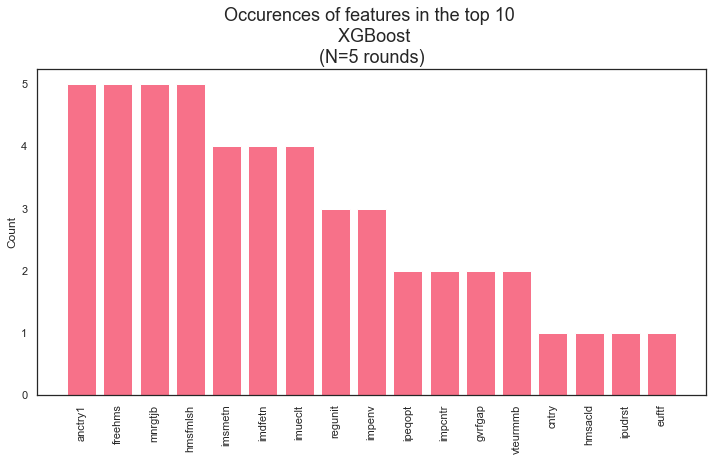

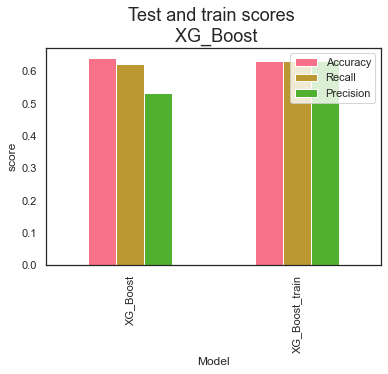

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.60      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.63     

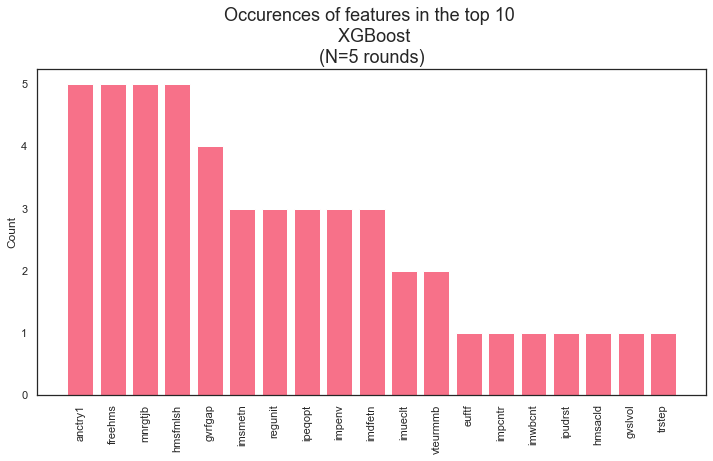

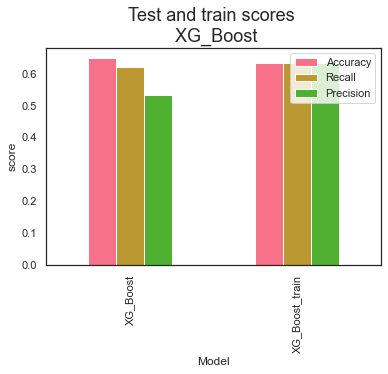

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8077
           1       0.11      0.59      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8079
           1       0.12      0.63      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.64     

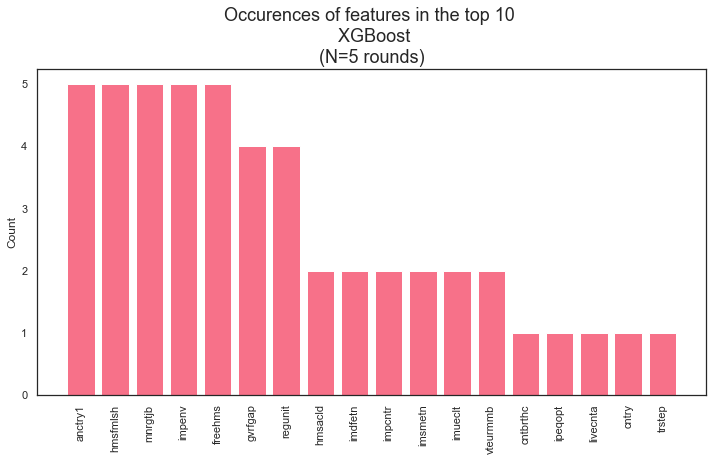

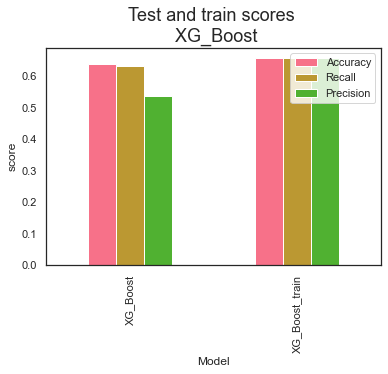

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.12      0.62      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64     

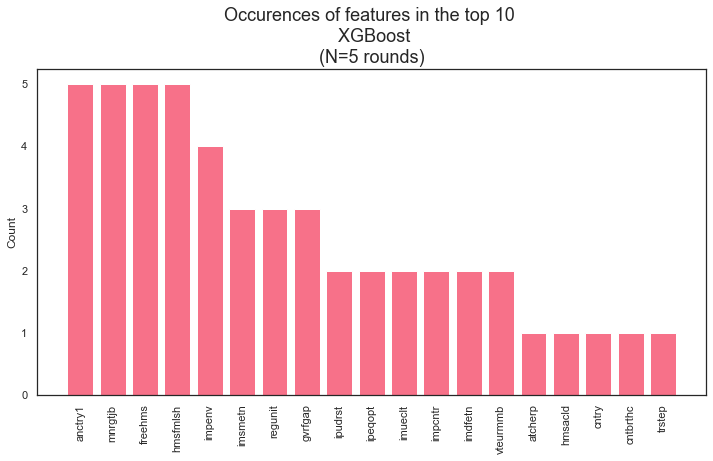

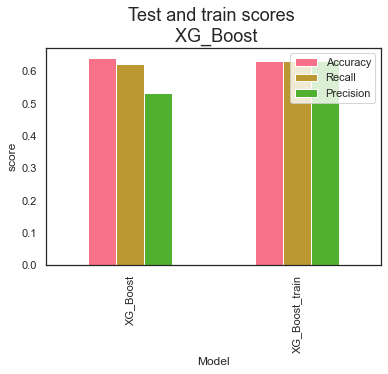

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.61      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64     

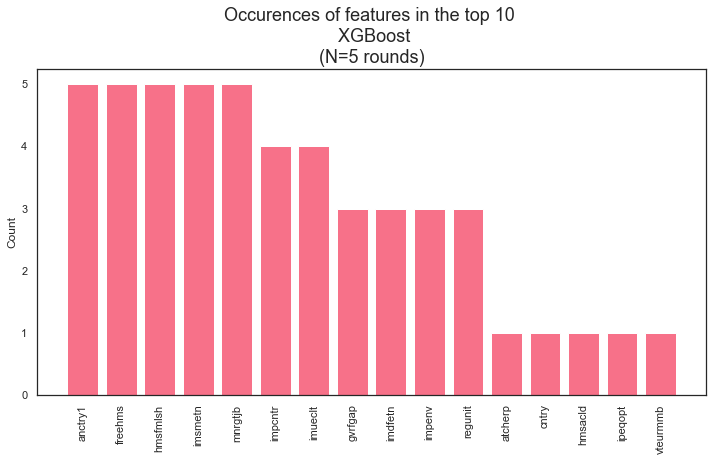

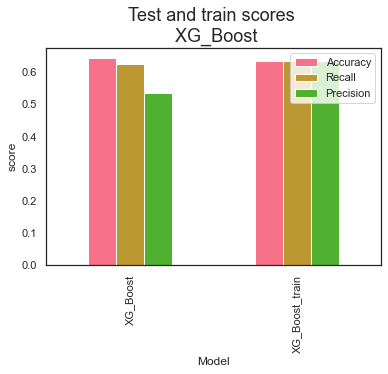

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8077
           1       0.10      0.59      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.64     

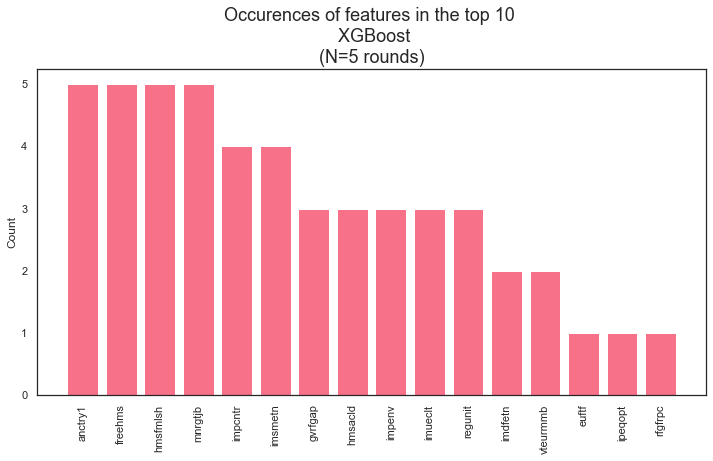

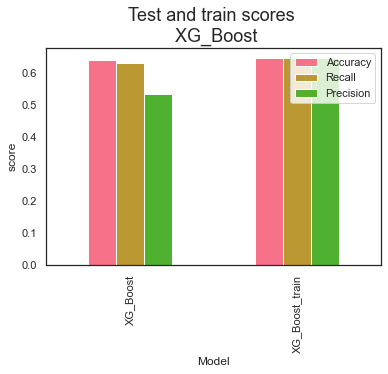

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8077
           1       0.10      0.59      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8079
           1       0.11      0.63      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.64     

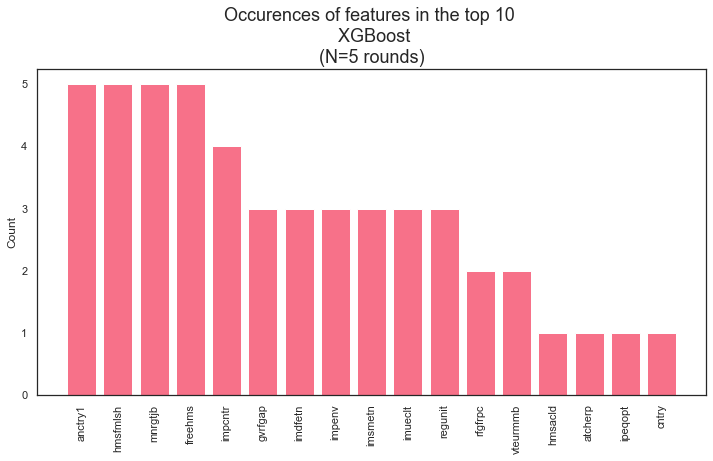

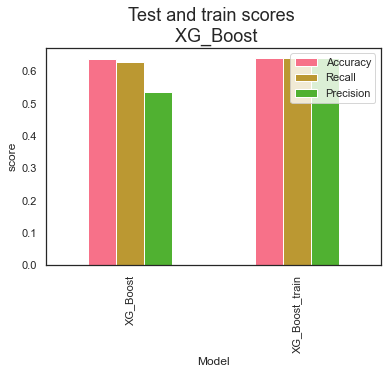

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.61      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.79      8079
           1       0.11      0.61      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64     

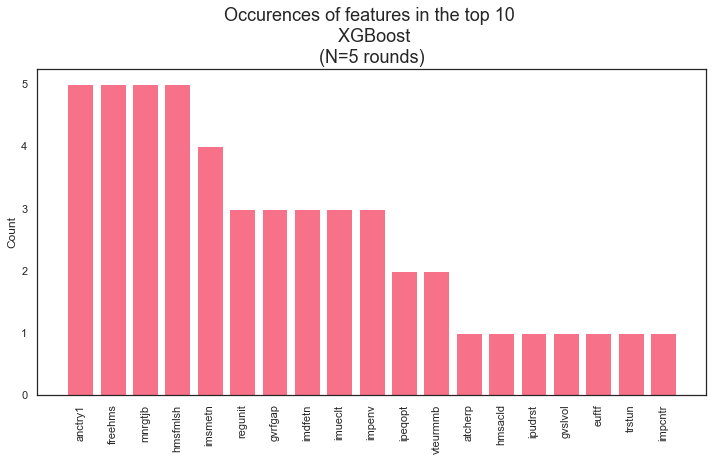

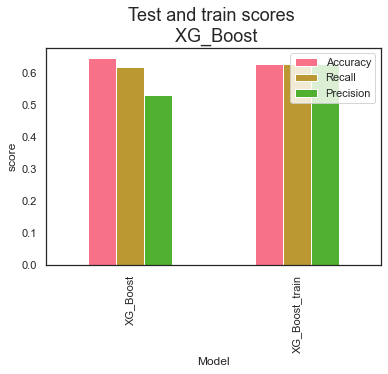

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.63      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8077
           1       0.10      0.58      0.18       581

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.12      0.62      0.20       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64     

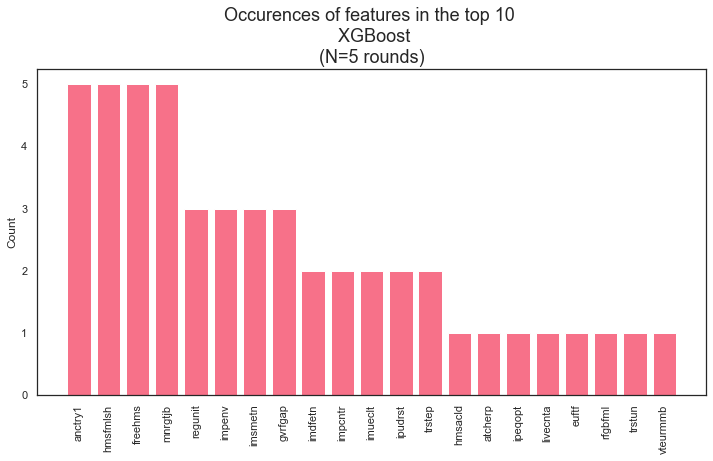

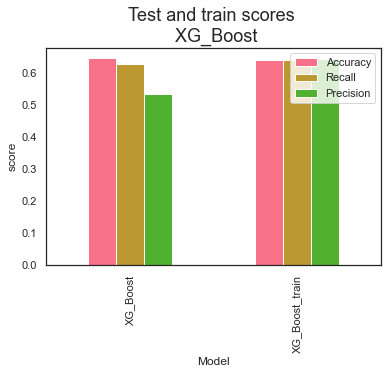

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.57      0.18       581

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8079
           1       0.12      0.60      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64     

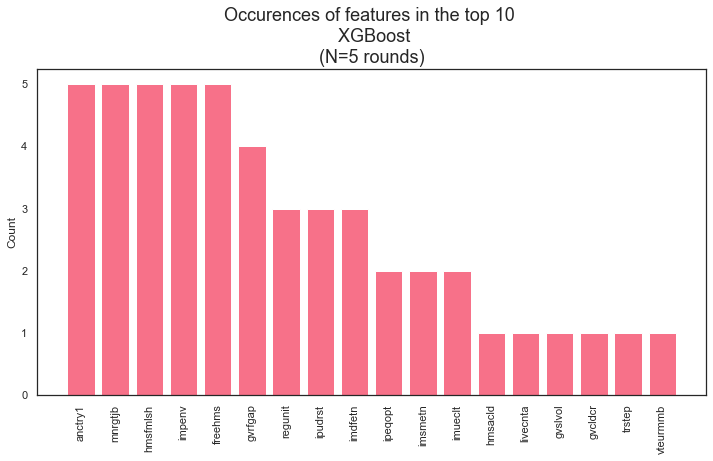

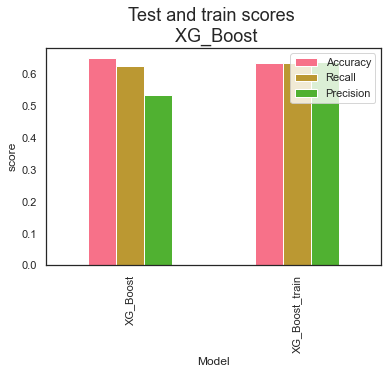

In [236]:
top_param_nc2 = top_param(X_noclimate, y_duo, random_states, top_lr_nc2, True, values_list_duo)

In [237]:
top_param_nc2

{'reg_alpha': 131.0,
 'colsample_bytree': 0.958842966254008,
 'reg_lambda': 0.42523674234424136,
 'gamma': 2.0760037497903063,
 'min_child_weight': 7.0,
 'max_depth': 4}

In [238]:
#hardcode it
top_param_nc2 = {'min_child_weight': 7.0,
                 'reg_lambda': 0.39197066753835896,
                 'reg_alpha': 178.0,
                 'gamma': 4.709272200656949,
                 'max_depth': 8,
                 'colsample_bytree': 0.5448404096028705}

4678 4678
Random state: 0 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8057
           1       0.11      0.57      0.18       601

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4702 4702
Random state: 1 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8069
           1       0.10      0.62      0.18       589

    accuracy                           0.60      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.60      0.70      8658
 

4750 4750
Random state: 2 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8093
           1       0.10      0.58      0.17       565

    accuracy                           0.62      8658
   macro avg       0.53      0.60      0

4678 4678
Random state: 20 
               precision    recall  f1-score   support

           0       0.96      0.64      0.76      8057
           1       0.11      0.60      0.19       601

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4746 4746
Random state: 21 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8091
           1       0.10      0.59      0.18       567

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722
Random state: 22 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.57      0.18       579

    accuracy                           0.66      8658
   macro avg       0.53      0.61    

4662 4662
Random state: 40 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8049
           1       0.11      0.58      0.18       609

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 

4646 4646
Random state: 41 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8041
           1       0.11      0.57      0.19       617

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4700 4700
Random state: 42 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8068
           1       0.11      0.61      0.18       590

    accuracy                           0.63      8658
   macro avg       0.53      0.62    

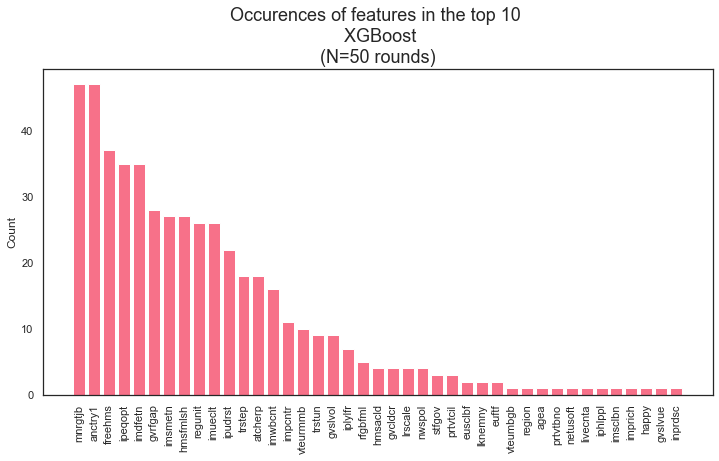

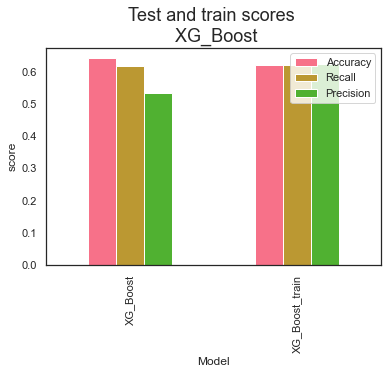

In [239]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

score_nc2, feat_nc2 = XG_Boost(X_noclimate2, y_duo, random_states_many, True, top_lr_nc2, top_param_nc2)

In [240]:
score_nc2

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.640711,0.616953,0.531963,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.621147,0.621147,0.621724,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [241]:
feat_nc2.groupby("feature").count().sort_values(by="importance", ascending=False).head(10)

,indices,importance,model
feature,,,
mnrgtjb,47,47,47
anctry1,47,47,47
freehms,37,37,37
ipeqopt,35,35,35
imdfetn,35,35,35
gvrfgap,28,28,28
imsmetn,27,27,27
hmsfmlsh,27,27,27
regunit,26,26,26


In [242]:
get_fullname(feat_nc2, metadata)

,indices,importance,shorthand,full_text
0,200,0.059343,agea,"Age of respondent, calculated"
1,316,0.089318,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
2,107,0.065076,atcherp,How emotionally attached to Europe
3,91,0.069695,euftf,European Union: European unification go further or gone too far
4,180,0.067975,eusclbf,Against or In favour of European Union-wide social benefit scheme
5,88,0.065461,freehms,Gays and lesbians free to live life as they wish
6,152,0.051985,gvcldcr,"Child care services for working parents, governments' responsibility"
7,142,0.067373,gvrfgap,Government should be generous judging applications for refugee status
8,150,0.064713,gvslvol,"Standard of living for the old, governments' responsibility"
9,151,0.088210,gvslvue,"Standard of living for the unemployed, governments' responsibility"


## Use fewer features
Check if model performs better when X is smaller (noise reduction). 

In [243]:
#create some X's

#select featurenames to include
cols_forty = list(imp2.shorthand[imp2["count"] >= 40]) #pops up forty or more times in the top 10 features (N = 50 runs)
print(cols_forty)
cols_twfive = list(imp2.shorthand[imp2["count"] >= 25]) #pops up 25 or more times in the top 10 features (N = 50 runs)
print(cols_twfive)
cols_fifteen = list(imp2.shorthand[imp2["count"] >= 15]) #pops up 15 or more times in the top 10 features (N = 50 runs)
print(cols_fifteen)
cols_ten = list(imp2.shorthand[imp2["count"] >= 10]) #pops up 10 or more times in the top 10 features (N = 50 runs)
print(cols_ten)
cols_one = list(imp2.shorthand)
print(cols_one)

['anctry1', 'mnrgtjb', 'impenv', 'regunit']
['anctry1', 'mnrgtjb', 'impenv', 'regunit', 'gvrfgap', 'freehms', 'ipeqopt']
['anctry1', 'mnrgtjb', 'impenv', 'regunit', 'gvrfgap', 'freehms', 'ipeqopt', 'ipudrst', 'hmsfmlsh', 'imueclt', 'imdfetn', 'imsmetn']
['anctry1', 'mnrgtjb', 'impenv', 'regunit', 'gvrfgap', 'freehms', 'ipeqopt', 'ipudrst', 'hmsfmlsh', 'imueclt', 'imdfetn', 'imsmetn', 'iplylfr', 'gvslvol', 'prtvtbno', 'trstep']
['anctry1', 'mnrgtjb', 'impenv', 'regunit', 'gvrfgap', 'freehms', 'ipeqopt', 'ipudrst', 'hmsfmlsh', 'imueclt', 'imdfetn', 'imsmetn', 'iplylfr', 'gvslvol', 'prtvtbno', 'trstep', 'atcherp', 'trstun', 'vteurmmb', 'gvcldcr', 'vteumbgb', 'imwbcnt', 'rfgbfml', 'prtvtcil', 'euftf', 'impcntr', 'lrscale', 'imsclbn', 'lnghom2', 'livecnta', 'stfgov', 'nwspol', 'netusoft', 'gvslvue', 'happy', 'prtclbno', 'smdfslv', 'inprdsc', 'sclmeet', 'trstplc', 'prtclbgb', 'cntry', 'wkhtotp', 'agea', 'hmsacld', 'prtvtfee', 'imprich']


In [244]:
X_forty = X_noclimate[cols_forty]
X_twfive = X_noclimate[cols_twfive]
X_fifteen = X_noclimate[cols_fifteen]
X_ten = X_noclimate[cols_ten]
X_one = X_noclimate[cols_one]

Run them all, comparing the test_scores at the end

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8076
           1       0.11      0.58      0.18       582

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8077
           1       0.10      0.52      0.16       581

    accuracy                           0.65      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.65      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8079
           1       0.11      0.56      0.18       579

    accuracy                           0.66      8658
   macro avg       0.53      0.61     

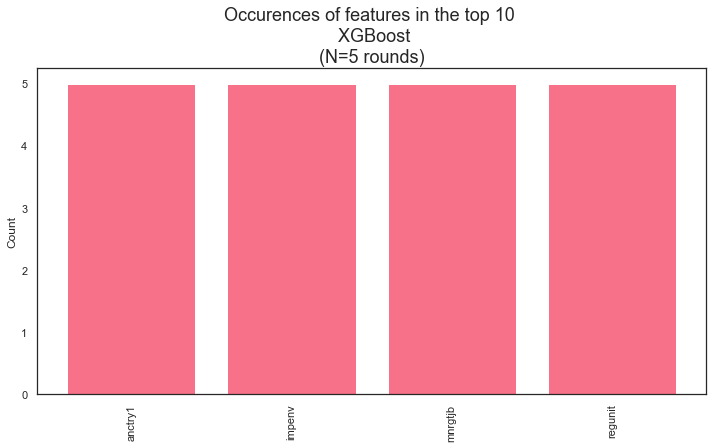

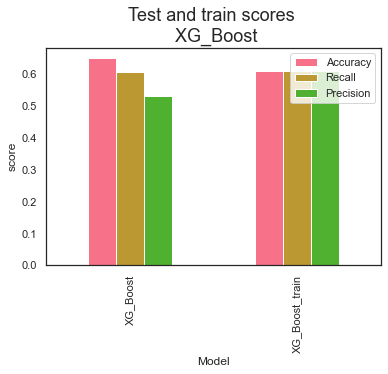

In [245]:
score_forty, feat_forty = XG_Boost(X_forty, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.71      0.81      8079
           1       0.12      0.55      0.20       579

    accuracy                           0.70      8658
   macro avg       0.54      0.63     

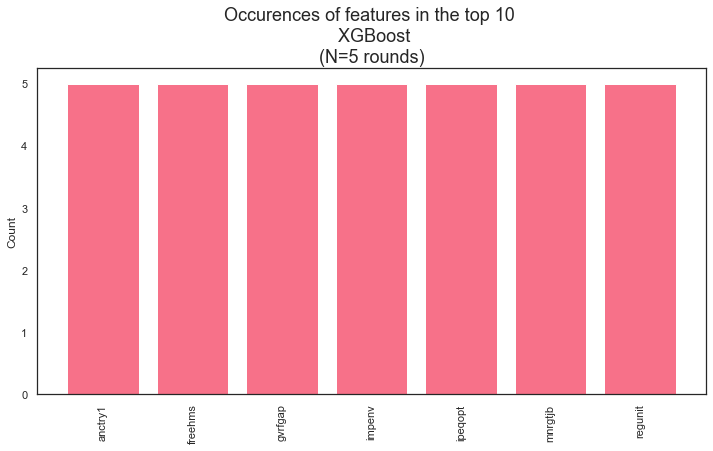

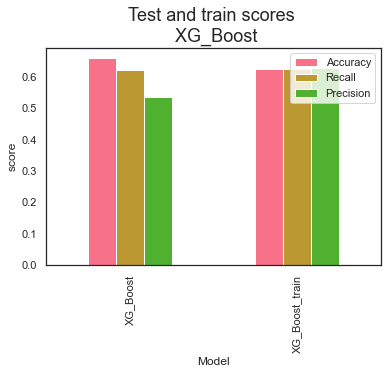

In [246]:
score_twfive, feat_twfive = XG_Boost(X_twfive, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.78      8077
           1       0.10      0.53      0.17       581

    accuracy                           0.65      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.65      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.56      0.19       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63     

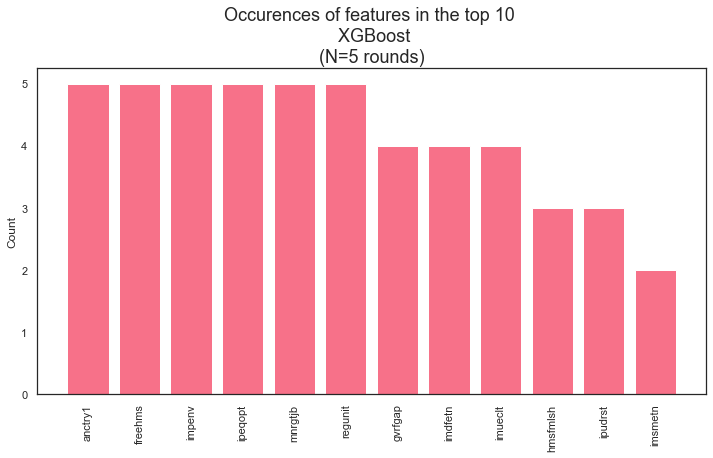

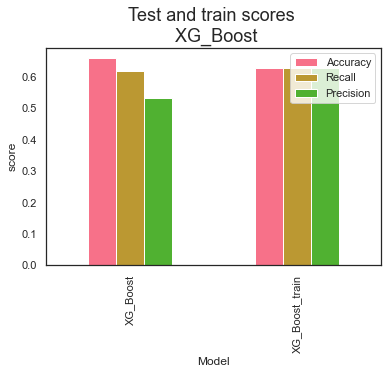

In [247]:
score_fifteen_, feat_fifteen_ = XG_Boost(X_fifteen, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.54      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.56      0.19       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63     

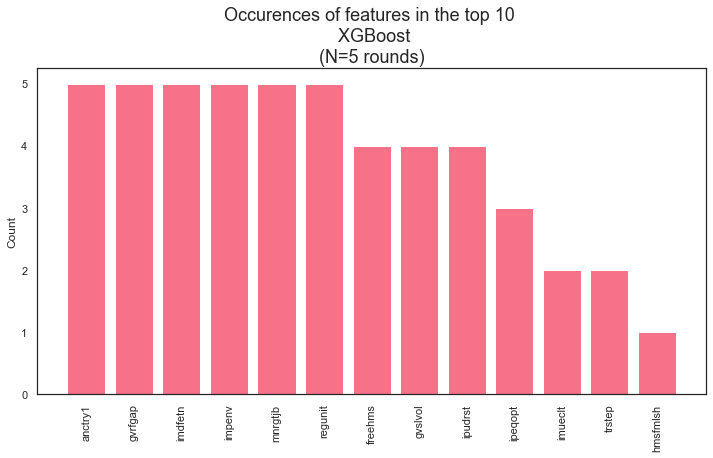

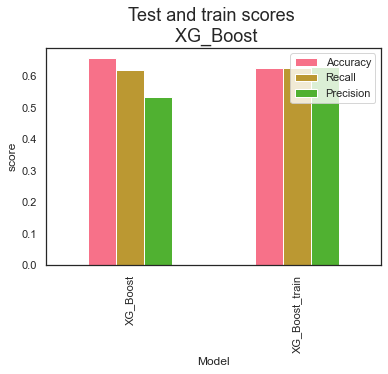

In [248]:
score_ten, feat_ten = XG_Boost(X_ten, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.61      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.59      0.47      8658
weighted avg       0.89      0.63      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.71      0.81      8079
           1       0.12      0.55      0.19       579

    accuracy                           0.70      8658
   macro avg       0.54      0.63     

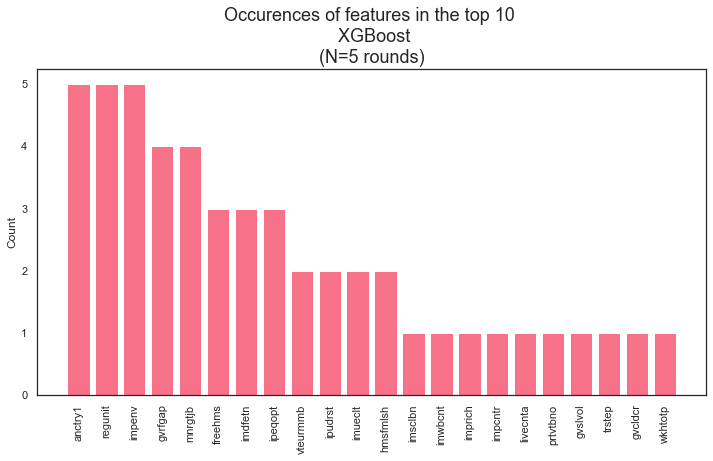

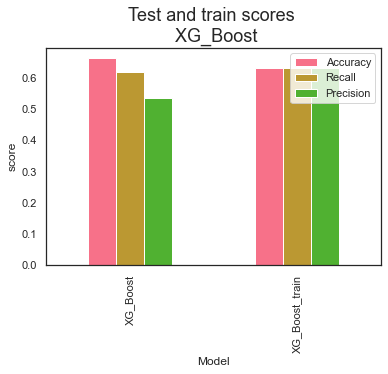

In [249]:
score_orig, feat_orig = XG_Boost(X_noclimate, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [250]:
#Make dataframe for better comparison. Also used for plotting: find the plot in the plotting section
acc_test_list_ = [score_orig.iloc[0,1], score_nc2_.iloc[0,1],  score_ten.iloc[0,1], 
                  score_fifteen_.iloc[0,1], score_twfive.iloc[0,1], score_forty.iloc[0,1]]

acc_train_list_ = [score_orig.iloc[1,1], score_nc2_.iloc[1,1], score_ten.iloc[1,1], score_fifteen_.iloc[1,1],  
                   score_twfive.iloc[1,1], score_forty.iloc[1,1]]

name_list = ["original", "environment-out", "above_ten", "above_fifteen", "above_half", "top_5"]

df1 = pd.DataFrame({"version":name_list, "score":acc_test_list_ })
df1["set"] = "test"
df2 = pd.DataFrame({"version":name_list, "score":acc_train_list_})
df2["set"] = "train"

overview_ = pd.concat([df1, df2])
overview_

,version,score,set
0,original,0.662000,test
1,environment-out,0.665558,test
2,above_ten,0.656942,test
3,above_fifteen,0.659714,test
4,above_half,0.657889,test
5,top_5,0.648833,test
0,original,0.630439,train
1,environment-out,0.629641,train
2,above_ten,0.626931,train
3,above_fifteen,0.627649,train


test-accuracies are all pretty close. Out of curiosity: tune LR and hyperparams of above_fifteen

### Tune learning rate

In [251]:
# stored in CSV as it takes long to run
# learning_rate_2=list(np.arange(0,0.1,0.0001)) #smaller range than standard (till 0.4)!
# scores_fifteen = tune_learning(X_fifteen, y_duo, 7, True, learning_rate_2, empty_dict)

In [252]:
#store in CSV
# scores_fifteen.to_csv('./data/scores_fifteen.csv', index=False)
scores_fifteen = pd.read_csv('./data/scores_fifteen.csv')

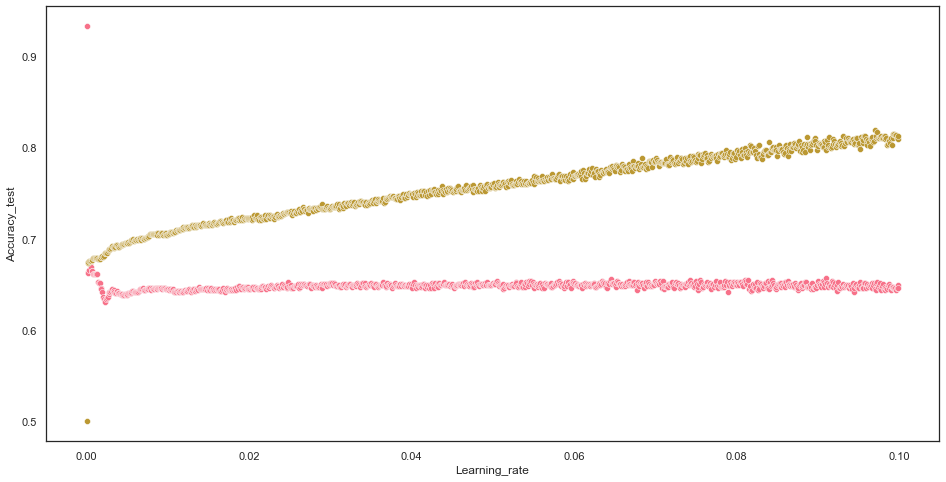

In [253]:
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=scores_fifteen, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=scores_fifteen, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

This plot is making me happy!

In [254]:
scores_fifteen.sort_values(by="Accuracy_test", ascending=False)

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance
0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,0.433010
4,0.672326,0.610754,0.531167,0.675636,0.675636,0.677518,0.0004,0.003309
5,0.668861,0.609697,0.530701,0.676059,0.676059,0.677823,0.0005,0.007198
3,0.665512,0.611903,0.531116,0.675636,0.675636,0.677189,0.0003,0.010124
6,0.665165,0.609316,0.530412,0.676695,0.676695,0.678272,0.0006,0.011530
7,0.664703,0.609069,0.530323,0.677119,0.677119,0.678615,0.0007,0.012415
1,0.663664,0.611713,0.530973,0.673729,0.673729,0.675142,0.0001,0.010065
2,0.662971,0.611341,0.530840,0.675000,0.675000,0.676397,0.0002,0.012029
9,0.662047,0.609246,0.530240,0.678814,0.678814,0.679956,0.0009,0.016767
10,0.661700,0.609060,0.530174,0.678602,0.678602,0.679658,0.0010,0.016902


In [255]:
top_lr_fifteen = 0.004

### Tune hyperparams

In [256]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [257]:
space["learning_rate"] = top_lr_fifteen

In [258]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<02:00,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  2%|▉                                               | 2/100 [00:03<02:16,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:14,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:05<02:06,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:07<02:25,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:09<02:28,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:10<02:18,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  8%|███▊                                            | 8/100 [00:12<02:30,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:13<02:14,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:14<02:07,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:16<02:13,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:17<02:01,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:19<02:11,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:20<01:59,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:21<01:55,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:23<01:51,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:24<01:45,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:26<01:58,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:27<01:50,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6446061446061446                                                                                                     
 20%|█████████▍                                     | 20/100 [00:29<02:04,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:30<01:55,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:31<01:46,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 23%|██████████▊                                    | 23/100 [00:34<02:06,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:35<01:56,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:36<01:52,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 26%|████████████▏                                  | 26/100 [00:38<01:56,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:39<01:51,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:41<01:54,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:42<01:47,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:44<01:42,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:45<01:34,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:46<01:32,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:48<01:29,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:49<01:24,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:51<01:33,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:52<01:27,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:53<01:22,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:55<01:30,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:56<01:23,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:57<01:19,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:59<01:30,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:00<01:23,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [01:02<01:30,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:03<01:21,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 45%|█████████████████████▏                         | 45/100 [01:05<01:29,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:07<01:21,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:08<01:16,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:10<01:22,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:11<01:14,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:12<01:10,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:13<01:05,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [01:15<01:09,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:16<01:05,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [01:18<01:06,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:19<01:02,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:21<00:58,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:22<00:55,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5988680988680989                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [01:24<01:01,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [01:25<01:02,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:27<00:58,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:28<01:00,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:29<00:55,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:31<00:57,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:32<00:51,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:34<00:48,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:35<00:45,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:36<00:42,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:37<00:41,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:39<00:43,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:40<00:40,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:42<00:38,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:43<00:35,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:44<00:33,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:45<00:32,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:46<00:30,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:48<00:29,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:49<00:28,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:50<00:26,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:51<00:25,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:52<00:24,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [01:54<00:22,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [01:55<00:21,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [01:56<00:20,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [01:57<00:19,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [01:59<00:20,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:00<00:18,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:01<00:16,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:03<00:15,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:04<00:13,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:05<00:12,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:06<00:11,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:08<00:09,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [02:09<00:09,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [02:11<00:09,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:12<00:06,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [02:14<00:06,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:15<00:04,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [02:17<00:03,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:18<00:01,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:01<02:42,  1.64s/trial, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  2%|▉                                              | 2/100 [00:03<02:39,  1.63s/trial, best loss: -0.5786555786555787]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:24,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:06<02:26,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:07<02:27,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:08<02:15,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:09<02:03,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6176946176946176                                                                                                     
  8%|███▊                                            | 8/100 [00:11<02:11,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  9%|████▎                                           | 9/100 [00:13<02:15,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:14<02:02,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:16<02:13,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5686070686070686                                                                                                     
 12%|█████▋                                         | 12/100 [00:17<02:15,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:18<02:02,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:20<02:04,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:21<01:51,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:22<01:58,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:24<01:58,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:26<02:01,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:27<01:50,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:28<01:40,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:29<01:36,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:30<01:34,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:31<01:29,  1.16s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:32<01:26,  1.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:33<01:26,  1.15s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:34<01:23,  1.13s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:35<01:20,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:37<01:21,  1.13s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:38<01:19,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:39<01:17,  1.10s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:40<01:16,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:41<01:15,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:43<01:23,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:44<01:20,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:45<01:16,  1.18s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:46<01:23,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:48<01:19,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:49<01:15,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:50<01:11,  1.18s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:51<01:18,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:52<01:13,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:54<01:10,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:55<01:08,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:56<01:05,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:57<01:03,  1.15s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:58<01:02,  1.16s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [01:00<01:07,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:01<01:03,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:02<01:02,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:03<00:58,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6152691152691153                                                                                                     
 51%|███████████████████████▉                       | 51/100 [01:05<01:05,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:06<01:00,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:07<00:57,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:08<00:55,  1.22s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:09<00:53,  1.19s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:10<00:51,  1.16s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:12<00:50,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [01:13<00:55,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:14<00:51,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:16<00:51,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:17<00:53,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [01:19<00:56,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:20<00:50,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:21<00:46,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [01:23<00:49,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:24<00:45,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:25<00:41,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:27<00:40,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:28<00:43,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:30<00:44,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:31<00:41,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:32<00:37,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:34<00:35,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:35<00:32,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:36<00:30,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:37<00:30,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:38<00:28,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:40<00:26,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:41<00:26,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:42<00:24,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [01:43<00:23,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [01:45<00:25,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [01:46<00:23,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [01:48<00:21,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [01:49<00:19,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [01:51<00:19,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [01:52<00:17,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [01:53<00:15,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [01:55<00:15,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [01:56<00:13,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [01:57<00:11,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [01:59<00:11,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [02:01<00:10,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:02<00:08,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:03<00:06,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [02:04<00:05,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:06<00:04,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:07<00:02,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [02:09<00:01,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:44,  1.05s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<01:46,  1.08s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:03<01:45,  1.09s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:04<01:43,  1.08s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:06<02:00,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:07<02:07,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:08<01:58,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:09<01:54,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:10<01:49,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:12<01:58,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:13<01:51,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:14<01:45,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:15<01:41,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 14%|██████▌                                        | 14/100 [00:17<01:56,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:19<01:59,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:20<01:52,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6452991452991453                                                                                                     
 17%|███████▉                                       | 17/100 [00:21<01:57,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:22<01:46,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:24<01:53,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:26<01:55,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:27<01:47,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:28<01:41,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:30<01:47,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:31<01:42,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:32<01:37,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:33<01:32,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:34<01:31,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:36<01:27,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:37<01:23,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:38<01:23,  1.19s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:39<01:29,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:41<01:24,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:42<01:23,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6078771078771079                                                                                                     
 34%|███████████████▉                               | 34/100 [00:43<01:30,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 35%|████████████████▍                              | 35/100 [00:45<01:35,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:46<01:26,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:47<01:21,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:49<01:32,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:51<01:35,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:52<01:27,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:53<01:19,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:54<01:14,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:56<01:20,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:57<01:14,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:59<01:10,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:00<01:08,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 47%|██████████████████████                         | 47/100 [01:01<01:13,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:03<01:17,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:04<01:13,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 50%|███████████████████████▌                       | 50/100 [01:06<01:19,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:08<01:13,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:09<01:07,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:10<01:08,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:12<01:03,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:14<01:11,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:15<01:07,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:16<01:03,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:18<01:01,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:19<00:57,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:21<00:57,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:23<01:04,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [01:25<01:04,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:26<00:57,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:27<00:51,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [01:29<00:53,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:30<00:48,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:31<00:44,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:32<00:43,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:34<00:40,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:35<00:37,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:36<00:36,  1.27s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:37<00:35,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:39<00:33,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [01:40<00:35,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:41<00:32,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [01:43<00:34,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:44<00:31,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [01:46<00:32,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:47<00:29,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:48<00:26,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [01:50<00:24,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [01:51<00:24,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [01:52<00:22,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [01:54<00:22,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [01:55<00:20,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [01:56<00:18,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [01:58<00:16,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6375606375606375                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [02:00<00:17,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:01<00:16,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:02<00:13,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:03<00:11,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:05<00:11,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [02:07<00:10,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:08<00:08,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:09<00:06,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:10<00:05,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [02:12<00:04,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [02:14<00:02,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:15<00:01,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:42,  1.04s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<01:48,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
  3%|█▍                                              | 3/100 [00:03<01:59,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:05<02:10,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:06<02:00,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:08<02:05,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:09<02:13,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:11<02:14,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:12<02:05,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:13<01:56,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:15<02:00,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:16<01:55,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:17<02:00,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 14%|██████▌                                        | 14/100 [00:19<02:10,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:21<02:08,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6185031185031185                                                                                                     
 16%|███████▌                                       | 16/100 [00:22<02:09,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:23<01:57,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:25<01:56,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:26<01:48,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 20%|█████████▍                                     | 20/100 [00:27<01:52,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:29<01:44,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:30<01:41,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:31<01:35,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:32<01:30,  1.19s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:33<01:29,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:34<01:26,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:35<01:23,  1.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:37<01:33,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:38<01:27,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:39<01:22,  1.18s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:40<01:22,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:42<01:19,  1.17s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:43<01:28,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:45<01:26,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:46<01:21,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:47<01:19,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:48<01:18,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:49<01:14,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:51<01:22,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:52<01:16,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:53<01:12,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:55<01:20,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:56<01:14,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:57<01:10,  1.26s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:59<01:11,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:00<01:07,  1.25s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:01<01:05,  1.23s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:03<01:12,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [01:04<01:14,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:06<01:10,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:07<01:05,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:08<01:02,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 53%|████████████████████████▉                      | 53/100 [01:10<01:08,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [01:12<01:13,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:14<01:16,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:15<01:08,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:16<01:07,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:18<01:02,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:20<01:04,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:21<01:04,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:23<01:06,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:25<01:03,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:27<01:03,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:28<00:59,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:29<00:55,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [01:31<00:57,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:33<00:52,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:34<00:48,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:36<00:47,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:37<00:43,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:38<00:42,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [01:40<00:45,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:42<00:41,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:43<00:40,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:45<00:36,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [01:47<00:39,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:48<00:35,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [01:50<00:37,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:51<00:33,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:53<00:30,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [01:55<00:32,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [01:57<00:31,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [01:59<00:31,  1.84s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:00<00:26,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5705705705705706                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:02<00:27,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [02:04<00:25,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:06<00:22,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [02:07<00:21,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:09<00:18,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:10<00:15,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:12<00:13,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:13<00:12,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:14<00:10,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:16<00:08,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:17<00:07,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:19<00:05,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:20<00:04,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:22<00:02,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:23<00:01,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6174636174636174                                                                                                     
  1%|▍                                              | 1/100 [00:01<02:52,  1.75s/trial, best loss: -0.6174636174636174]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:03<02:40,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:04<02:27,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:05<02:20,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5694155694155694                                                                                                     
  5%|██▍                                             | 5/100 [00:07<02:33,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  6%|██▉                                             | 6/100 [00:09<02:45,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:11<02:49,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:13<02:48,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:15<02:50,  1.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 10%|████▋                                          | 10/100 [00:17<02:49,  1.88s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5966735966735967                                                                                                     
 11%|█████▏                                         | 11/100 [00:19<02:48,  1.89s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:20<02:30,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:22<02:25,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:23<02:11,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:25<02:12,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:26<02:18,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:28<02:09,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:30<02:18,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 19%|████████▉                                      | 19/100 [00:32<02:22,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6452991452991453                                                                                                     
 20%|█████████▍                                     | 20/100 [00:34<02:23,  1.80s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:35<02:08,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:36<02:06,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:38<01:55,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:39<01:50,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:40<01:48,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:42<01:42,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:43<01:42,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:44<01:39,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:46<01:34,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:47<01:37,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:48<01:33,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:50<01:33,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:52<01:44,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:53<01:35,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:55<01:45,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:56<01:36,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:58<01:46,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [01:00<01:42,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [01:02<01:43,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:03<01:34,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:04<01:29,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:06<01:25,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:07<01:20,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:09<01:20,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:10<01:17,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:11<01:12,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:13<01:12,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:14<01:09,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:15<01:07,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:17<01:09,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [01:18<01:12,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:20<01:11,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:21<01:06,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:22<01:03,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:24<01:09,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [01:26<01:11,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [01:28<01:14,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [01:30<01:14,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [01:32<01:15,  1.84s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:33<01:06,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [01:35<01:08,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:36<01:01,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:39<01:07,  1.82s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [01:41<01:05,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:43<01:06,  1.89s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:44<01:00,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:46<01:00,  1.82s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:48<00:54,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:50<00:57,  1.86s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:51<00:50,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:52<00:46,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [01:54<00:47,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [01:56<00:47,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:58<00:43,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:59<00:38,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6183876183876184                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [02:01<00:40,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [02:02<00:35,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [02:03<00:32,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:05<00:30,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:06<00:28,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:08<00:26,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:09<00:24,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:10<00:22,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:12<00:21,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:13<00:20,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:14<00:18,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:16<00:17,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:17<00:15,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:18<00:14,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:19<00:13,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:21<00:11,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:22<00:11,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:24<00:09,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:25<00:08,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:26<00:06,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:28<00:05,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:29<00:04,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:30<00:02,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:32<00:01,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<01:53,  1.14s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:03<02:14,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:04<02:24,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  4%|█▉                                              | 4/100 [00:06<02:39,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  5%|██▍                                             | 5/100 [00:08<02:44,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  6%|██▉                                             | 6/100 [00:10<02:48,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:12<02:45,  1.78s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  8%|███▊                                            | 8/100 [00:14<02:49,  1.84s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:15<02:29,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:17<02:32,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:18<02:18,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:20<02:21,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 13%|██████                                         | 13/100 [00:22<02:27,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 14%|██████▌                                        | 14/100 [00:23<02:26,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:25<02:16,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:26<02:03,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6312081312081312                                                                                                     
 17%|███████▉                                       | 17/100 [00:28<02:11,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:29<02:02,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:30<01:52,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:32<01:49,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:33<01:45,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:34<01:40,  1.29s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:35<01:41,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:37<01:38,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:38<01:35,  1.28s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:39<01:38,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:41<01:36,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:42<01:34,  1.31s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:43<01:34,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:45<01:30,  1.30s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:46<01:35,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:48<01:36,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:49<01:32,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 34%|███████████████▉                               | 34/100 [00:51<01:43,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:52<01:35,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:54<01:33,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:55<01:38,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:57<01:33,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:58<01:30,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:59<01:23,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:01<01:23,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:02<01:19,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:03<01:15,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:05<01:17,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:06<01:13,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [01:08<01:23,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:09<01:17,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:11<01:12,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5930930930930931                                                                                                     
 49%|███████████████████████                        | 49/100 [01:13<01:21,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:14<01:14,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:15<01:12,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 52%|████████████████████████▍                      | 52/100 [01:17<01:14,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [01:19<01:20,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:20<01:12,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:22<01:07,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:23<01:04,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:24<00:59,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:26<00:58,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:27<00:56,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:28<00:53,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:30<00:53,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:31<00:50,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:33<00:58,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [01:35<00:59,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:36<00:54,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [01:38<00:56,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:40<00:51,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:41<00:48,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:42<00:44,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:44<00:42,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:45<00:40,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:46<00:38,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:48<00:37,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:49<00:35,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:50<00:33,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:52<00:32,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:53<00:30,  1.33s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:54<00:29,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [01:56<00:28,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [01:57<00:26,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [01:58<00:25,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:00<00:24,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [02:02<00:25,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:03<00:23,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:05<00:23,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:06<00:21,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [02:08<00:20,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:09<00:18,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:11<00:16,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:12<00:14,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:14<00:13,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:15<00:11,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:17<00:11,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:19<00:09,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:20<00:07,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [02:22<00:06,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:24<00:04,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:25<00:03,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:27<00:01,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<02:10,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:03<02:46,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:05<02:38,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6342111342111342                                                                                                     
  4%|█▉                                              | 4/100 [00:07<02:45,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:08<02:27,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:10<02:36,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  7%|███▎                                            | 7/100 [00:12<02:38,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  8%|███▊                                            | 8/100 [00:14<02:43,  1.78s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:15<02:25,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 10%|████▋                                          | 10/100 [00:17<02:37,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:19<02:39,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:20<02:25,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:22<02:17,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:23<02:06,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:24<02:04,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:26<01:58,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 17%|███████▉                                       | 17/100 [00:27<02:10,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:29<02:18,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 19%|████████▉                                      | 19/100 [00:31<02:19,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:33<02:21,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:34<02:07,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:36<02:03,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:37<01:53,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:38<01:48,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:40<01:47,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:41<01:43,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:43<01:44,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:44<01:41,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:45<01:38,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:47<01:42,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:49<01:48,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:50<01:43,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:52<01:37,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:53<01:33,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:54<01:33,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:56<01:26,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:57<01:24,  1.34s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:59<01:33,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [01:00<01:26,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:01<01:27,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:03<01:23,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [01:05<01:38,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:06<01:29,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:08<01:22,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 45%|█████████████████████▏                         | 45/100 [01:10<01:29,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:11<01:21,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:12<01:20,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:14<01:14,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:15<01:10,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [01:17<01:17,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:18<01:10,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:19<01:09,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [01:21<01:13,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [01:23<01:19,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:25<01:18,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:27<01:15,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:28<01:08,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:30<01:06,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:31<01:03,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [01:33<01:07,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:35<01:04,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:36<00:58,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:38<00:58,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:39<00:53,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:40<00:51,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:42<00:49,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:43<00:45,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:45<00:46,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:46<00:43,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:47<00:41,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:49<00:42,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:50<00:39,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:52<00:38,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:53<00:36,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:54<00:34,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:56<00:34,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [01:58<00:35,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [01:59<00:33,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [02:01<00:34,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:03<00:32,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:04<00:28,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:05<00:26,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:07<00:25,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:08<00:22,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:10<00:24,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [02:12<00:23,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:13<00:20,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [02:15<00:19,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:17<00:17,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [02:19<00:17,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [02:21<00:16,  1.85s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [02:23<00:14,  1.86s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:24<00:12,  1.78s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [02:26<00:10,  1.80s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:28<00:08,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:29<00:06,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:30<00:04,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:32<00:03,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:33<00:01,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:01<02:02,  1.24s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:02<01:58,  1.21s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:03<02:07,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:05<02:06,  1.32s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  5%|██▍                                             | 5/100 [00:07<02:19,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:08<02:16,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:10<02:21,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:12<02:34,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  9%|████▎                                           | 9/100 [00:13<02:34,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6280896280896281                                                                                                     
 10%|████▋                                          | 10/100 [00:16<02:43,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:17<02:24,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:19<02:37,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 13%|██████                                         | 13/100 [00:21<02:34,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6202356202356203                                                                                                     
 14%|██████▌                                        | 14/100 [00:23<02:41,  1.88s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:24<02:20,  1.66s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:25<02:15,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:27<02:02,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:28<01:53,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6208131208131208                                                                                                     
 19%|████████▉                                      | 19/100 [00:30<02:10,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:32<02:11,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:33<02:04,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:35<02:05,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:36<02:03,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:38<01:53,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:39<01:50,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:40<01:48,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:42<01:42,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:44<01:56,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:45<01:46,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:46<01:42,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:48<01:37,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:49<01:31,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:51<01:39,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:52<01:32,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:53<01:30,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:55<01:31,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:57<01:37,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:58<01:37,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:59<01:29,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [01:02<01:42,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:03<01:33,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:05<01:31,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:06<01:25,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [01:08<01:30,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 45%|█████████████████████▏                         | 45/100 [01:10<01:34,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:11<01:25,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [01:13<01:30,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:15<01:33,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
 49%|███████████████████████                        | 49/100 [01:17<01:36,  1.89s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:18<01:26,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:20<01:23,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:21<01:14,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:23<01:13,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:24<01:08,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:25<01:03,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:27<01:03,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:28<00:58,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [01:30<01:05,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:31<01:00,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:33<00:56,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:34<00:57,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:36<00:53,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:37<00:52,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:38<00:51,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:40<00:49,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:41<00:49,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:43<00:47,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:44<00:45,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [01:46<00:44,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:47<00:41,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:49<00:42,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [01:50<00:44,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6113421113421114                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [01:53<00:49,  1.82s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:54<00:42,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:56<00:40,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [01:57<00:40,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:59<00:37,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [02:00<00:34,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:02<00:30,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:03<00:29,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:04<00:27,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [02:06<00:29,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:08<00:26,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:09<00:23,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:11<00:22,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:12<00:20,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:13<00:18,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:15<00:16,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [02:17<00:16,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [02:19<00:16,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [02:21<00:15,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:22<00:13,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:23<00:10,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:25<00:09,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:27<00:08,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:28<00:06,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:30<00:04,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:31<00:03,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:33<00:01,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6310926310926311                                                                                                     
  1%|▍                                              | 1/100 [00:02<03:30,  2.12s/trial, best loss: -0.6310926310926311]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  2%|▉                                              | 2/100 [00:03<03:13,  1.98s/trial, best loss: -0.6310926310926311]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                             | 3/100 [00:05<03:12,  1.98s/trial, best loss: -0.6310926310926311]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:06<02:46,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:08<02:42,  1.71s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:10<02:33,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:11<02:38,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6301686301686301                                                                                                     
  8%|███▊                                            | 8/100 [00:13<02:43,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:15<02:26,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:16<02:22,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:18<02:24,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 12%|█████▋                                         | 12/100 [00:20<02:37,  1.79s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:21<02:19,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:23<02:11,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:24<02:18,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6433356433356433                                                                                                     
 16%|███████▌                                       | 16/100 [00:26<02:27,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:28<02:13,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:30<02:18,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:31<02:11,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:33<02:13,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:34<02:09,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:36<02:00,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:37<01:55,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:38<01:48,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:40<01:43,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:41<01:49,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:43<01:42,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:44<01:41,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:45<01:39,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:47<01:46,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:49<01:44,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:50<01:37,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:51<01:35,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:53<01:33,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:55<01:44,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:56<01:41,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:58<01:35,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [01:00<01:44,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 39%|██████████████████▎                            | 39/100 [01:01<01:43,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [01:03<01:39,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:04<01:29,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:06<01:25,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [01:07<01:23,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [01:08<01:19,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [01:10<01:24,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:11<01:18,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:13<01:16,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [01:15<01:23,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [01:17<01:28,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:18<01:21,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:19<01:14,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:21<01:14,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:22<01:09,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:24<01:06,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [01:26<01:11,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:27<01:07,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:29<01:05,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:30<00:59,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:31<00:57,  1.39s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [01:33<01:01,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:34<00:56,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:36<00:55,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [01:37<00:51,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:38<00:51,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:40<00:48,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [01:41<00:46,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:43<00:47,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:44<00:44,  1.38s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:46<00:50,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:48<00:48,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:49<00:47,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [01:52<00:49,  1.77s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:53<00:45,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [01:54<00:41,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:56<00:37,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:57<00:37,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:59<00:34,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [02:01<00:36,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:02<00:32,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [02:03<00:29,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [02:05<00:28,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:06<00:25,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [02:08<00:25,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [02:09<00:23,  1.46s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [02:10<00:21,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [02:13<00:22,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:14<00:19,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [02:16<00:20,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:17<00:17,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [02:19<00:17,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:21<00:14,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:22<00:12,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [02:24<00:11,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:25<00:09,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:27<00:07,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [02:29<00:06,  1.62s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:30<00:04,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:31<00:03,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [02:33<00:01,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5992145992145992                                                                                                     
  1%|▍                                              | 1/100 [00:01<03:07,  1.89s/trial, best loss: -0.5992145992145992]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:03<02:49,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:04<02:44,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:06<02:32,  1.59s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:07<02:19,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  6%|██▉                                             | 6/100 [00:09<02:28,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6176946176946176                                                                                                     
  7%|███▎                                            | 7/100 [00:11<02:33,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:12<02:19,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:14<02:30,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:15<02:15,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:17<02:31,  1.70s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 12%|█████▋                                         | 12/100 [00:19<02:28,  1.69s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:20<02:19,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 14%|██████▌                                        | 14/100 [00:22<02:20,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6271656271656272                                                                                                     
 15%|███████                                        | 15/100 [00:24<02:27,  1.73s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 16%|███████▌                                       | 16/100 [00:25<02:24,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:27<02:15,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:28<02:09,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6480711480711481                                                                                                     
 19%|████████▉                                      | 19/100 [00:30<02:12,  1.63s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:32<02:07,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:33<01:56,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:34<01:50,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:36<02:02,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:37<01:54,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:39<01:56,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:40<01:47,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:42<01:48,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:43<01:46,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:44<01:39,  1.40s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:46<01:50,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:48<01:41,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:50<01:49,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:51<01:40,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:52<01:35,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:54<01:35,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:55<01:30,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:57<01:30,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:58<01:38,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [01:00<01:36,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [01:02<01:40,  1.67s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [01:03<01:32,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [01:05<01:28,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [01:06<01:29,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [01:08<01:37,  1.75s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 45%|█████████████████████▏                         | 45/100 [01:10<01:39,  1.81s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [01:12<01:32,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [01:13<01:23,  1.57s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [01:15<01:23,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [01:16<01:16,  1.51s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [01:17<01:12,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [01:19<01:13,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [01:20<01:08,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [01:22<01:08,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [01:23<01:05,  1.42s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [01:24<01:00,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [01:26<01:02,  1.43s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [01:27<00:58,  1.37s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [01:29<00:57,  1.36s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [01:30<00:57,  1.41s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [01:31<00:54,  1.35s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.581081081081081                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [01:34<01:04,  1.65s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [01:35<00:57,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [01:37<01:05,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [01:38<00:57,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [01:40<00:55,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [01:42<00:57,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [01:43<00:53,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [01:45<00:49,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [01:47<00:52,  1.68s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [01:48<00:48,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [01:49<00:43,  1.50s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [01:51<00:44,  1.58s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [01:52<00:40,  1.49s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [01:55<00:45,  1.74s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [01:56<00:40,  1.60s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [01:57<00:37,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [01:59<00:35,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [02:00<00:31,  1.45s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [02:02<00:30,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [02:04<00:32,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [02:06<00:33,  1.76s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.641949641949642                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [02:08<00:32,  1.83s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [02:10<00:31,  1.88s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [02:12<00:29,  1.87s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [02:14<00:28,  1.92s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [02:15<00:24,  1.72s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [02:16<00:21,  1.64s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [02:18<00:18,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [02:19<00:16,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [02:21<00:15,  1.54s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [02:22<00:13,  1.48s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [02:24<00:12,  1.56s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [02:25<00:10,  1.47s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [02:27<00:09,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [02:28<00:07,  1.55s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [02:30<00:06,  1.53s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [02:31<00:04,  1.52s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [02:33<00:02,  1.44s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [02:35<00:01,  1.61s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [02:36<00:00,  1.56s/trial, best loss: -0.933009933009933]


4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.57      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.64      0.19       579

    accuracy                           0.64      8658
   macro avg       0.54      0.64     

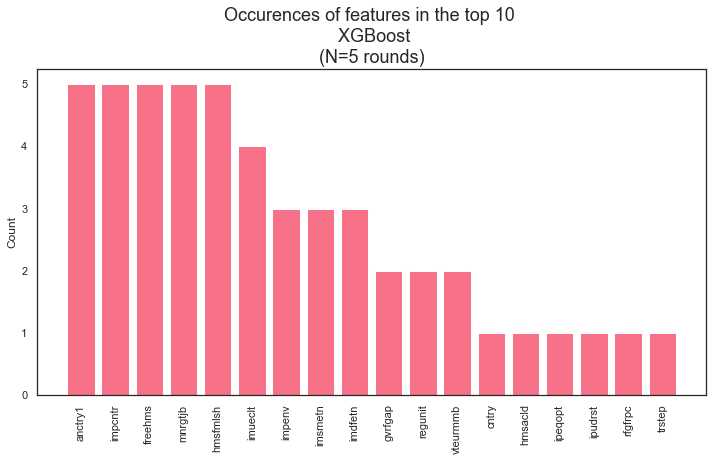

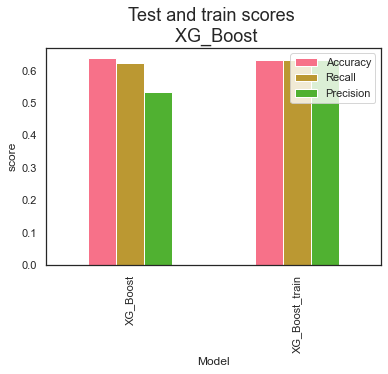

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8079
           1       0.11      0.66      0.18       579

    accuracy                           0.60      8658
   macro avg       0.53      0.63     

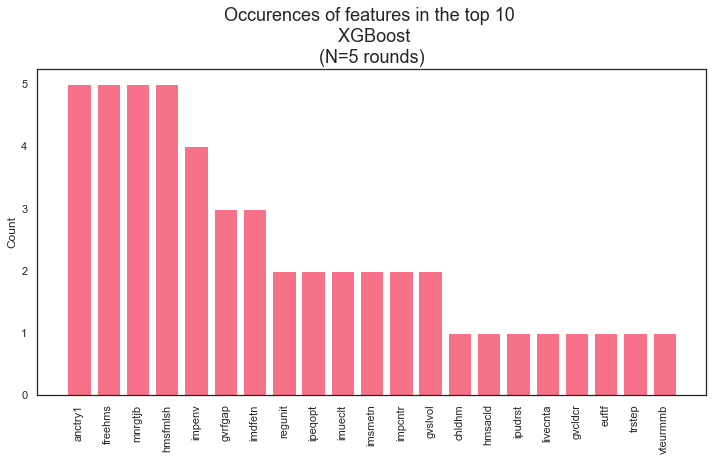

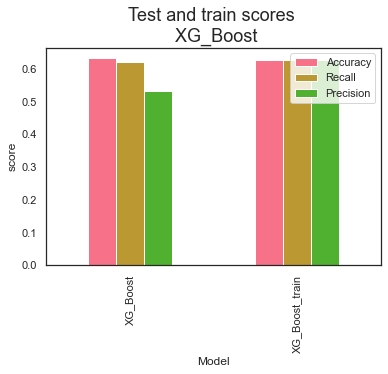

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8077
           1       0.11      0.60      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.63     

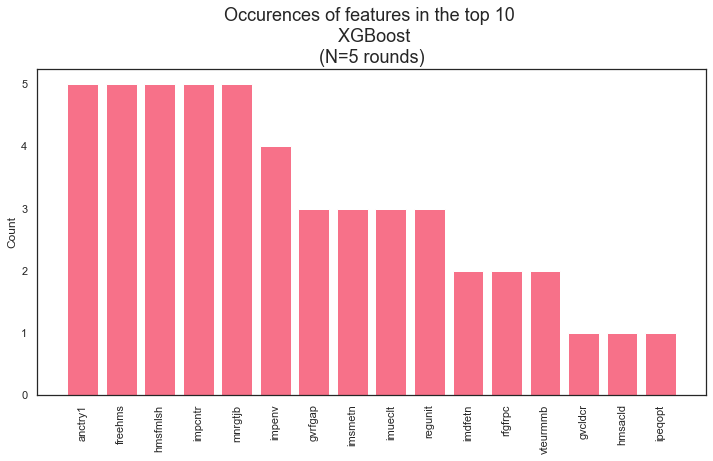

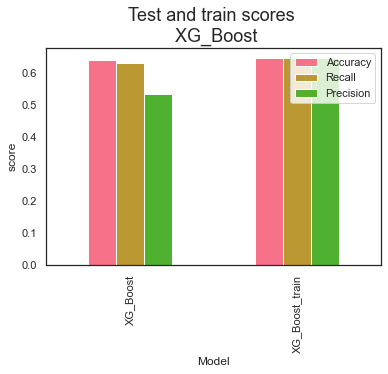

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.78      8077
           1       0.11      0.57      0.18       581

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8079
           1       0.11      0.64      0.19       579

    accuracy                           0.63      8658
   macro avg       0.53      0.63     

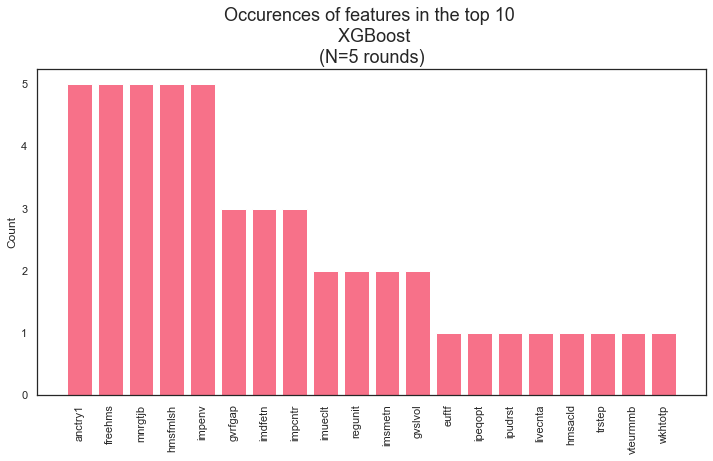

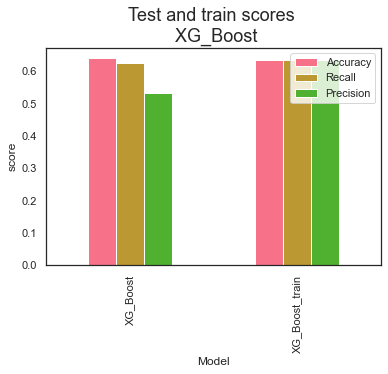

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.18       582

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.60      0.74      8077
           1       0.10      0.59      0.16       581

    accuracy                           0.60      8658
   macro avg       0.52      0.59      0.45      8658
weighted avg       0.90      0.60      0.70      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8079
           1       0.11      0.62      0.18       579

    accuracy                           0.63      8658
   macro avg       0.53      0.62     

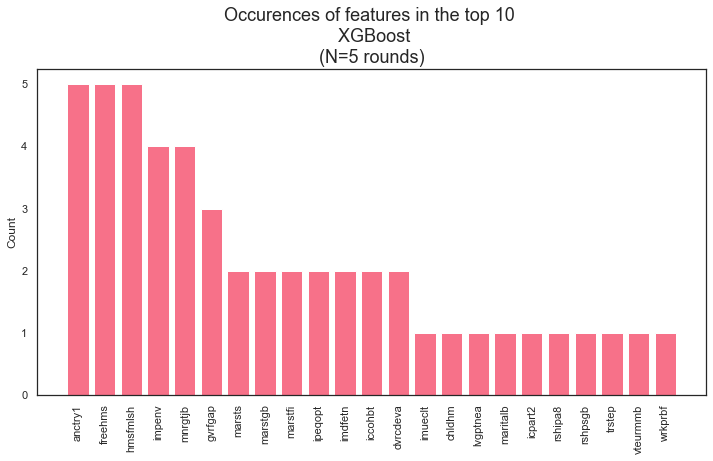

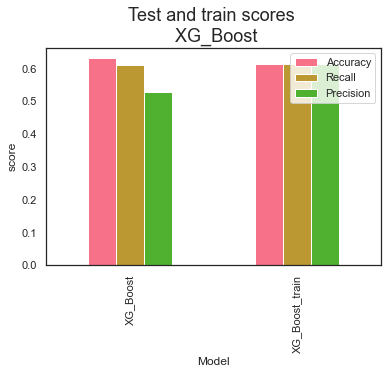

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.61      0.75      8077
           1       0.10      0.58      0.17       581

    accuracy                           0.61      8658
   macro avg       0.53      0.60      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8079
           1       0.11      0.63      0.18       579

    accuracy                           0.63      8658
   macro avg       0.53      0.63     

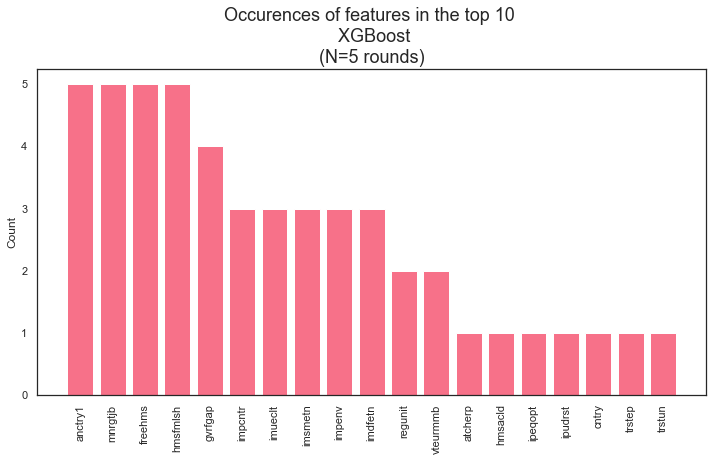

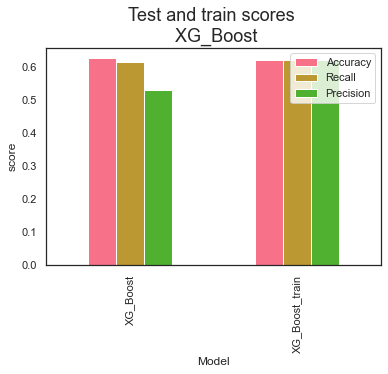

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.61      0.74      8079
           1       0.11      0.66      0.18       579

    accuracy                           0.61      8658
   macro avg       0.53      0.63     

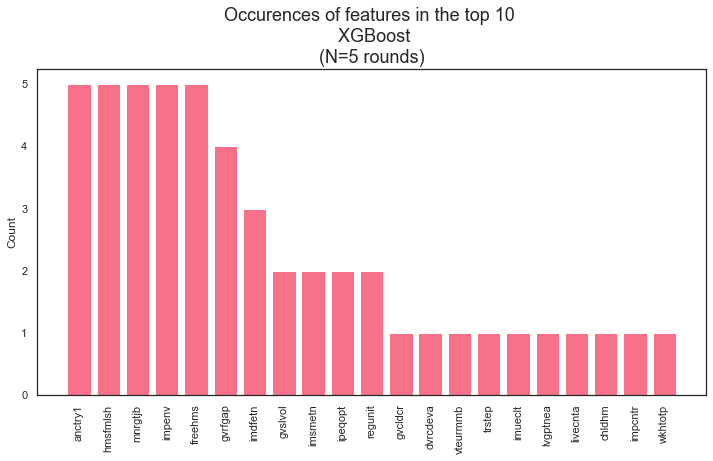

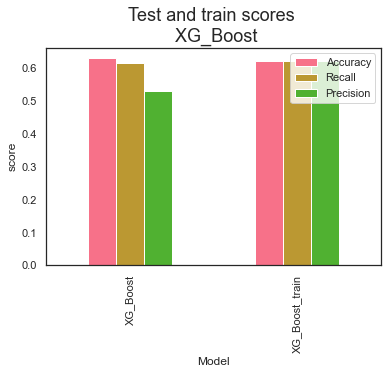

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.59      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.60      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.63      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63     

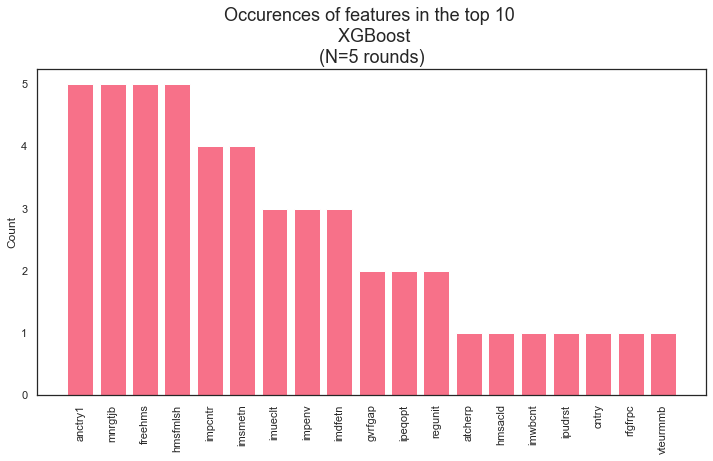

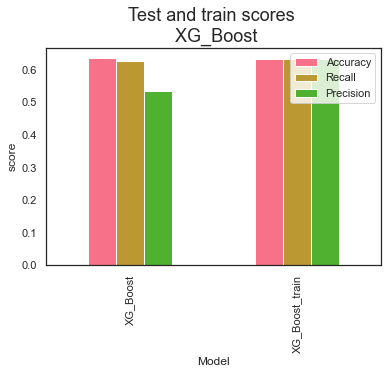

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8077
           1       0.10      0.60      0.18       581

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.63     

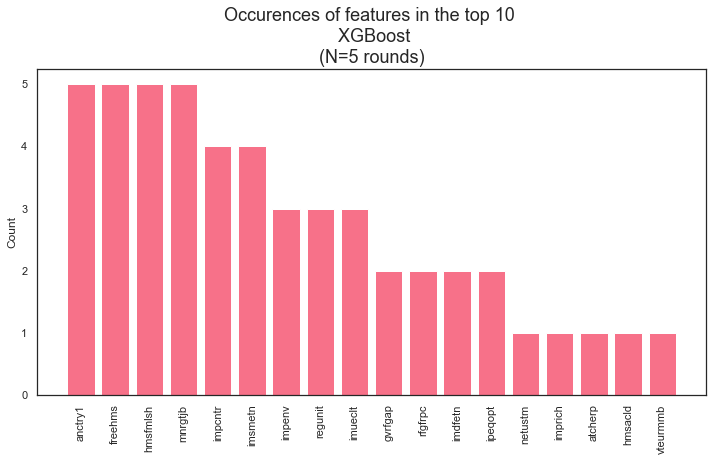

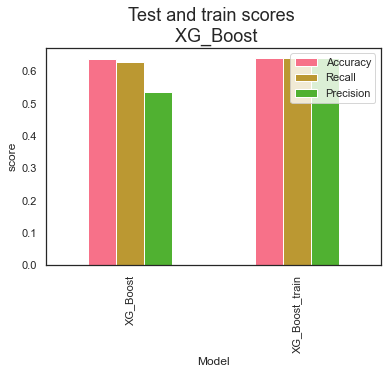

4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718
Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.57      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722
Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.65      8658
   macro avg       0.54      0.64     

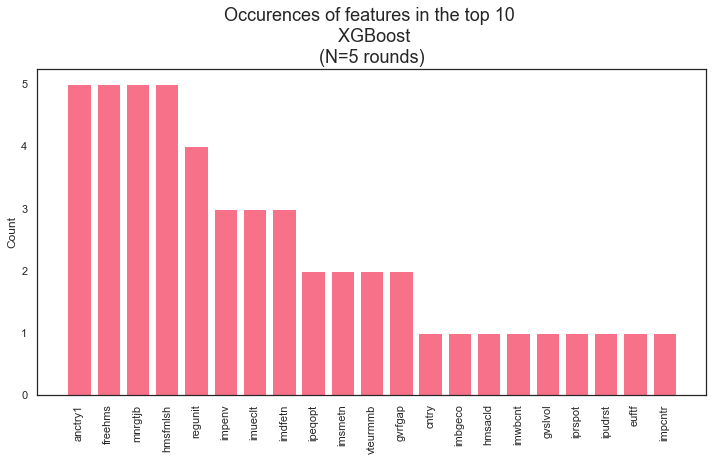

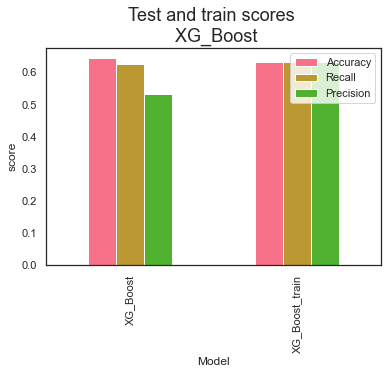

In [259]:
top_param_fifteen = top_param(X_noclimate, y_duo, random_states, top_lr_fifteen, True, values_list_duo)

In [260]:
top_param_fifteen

{'reg_alpha': 148.0,
 'colsample_bytree': 0.5126441780078403,
 'reg_lambda': 0.6219886168804762,
 'gamma': 4.956139864797143,
 'min_child_weight': 7.0,
 'max_depth': 6}

In [261]:
#hardcode this
top_param_fifteen = {'min_child_weight': 3.0,
 'reg_lambda': 0.7924367950060688,
 'reg_alpha': 178.0,
 'gamma': 2.9501999402255468,
 'max_depth': 9,
 'colsample_bytree': 0.5789137134304763}

4678 4678
Random state: 0 
               precision    recall  f1-score   support

           0       0.95      0.68      0.79      8057
           1       0.11      0.55      0.19       601

    accuracy                           0.67      8658
   macro avg       0.53      0.61      0.49      8658
weighted avg       0.89      0.67      0.75      8658
 

4702 4702
Random state: 1 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8069
           1       0.11      0.62      0.18       589

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4750 4750
Random state: 2 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8093
           1       0.10      0.56      0.18       565

    accuracy                           0.66      8658
   macro avg       0.53      0.61      0

Random state: 20 
               precision    recall  f1-score   support

           0       0.96      0.68      0.80      8057
           1       0.12      0.59      0.20       601

    accuracy                           0.67      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.90      0.67      0.75      8658
 

4746 4746
Random state: 21 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8091
           1       0.11      0.56      0.19       567

    accuracy                           0.68      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 

4722 4722
Random state: 22 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8079
           1       0.12      0.57      0.19       579

    accuracy                           0.68      8658
   macro avg       0.54      0.63      0.50    

Random state: 40 
               precision    recall  f1-score   support

           0       0.95      0.70      0.81      8049
           1       0.12      0.55      0.20       609

    accuracy                           0.69      8658
   macro avg       0.54      0.62      0.50      8658
weighted avg       0.89      0.69      0.76      8658
 

4646 4646
Random state: 41 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8041
           1       0.13      0.58      0.21       617

    accuracy                           0.69      8658
   macro avg       0.54      0.63      0.51      8658
weighted avg       0.90      0.69      0.76      8658
 

4700 4700
Random state: 42 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8068
           1       0.12      0.60      0.19       590

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49    

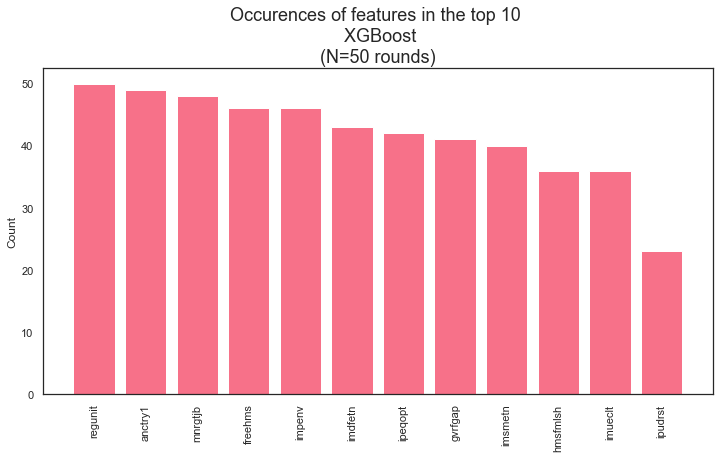

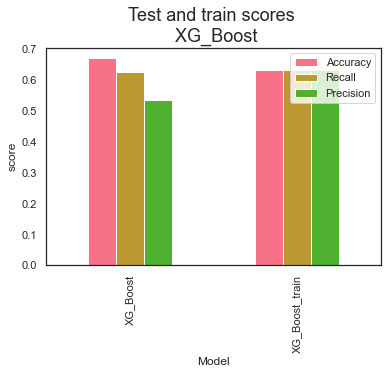

In [262]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

score_fifteen, feat_fifteen = XG_Boost(X_fifteen, y_duo, random_states_many, True, top_lr_fifteen, top_param_fifteen)

In [263]:
score_fifteen

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.670268,0.626931,0.535986,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.630803,0.630803,0.632195,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


Slightly better accuracy than before, not extremely

# Plots for presentation

In [264]:
plot_data = pd.read_csv('./data/climate_full_fill.csv')
plotdata = plot_data[plot_data.clmchng != 0.12345]

In [265]:
counts = plotdata[["cntry", "nwspol", "clmchng"]].groupby(["cntry", "clmchng"]).count().reset_index()
counts.columns=["cntry", "clmchng", "count"]
counts.head()

,cntry,clmchng,count
0,AT,1.0,1050
1,AT,2.0,753
2,AT,3.0,123
3,AT,4.0,36
4,BE,1.0,1140


In [266]:
#calculate EU_totals
tot_1 = counts[counts["clmchng"]==1].sum()
tot_2 = counts[counts["clmchng"]==2].sum()
tot_3 = counts[counts["clmchng"]==3].sum()
tot_4 = counts[counts["clmchng"]==4].sum()

In [267]:
# put totals in dataframe
EU_counts = pd.DataFrame({"cntry": ["EU","EU","EU","EU"], "clmchng":[1.0,2.0,3.0,4.0], "count":[tot_1["count"], tot_2["count"], tot_3["count"], tot_4["count"]]})
EU_counts

,cntry,clmchng,count
0,EU,1.0,24585
1,EU,2.0,15764
2,EU,3.0,1962
3,EU,4.0,978


In [268]:
#append EU totals to counts dataframe
counts = counts.append(EU_counts).reset_index()

In [269]:
countries_dict = {'AT':'Austria',
            'BE':'Belgium',
            "CH":"Switzerland",
            'CZ':'Czech Republic',
            'DE':'Germany',
            'EE':'Estonia',
            'ES':'Spain',
            'FI':'Finland',
            'FR':'France',
            'GB':'United Kingdom',
            'HU':'Hungary',
            'IE':'Ireland',
            "IL":"Israel", 
            "IS":"Iceland",
            'IT':'Italy',
            'LT':'Lithuania',
            'NL':'Netherlands',
            "NO":"Norway",
            'PL':'Poland',
            'PT':'Portugal',
            "RU":"Russia",
            'SE':'Sweden',
            'SI':'Slovenia',
            "EU":"EUROPE_23"
            }

In [270]:
counts["country"] = counts['cntry'].map(countries_dict)
counts.tail(10)

,index,cntry,clmchng,count,country
86,86,SE,3.0,42,Sweden
87,87,SE,4.0,7,Sweden
88,88,SI,1.0,933,Slovenia
89,89,SI,2.0,319,Slovenia
90,90,SI,3.0,32,Slovenia
91,91,SI,4.0,11,Slovenia
92,0,EU,1.0,24585,EUROPE_23
93,1,EU,2.0,15764,EUROPE_23
94,2,EU,3.0,1962,EUROPE_23
95,3,EU,4.0,978,EUROPE_23


In [271]:
# add percentage column
counts["percentage"] = 0

In [272]:
perc = []
for i in range(0, len(counts), 4):
    sum_country = counts.loc[i, "count"]+counts.loc[i+1, "count"]+counts.loc[i+2, "count"]+counts.loc[i+3, "count"]

    counts.loc[i, "percentage"] = counts.loc[i,"count"]/sum_country*100
    counts.loc[i+1, "percentage"] = counts.loc[i+1,"count"]/sum_country*100
    counts.loc[i+2, "percentage"] = counts.loc[i+2,"count"]/sum_country*100
    counts.loc[i+3, "percentage"] = counts.loc[i+3,"count"]/sum_country*100

counts.head()

,index,cntry,clmchng,count,country,percentage
0,0,AT,1.0,1050,Austria,53.516820
1,1,AT,2.0,753,Austria,38.379205
2,2,AT,3.0,123,Austria,6.269113
3,3,AT,4.0,36,Austria,1.834862
4,4,BE,1.0,1140,Belgium,64.589235


In [273]:
def_true_perc = counts[counts["clmchng"]==1].sort_values(by="percentage", ascending=False)
def_true_perc.head()

,index,cntry,clmchng,count,country,percentage
76,76,PT,1.0,982,Portugal,77.874703
24,24,ES,1.0,1416,Spain,73.903967
52,52,IS,1.0,646,Iceland,73.744292
88,88,SI,1.0,933,Slovenia,72.046332
64,64,NL,1.0,1141,Netherlands,68.241627


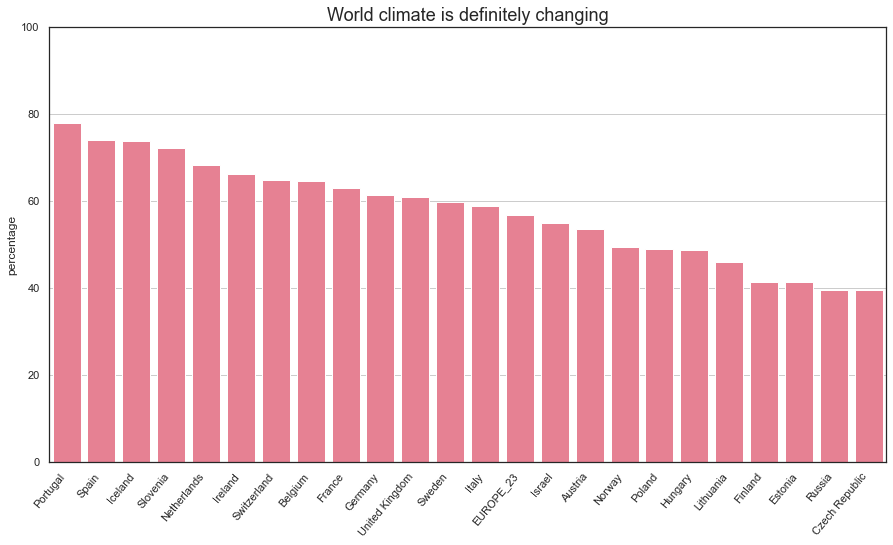

In [274]:
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(data=def_true_perc, x="country", y="percentage", color=sns.color_palette("husl", 9)[0])
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("percentage")
plt.title("World climate is definitely changing")
plt.grid(b=None, which='major', axis='y')
plt.ylim(0,100)
# plt.savefig('./figures/defchanging.png', dpi=360)
plt.show();

In [275]:
def_false_perc = counts[counts["clmchng"]==3].sort_values(by="percentage", ascending=True)
def_false_perc.head()

,index,cntry,clmchng,count,country,percentage
54,54,IS,3.0,11,Iceland,1.255708
78,78,PT,3.0,23,Portugal,1.823949
26,26,ES,3.0,42,Spain,2.192067
10,10,CH,3.0,36,Switzerland,2.371542
90,90,SI,3.0,32,Slovenia,2.471042


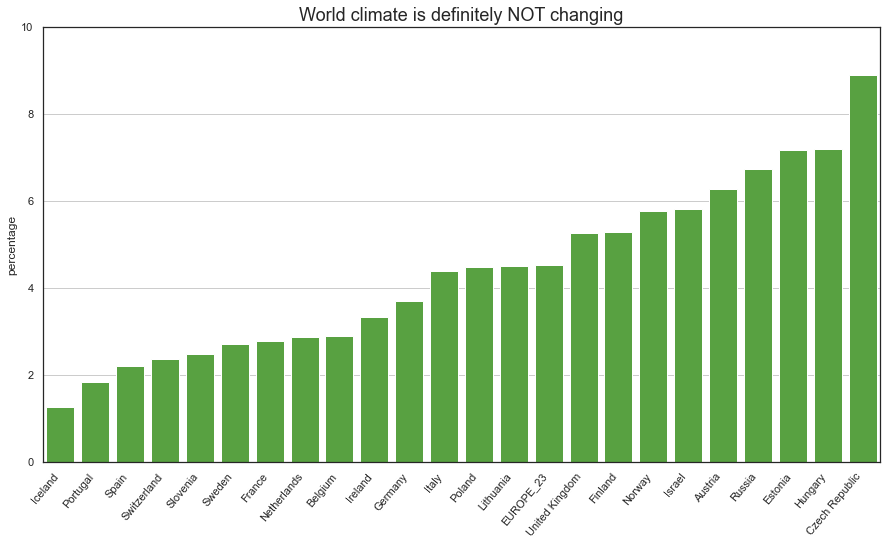

In [276]:
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(data=def_false_perc, x="country", y="percentage", color=sns.color_palette("husl", 9)[3])
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("percentage")
plt.title("World climate is definitely NOT changing")
plt.grid(b=None, which='major', axis='y')
plt.ylim(0,10)
# plt.savefig('./figures/defNOTchanging.png', dpi=360)
plt.show();

In [277]:
answer_dict = {1:"Definitely", 2:"Probably", 3:"Probably not", 4:"Definitely not"}

In [278]:
counts["answer"] = counts['clmchng'].map(answer_dict)
counts.tail(10)

,index,cntry,clmchng,count,country,percentage,answer
86,86,SE,3.0,42,Sweden,2.718447,Probably not
87,87,SE,4.0,7,Sweden,0.453074,Definitely not
88,88,SI,1.0,933,Slovenia,72.046332,Definitely
89,89,SI,2.0,319,Slovenia,24.633205,Probably
90,90,SI,3.0,32,Slovenia,2.471042,Probably not
91,91,SI,4.0,11,Slovenia,0.849421,Definitely not
92,0,EU,1.0,24585,EUROPE_23,56.792719,Definitely
93,1,EU,2.0,15764,EUROPE_23,36.415718,Probably
94,2,EU,3.0,1962,EUROPE_23,4.532329,Probably not
95,3,EU,4.0,978,EUROPE_23,2.259234,Definitely not


In [279]:
plot_me = counts.groupby("answer").sum().reset_index()
plot_me

,answer,index,clmchng,count,percentage
0,Definitely,1012,24.0,49170,1384.815925
1,Definitely not,1084,96.0,1956,50.634963
2,Probably,1036,48.0,31528,859.897330
3,Probably not,1060,72.0,3924,104.651782


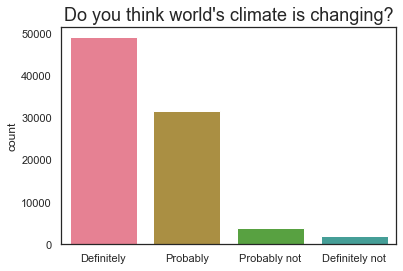

In [280]:
sns.barplot(x="answer",y="count", data=plot_me.sort_values(by="count", ascending=False))
plt.title("Do you think world's climate is changing?");
plt.xlabel("")
plt.savefig('./figures/target_hist.png', dpi=360)

In [281]:
duo2_scores #trained model on X_noclimate, y_zero
plot_result = duo2_scores.drop("Random_state", axis=1)

In [282]:
plot_result

,Model,Accuracy,Recall,Precision
0,XG_Boost,0.650522,0.622939,0.533988
1,XG_Boost_train,0.629920,0.629920,0.630745


In [283]:
df_test = plot_result.iloc[0,:].transpose().reset_index()
df_test.columns = ["meas", "score"]
df_test["set"] = "test"
df_test

,meas,score,set
0,Model,XG_Boost,test
1,Accuracy,0.650522,test
2,Recall,0.622939,test
3,Precision,0.533988,test


In [284]:
df_train = plot_result.iloc[1,:].transpose().reset_index()
df_train.columns = ["meas", "score"]
df_train["set"]="train"
df_train

,meas,score,set
0,Model,XG_Boost_train,train
1,Accuracy,0.62992,train
2,Recall,0.62992,train
3,Precision,0.630745,train


In [285]:
df_test_train = pd.concat([df_test, df_train]).reset_index()
df_test_train = df_test_train.drop([0,4])
df_test_train

,index,meas,score,set
1,1,Accuracy,0.650522,test
2,2,Recall,0.622939,test
3,3,Precision,0.533988,test
5,1,Accuracy,0.62992,train
6,2,Recall,0.62992,train
7,3,Precision,0.630745,train


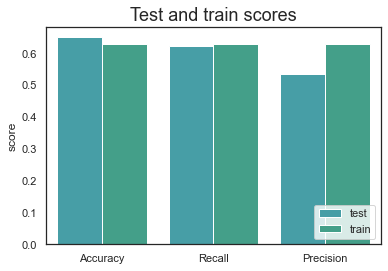

In [286]:
color1 = sns.color_palette("husl", 9)[5]
color2 = sns.color_palette("husl", 9)[4]
color_list2 = [color1, color2]


sns.barplot(data=df_test_train, x="meas", y="score", hue="set", palette=color_list2)
plt.title("Test and train scores")
plt.legend(loc="lower right")
plt.xlabel("")
# plt.savefig('./figures/scores_in_one.png', dpi=360)
plt.show();

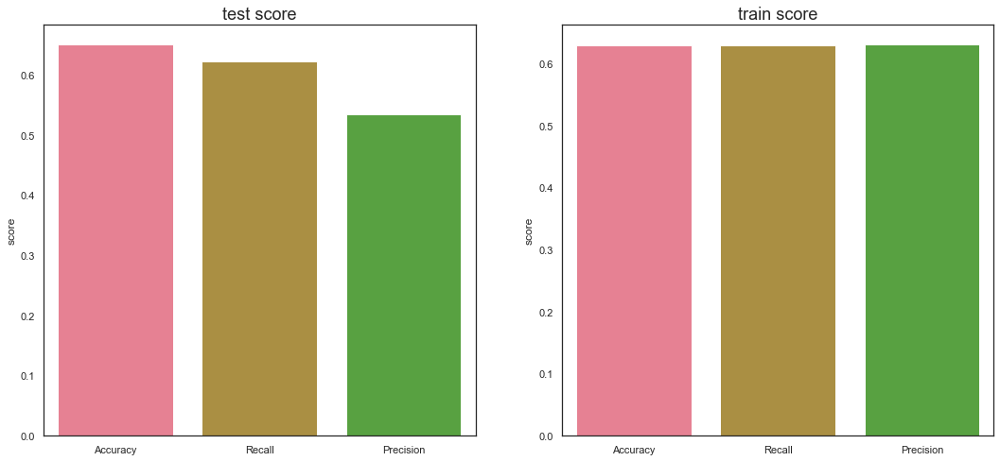

In [287]:
fig, ax = plt.subplots(1,2, figsize=(18,8))

sns.barplot(ax=ax[0],data=df_test.iloc[1:4], x="meas", y="score")
ax[0].set_title("test score")
ax[0].set_xlabel("")


sns.barplot(ax=ax[1],data=df_train.iloc[1:4], x="meas", y="score")
ax[1].set_title("train score")
ax[1].set_xlabel("")
# plt.savefig('./figures/scores.png', dpi=360)
plt.show();

# plt.savefig('./figures/target_hist.png', dpi=360)

In [288]:
overview_

,version,score,set
0,original,0.662000,test
1,environment-out,0.665558,test
2,above_ten,0.656942,test
3,above_fifteen,0.659714,test
4,above_half,0.657889,test
5,top_5,0.648833,test
0,original,0.630439,train
1,environment-out,0.629641,train
2,above_ten,0.626931,train
3,above_fifteen,0.627649,train


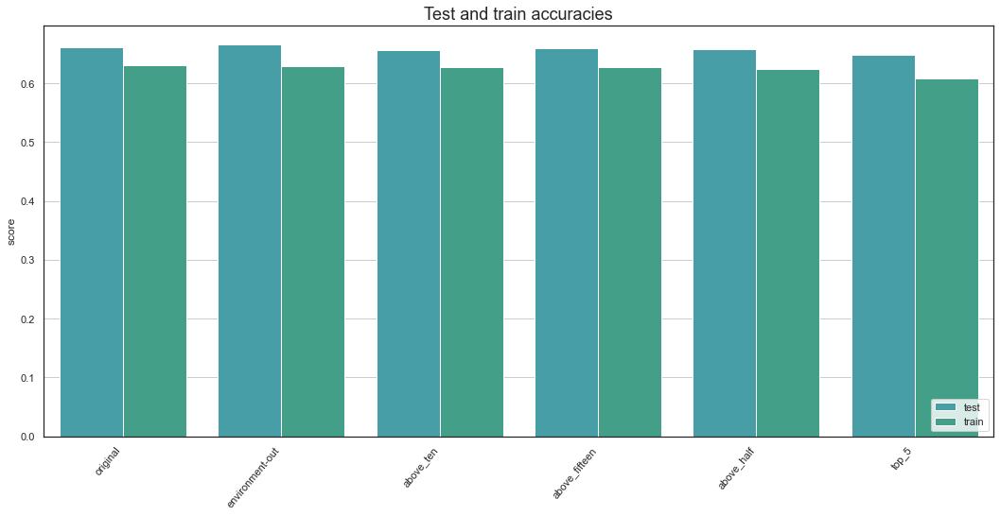

In [289]:
color1 = sns.color_palette("husl", 9)[5]
color2 = sns.color_palette("husl", 9)[4]
color_list2 = [color1, color2]

fig, ax = plt.subplots(figsize=(18,8))
sns.barplot(data=overview_, x="version", y="score", hue="set", palette=color_list2)
plt.title("Test and train accuracies")
plt.legend(loc="lower right")
plt.xticks(rotation=50, ha='right')
plt.grid(b=None, which='major', axis='y')
plt.xlabel("")
# plt.savefig('./figures/accuracies_in_one.png', dpi=360)
plt.show();

In [290]:
imp2

,indices,importance,count,shorthand,full_text,feature
0,316,0.102976,47,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
3,87,0.089391,44,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
8,336,0.077201,43,impenv,Important to care for nature and environment,impenv
4,340,0.083810,42,regunit,Regional unit,regunit
6,142,0.077662,31,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
14,88,0.072874,30,freehms,Gays and lesbians free to live life as they wish,freehms
7,320,0.077552,30,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
17,325,0.071599,21,ipudrst,Important to understand different people,ipudrst
13,89,0.073143,20,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
12,96,0.073277,20,imueclt,Country's cultural life undermined or enriched by immigrants,imueclt


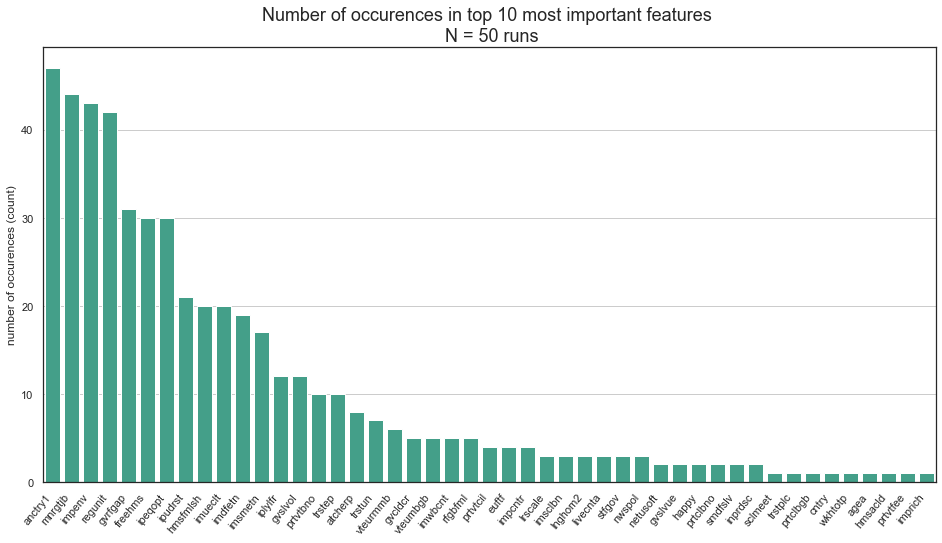

In [291]:
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", color=sns.color_palette("husl", 9)[4])
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count.png', dpi=360)
plt.show();

#very clear top5 features

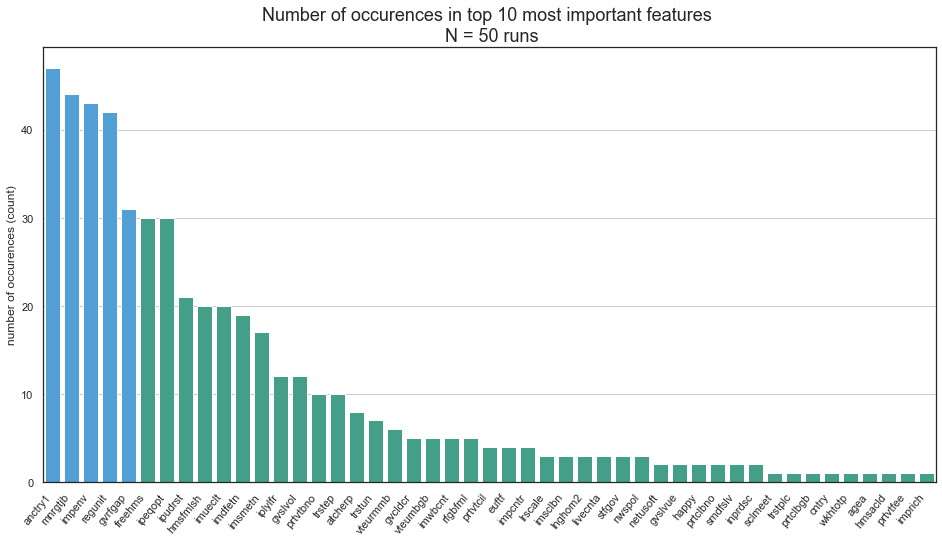

In [292]:
color1 = sns.color_palette("husl", 9)[4]
color2 = sns.color_palette("husl", 9)[6]
color_list = []

for i in range(len(imp2)):
    if i < 5:
        color_list.append(color2)
    else:
        color_list.append(color1)

color_list
        
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", palette=color_list)
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count5.png', dpi=360)
plt.show();

#very clear top5 features

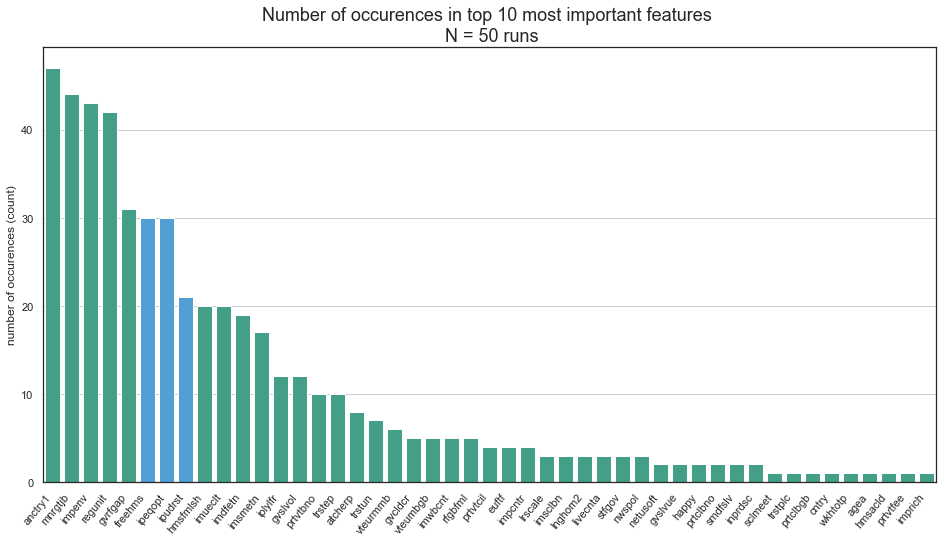

In [293]:
color_list = []

for i in range(len(imp2)):
    if i < 8 and i>4:
        color_list.append(color2)
    else:
        color_list.append(color1)

color_list
        
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", palette=color_list)
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count8.png', dpi=360)
plt.show();

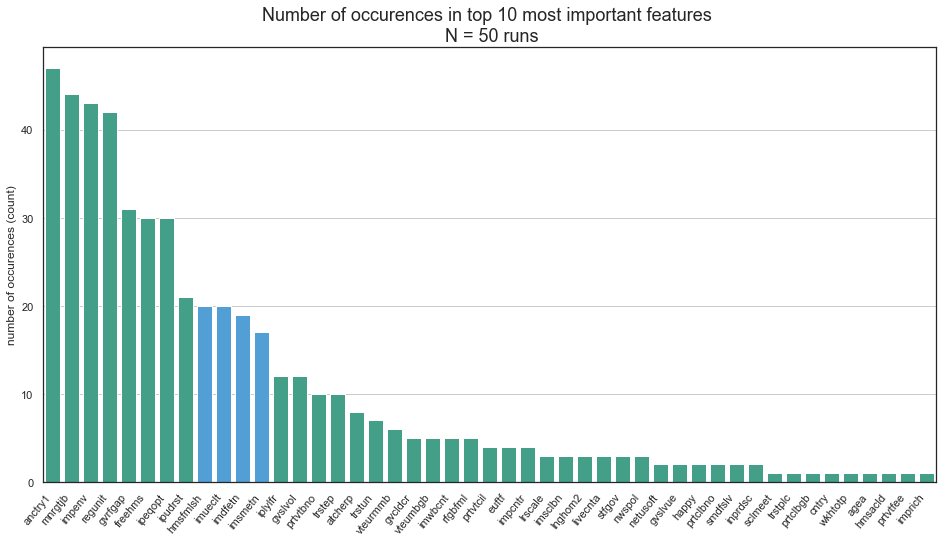

In [294]:
color_list = []

for i in range(len(imp2)):
    if i < 12 and i>7:
        color_list.append(color2)
    else:
        color_list.append(color1)

color_list
        
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", palette=color_list)
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count12.png', dpi=360)
plt.show();

# Conclusion
You can - to a certain extent - predict someones attitude towards climate change based on attitudes on other seemingly unrelated topics. eg the answer to the question whether men should have more right to a job than women when jobs are scarce and someone's opinion on whether gay/lesbians are free to live as they wish are predictive for someones view on climate change.  Where you're from (ancestry) and where you live (regunit) are important for the prediction aswell, indicating regional differences. Using only the top 5 most important features gives similarly accurate results as using more features.<br>

An interesting next step could be to see whether the current prediction gets better if you group the 'probably' and 'probably not'-sayers into one group. Leaving the other two as is (resulting in three classes). <br>

It would also be interesting to see what happens if you combine the answers of the different climate-related question into a single variable - summarizing someones attitude towards climate change with somewhat more nuance. And see how this impacts the score. The same could be done for someones views on eg homosexuality / immigrants etc. Domain knowledge about these topics would be needed to make proper aggregations.<br> 
